In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import json
import glob
import torch
import pickle
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import matthews_corrcoef, f1_score
from torch.utils.data import Dataset, DataLoader, random_split

In [3]:
# List of language abbreviations
codes = ['nl', 'en', 'de', 'fr', 'it', 'es', 'no', 'sv', 'cs', 'el', 'tr', 'ko']

# List of language names
names = ['Dutch', 'English', 'German', 'French', 'Italian', 'Spanish',
         'Norwegian', 'Swedish', 'Czech', 'Greek', 'Turkish', 'Korean']

# List of model names
models = ['FNN', 'CNN', 'LSTM']

# List of thresholds used for prediction
thresholds = range(11)
thresholds = [val/10 for val in thresholds]

# Notes on Test Sets

There are two Test datasets, an Original Size Test dataset (where the proportion of words from each language is determined by that language's size in the original dataset) and a Uniform Size Test dataset (where words from each language are sampled to a uniform size).

All words found in the Uniform Test set are also found in the Original Test set, and no words from either Test set are ever present in any Train or Val sets of either Original or Uniform size. However, for Leave One Out and Language Family models, we do use the non-target languages in the Test set (i.e. the languages the model was trained on) to fine-tune the model threshold. As a result, we cannot use these other languages to evaluate LOO or Family model performance with a given threshold.

The Test sets contain all languages, so for Leave One Out and Language Family models, we simply calculate metrics over the langauge we're interested in.

# Original Size Datasets

The percentage of words from each language (in both Train and Test datasets) is determined by that language's size in the original dataset.

In [4]:
results_original = '/content/drive/MyDrive/CompLing Projects/Voynich/Final/Results/Original'
preds_original = '/content/drive/MyDrive/CompLing Projects/Voynich/Final/Predictions/Original'

## All Language Models

These models were both trained and tested on all 12 languages. The train/val/test split is 80/10/10.

In [ ]:
#@title MCC and F1

# Saved to CSV and loaded below
'''
fnn_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_FNN_7gram_15hidden_5layers_10epochs_Original.csv'))
cnn_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_CNN_7gram_15hidden_10layers_10epochs_Original.csv'))
lstm_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_LSTM_15hidden_10layers_bidirectional_10epochs_Original.csv'))

assert (fnn_preds['Ground Truths'] == cnn_preds['Ground Truths']).all()
assert (cnn_preds['Ground Truths'] == lstm_preds['Ground Truths']).all()

fnn_mcc = []
cnn_mcc = []
lstm_mcc = []

fnn_f1 = []
cnn_f1 = []
lstm_f1 = []

fnn_f1_neg = []
cnn_f1_neg = []
lstm_f1_neg = []

fnn_f1_micro = []
cnn_f1_micro = []
lstm_f1_micro = []

fnn_f1_macro = []
cnn_f1_macro = []
lstm_f1_macro = []

truths = [truth for truth in fnn_preds['Ground Truths']]
for t in thresholds:
  fnn_pred = [int(pred) for pred in fnn_preds['Predictions'] > t]
  cnn_pred = [int(pred) for pred in cnn_preds['Predictions'] > t]
  lstm_pred = [int(pred) for pred in lstm_preds['Predictions'] > t]

  fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
  cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
  lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

  fnn_f1.append(f1_score(truths, fnn_pred))
  cnn_f1.append(f1_score(truths, cnn_pred))
  lstm_f1.append(f1_score(truths, lstm_pred))

  fnn_f1_neg.append(f1_score(truths, fnn_pred, pos_label=0))
  cnn_f1_neg.append(f1_score(truths, cnn_pred, pos_label=0))
  lstm_f1_neg.append(f1_score(truths, lstm_pred, pos_label=0))

  fnn_f1_micro.append(f1_score(truths, fnn_pred, average='micro'))
  cnn_f1_micro.append(f1_score(truths, cnn_pred, average='micro'))
  lstm_f1_micro.append(f1_score(truths, lstm_pred, average='micro'))

  fnn_f1_macro.append(f1_score(truths, fnn_pred, average='macro'))
  cnn_f1_macro.append(f1_score(truths, cnn_pred, average='macro'))
  lstm_f1_macro.append(f1_score(truths, lstm_pred, average='macro'))

mcc = fnn_mcc + cnn_mcc + lstm_mcc
f1 = fnn_f1 + cnn_f1 + lstm_f1
f1_neg = fnn_f1_neg + cnn_f1_neg + lstm_f1_neg
f1_micro = fnn_f1_micro + cnn_f1_micro + lstm_f1_micro
f1_macro = fnn_f1_macro + cnn_f1_macro + lstm_f1_macro

index = pd.MultiIndex.from_product([models, thresholds], names=['Model', 'Threshold'])
all_metrics_original = pd.DataFrame({'MCC':mcc, 'F1 Pos':f1, 'F1 Neg':f1_neg, 'F1 Micro':f1_micro, 'F1 Macro':f1_macro},
                                    index=index).sort_index()

all_metrics_original.to_csv(os.path.join(results_original, 'All_Languages_Original.csv'))
'''
all_metrics_original = pd.read_csv(os.path.join(results_original, 'All_Languages_Original.csv'),
                                   index_col=['Model','Threshold'])

all_metrics_original

MCC    F1 Pos    F1 Neg  F1 Micro  F1 Macro
Model Threshold                                                  
CNN   0.0        0.000000  0.564246  0.000000  0.392997  0.282123
      0.1        0.437920  0.677468  0.567431  0.630467  0.622450
      0.2        0.492868  0.708252  0.668138  0.689485  0.688195
      0.3        0.539213  0.736283  0.762655  0.750163  0.749469
      0.4        0.564303  0.741845  0.820517  0.788252  0.781181
      0.5        0.571553  0.715142  0.844613  0.798915  0.779877
      0.6        0.564451  0.663177  0.847356  0.789918  0.755266
      0.7        0.546265  0.610400  0.841513  0.774684  0.725957
      0.8        0.523683  0.565163  0.834274  0.760013  0.699719
      0.9        0.496657  0.521213  0.826378  0.745166  0.673795
      1.0        0.000000  0.000000  0.755448  0.607003  0.377724
FNN   0.0        0.000000  0.564246  0.000000  0.392997  0.282123
      0.1        0.235311  0.599767  0.257201  0.479817  0.428484
      0.2        0.343232  0.643931  0.567273  0.609327  0.605602
      0.3        0.437834  0.676892  0.749821  0.717995  0.713356
      0.4        0.481243  0.672659  0.805772  0.756202  0.739215
      0.5        0.506222  0.633165  0.829298  0.767014  0.731232
      0.6        0.510276  0.580076  0.831780  0.759788  0.705928
      0.7        0.497361  0.534404  0.827201  0.747947  0.680803
      0.8        0.483563  0.506369  0.823034  0.739468  0.664701
      0.9        0.470005  0.484350  0.819307  0.732390  0.651829
      1.0        0.000000  0.000000  0.755448  0.607003  0.377724
LSTM  0.0        0.000000  0.564246  0.000000  0.392997  0.282123
      0.1        0.461264  0.688692  0.598934  0.649468  0.643813
      0.2        0.518147  0.721753  0.699877  0.711229  0.710815
      0.3        0.560007  0.747149  0.780415  0.764953  0.763782
      0.4        0.583324  0.752503  0.829259  0.797925  0.790881
      0.5        0.590451  0.732145  0.849883  0.807597  0.791014
      0.6        0.582226  0.688075  0.852468  0.799681  0.770271
      0.7        0.566039  0.641150  0.847562  0.786022  0.744356
      0.8        0.543346  0.595288  0.840142  0.770812  0.717715
      0.9        0.512358  0.544368  0.830790  0.753226  0.687579
      1.0        0.000000  0.000000  0.755448  0.607003  0.377724

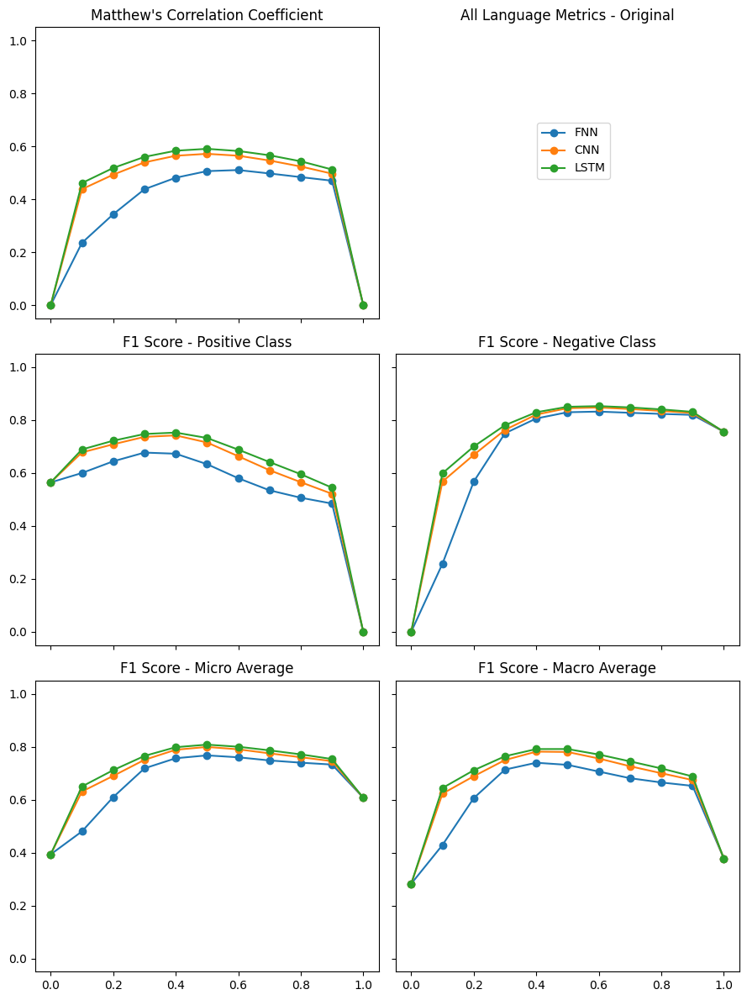

In [ ]:
#@title Plot Results

fig, axs = plt.subplots(nrows=3, ncols=2, sharex=True, sharey=True, figsize=(9,12))

axs[0,0].plot(thresholds, all_metrics_original.loc['FNN']['MCC'], label='FNN', marker='o')
axs[0,0].plot(thresholds, all_metrics_original.loc['CNN']['MCC'], label='CNN', marker='o')
axs[0,0].plot(thresholds, all_metrics_original.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs[0,0].set_title("Matthew's Correlation Coefficient")
axs[0,0].set_ylim([-0.05,1.05])

axs[0,1].set_axis_off()
axs[0,1].set_title("All Language Metrics - Original")

axs[1,0].plot(thresholds, all_metrics_original.loc['FNN']['F1 Pos'], label='FNN', marker='o')
axs[1,0].plot(thresholds, all_metrics_original.loc['CNN']['F1 Pos'], label='CNN', marker='o')
axs[1,0].plot(thresholds, all_metrics_original.loc['LSTM']['F1 Pos'], label='LSTM', marker='o')
axs[1,0].set_title("F1 Score - Positive Class")
axs[1,0].set_ylim([-0.05,1.05])

axs[1,1].plot(thresholds, all_metrics_original.loc['FNN']['F1 Neg'], label='FNN', marker='o')
axs[1,1].plot(thresholds, all_metrics_original.loc['CNN']['F1 Neg'], label='CNN', marker='o')
axs[1,1].plot(thresholds, all_metrics_original.loc['LSTM']['F1 Neg'], label='LSTM', marker='o')
axs[1,1].set_title("F1 Score - Negative Class")
axs[1,1].set_ylim([-0.05,1.05])

axs[2,0].plot(thresholds, all_metrics_original.loc['FNN']['F1 Micro'], label='FNN', marker='o')
axs[2,0].plot(thresholds, all_metrics_original.loc['CNN']['F1 Micro'], label='CNN', marker='o')
axs[2,0].plot(thresholds, all_metrics_original.loc['LSTM']['F1 Micro'], label='LSTM', marker='o')
axs[2,0].set_title("F1 Score - Micro Average")
axs[2,0].set_ylim([-0.05,1.05])

axs[2,1].plot(thresholds, all_metrics_original.loc['FNN']['F1 Macro'], label='FNN', marker='o')
axs[2,1].plot(thresholds, all_metrics_original.loc['CNN']['F1 Macro'], label='CNN', marker='o')
axs[2,1].plot(thresholds, all_metrics_original.loc['LSTM']['F1 Macro'], label='LSTM', marker='o')
axs[2,1].set_title("F1 Score - Macro Average")
axs[2,1].set_ylim([-0.05,1.05])

handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.82,0.88))
plt.tight_layout()
plt.savefig('All Languages Metrics Original.png')
plt.show()

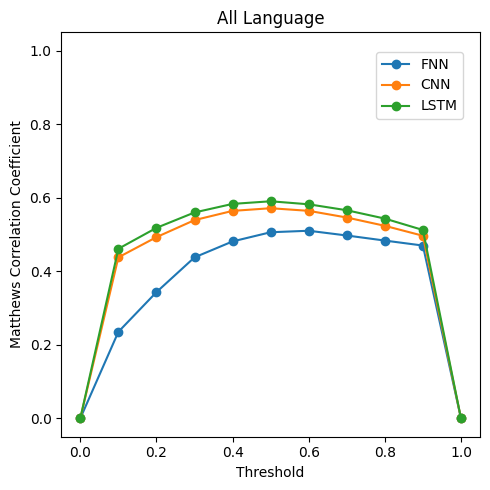

In [ ]:
#@title Plot MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, all_metrics_original.loc['FNN']['MCC'], label='FNN', marker='o')
axs.plot(thresholds, all_metrics_original.loc['CNN']['MCC'], label='CNN', marker='o')
axs.plot(thresholds, all_metrics_original.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
plt.savefig('All Language Average MCC Original.pdf')
plt.show()

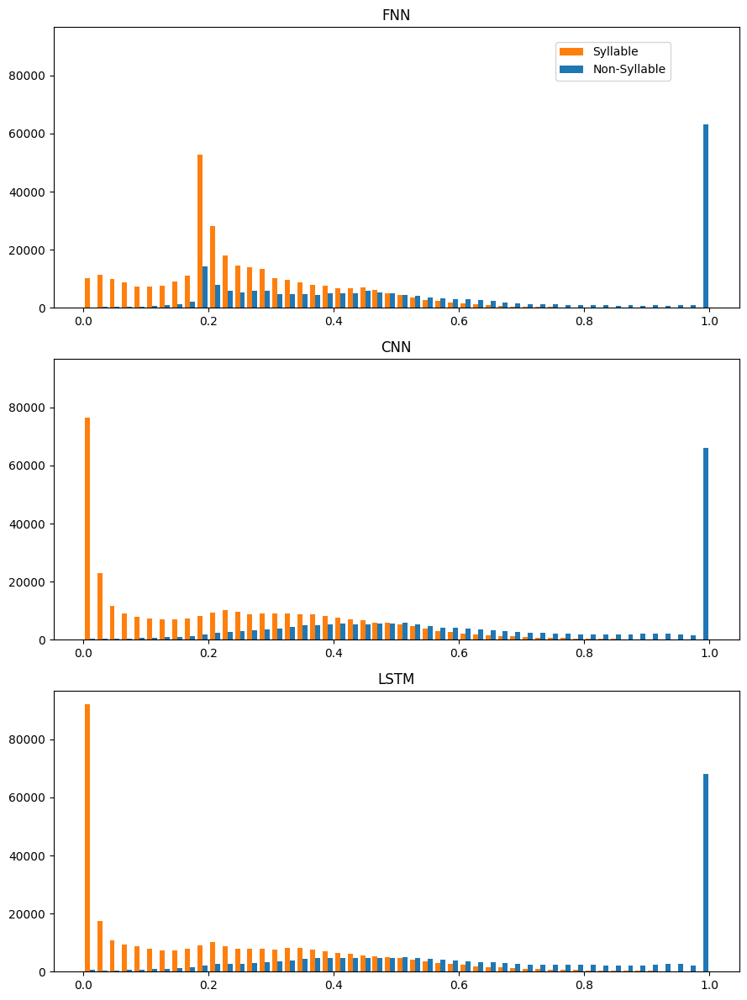

In [ ]:
#@title Histogram of Prediction Probabilities

fnn_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_FNN_7gram_15hidden_5layers_10epochs_Original.csv'))
cnn_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_CNN_7gram_15hidden_10layers_10epochs_Original.csv'))
lstm_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_LSTM_15hidden_10layers_bidirectional_10epochs_Original.csv'))

fnn_true = fnn_preds[fnn_preds['Ground Truths']==1]['Predictions']
fnn_false = fnn_preds[fnn_preds['Ground Truths']==0]['Predictions']
cnn_true = cnn_preds[cnn_preds['Ground Truths']==1]['Predictions']
cnn_false = cnn_preds[cnn_preds['Ground Truths']==0]['Predictions']
lstm_true = lstm_preds[lstm_preds['Ground Truths']==1]['Predictions']
lstm_false = lstm_preds[lstm_preds['Ground Truths']==0]['Predictions']

bins = [val/50 for val in range(51)]
colors = ['tab:orange', 'tab:blue']
fig, axs = plt.subplots(nrows=3, ncols=1, sharey=True, figsize=(9,12))
axs[0].hist([fnn_false, fnn_true], bins=bins, label=['Syllable', 'Non-Syllable'], color=colors)
axs[1].hist([cnn_false, cnn_true], bins=bins, label=['Syllable', 'Non-Syllable'], color=colors)
axs[2].hist([lstm_false, lstm_true], bins=bins, label=['Syllable', 'Non-Syllable'], color=colors)
axs[0].set_title('FNN')
axs[1].set_title('CNN')
axs[2].set_title('LSTM')
#for ax in axs:
#  ax.set_ylim([0,30000])
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles=handles, labels=labels, loc='upper right', bbox_to_anchor=(0.9,0.96))
fig.tight_layout()
plt.savefig('All Languages Histogram Original.png')
plt.show()

### Without First Segment Prediction

Because the first segment of any word is guaranteed to be a syllable break, we remove it from our calculations of MCC and other metrics in the following code blocks.

Note that this makes the split between syllable breaks and non-syllable breaks more imbalanced, from 39% syllable breaks to 31% syllable breaks.

In [ ]:
#@title MCC and F1

# Saved to CSV and loaded below
'''
fnn_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_FNN_7gram_15hidden_5layers_10epochs_Original.csv'))
cnn_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_CNN_7gram_15hidden_10layers_10epochs_Original.csv'))
lstm_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_LSTM_15hidden_10layers_bidirectional_10epochs_Original.csv'))

fnn_preds = fnn_preds[fnn_preds['Positions'] != 0]
cnn_preds = cnn_preds[cnn_preds['Positions'] != 0]
lstm_preds = lstm_preds[lstm_preds['Positions'] != 0]

assert (fnn_preds['Ground Truths'] == cnn_preds['Ground Truths']).all()
assert (cnn_preds['Ground Truths'] == lstm_preds['Ground Truths']).all()

fnn_mcc = []
cnn_mcc = []
lstm_mcc = []

fnn_f1 = []
cnn_f1 = []
lstm_f1 = []

fnn_f1_neg = []
cnn_f1_neg = []
lstm_f1_neg = []

fnn_f1_micro = []
cnn_f1_micro = []
lstm_f1_micro = []

fnn_f1_macro = []
cnn_f1_macro = []
lstm_f1_macro = []

truths = [truth for truth in fnn_preds['Ground Truths']]
for t in thresholds:
  fnn_pred = [int(pred) for pred in fnn_preds['Predictions'] > t]
  cnn_pred = [int(pred) for pred in cnn_preds['Predictions'] > t]
  lstm_pred = [int(pred) for pred in lstm_preds['Predictions'] > t]

  fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
  cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
  lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

  fnn_f1.append(f1_score(truths, fnn_pred))
  cnn_f1.append(f1_score(truths, cnn_pred))
  lstm_f1.append(f1_score(truths, lstm_pred))

  fnn_f1_neg.append(f1_score(truths, fnn_pred, pos_label=0))
  cnn_f1_neg.append(f1_score(truths, cnn_pred, pos_label=0))
  lstm_f1_neg.append(f1_score(truths, lstm_pred, pos_label=0))

  fnn_f1_micro.append(f1_score(truths, fnn_pred, average='micro'))
  cnn_f1_micro.append(f1_score(truths, cnn_pred, average='micro'))
  lstm_f1_micro.append(f1_score(truths, lstm_pred, average='micro'))

  fnn_f1_macro.append(f1_score(truths, fnn_pred, average='macro'))
  cnn_f1_macro.append(f1_score(truths, cnn_pred, average='macro'))
  lstm_f1_macro.append(f1_score(truths, lstm_pred, average='macro'))

mcc = fnn_mcc + cnn_mcc + lstm_mcc
f1 = fnn_f1 + cnn_f1 + lstm_f1
f1_neg = fnn_f1_neg + cnn_f1_neg + lstm_f1_neg
f1_micro = fnn_f1_micro + cnn_f1_micro + lstm_f1_micro
f1_macro = fnn_f1_macro + cnn_f1_macro + lstm_f1_macro

index = pd.MultiIndex.from_product([models, thresholds], names=['Model', 'Threshold'])
all_metrics_nohead = pd.DataFrame({'MCC':mcc, 'F1 Pos':f1, 'F1 Neg':f1_neg, 'F1 Micro':f1_micro, 'F1 Macro':f1_macro},
                                    index=index).sort_index()

all_metrics_nohead.to_csv(os.path.join(results_original, 'All_Languages_Original_NoHead.csv'))
'''
all_metrics_nohead = pd.read_csv(os.path.join(results_original, 'All_Languages_Original_NoHead.csv'),
                                   index_col=['Model','Threshold'])

all_metrics_nohead

MCC    F1 Pos    F1 Neg  F1 Micro  F1 Macro
Model Threshold                                                  
CNN   0.0        0.000000  0.474575  0.000000  0.311110  0.237287
      0.1        0.392995  0.593021  0.567431  0.580616  0.580226
      0.2        0.436769  0.624343  0.668138  0.647596  0.646240
      0.3        0.462908  0.647934  0.762655  0.716459  0.705295
      0.4        0.459696  0.636485  0.820517  0.759687  0.728501
      0.5        0.432889  0.570494  0.844613  0.771788  0.707553
      0.6        0.391396  0.455719  0.847356  0.761577  0.651537
      0.7        0.343104  0.338457  0.841513  0.744288  0.589985
      0.8        0.289962  0.236113  0.834274  0.727638  0.535193
      0.9        0.220116  0.134728  0.826378  0.710788  0.480553
      1.0        0.000000  0.000000  0.815790  0.688890  0.407895
FNN   0.0        0.000000  0.474575  0.000000  0.311110  0.237287
      0.1        0.205457  0.510169  0.257201  0.409643  0.383685
      0.2        0.271439  0.545437  0.567273  0.556624  0.556355
      0.3        0.320227  0.555935  0.749821  0.679952  0.652878
      0.4        0.328886  0.519182  0.805772  0.723312  0.662477
      0.5        0.309933  0.413709  0.829298  0.735583  0.621504
      0.6        0.275276  0.281452  0.831780  0.727383  0.556616
      0.7        0.226376  0.169841  0.827201  0.713945  0.498521
      0.8        0.180467  0.101773  0.823034  0.704321  0.462403
      0.9        0.126102  0.048467  0.819307  0.696288  0.433887
      1.0        0.000000  0.000000  0.815790  0.688890  0.407895
LSTM  0.0        0.000000  0.474575  0.000000  0.311110  0.237287
      0.1        0.415025  0.605373  0.598934  0.602180  0.602153
      0.2        0.459926  0.639075  0.699877  0.672272  0.669476
      0.3        0.483318  0.660263  0.780415  0.733244  0.720339
      0.4        0.482282  0.650836  0.829259  0.770664  0.740048
      0.5        0.462205  0.599640  0.849883  0.781641  0.724761
      0.6        0.424835  0.504733  0.852468  0.772657  0.678600
      0.7        0.383311  0.403218  0.847562  0.757155  0.625390
      0.8        0.333504  0.302455  0.840142  0.739894  0.571299
      0.9        0.261917  0.187904  0.830790  0.719935  0.509347
      1.0        0.000000  0.000000  0.815790  0.688890  0.407895

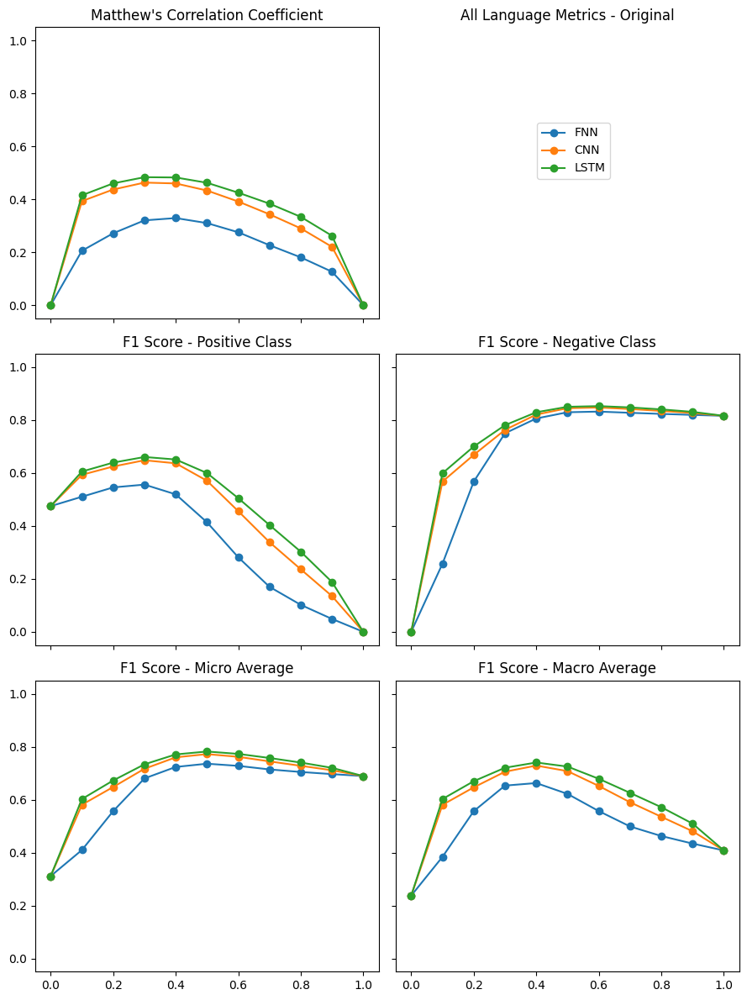

In [ ]:
#@title Plot Results

fig, axs = plt.subplots(nrows=3, ncols=2, sharex=True, sharey=True, figsize=(9,12))

axs[0,0].plot(thresholds, all_metrics_nohead.loc['FNN']['MCC'], label='FNN', marker='o')
axs[0,0].plot(thresholds, all_metrics_nohead.loc['CNN']['MCC'], label='CNN', marker='o')
axs[0,0].plot(thresholds, all_metrics_nohead.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs[0,0].set_title("Matthew's Correlation Coefficient")
axs[0,0].set_ylim([-0.05,1.05])

axs[0,1].set_axis_off()
axs[0,1].set_title("All Language Metrics - Original")

axs[1,0].plot(thresholds, all_metrics_nohead.loc['FNN']['F1 Pos'], label='FNN', marker='o')
axs[1,0].plot(thresholds, all_metrics_nohead.loc['CNN']['F1 Pos'], label='CNN', marker='o')
axs[1,0].plot(thresholds, all_metrics_nohead.loc['LSTM']['F1 Pos'], label='LSTM', marker='o')
axs[1,0].set_title("F1 Score - Positive Class")
axs[1,0].set_ylim([-0.05,1.05])

axs[1,1].plot(thresholds, all_metrics_nohead.loc['FNN']['F1 Neg'], label='FNN', marker='o')
axs[1,1].plot(thresholds, all_metrics_nohead.loc['CNN']['F1 Neg'], label='CNN', marker='o')
axs[1,1].plot(thresholds, all_metrics_nohead.loc['LSTM']['F1 Neg'], label='LSTM', marker='o')
axs[1,1].set_title("F1 Score - Negative Class")
axs[1,1].set_ylim([-0.05,1.05])

axs[2,0].plot(thresholds, all_metrics_nohead.loc['FNN']['F1 Micro'], label='FNN', marker='o')
axs[2,0].plot(thresholds, all_metrics_nohead.loc['CNN']['F1 Micro'], label='CNN', marker='o')
axs[2,0].plot(thresholds, all_metrics_nohead.loc['LSTM']['F1 Micro'], label='LSTM', marker='o')
axs[2,0].set_title("F1 Score - Micro Average")
axs[2,0].set_ylim([-0.05,1.05])

axs[2,1].plot(thresholds, all_metrics_nohead.loc['FNN']['F1 Macro'], label='FNN', marker='o')
axs[2,1].plot(thresholds, all_metrics_nohead.loc['CNN']['F1 Macro'], label='CNN', marker='o')
axs[2,1].plot(thresholds, all_metrics_nohead.loc['LSTM']['F1 Macro'], label='LSTM', marker='o')
axs[2,1].set_title("F1 Score - Macro Average")
axs[2,1].set_ylim([-0.05,1.05])

handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.82,0.88))
plt.tight_layout()
plt.savefig('All Languages Metrics Original NoHead.png')
plt.show()

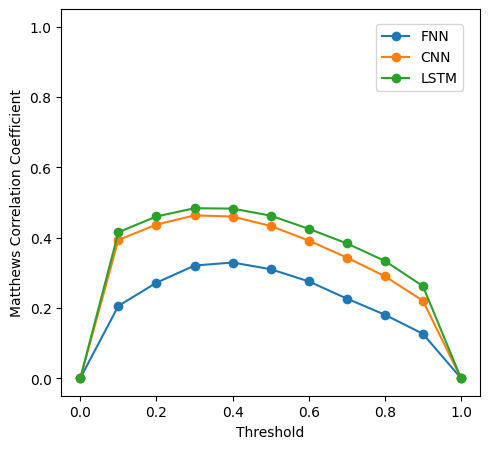

In [ ]:
#@title Plot MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, all_metrics_nohead.loc['FNN']['MCC'], label='FNN', marker='o')
axs.plot(thresholds, all_metrics_nohead.loc['CNN']['MCC'], label='CNN', marker='o')
axs.plot(thresholds, all_metrics_nohead.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
plt.savefig('All Language Average MCC NoHead.pdf')
plt.show()

In [ ]:
#@title Plot MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,4.6))

axs.plot(thresholds, all_metrics_nohead.loc['FNN']['MCC'], label='FNN', marker='o')
axs.plot(thresholds, all_metrics_nohead.loc['CNN']['MCC'], label='CNN', marker='o')
axs.plot(thresholds, all_metrics_nohead.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
#axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.95))
plt.tight_layout()
plt.savefig('All Language Average MCC NoHead.pdf')
plt.show()

In [5]:
#@title Calculate MCC on Val Dataset

# Saved to CSV and loaded below.
'''
fine_thresholds = range(101)
fine_thresholds = [val/100 for val in fine_thresholds]

fnn_mcc = []
cnn_mcc = []
lstm_mcc = []

fnn_df = pd.read_csv(os.path.join(preds_original, 'VAL_All_Langs_FNN_7gram_15hidden_5layers_10epochs_Original.csv'))
cnn_df = pd.read_csv(os.path.join(preds_original, 'VAL_All_Langs_CNN_7gram_15hidden_10layers_10epochs_Original.csv'))
lstm_df = pd.read_csv(os.path.join(preds_original, 'VAL_All_Langs_LSTM_15hidden_10layers_bidirectional_10epochs_Original.csv'))

fnn_df = fnn_df[fnn_df['Positions'] != 0]
cnn_df = cnn_df[cnn_df['Positions'] != 0]
lstm_df = lstm_df[lstm_df['Positions'] != 0]

assert (fnn_df['Ground Truths'] == cnn_df['Ground Truths']).all()
assert (cnn_df['Ground Truths'] == lstm_df['Ground Truths']).all()

truths = [truth for truth in fnn_df['Ground Truths']]

for t in fine_thresholds:
  fnn_pred = [int(pred) for pred in fnn_df['Predictions'] > t]
  cnn_pred = [int(pred) for pred in cnn_df['Predictions'] > t]
  lstm_pred = [int(pred) for pred in lstm_df['Predictions'] > t]

  fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
  cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
  lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

mcc = fnn_mcc + cnn_mcc + lstm_mcc

index = pd.MultiIndex.from_product([models, fine_thresholds], names=['Model', 'Threshold'])
all_mcc_nohead = pd.DataFrame({'MCC':mcc}, index=index).sort_index()

all_mcc_nohead.to_csv(os.path.join(results_original, 'All_MCC_Original_ValDataset_NoHead.csv'))
'''
all_mcc_nohead = pd.read_csv(os.path.join(results_original, 'All_MCC_Original_ValDataset_NoHead.csv'),
                                   index_col=['Model','Threshold'])

all_mcc_nohead

MCC
Model Threshold          
CNN   0.00       0.000000
      0.01       0.224806
      0.02       0.293480
      0.03       0.324342
      0.04       0.341848
...                   ...
LSTM  0.96       0.185699
      0.97       0.171020
      0.98       0.157547
      0.99       0.139749
      1.00       0.000000

[303 rows x 1 columns]

In [7]:
#@title Save Best LOO Thresholds on Known Languages

# Saved to CSV and loaded below.
'''
all_mcc_nohead = pd.read_csv(os.path.join(results_original, 'All_MCC_Original_ValDataset_NoHead.csv'),
                                   index_col=['Model','Threshold'])
all_thresholds_nohead = dict()
for model in models:
  all_thresholds_nohead[model] = all_mcc_nohead.loc[model].idxmax()['MCC']

with open(os.path.join(results_original, 'All_Thresholds_NoHead'), 'w') as f:
    f.write(json.dumps(all_thresholds_nohead))
'''
with open(os.path.join(results_original, 'All_Thresholds_NoHead')) as f:
  all_thresholds_nohead = json.loads(f.read())

In [9]:
all_thresholds_nohead

{'FNN': 0.36, 'CNN': 0.32, 'LSTM': 0.36}

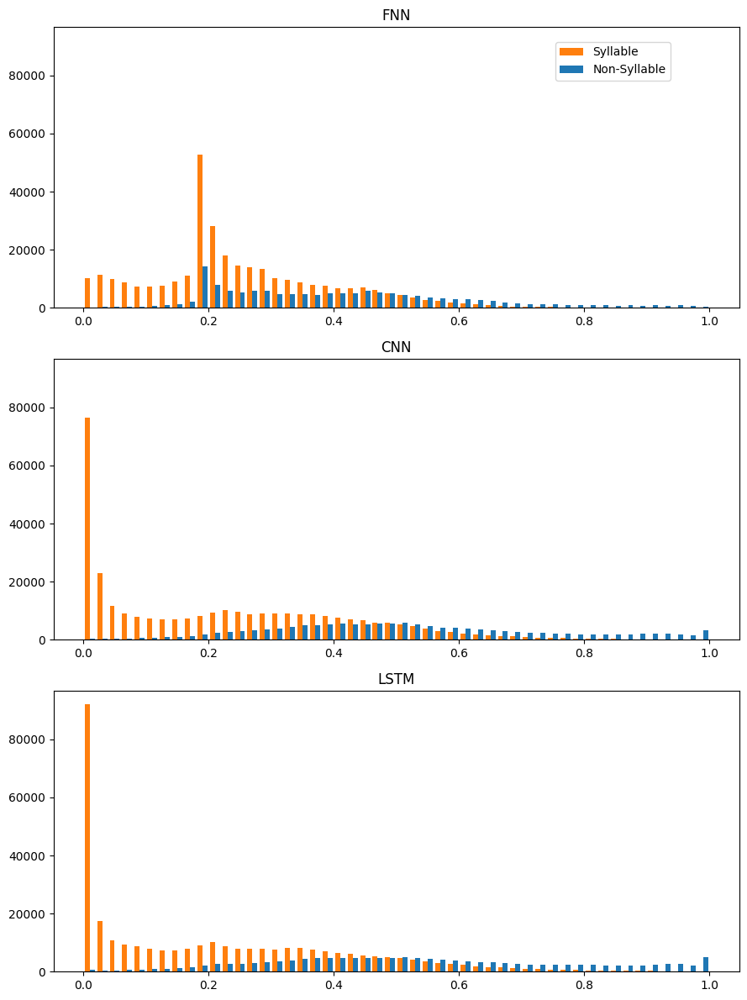

In [ ]:
#@title Histogram of Prediction Probabilities

fnn_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_FNN_7gram_15hidden_5layers_10epochs_Original.csv'))
cnn_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_CNN_7gram_15hidden_10layers_10epochs_Original.csv'))
lstm_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_LSTM_15hidden_10layers_bidirectional_10epochs_Original.csv'))

fnn_preds = fnn_preds[fnn_preds['Positions'] != 0]
cnn_preds = cnn_preds[cnn_preds['Positions'] != 0]
lstm_preds = lstm_preds[lstm_preds['Positions'] != 0]

fnn_true = fnn_preds[fnn_preds['Ground Truths']==1]['Predictions']
fnn_false = fnn_preds[fnn_preds['Ground Truths']==0]['Predictions']
cnn_true = cnn_preds[cnn_preds['Ground Truths']==1]['Predictions']
cnn_false = cnn_preds[cnn_preds['Ground Truths']==0]['Predictions']
lstm_true = lstm_preds[lstm_preds['Ground Truths']==1]['Predictions']
lstm_false = lstm_preds[lstm_preds['Ground Truths']==0]['Predictions']

bins = [val/50 for val in range(51)]
colors = ['tab:orange', 'tab:blue']
fig, axs = plt.subplots(nrows=3, ncols=1, sharey=True, figsize=(9,12))
axs[0].hist([fnn_false, fnn_true], bins=bins, label=['Syllable', 'Non-Syllable'], color=colors)
axs[1].hist([cnn_false, cnn_true], bins=bins, label=['Syllable', 'Non-Syllable'], color=colors)
axs[2].hist([lstm_false, lstm_true], bins=bins, label=['Syllable', 'Non-Syllable'], color=colors)
axs[0].set_title('FNN')
axs[1].set_title('CNN')
axs[2].set_title('LSTM')
#for ax in axs:
#  ax.set_ylim([0,30000])
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles=handles, labels=labels, loc='upper right', bbox_to_anchor=(0.9,0.96))
fig.tight_layout()
plt.savefig('All Languages Histogram Original NoHead.png')
plt.show()

## All Language Models (Individual Language Results)

These are the same models as shown above, but showing their per-language results.

In [ ]:
#@title MCC and F1

# Saved to CSV and loaded below.
'''
fnn_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_FNN_7gram_15hidden_5layers_10epochs_Original.csv'))
cnn_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_CNN_7gram_15hidden_10layers_10epochs_Original.csv'))
lstm_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_LSTM_15hidden_10layers_bidirectional_10epochs_Original.csv'))

assert (fnn_preds['Ground Truths'] == cnn_preds['Ground Truths']).all()
assert (cnn_preds['Ground Truths'] == lstm_preds['Ground Truths']).all()

fnn_mcc = []
cnn_mcc = []
lstm_mcc = []

fnn_f1 = []
cnn_f1 = []
lstm_f1 = []

fnn_f1_neg = []
cnn_f1_neg = []
lstm_f1_neg = []

fnn_f1_micro = []
cnn_f1_micro = []
lstm_f1_micro = []

fnn_f1_macro = []
cnn_f1_macro = []
lstm_f1_macro = []

for i, lang in enumerate(codes):

  fnn_df = fnn_preds[fnn_preds['Languages'] == lang]
  cnn_df = cnn_preds[cnn_preds['Languages'] == lang]
  lstm_df = lstm_preds[lstm_preds['Languages'] == lang]

  truths = [truth for truth in fnn_df['Ground Truths']]

  for t in thresholds:
    fnn_pred = [int(pred) for pred in fnn_df['Predictions'] > t]
    cnn_pred = [int(pred) for pred in cnn_df['Predictions'] > t]
    lstm_pred = [int(pred) for pred in lstm_df['Predictions'] > t]

    fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
    cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
    lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

    fnn_f1.append(f1_score(truths, fnn_pred))
    cnn_f1.append(f1_score(truths, cnn_pred))
    lstm_f1.append(f1_score(truths, lstm_pred))

    fnn_f1_neg.append(f1_score(truths, fnn_pred, pos_label=0))
    cnn_f1_neg.append(f1_score(truths, cnn_pred, pos_label=0))
    lstm_f1_neg.append(f1_score(truths, lstm_pred, pos_label=0))

    fnn_f1_micro.append(f1_score(truths, fnn_pred, average='micro'))
    cnn_f1_micro.append(f1_score(truths, cnn_pred, average='micro'))
    lstm_f1_micro.append(f1_score(truths, lstm_pred, average='micro'))

    fnn_f1_macro.append(f1_score(truths, fnn_pred, average='macro'))
    cnn_f1_macro.append(f1_score(truths, cnn_pred, average='macro'))
    lstm_f1_macro.append(f1_score(truths, lstm_pred, average='macro'))

mcc = fnn_mcc + cnn_mcc + lstm_mcc
f1 = fnn_f1 + cnn_f1 + lstm_f1
f1_neg = fnn_f1_neg + cnn_f1_neg + lstm_f1_neg
f1_micro = fnn_f1_micro + cnn_f1_micro + lstm_f1_micro
f1_macro = fnn_f1_macro + cnn_f1_macro + lstm_f1_macro

index = pd.MultiIndex.from_product([models, names, thresholds], names=['Model', 'Language', 'Threshold'])
lang_metrics_original = pd.DataFrame({'MCC':mcc, 'F1 Pos':f1, 'F1 Neg':f1_neg, 'F1 Micro':f1_micro, 'F1 Macro':f1_macro},
                                      index=index).sort_index()

lang_metrics_original.to_csv(os.path.join(results_original, 'Individual_Language_Original.csv'))
'''
lang_metrics_original = pd.read_csv(os.path.join(results_original, 'Individual_Language_Original.csv'),
                                    index_col=['Model','Language','Threshold'])

lang_metrics_original

MCC    F1 Pos    F1 Neg  F1 Micro  F1 Macro
Model Language Threshold                                                  
CNN   Czech    0.0        0.000000  0.569627  0.000000  0.398237  0.284813
               0.1        0.405657  0.665447  0.508467  0.601872  0.586957
               0.2        0.432656  0.681207  0.580255  0.637630  0.630731
               0.3        0.451683  0.695255  0.667274  0.681879  0.681265
               0.4        0.453144  0.686657  0.758137  0.726998  0.722397
...                            ...       ...       ...       ...       ...
LSTM  Turkish  0.6        0.592690  0.707083  0.847500  0.799425  0.777291
               0.7        0.549770  0.620074  0.833210  0.768187  0.726642
               0.8        0.530641  0.576774  0.826207  0.753596  0.701490
               0.9        0.523305  0.563416  0.823742  0.748870  0.693579
               1.0        0.000000  0.000000  0.739868  0.587135  0.369934

[396 rows x 5 columns]

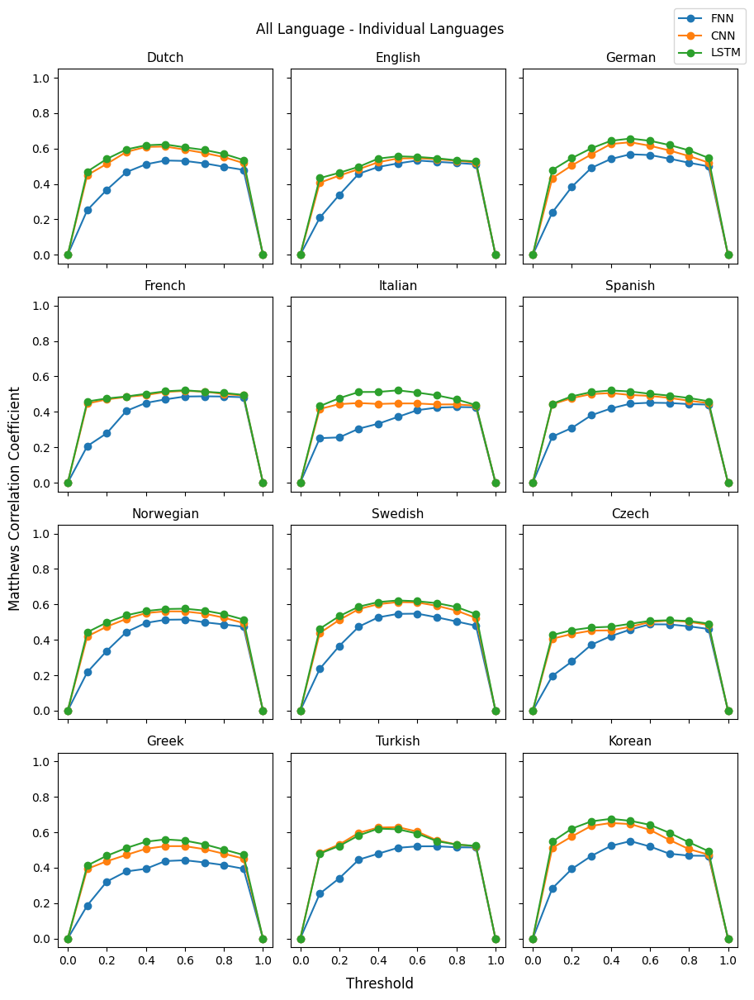

In [ ]:
#@title Plot MCC

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_original.loc[('FNN', names[k]), 'MCC'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_original.loc[('CNN', names[k]), 'MCC'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_original.loc[('LSTM',names[k]), 'MCC'], label='LSTM', marker='o')
    axs[i,j].set_title(names[k],fontsize=11)
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("All Language - Individual Languages")
fig.text(0.5, 0.01, 'Threshold', ha='center', va='center', fontsize=12)
fig.text(0.01, 0.5, 'Matthews Correlation Coefficient', ha='center', va='center', rotation='vertical', fontsize=12)
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1, 1))
plt.tight_layout(rect=(0.015,0.015,1,0.99))
plt.savefig('Individual Language MCC Original.pdf')
plt.show()

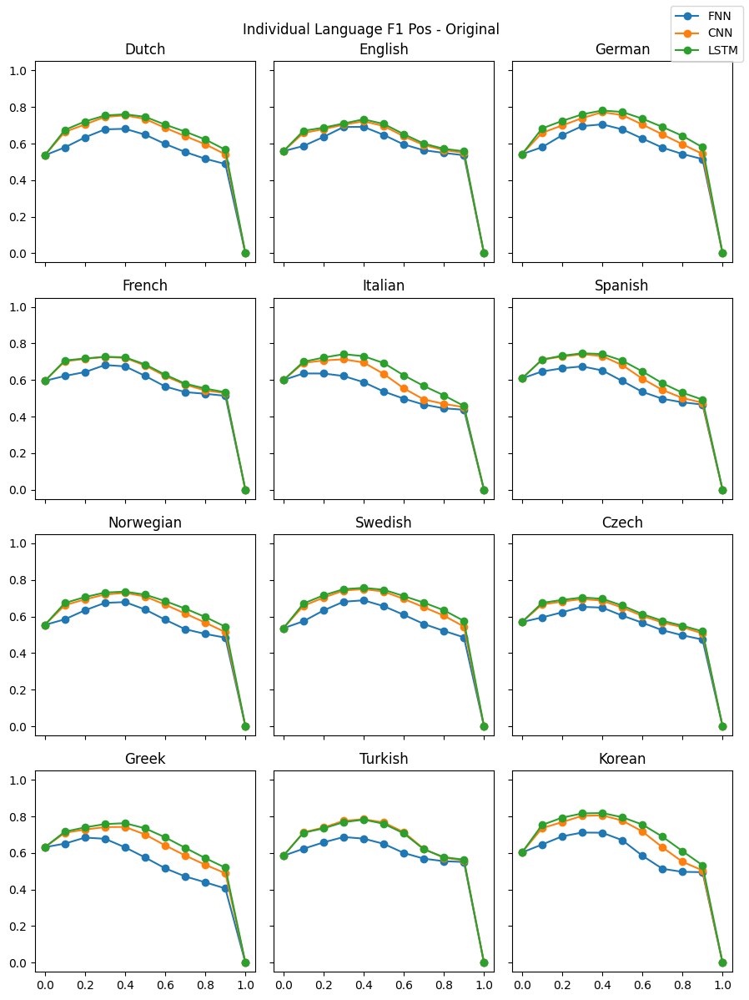

In [ ]:
#@title Plot F1 Pos

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_original.loc[('FNN', names[k]), 'F1 Pos'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_original.loc[('CNN', names[k]), 'F1 Pos'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_original.loc[('LSTM',names[k]), 'F1 Pos'], label='LSTM', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Individual Language F1 Pos - Original")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('All F1 Pos Original.png')
plt.show()

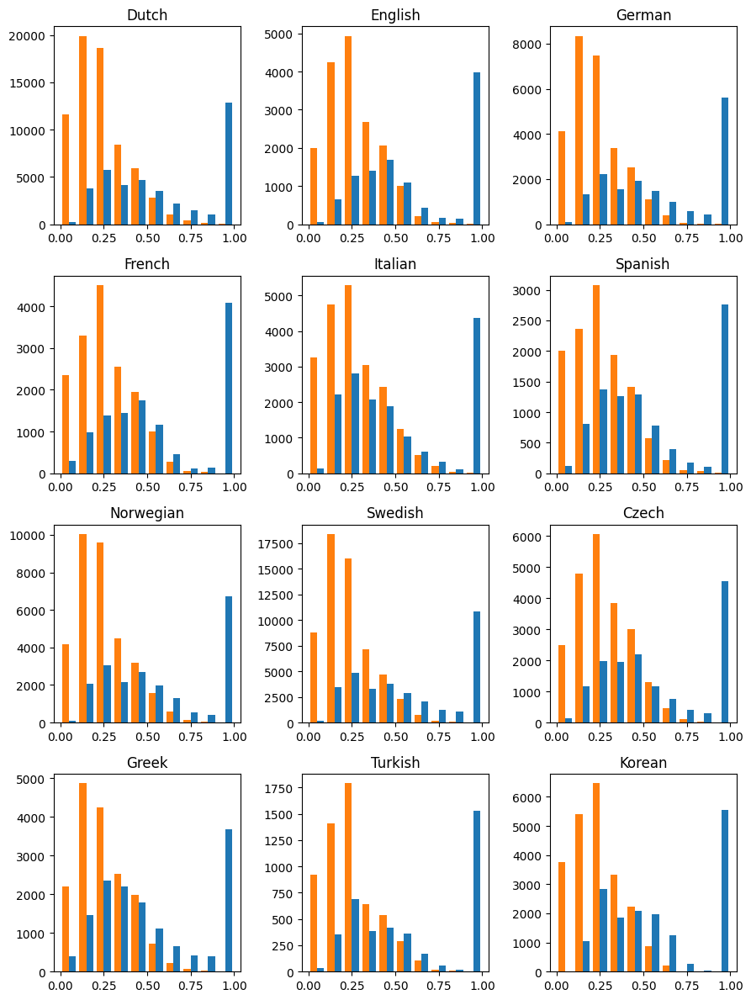

In [ ]:
#@title Histogram of FNN Probabilities

fnn_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_FNN_7gram_15hidden_5layers_10epochs_Original.csv'))

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(9,12))
bins = [val/10 for val in range(11)]
colors = ['tab:orange', 'tab:blue']

for i, lang in enumerate(codes):
  fnn_lang = fnn_preds[fnn_preds['Languages']==lang]

  fnn_true = fnn_lang[fnn_lang['Ground Truths']==1]['Predictions']
  fnn_false = fnn_lang[fnn_lang['Ground Truths']==0]['Predictions']

  j = i // 3
  k = i % 3

  axs[j,k].hist([fnn_false, fnn_true], bins=bins, label=['Syllable', 'Non-Syllable'], color=colors)
  axs[j,k].set_title(names[i])

handles, labels = axs[0,0].get_legend_handles_labels()
#fig.legend(handles, labels, loc='upper right')
fig.tight_layout()
plt.savefig('FNN Individual Languages Histogram Original.png')
plt.show()

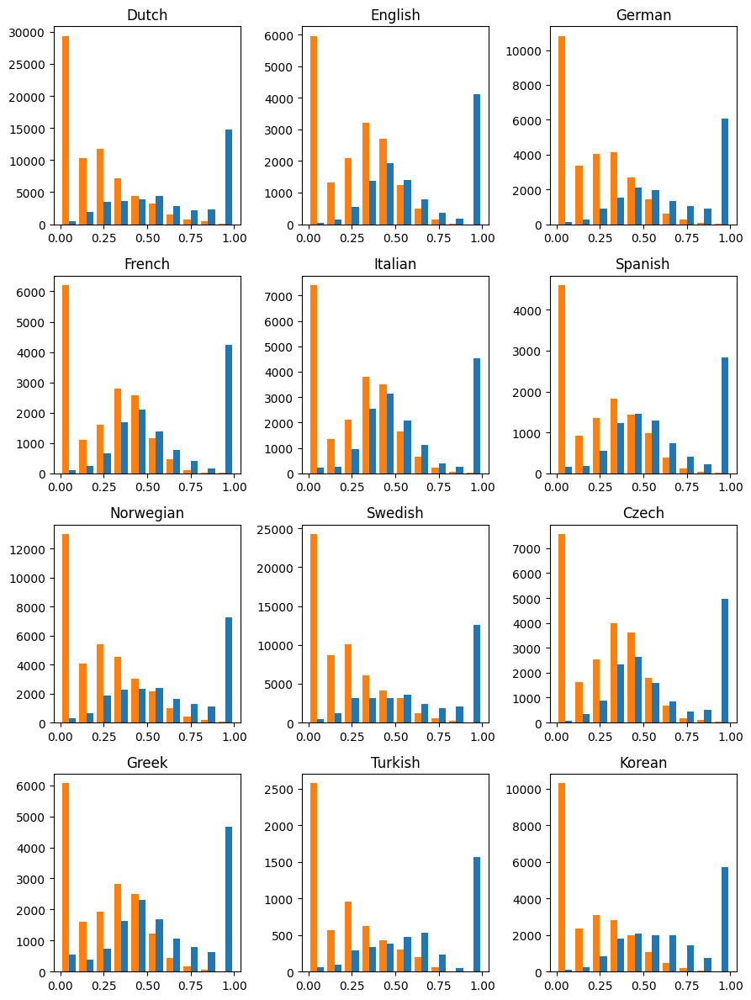

In [ ]:
#@title Histogram of CNN Probabilities

cnn_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_CNN_7gram_15hidden_10layers_10epochs_Original.csv'))

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(9,12))
bins = [val/10 for val in range(11)]
colors = ['tab:orange', 'tab:blue']

for i, lang in enumerate(codes):
  cnn_lang = cnn_preds[cnn_preds['Languages']==lang]

  cnn_true = cnn_lang[cnn_lang['Ground Truths']==1]['Predictions']
  cnn_false = cnn_lang[cnn_lang['Ground Truths']==0]['Predictions']

  j = i // 3
  k = i % 3

  axs[j,k].hist([cnn_false, cnn_true], bins=bins, label=['Syllable', 'Non-Syllable'], color=colors)
  axs[j,k].set_title(names[i])

handles, labels = axs[0,0].get_legend_handles_labels()
#fig.legend(handles, labels, loc='upper right')
fig.tight_layout()
plt.savefig('CNN Individual Languages Histogram Original.png')
plt.show()

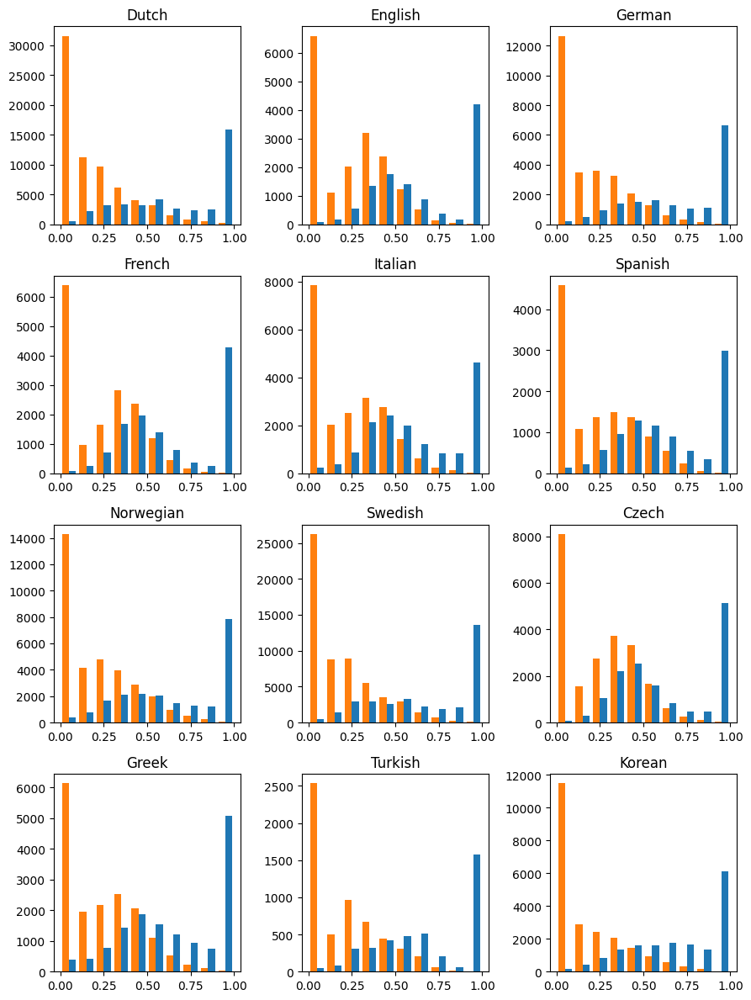

In [ ]:
#@title Histogram of LSTM Probabilities

lstm_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_LSTM_15hidden_10layers_bidirectional_10epochs_Original.csv'))

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(9,12))
bins = [val/10 for val in range(11)]
colors = ['tab:orange', 'tab:blue']

for i, lang in enumerate(codes):
  lstm_lang = lstm_preds[lstm_preds['Languages']==lang]

  lstm_true = lstm_lang[lstm_lang['Ground Truths']==1]['Predictions']
  lstm_false = lstm_lang[lstm_lang['Ground Truths']==0]['Predictions']

  j = i // 3
  k = i % 3

  axs[j,k].hist([lstm_false, lstm_true], bins=bins, label=['Syllable', 'Non-Syllable'], color=colors)
  axs[j,k].set_title(names[i])

handles, labels = axs[0,0].get_legend_handles_labels()
#fig.legend(handles, labels, loc='upper right')
fig.tight_layout()
plt.savefig('LSTM Individual Languages Histogram Original.png')
plt.show()

### Without First Segment Prediction

In [ ]:
#@title MCC and F1

# Saved to CSV and loaded below.
'''
fnn_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_FNN_7gram_15hidden_5layers_10epochs_Original.csv'))
cnn_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_CNN_7gram_15hidden_10layers_10epochs_Original.csv'))
lstm_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_LSTM_15hidden_10layers_bidirectional_10epochs_Original.csv'))

fnn_preds = fnn_preds[fnn_preds['Positions'] != 0]
cnn_preds = cnn_preds[cnn_preds['Positions'] != 0]
lstm_preds = lstm_preds[lstm_preds['Positions'] != 0]

assert (fnn_preds['Ground Truths'] == cnn_preds['Ground Truths']).all()
assert (cnn_preds['Ground Truths'] == lstm_preds['Ground Truths']).all()

fnn_mcc = []
cnn_mcc = []
lstm_mcc = []

fnn_f1 = []
cnn_f1 = []
lstm_f1 = []

fnn_f1_neg = []
cnn_f1_neg = []
lstm_f1_neg = []

fnn_f1_micro = []
cnn_f1_micro = []
lstm_f1_micro = []

fnn_f1_macro = []
cnn_f1_macro = []
lstm_f1_macro = []

for i, lang in enumerate(codes):

  fnn_df = fnn_preds[fnn_preds['Languages'] == lang]
  cnn_df = cnn_preds[cnn_preds['Languages'] == lang]
  lstm_df = lstm_preds[lstm_preds['Languages'] == lang]

  truths = [truth for truth in fnn_df['Ground Truths']]

  for t in thresholds:
    fnn_pred = [int(pred) for pred in fnn_df['Predictions'] > t]
    cnn_pred = [int(pred) for pred in cnn_df['Predictions'] > t]
    lstm_pred = [int(pred) for pred in lstm_df['Predictions'] > t]

    fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
    cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
    lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

    fnn_f1.append(f1_score(truths, fnn_pred))
    cnn_f1.append(f1_score(truths, cnn_pred))
    lstm_f1.append(f1_score(truths, lstm_pred))

    fnn_f1_neg.append(f1_score(truths, fnn_pred, pos_label=0))
    cnn_f1_neg.append(f1_score(truths, cnn_pred, pos_label=0))
    lstm_f1_neg.append(f1_score(truths, lstm_pred, pos_label=0))

    fnn_f1_micro.append(f1_score(truths, fnn_pred, average='micro'))
    cnn_f1_micro.append(f1_score(truths, cnn_pred, average='micro'))
    lstm_f1_micro.append(f1_score(truths, lstm_pred, average='micro'))

    fnn_f1_macro.append(f1_score(truths, fnn_pred, average='macro'))
    cnn_f1_macro.append(f1_score(truths, cnn_pred, average='macro'))
    lstm_f1_macro.append(f1_score(truths, lstm_pred, average='macro'))

mcc = fnn_mcc + cnn_mcc + lstm_mcc
f1 = fnn_f1 + cnn_f1 + lstm_f1
f1_neg = fnn_f1_neg + cnn_f1_neg + lstm_f1_neg
f1_micro = fnn_f1_micro + cnn_f1_micro + lstm_f1_micro
f1_macro = fnn_f1_macro + cnn_f1_macro + lstm_f1_macro

index = pd.MultiIndex.from_product([models, names, thresholds], names=['Model', 'Language', 'Threshold'])
lang_metrics_nohead = pd.DataFrame({'MCC':mcc, 'F1 Pos':f1, 'F1 Neg':f1_neg, 'F1 Micro':f1_micro, 'F1 Macro':f1_macro},
                                      index=index).sort_index()

lang_metrics_nohead.to_csv(os.path.join(results_original, 'Individual_Language_Original_NoHead.csv'))
'''
lang_metrics_nohead = pd.read_csv(os.path.join(results_original, 'Individual_Language_Original_NoHead.csv'),
                                    index_col=['Model','Language','Threshold'])

lang_metrics_nohead

MCC    F1 Pos    F1 Neg  F1 Micro  F1 Macro
Model Language Threshold                                                  
CNN   Czech    0.0        0.000000  0.478553  0.000000  0.314538  0.239277
               0.1        0.364525  0.579065  0.508467  0.546497  0.543766
               0.2        0.381861  0.593975  0.580255  0.587229  0.587115
               0.3        0.380530  0.602192  0.667274  0.637632  0.634733
               0.4        0.333769  0.564621  0.758137  0.689027  0.661379
...                            ...       ...       ...       ...       ...
LSTM  Turkish  0.6        0.378152  0.459579  0.847500  0.762125  0.653540
               0.7        0.242143  0.218295  0.833210  0.725079  0.525753
               0.8        0.155365  0.082632  0.826207  0.707775  0.454419
               0.9        0.113410  0.040063  0.823742  0.702169  0.431902
               1.0        0.000000  0.000000  0.820977  0.696320  0.410489

[396 rows x 5 columns]

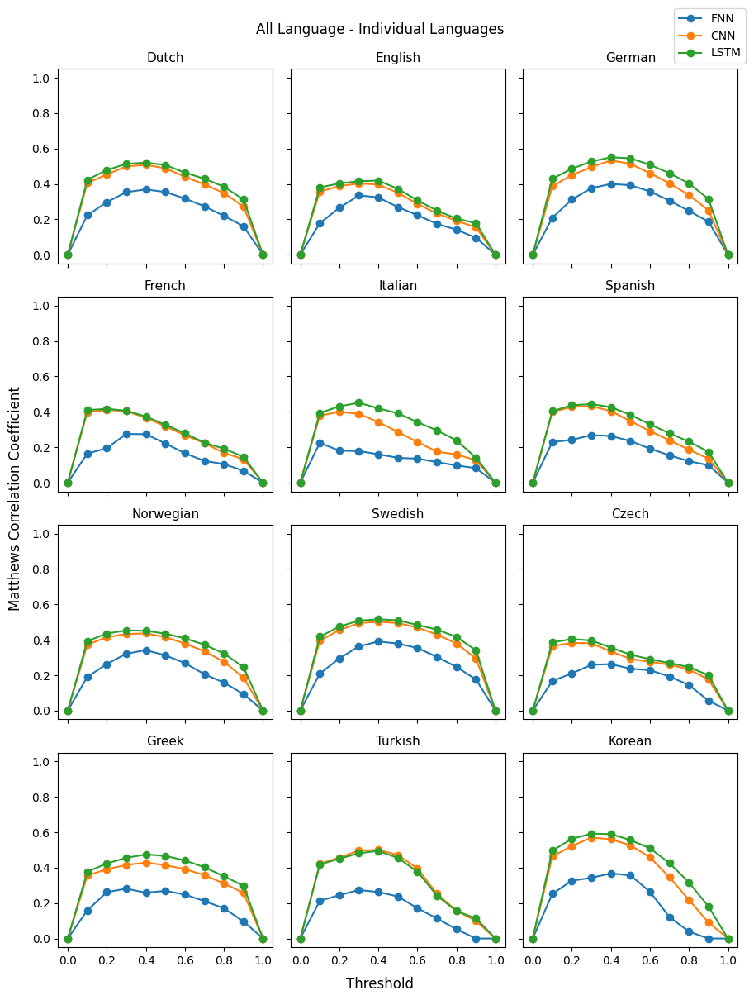

In [ ]:
#@title Plot MCC

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_nohead.loc[('FNN', names[k]), 'MCC'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_nohead.loc[('CNN', names[k]), 'MCC'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_nohead.loc[('LSTM',names[k]), 'MCC'], label='LSTM', marker='o')
    axs[i,j].set_title(names[k],fontsize=11)
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("All Language - Individual Languages")
fig.text(0.5, 0.01, 'Threshold', ha='center', va='center', fontsize=12)
fig.text(0.01, 0.5, 'Matthews Correlation Coefficient', ha='center', va='center', rotation='vertical', fontsize=12)
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1, 1))
plt.tight_layout(rect=(0.015,0.015,1,0.99))
plt.savefig('All MCC NoHead.pdf')
plt.show()

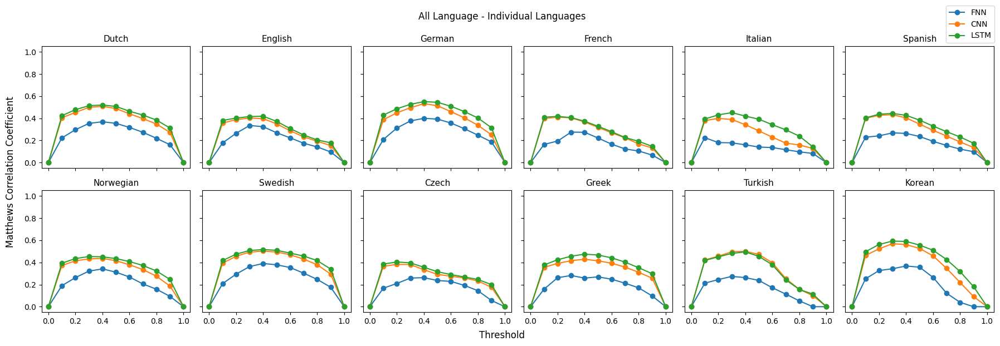

In [ ]:
#@title Plot MCC 2 x 6

fig, axs = plt.subplots(nrows=2, ncols=6, sharex=True, sharey=True, figsize=(18,6))

for i in range(2):
  for j in range(6):
    k = i * 6 + j

    axs[i,j].plot(thresholds, lang_metrics_nohead.loc[('FNN', names[k]), 'MCC'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_nohead.loc[('CNN', names[k]), 'MCC'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_nohead.loc[('LSTM',names[k]), 'MCC'], label='LSTM', marker='o')
    axs[i,j].set_title(names[k],fontsize=11)
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("All Language - Individual Languages")
fig.text(0.5, 0.01, 'Threshold', ha='center', va='center', fontsize=12)
fig.text(0.01, 0.5, 'Matthews Correlation Coefficient', ha='center', va='center', rotation='vertical', fontsize=12)
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.995, 1.01))
plt.tight_layout(rect=(0.015,0.015,1,0.99))
plt.savefig('All MCC NoHead 2x6.pdf')
plt.show()

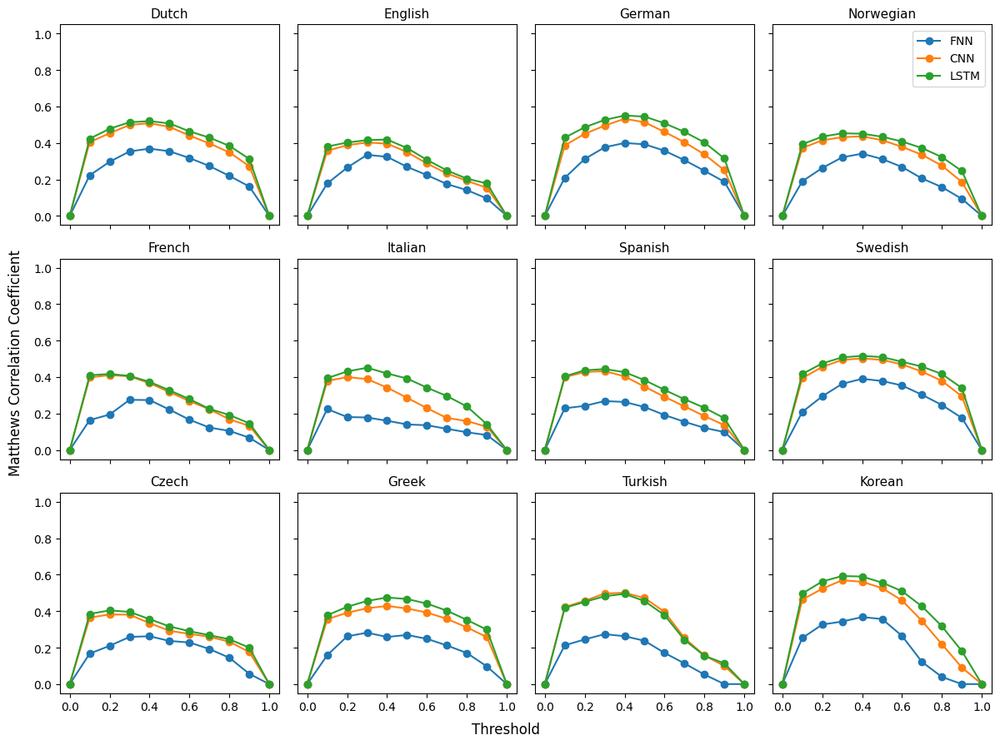

In [ ]:
#@title Plot MCC 3 x 4

# List of language new_names
new_names = ['Dutch', 'English', 'German', 'Norwegian',
             'French', 'Italian', 'Spanish', 'Swedish',
             'Czech', 'Greek', 'Turkish', 'Korean']

fig, axs = plt.subplots(nrows=3, ncols=4, sharex=True, sharey=True, figsize=(12,9))

for i in range(3):
  for j in range(4):
    k = i * 4 + j

    axs[i,j].plot(thresholds, lang_metrics_nohead.loc[('FNN', new_names[k]), 'MCC'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_nohead.loc[('CNN', new_names[k]), 'MCC'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_nohead.loc[('LSTM',new_names[k]), 'MCC'], label='LSTM', marker='o')
    axs[i,j].set_title(new_names[k],fontsize=11)
    axs[i,j].set_ylim([-0.05,1.05])

#fig.suptitle("All Language - Individual Languages")
fig.text(0.5, 0.01, 'Threshold', ha='center', va='center', fontsize=12)
fig.text(0.01, 0.5, 'Matthews Correlation Coefficient', ha='center', va='center', rotation='vertical', fontsize=12)
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.985, 0.95))
plt.tight_layout(rect=(0.015,0.015,1,0.99))
plt.savefig('All Language MCC NoHead 3x4.pdf')
plt.show()

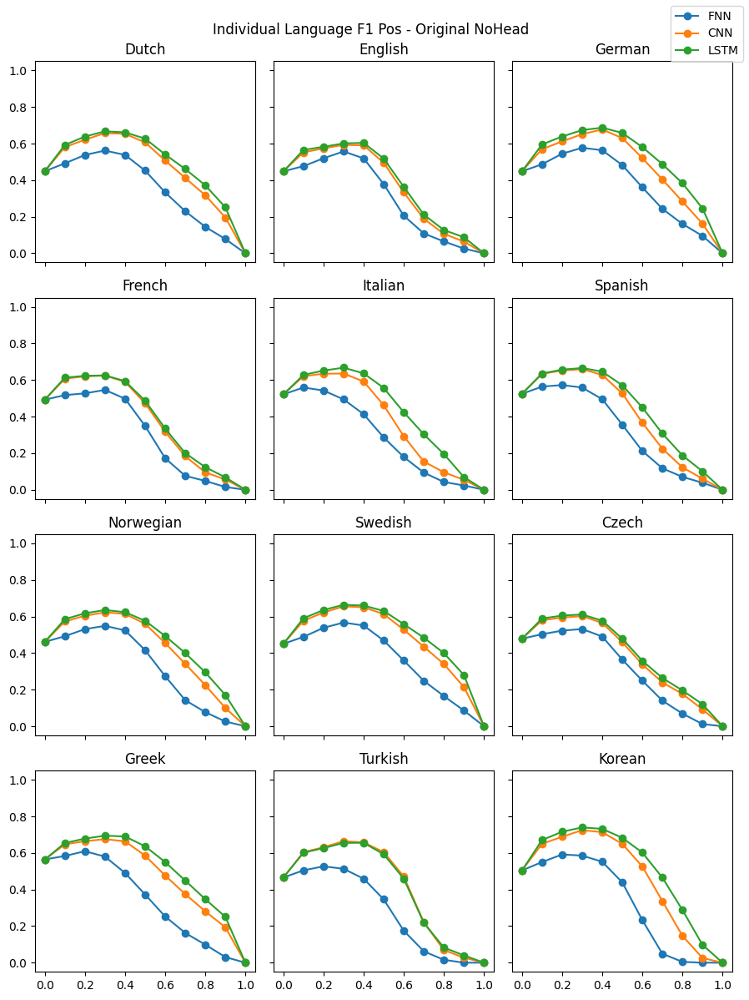

In [ ]:
#@title Plot F1 Pos

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_nohead.loc[('FNN', names[k]), 'F1 Pos'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_nohead.loc[('CNN', names[k]), 'F1 Pos'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_nohead.loc[('LSTM',names[k]), 'F1 Pos'], label='LSTM', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Individual Language F1 Pos - Original NoHead")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Individual Language F1 Pos Original NoHead.png')
plt.show()

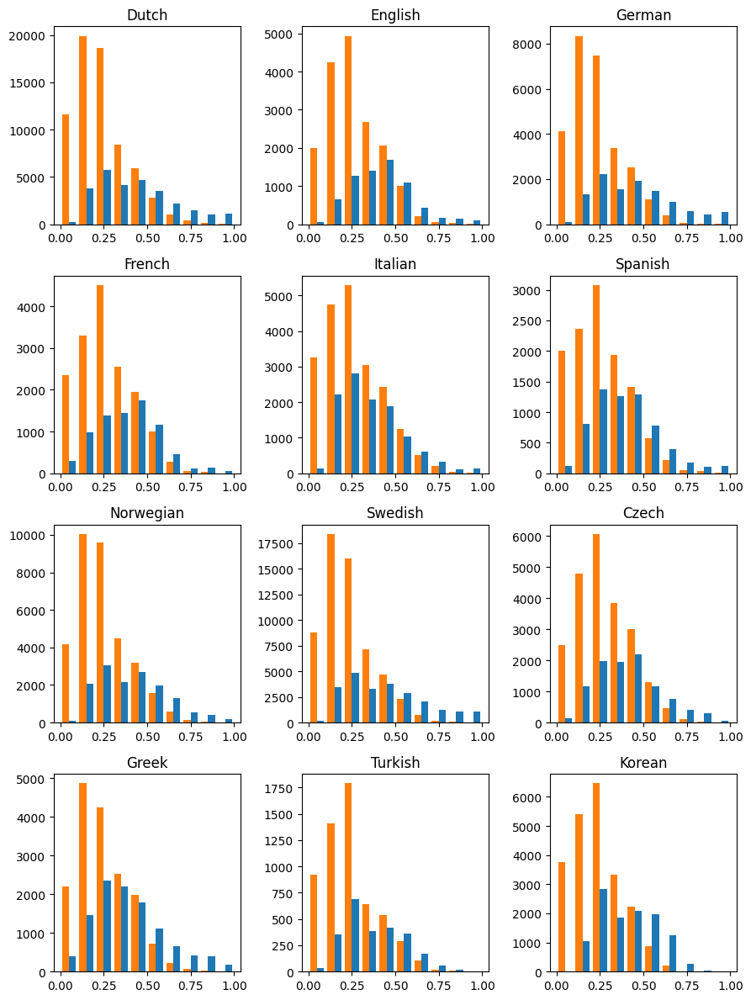

In [ ]:
#@title Histogram of FNN Probabilities

fnn_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_FNN_7gram_15hidden_5layers_10epochs_Original.csv'))

fnn_preds = fnn_preds[fnn_preds['Positions'] != 0]

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(9,12))
bins = [val/10 for val in range(11)]
colors = ['tab:orange', 'tab:blue']

for i, lang in enumerate(codes):
  fnn_lang = fnn_preds[fnn_preds['Languages']==lang]

  fnn_true = fnn_lang[fnn_lang['Ground Truths']==1]['Predictions']
  fnn_false = fnn_lang[fnn_lang['Ground Truths']==0]['Predictions']

  j = i // 3
  k = i % 3

  axs[j,k].hist([fnn_false, fnn_true], bins=bins, label=['Syllable', 'Non-Syllable'], color=colors)
  axs[j,k].set_title(names[i])

handles, labels = axs[0,0].get_legend_handles_labels()
#fig.legend(handles, labels, loc='upper right')
fig.tight_layout()
plt.savefig('FNN Individual Languages Histogram Original NoHead.png')
plt.show()

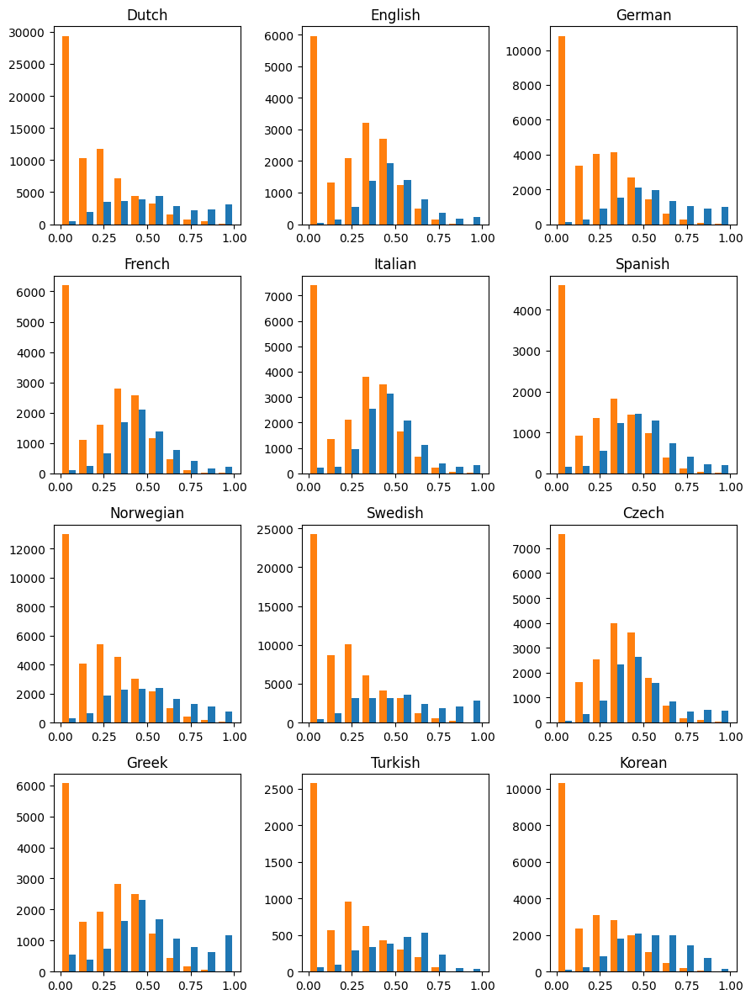

In [ ]:
#@title Histogram of CNN Probabilities

cnn_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_CNN_7gram_15hidden_10layers_10epochs_Original.csv'))

cnn_preds = cnn_preds[cnn_preds['Positions'] != 0]

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(9,12))
bins = [val/10 for val in range(11)]
colors = ['tab:orange', 'tab:blue']

for i, lang in enumerate(codes):
  cnn_lang = cnn_preds[cnn_preds['Languages']==lang]

  cnn_true = cnn_lang[cnn_lang['Ground Truths']==1]['Predictions']
  cnn_false = cnn_lang[cnn_lang['Ground Truths']==0]['Predictions']

  j = i // 3
  k = i % 3

  axs[j,k].hist([cnn_false, cnn_true], bins=bins, label=['Syllable', 'Non-Syllable'], color=colors)
  axs[j,k].set_title(names[i])

handles, labels = axs[0,0].get_legend_handles_labels()
#fig.legend(handles, labels, loc='upper right')
fig.tight_layout()
plt.savefig('CNN Individual Languages Histogram Original NoHead.png')
plt.show()

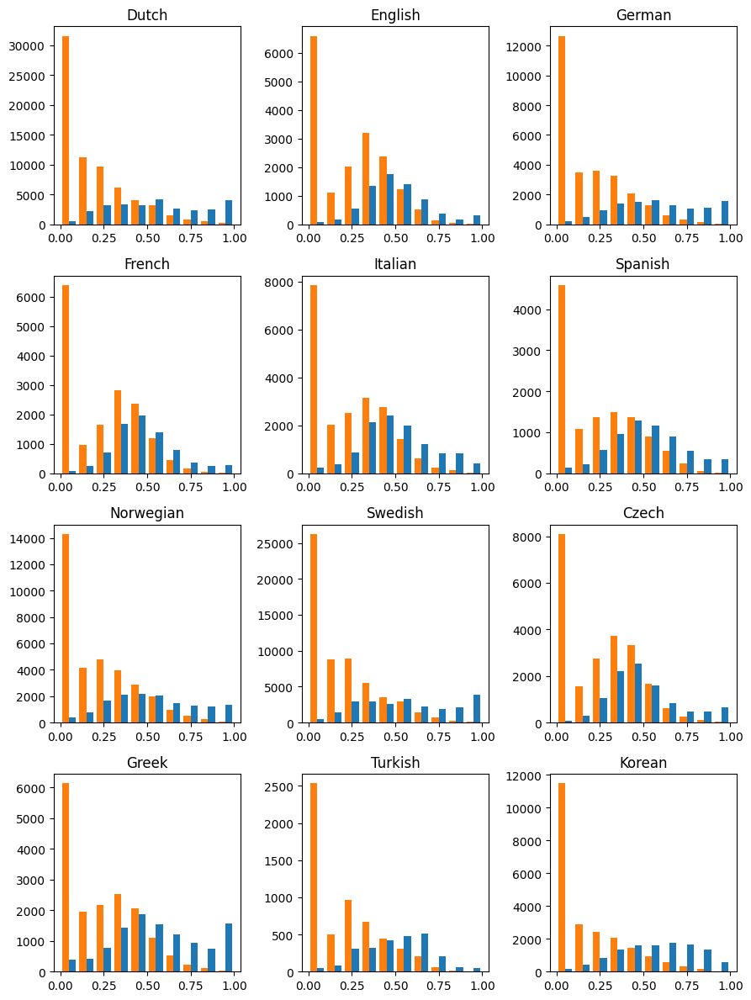

In [ ]:
#@title Histogram of LSTM Probabilities

lstm_preds = pd.read_csv(os.path.join(preds_original, 'All_Langs_LSTM_15hidden_10layers_bidirectional_10epochs_Original.csv'))

lstm_preds = lstm_preds[lstm_preds['Positions'] != 0]

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(9,12))
bins = [val/10 for val in range(11)]
colors = ['tab:orange', 'tab:blue']

for i, lang in enumerate(codes):
  lstm_lang = lstm_preds[lstm_preds['Languages']==lang]

  lstm_true = lstm_lang[lstm_lang['Ground Truths']==1]['Predictions']
  lstm_false = lstm_lang[lstm_lang['Ground Truths']==0]['Predictions']

  j = i // 3
  k = i % 3

  axs[j,k].hist([lstm_false, lstm_true], bins=bins, label=['Syllable', 'Non-Syllable'], color=colors)
  axs[j,k].set_title(names[i])

handles, labels = axs[0,0].get_legend_handles_labels()
#fig.legend(handles, labels, loc='upper right')
fig.tight_layout()
plt.savefig('LSTM Individual Languages Histogram Original NoHead.png')
plt.show()

## Leave One Out Models

These models were trained on a Leave One Out (LOO) dataset that included all-but-one language, and then tested on the left-out language (as mentioned above, the were actually tested on all languages, but we take only their results on the left-out language here).

In [ ]:
#@title Average MCC

# MCC averaged across left-out languages for each model.

# Saved to CSV and loaded below.
'''
mcc = []

for model in models:
  dataframes = []
  for i, lang in enumerate(names):
    lang_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_{model}_Original.csv'))
    lang_df = lang_df[lang_df['Languages']==codes[i]]
    dataframes.append(lang_df)

  df = pd.concat(dataframes, axis=0)

  truths = [truth for truth in df['Ground Truths']]

  for t in thresholds:
    pred = [int(pred) for pred in df['Predictions'] > t]

    mcc.append(matthews_corrcoef(truths, pred))


index = pd.MultiIndex.from_product([models, thresholds], names=['Model', 'Threshold'])
loo_average_original = pd.DataFrame({'MCC':mcc}, index=index).sort_index()

loo_average_original.to_csv(os.path.join(results_original, 'LOO_MCC_Average_Original.csv'))
'''
loo_average_original = pd.read_csv(os.path.join(results_original, 'LOO_MCC_Average_Original.csv'),
                                   index_col=['Model','Threshold'])

loo_average_original

MCC
Model Threshold          
CNN   0.0        0.000000
      0.1        0.406266
      0.2        0.440889
      0.3        0.459919
      0.4        0.471433
      0.5        0.480760
      0.6        0.491070
      0.7        0.494286
      0.8        0.491649
      0.9        0.479994
      1.0        0.000000
FNN   0.0        0.000000
      0.1        0.243995
      0.2        0.313993
      0.3        0.428196
      0.4        0.468090
      0.5        0.491068
      0.6        0.499475
      0.7        0.495963
      0.8        0.486481
      0.9        0.474521
      1.0        0.000000
LSTM  0.0        0.000000
      0.1        0.408008
      0.2        0.441089
      0.3        0.459020
      0.4        0.468412
      0.5        0.479653
      0.6        0.488934
      0.7        0.496098
      0.8        0.493910
      0.9        0.482120
      1.0        0.000000

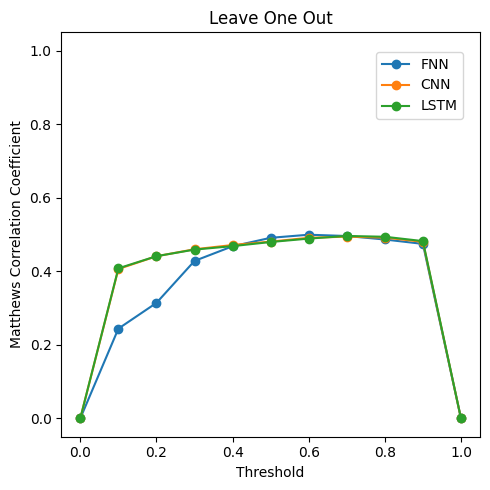

In [ ]:
#@title Plot Average MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, loo_average_original.loc['FNN']['MCC'], label='FNN', marker='o')
axs.plot(thresholds, loo_average_original.loc['CNN']['MCC'], label='CNN', marker='o')
axs.plot(thresholds, loo_average_original.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('Leave One Out')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
plt.savefig('Leave One Out Average MCC Original.pdf')
plt.show()

In [ ]:
#@title MCC and F1

# Saved to CSV and loaded below.
'''
fnn_mcc = []
cnn_mcc = []
lstm_mcc = []

fnn_f1 = []
cnn_f1 = []
lstm_f1 = []

fnn_f1_neg = []
cnn_f1_neg = []
lstm_f1_neg = []

fnn_f1_micro = []
cnn_f1_micro = []
lstm_f1_micro = []

fnn_f1_macro = []
cnn_f1_macro = []
lstm_f1_macro = []

for i, lang in enumerate(names):

  fnn_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_FNN_Original.csv'))
  cnn_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_CNN_Original.csv'))
  lstm_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_LSTM_Original.csv'))

  fnn_df = fnn_df[fnn_df['Languages']==codes[i]]
  cnn_df = cnn_df[cnn_df['Languages']==codes[i]]
  lstm_df = lstm_df[lstm_df['Languages']==codes[i]]

  assert (fnn_df['Ground Truths'] == cnn_df['Ground Truths']).all()
  assert (cnn_df['Ground Truths'] == lstm_df['Ground Truths']).all()

  truths = [truth for truth in fnn_df['Ground Truths']]

  for t in thresholds:
    fnn_pred = [int(pred) for pred in fnn_df['Predictions'] > t]
    cnn_pred = [int(pred) for pred in cnn_df['Predictions'] > t]
    lstm_pred = [int(pred) for pred in lstm_df['Predictions'] > t]

    fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
    cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
    lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

    fnn_f1.append(f1_score(truths, fnn_pred))
    cnn_f1.append(f1_score(truths, cnn_pred))
    lstm_f1.append(f1_score(truths, lstm_pred))

    fnn_f1_neg.append(f1_score(truths, fnn_pred, pos_label=0))
    cnn_f1_neg.append(f1_score(truths, cnn_pred, pos_label=0))
    lstm_f1_neg.append(f1_score(truths, lstm_pred, pos_label=0))

    fnn_f1_micro.append(f1_score(truths, fnn_pred, average='micro'))
    cnn_f1_micro.append(f1_score(truths, cnn_pred, average='micro'))
    lstm_f1_micro.append(f1_score(truths, lstm_pred, average='micro'))

    fnn_f1_macro.append(f1_score(truths, fnn_pred, average='macro'))
    cnn_f1_macro.append(f1_score(truths, cnn_pred, average='macro'))
    lstm_f1_macro.append(f1_score(truths, lstm_pred, average='macro'))

mcc = fnn_mcc + cnn_mcc + lstm_mcc
f1 = fnn_f1 + cnn_f1 + lstm_f1
f1_neg = fnn_f1_neg + cnn_f1_neg + lstm_f1_neg
f1_micro = fnn_f1_micro + cnn_f1_micro + lstm_f1_micro
f1_macro = fnn_f1_macro + cnn_f1_macro + lstm_f1_macro

index = pd.MultiIndex.from_product([models, names, thresholds], names=['Model', 'Language', 'Threshold'])
loo_metrics_original = pd.DataFrame({'MCC':mcc, 'F1 Pos':f1, 'F1 Neg':f1_neg, 'F1 Micro':f1_micro, 'F1 Macro':f1_macro},
                                    index=index).sort_index()

loo_metrics_original.to_csv(os.path.join(results_original, 'LOO_Metrics_Original.csv'))
'''
loo_metrics_original = pd.read_csv(os.path.join(results_original, 'LOO_Metrics_Original.csv'),
                                   index_col=['Model','Language','Threshold'])

loo_metrics_original

MCC    F1 Pos    F1 Neg  F1 Micro  F1 Macro
Model Language Threshold                                                  
CNN   Czech    0.0        0.000000  0.569627  0.000000  0.398237  0.284813
               0.1        0.374530  0.655384  0.497156  0.591041  0.576270
               0.2        0.394782  0.667848  0.576083  0.627534  0.621965
               0.3        0.389321  0.667036  0.646005  0.656843  0.656521
               0.4        0.383180  0.652722  0.714930  0.686886  0.683826
...                            ...       ...       ...       ...       ...
LSTM  Turkish  0.6        0.518142  0.649693  0.823548  0.765310  0.736620
               0.7        0.517668  0.607511  0.824334  0.757296  0.715923
               0.8        0.520234  0.579882  0.824027  0.751952  0.701954
               0.9        0.517386  0.564585  0.822534  0.747842  0.693559
               1.0        0.000000  0.000000  0.739868  0.587135  0.369934

[396 rows x 5 columns]

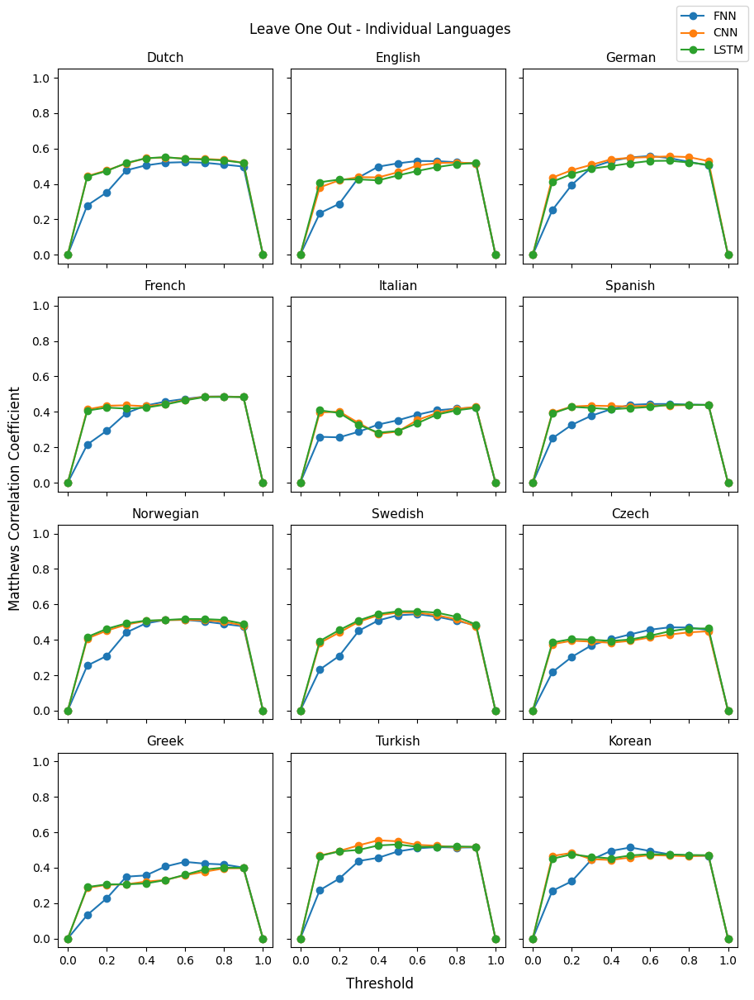

In [ ]:
#@title Plot MCC

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, loo_metrics_original.loc[('FNN', names[k]),'MCC'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_original.loc[('CNN', names[k]),'MCC'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_original.loc[('LSTM', names[k]),'MCC'], label='LSTM', marker='o')
    axs[i,j].set_title(names[k], fontsize=11)
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Leave One Out - Individual Languages")
fig.text(0.5, 0.01, 'Threshold', ha='center', va='center', fontsize=12)
fig.text(0.01, 0.5, 'Matthews Correlation Coefficient', ha='center', va='center', rotation='vertical', fontsize=12)
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout(rect=(0.015,0.015,1,0.99))
plt.savefig('Leave One Out MCC Original.pdf')
plt.show()

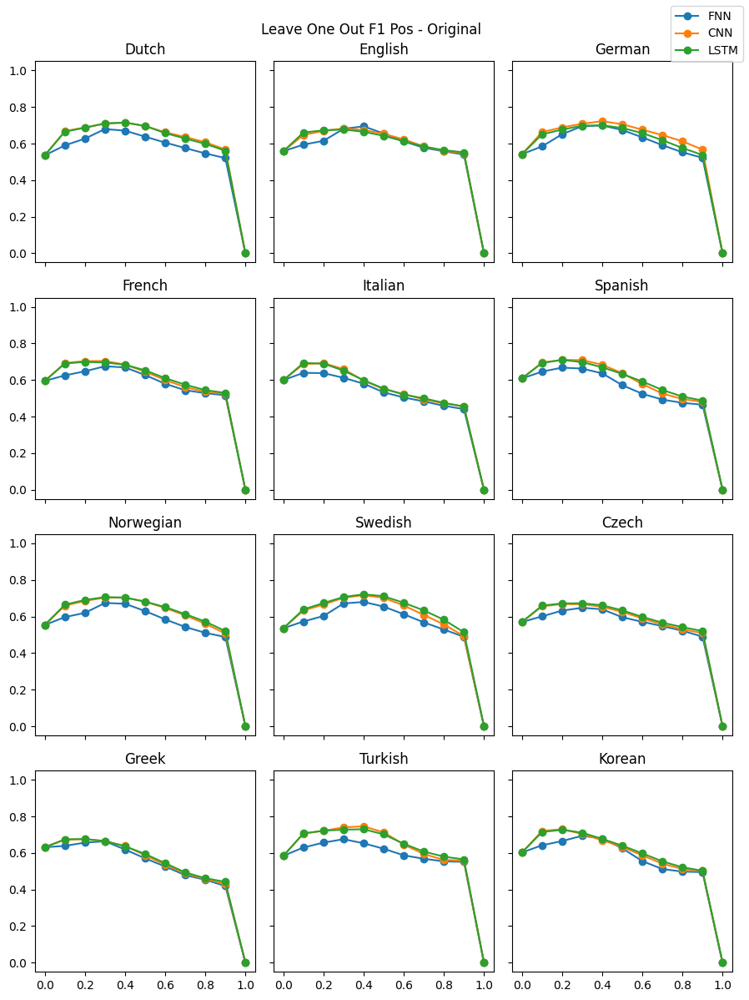

In [ ]:
#@title Plot F1 Pos

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, loo_metrics_original.loc[('FNN', names[k]),'F1 Pos'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_original.loc[('CNN', names[k]),'F1 Pos'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_original.loc[('LSTM', names[k]),'F1 Pos'], label='LSTM', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Leave One Out F1 Pos - Original")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Leave One Out F1 Pos Original.png')
plt.show()

Below we calculate MCC for LOO models on the Test dataset, but **only for the known languages it has seen in training**. We do this to simulate the experience of a practitioner who would have to fine-tune their model's prediction threshold on a held-out set of *known-language* samples, since they couldn't fine-tune it on the unknown language they are deciphering.

In [ ]:
#@title Calculate MCC on Known Languages

# Saved to CSV and loaded below.
'''
fine_thresholds = range(101)
fine_thresholds = [val/100 for val in fine_thresholds]

fnn_mcc = []
cnn_mcc = []
lstm_mcc = []

for i, lang in enumerate(names):

  fnn_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_FNN_Original.csv'))
  cnn_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_CNN_Original.csv'))
  lstm_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_LSTM_Original.csv'))

  fnn_df = fnn_df[fnn_df['Languages']!=codes[i]]
  cnn_df = cnn_df[cnn_df['Languages']!=codes[i]]
  lstm_df = lstm_df[lstm_df['Languages']!=codes[i]]

  assert (fnn_df['Ground Truths'] == cnn_df['Ground Truths']).all()
  assert (cnn_df['Ground Truths'] == lstm_df['Ground Truths']).all()

  truths = [truth for truth in fnn_df['Ground Truths']]

  for t in fine_thresholds:
    fnn_pred = [int(pred) for pred in fnn_df['Predictions'] > t]
    cnn_pred = [int(pred) for pred in cnn_df['Predictions'] > t]
    lstm_pred = [int(pred) for pred in lstm_df['Predictions'] > t]

    fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
    cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
    lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

mcc = fnn_mcc + cnn_mcc + lstm_mcc

index = pd.MultiIndex.from_product([models, names, fine_thresholds], names=['Model', 'Language', 'Threshold'])
loo_mcc_original_known = pd.DataFrame({'MCC':mcc}, index=index).sort_index()

loo_mcc_original_known.to_csv(os.path.join(results_original, 'LOO_MCC_Original_KnownLanguages.csv'))
'''
loo_mcc_original_known = pd.read_csv(os.path.join(results_original, 'LOO_MCC_Original_KnownLanguages.csv'),
                                   index_col=['Model','Language','Threshold'])

loo_mcc_original_known

MCC
Model Language Threshold          
CNN   Czech    0.00       0.000000
               0.01       0.301444
               0.02       0.361585
               0.03       0.390435
               0.04       0.408544
...                            ...
LSTM  Turkish  0.96       0.485710
               0.97       0.481471
               0.98       0.477740
               0.99       0.472752
               1.00       0.000000

[3636 rows x 1 columns]

In [ ]:
#@title Save Best LOO Thresholds

# Saved to CSV and loaded below.
'''
loo_mcc_original_known = pd.read_csv(os.path.join(results_original, 'LOO_MCC_Original_KnownLanguages.csv'),
                                   index_col=['Model','Language','Threshold'])
loo_thresholds = dict()
for model in models:
  loo_thresholds[model] = dict()
  for lang in names:
    loo_thresholds[model][lang] = loo_mcc_original_known.loc[model, lang].idxmax()['MCC']

with open(os.path.join(results_original, 'LOO_Thresholds'), 'w') as f:
    f.write(json.dumps(loo_thresholds))
'''
with open(os.path.join(results_original, 'LOO_Thresholds')) as f:
  loo_thresholds = json.loads(f.read())

We gather all the LOO Models below and run predictions on their left-out language using the threshold tuned on their known languages. We save the resulting dataframe with the probability output by the model, the threshold, the prediction after threshold, ground truth, word ID, position, and segment. We index it using Model and Language (meaning the left-out language being predicted on).

In [ ]:
#@title Predict Unknown Language using Best Threshold on Known Languages

# Saved to CSV and loaded below.
'''
with open(os.path.join(results_original, 'LOO_Thresholds')) as f:
  loo_thresholds = json.loads(f.read())

fnn_results = []
cnn_results = []
lstm_results = []

for i, lang in enumerate(names):

  fnn_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_FNN_Original.csv'))
  cnn_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_CNN_Original.csv'))
  lstm_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_LSTM_Original.csv'))

  fnn_df = fnn_df[fnn_df['Languages']==codes[i]].rename(columns={'Predictions':'Probabilities', 'Languages':'Codes'})
  cnn_df = cnn_df[cnn_df['Languages']==codes[i]].rename(columns={'Predictions':'Probabilities', 'Languages':'Codes'})
  lstm_df = lstm_df[lstm_df['Languages']==codes[i]].rename(columns={'Predictions':'Probabilities', 'Languages':'Codes'})

  fnn_df['Thresholds'] = loo_thresholds['FNN'][lang]
  cnn_df['Thresholds'] = loo_thresholds['CNN'][lang]
  lstm_df['Thresholds'] = loo_thresholds['LSTM'][lang]

  fnn_df['Predictions'] = (fnn_df['Probabilities'] > fnn_df['Thresholds']).astype(int)
  cnn_df['Predictions'] = (cnn_df['Probabilities'] > cnn_df['Thresholds']).astype(int)
  lstm_df['Predictions'] = (lstm_df['Probabilities'] > lstm_df['Thresholds']).astype(int)

  fnn_df['Model'] = 'FNN'
  cnn_df['Model'] = 'CNN'
  lstm_df['Model'] = 'LSTM'

  fnn_df['Language'] = lang
  cnn_df['Language'] = lang
  lstm_df['Language'] = lang

  fnn_results.append(fnn_df[['Model','Language','Probabilities','Thresholds','Predictions','Ground Truths','Codes','Word Indices','Positions','Segments']])
  cnn_results.append(cnn_df[['Model','Language','Probabilities','Thresholds','Predictions','Ground Truths','Codes','Word Indices','Positions','Segments']])
  lstm_results.append(lstm_df[['Model','Language','Probabilities','Thresholds','Predictions','Ground Truths','Codes','Word Indices','Positions','Segments']])

loo_results_original = pd.concat(fnn_results + cnn_results + lstm_results)

loo_results_original.to_csv(os.path.join(results_original, 'LOO_Results_Original.csv'), index=False)
'''
loo_results_original = pd.read_csv(os.path.join(results_original, 'LOO_Results_Original.csv'),
                                   index_col=['Model','Language']).sort_index()
loo_results_original

Probabilities  Thresholds  Predictions  Ground Truths Codes  \
Model Language                                                                
CNN   Czech          1.000000        0.50            1              1    cs   
      Czech          0.973347        0.50            1              0    cs   
      Czech          0.000037        0.50            0              0    cs   
      Czech          0.977364        0.50            1              1    cs   
      Czech          0.046977        0.50            0              0    cs   
...                       ...         ...          ...            ...   ...   
LSTM  Turkish        0.463912        0.51            0              1    tr   
      Turkish        0.290024        0.51            0              0    tr   
      Turkish        0.593010        0.51            1              1    tr   
      Turkish        0.297613        0.51            0              0    tr   
      Turkish        0.032755        0.51            0              0    tr   

                Word Indices  Positions Segments  
Model Language                                    
CNN   Czech               13          0        p  
      Czech               13          1        8  
      Czech               13          2        e  
      Czech               13          3        v  
      Czech               13          4        e  
...                      ...        ...      ...  
LSTM  Turkish          62786          6        s  
      Turkish          62786          7        i  
      Turkish          62786          8        J  
      Turkish          62786          9        o  
      Turkish          62786         10        n  

[1586823 rows x 8 columns]

After fine-tuning the threshold for each model on its known languages and running predictions using that, we now calculate the MCC for those predictions.

In [ ]:
#@title Calculate MCC on Unknown Languages

# Saved to CSV and loaded below.
'''
loo_results_original = pd.read_csv(os.path.join(results_original, 'LOO_Results_Original.csv'),
                                   index_col=['Model','Language']).sort_index()
fnn_mcc = []
cnn_mcc = []
lstm_mcc = []

fnn_thresh = []
cnn_thresh = []
lstm_thresh = []

for i, lang in enumerate(names):

  fnn_df = loo_results_original.loc['FNN',lang]
  cnn_df = loo_results_original.loc['CNN',lang]
  lstm_df = loo_results_original.loc['LSTM',lang]

  fnn_pred = fnn_df['Predictions'].to_list()
  cnn_pred = cnn_df['Predictions'].to_list()
  lstm_pred = lstm_df['Predictions'].to_list()

  fnn_truths = fnn_df['Ground Truths'].to_list()
  cnn_truths = cnn_df['Ground Truths'].to_list()
  lstm_truths = lstm_df['Ground Truths'].to_list()

  truths = [truth for truth in fnn_df['Ground Truths']]

  fnn_mcc.append(matthews_corrcoef(fnn_truths, fnn_pred))
  cnn_mcc.append(matthews_corrcoef(cnn_truths, cnn_pred))
  lstm_mcc.append(matthews_corrcoef(lstm_truths, lstm_pred))

  fnn_thresh.append(fnn_df['Thresholds'][0])
  cnn_thresh.append(cnn_df['Thresholds'][0])
  lstm_thresh.append(lstm_df['Thresholds'][0])

mcc = fnn_mcc + cnn_mcc + lstm_mcc
threshes = fnn_thresh + cnn_thresh + lstm_thresh

index = pd.MultiIndex.from_product([models, names], names=['Model', 'Language'])
loo_mcc_original_unknown = pd.DataFrame({'Threshold':threshes, 'MCC':mcc}, index=index).sort_index()

loo_mcc_original_unknown.to_csv(os.path.join(results_original, 'LOO_MCC_Original_UnknownLanguages.csv'))
'''
loo_mcc_original_unknown = pd.read_csv(os.path.join(results_original, 'LOO_MCC_Original_UnknownLanguages.csv'),
                                   index_col=['Model','Language'])

loo_mcc_original_unknown

Threshold       MCC
Model Language                      
CNN   Czech           0.50  0.394002
      Dutch           0.55  0.545577
      English         0.50  0.466011
      French          0.49  0.439475
      German          0.51  0.548668
      Greek           0.52  0.337104
      Italian         0.49  0.282729
      Korean          0.47  0.454645
      Norwegian       0.52  0.511670
      Spanish         0.49  0.431878
      Swedish         0.49  0.553464
      Turkish         0.50  0.549120
FNN   Czech           0.60  0.456600
      Dutch           0.59  0.524102
      English         0.60  0.529755
      French          0.62  0.477091
      German          0.62  0.556759
      Greek           0.58  0.431944
      Italian         0.58  0.378940
      Korean          0.59  0.497758
      Norwegian       0.57  0.512108
      Spanish         0.55  0.443582
      Swedish         0.58  0.546347
      Turkish         0.56  0.509362
LSTM  Czech           0.53  0.408632
      Dutch           0.52  0.549879
      English         0.48  0.442495
      French          0.49  0.436443
      German          0.52  0.521231
      Greek           0.49  0.325597
      Italian         0.47  0.285200
      Korean          0.48  0.463367
      Norwegian       0.49  0.511125
      Spanish         0.48  0.420218
      Swedish         0.51  0.560697
      Turkish         0.51  0.531673

Now having calculated the best threshold for each model on its known languages (down to the hundredth) and on its unknown language (down to the tenth), we compare the MCC using each of these thresholds. The best threshold that is fine-tuned on the unknown language will likely perform better, even though it's coarser-grained, but since such fine-tuning wouldn't be available to the practitioner with an undeciphered language, they would have to use the best threshold fine-tuned on the known languages.

In [ ]:
#@title Compare MCC at Best Known vs Unknown Thresholds
loo_metrics_original = pd.read_csv(os.path.join(results_original, 'LOO_Metrics_Original.csv'),
                                   index_col=['Model','Language','Threshold'])

with open(os.path.join(results_original, 'LOO_Thresholds')) as f:
  loo_thresholds = json.loads(f.read())

loo_mcc_original_unknown = pd.read_csv(os.path.join(results_original, 'LOO_MCC_Original_UnknownLanguages.csv'),
                                   index_col=['Model','Language'])

unknown_thresh = dict()
for model in models:
  unknown_thresh[model] = dict()
  for lang in names:
    thresh = loo_metrics_original.loc[(model,lang),'MCC'].idxmax()
    mcc = loo_metrics_original.loc[(model,lang,thresh),'MCC']
    unknown_thresh[model][lang] = dict()
    unknown_thresh[model][lang]['thresh'] = thresh
    unknown_thresh[model][lang]['mcc'] = mcc

known_thresh = dict()
for model in models:
  known_thresh[model] = dict()
  for lang in names:
    thresh = loo_thresholds[model][lang]
    mcc = loo_mcc_original_unknown.loc[(model, lang), 'MCC']
    assert thresh == loo_mcc_original_unknown.loc[(model, lang), 'Threshold']
    known_thresh[model][lang] = dict()
    known_thresh[model][lang]['thresh'] = thresh
    known_thresh[model][lang]['mcc'] = mcc

with open('MCC with True vs Estimated Thresholds.txt', 'w') as f:
  f.write(f"{'':<19} {'True'} {'':<14} {'Estimated'}\n")
  f.write(f"{'Model':<6} {'Language':<12} {'Thresh':<8} {'MCC':<10} {'Thresh':<9} {'MCC':<10} {'Difference'}\n")
  print(f"{'':<19} {'True'} {'':<14} {'Estimated'}")
  print(f"{'Model':<6} {'Language':<12} {'Thresh':<8} {'MCC':<10} {'Thresh':<9} {'MCC':<10} {'Difference'}")
  for model in models:
    diffs = 0
    for lang in names:
      thresh1 = unknown_thresh[model][lang]['thresh']
      thresh2 = known_thresh[model][lang]['thresh']
      mcc1 = unknown_thresh[model][lang]['mcc']
      mcc2 = known_thresh[model][lang]['mcc']
      diff = mcc2 - mcc1
      diffs += diff
      if diff >= 0:
        f.write(f"{model:<6} {lang:<12} {thresh1:<8} {mcc1:.4f} {'':<3} {thresh2:<9} {mcc2:.4f} {'':<3} {diff:.4f}\n")
        print(f"{model:<6} {lang:<12} {thresh1:<8} {mcc1:.4f} {'':<3} {thresh2:<9} {mcc2:.4f} {'':<3} {diff:.4f}")
      else:
        f.write(f"{model:<6} {lang:<12} {thresh1:<8} {mcc1:.4f} {'':<3} {thresh2:<9} {mcc2:.4f} {'':<2} {diff:.4f}\n")
        print(f"{model:<6} {lang:<12} {thresh1:<8} {mcc1:.4f} {'':<3} {thresh2:<9} {mcc2:.4f} {'':<2} {diff:.4f}")
    f.write(f"{'':<59} {diffs:.4f}")
    f.write('\n')
    print(f"{'':<59} {diffs:.4f}")
    print()

                    True                Estimated
Model  Language     Thresh   MCC        Thresh    MCC        Difference
FNN    Dutch        0.6      0.5232     0.59      0.5241     0.0009
FNN    English      0.6      0.5298     0.6       0.5298     0.0000
FNN    German       0.6      0.5579     0.62      0.5568    -0.0011
FNN    French       0.8      0.4871     0.62      0.4771    -0.0100
FNN    Italian      0.9      0.4252     0.58      0.3789    -0.0462
FNN    Spanish      0.7      0.4446     0.55      0.4436    -0.0010
FNN    Norwegian    0.6      0.5123     0.57      0.5121    -0.0002
FNN    Swedish      0.6      0.5446     0.58      0.5463     0.0017
FNN    Czech        0.7      0.4704     0.6       0.4566    -0.0138
FNN    Greek        0.6      0.4329     0.58      0.4319    -0.0010
FNN    Turkish      0.7      0.5162     0.56      0.5094    -0.0069
FNN    Korean       0.5      0.5142     0.59      0.4978    -0.0164
                                                            -0

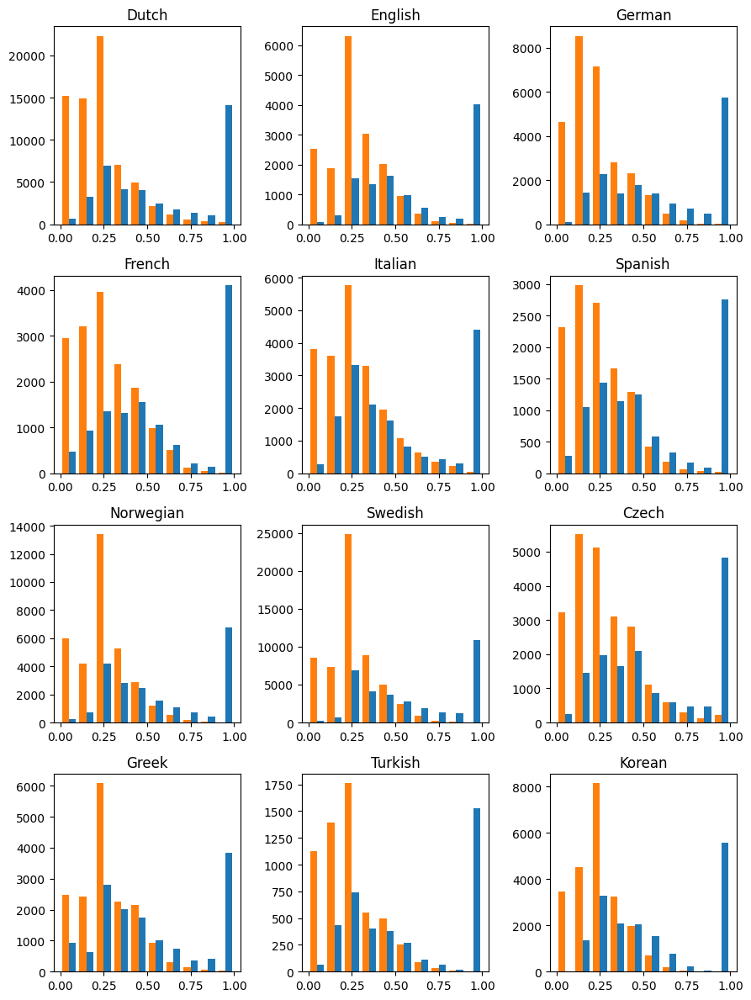

In [ ]:
#@title Histogram of FNN Prediction Probabilities on Left-Out Languages

loo_results_original = pd.read_csv(os.path.join(results_original, 'LOO_Results_Original.csv'),
                                   index_col=['Model','Language']).sort_index()

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(9,12))
bins = [val/10 for val in range(11)]
colors = ['tab:orange', 'tab:blue']

for i, lang in enumerate(names):
  fnn_lang = loo_results_original.loc['FNN', lang]

  fnn_true = fnn_lang[fnn_lang['Ground Truths']==1]['Probabilities']
  fnn_false = fnn_lang[fnn_lang['Ground Truths']==0]['Probabilities']

  j = i // 3
  k = i % 3

  axs[j,k].hist([fnn_false, fnn_true], bins=bins, label=['Syllable', 'Non-Syllable'], color=colors)
  axs[j,k].set_title(names[i])

handles, labels = axs[0,0].get_legend_handles_labels()
#fig.legend(handles, labels, loc='upper right')
fig.tight_layout()
plt.savefig('FNN LOO Histogram Original.png')
plt.show()

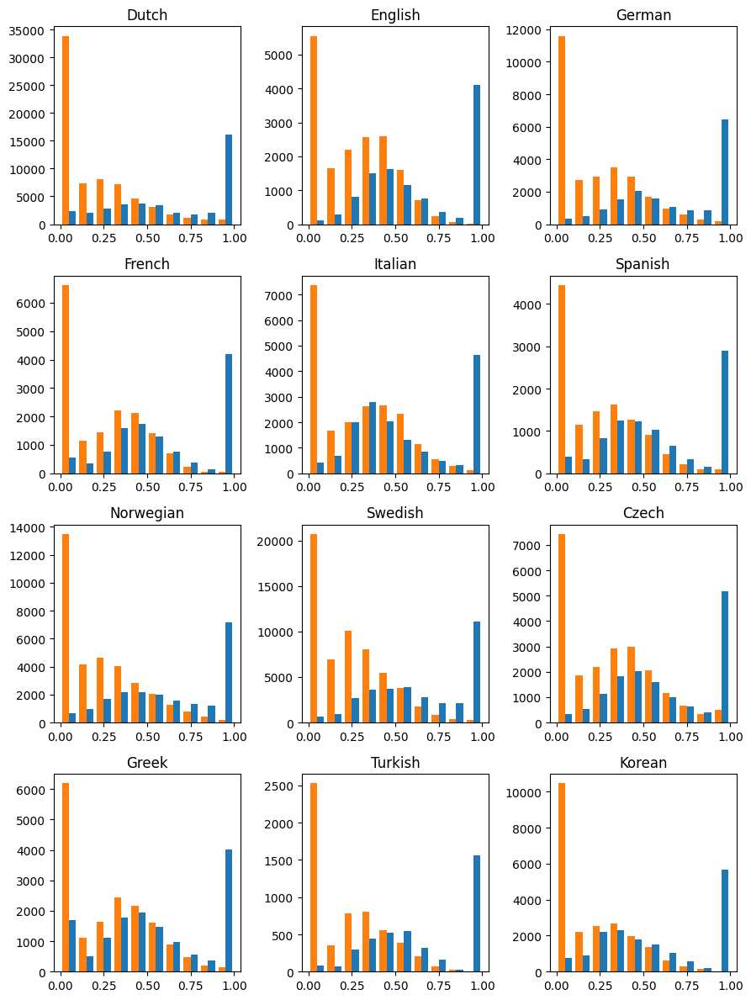

In [ ]:
#@title Histogram of CNN Prediction Probabilities on Left-Out Languages

loo_results_original = pd.read_csv(os.path.join(results_original, 'LOO_Results_Original.csv'),
                                   index_col=['Model','Language']).sort_index()

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(9,12))
bins = [val/10 for val in range(11)]
colors = ['tab:orange', 'tab:blue']

for i, lang in enumerate(names):
  cnn_lang = loo_results_original.loc['CNN', lang]

  cnn_true = cnn_lang[cnn_lang['Ground Truths']==1]['Probabilities']
  cnn_false = cnn_lang[cnn_lang['Ground Truths']==0]['Probabilities']

  j = i // 3
  k = i % 3

  axs[j,k].hist([cnn_false, cnn_true], bins=bins, label=['Syllable', 'Non-Syllable'], color=colors)
  axs[j,k].set_title(names[i])

handles, labels = axs[0,0].get_legend_handles_labels()
#fig.legend(handles, labels, loc='upper right')
fig.tight_layout()
plt.savefig('CNN LOO Histogram Original.png')
plt.show()

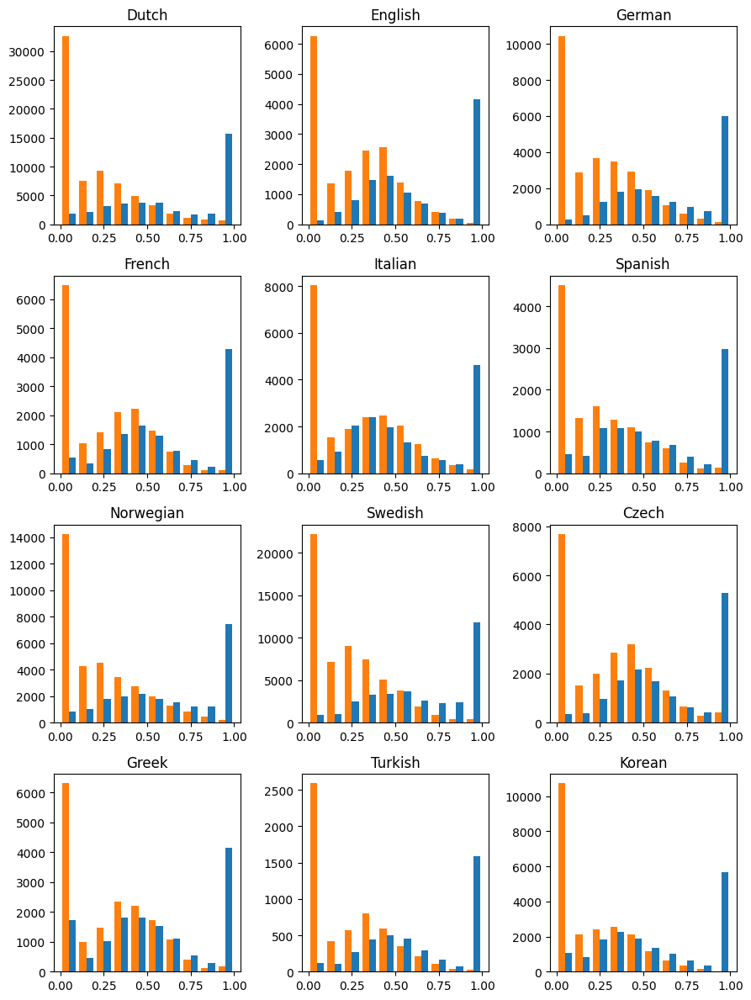

In [ ]:
#@title Histogram of LSTM Prediction Probabilities on Left-Out Languages

loo_results_original = pd.read_csv(os.path.join(results_original, 'LOO_Results_Original.csv'),
                                   index_col=['Model','Language']).sort_index()

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(9,12))
bins = [val/10 for val in range(11)]
colors = ['tab:orange', 'tab:blue']

for i, lang in enumerate(names):
  lstm_lang = loo_results_original.loc['LSTM', lang]

  lstm_true = lstm_lang[lstm_lang['Ground Truths']==1]['Probabilities']
  lstm_false = lstm_lang[lstm_lang['Ground Truths']==0]['Probabilities']

  j = i // 3
  k = i % 3

  axs[j,k].hist([lstm_false, lstm_true], bins=bins, label=['Syllable', 'Non-Syllable'], color=colors)
  axs[j,k].set_title(names[i])

handles, labels = axs[0,0].get_legend_handles_labels()
#fig.legend(handles, labels, loc='upper right')
fig.tight_layout()
plt.savefig('LSTM LOO Histogram Original.png')
plt.show()

### Without First Segment Predictions

In [ ]:
#@title Average MCC

# MCC averaged across left-out languages for each model.

# Saved to CSV and loaded below.
'''
mcc = []

for model in models:
  dataframes = []
  for i, lang in enumerate(names):
    lang_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_{model}_Original.csv'))
    lang_df = lang_df[lang_df['Languages']==codes[i]]
    dataframes.append(lang_df)

  df = pd.concat(dataframes, axis=0)
  df = df[df['Positions'] != 0]

  truths = [truth for truth in df['Ground Truths']]

  for t in thresholds:
    pred = [int(pred) for pred in df['Predictions'] > t]

    mcc.append(matthews_corrcoef(truths, pred))


index = pd.MultiIndex.from_product([models, thresholds], names=['Model', 'Threshold'])
loo_average_nohead = pd.DataFrame({'MCC':mcc}, index=index).sort_index()

loo_average_nohead.to_csv(os.path.join(results_original, 'LOO_MCC_Average_Original_NoHead.csv'))
'''
loo_average_nohead = pd.read_csv(os.path.join(results_original, 'LOO_MCC_Average_Original_NoHead.csv'),
                                   index_col=['Model','Threshold'])

loo_average_nohead

MCC
Model Threshold          
CNN   0.0        0.000000
      0.1        0.352868
      0.2        0.373887
      0.3        0.368081
      0.4        0.345204
      0.5        0.315703
      0.6        0.287054
      0.7        0.258083
      0.8        0.227436
      0.9        0.178355
      1.0        0.000000
FNN   0.0        0.000000
      0.1        0.208782
      0.2        0.248843
      0.3        0.306471
      0.4        0.308888
      0.5        0.288067
      0.6        0.263082
      0.7        0.231350
      0.8        0.194527
      0.9        0.147828
      1.0        0.000000
LSTM  0.0        0.000000
      0.1        0.353715
      0.2        0.372822
      0.3        0.365840
      0.4        0.342324
      0.5        0.316248
      0.6        0.287633
      0.7        0.264142
      0.8        0.233920
      0.9        0.185483
      1.0        0.000000

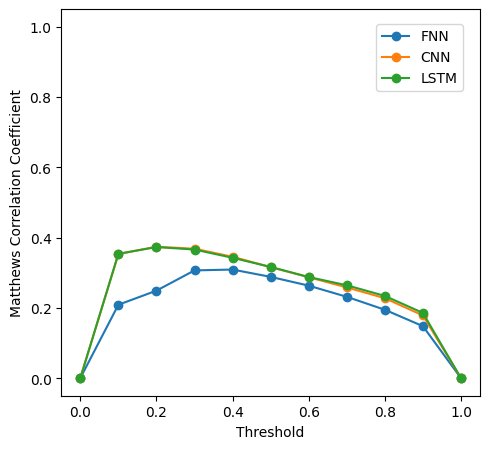

In [ ]:
#@title Plot Average MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,4.6))

axs.plot(thresholds, loo_average_nohead.loc['FNN']['MCC'], label='FNN', marker='o')
axs.plot(thresholds, loo_average_nohead.loc['CNN']['MCC'], label='CNN', marker='o')
axs.plot(thresholds, loo_average_nohead.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
#axs.set_title('Leave One Out')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.95))
plt.tight_layout()
plt.savefig('Leave One Out Average MCC NoHead.pdf')
plt.show()

In [ ]:
#@title MCC and F1

# Saved to CSV and loaded below.
'''
fnn_mcc = []
cnn_mcc = []
lstm_mcc = []

fnn_f1 = []
cnn_f1 = []
lstm_f1 = []

fnn_f1_neg = []
cnn_f1_neg = []
lstm_f1_neg = []

fnn_f1_micro = []
cnn_f1_micro = []
lstm_f1_micro = []

fnn_f1_macro = []
cnn_f1_macro = []
lstm_f1_macro = []

for i, lang in enumerate(names):

  fnn_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_FNN_Original.csv'))
  cnn_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_CNN_Original.csv'))
  lstm_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_LSTM_Original.csv'))

  fnn_df = fnn_df[fnn_df['Positions'] != 0]
  cnn_df = cnn_df[cnn_df['Positions'] != 0]
  lstm_df = lstm_df[lstm_df['Positions'] != 0]

  fnn_df = fnn_df[fnn_df['Languages']==codes[i]]
  cnn_df = cnn_df[cnn_df['Languages']==codes[i]]
  lstm_df = lstm_df[lstm_df['Languages']==codes[i]]

  assert (fnn_df['Ground Truths'] == cnn_df['Ground Truths']).all()
  assert (cnn_df['Ground Truths'] == lstm_df['Ground Truths']).all()

  truths = [truth for truth in fnn_df['Ground Truths']]

  for t in thresholds:
    fnn_pred = [int(pred) for pred in fnn_df['Predictions'] > t]
    cnn_pred = [int(pred) for pred in cnn_df['Predictions'] > t]
    lstm_pred = [int(pred) for pred in lstm_df['Predictions'] > t]

    fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
    cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
    lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

    fnn_f1.append(f1_score(truths, fnn_pred))
    cnn_f1.append(f1_score(truths, cnn_pred))
    lstm_f1.append(f1_score(truths, lstm_pred))

    fnn_f1_neg.append(f1_score(truths, fnn_pred, pos_label=0))
    cnn_f1_neg.append(f1_score(truths, cnn_pred, pos_label=0))
    lstm_f1_neg.append(f1_score(truths, lstm_pred, pos_label=0))

    fnn_f1_micro.append(f1_score(truths, fnn_pred, average='micro'))
    cnn_f1_micro.append(f1_score(truths, cnn_pred, average='micro'))
    lstm_f1_micro.append(f1_score(truths, lstm_pred, average='micro'))

    fnn_f1_macro.append(f1_score(truths, fnn_pred, average='macro'))
    cnn_f1_macro.append(f1_score(truths, cnn_pred, average='macro'))
    lstm_f1_macro.append(f1_score(truths, lstm_pred, average='macro'))

mcc = fnn_mcc + cnn_mcc + lstm_mcc
f1 = fnn_f1 + cnn_f1 + lstm_f1
f1_neg = fnn_f1_neg + cnn_f1_neg + lstm_f1_neg
f1_micro = fnn_f1_micro + cnn_f1_micro + lstm_f1_micro
f1_macro = fnn_f1_macro + cnn_f1_macro + lstm_f1_macro

index = pd.MultiIndex.from_product([models, names, thresholds], names=['Model', 'Language', 'Threshold'])
loo_metrics_nohead = pd.DataFrame({'MCC':mcc, 'F1 Pos':f1, 'F1 Neg':f1_neg, 'F1 Micro':f1_micro, 'F1 Macro':f1_macro},
                                    index=index).sort_index()

loo_metrics_nohead.to_csv(os.path.join(results_original, 'LOO_Metrics_Original_NoHead.csv'))
'''
loo_metrics_nohead = pd.read_csv(os.path.join(results_original, 'LOO_Metrics_Original_NoHead.csv'),
                                   index_col=['Model','Language','Threshold'])

loo_metrics_nohead

MCC    F1 Pos    F1 Neg  F1 Micro  F1 Macro
Model Language Threshold                                                  
CNN   Czech    0.0        0.000000  0.478553  0.000000  0.314538  0.239277
               0.1        0.327956  0.566091  0.497156  0.534160  0.531623
               0.2        0.334193  0.575373  0.576083  0.575728  0.575728
               0.3        0.303932  0.563638  0.646005  0.609113  0.604821
               0.4        0.258460  0.523719  0.714930  0.643335  0.619324
...                            ...       ...       ...       ...       ...
LSTM  Turkish  0.6        0.241997  0.341407  0.823548  0.721667  0.582477
               0.7        0.179540  0.203641  0.824334  0.712162  0.513988
               0.8        0.134522  0.103935  0.824027  0.705825  0.463981
               0.9        0.093282  0.050310  0.822534  0.700951  0.436422
               1.0        0.000000  0.000000  0.820977  0.696320  0.410489

[396 rows x 5 columns]

In [ ]:
for lang in names:
  lang_df = loo_metrics_nohead.xs(lang,level='Language',drop_level=False)
  best = lang_df['MCC'].argmax()
  print(lang, lang_df.iloc[best].name[0], lang_df.iloc[best].name[2], lang_df['MCC'].max())

Dutch LSTM 0.4 0.4292613279718417
English LSTM 0.1 0.3555518929008126
German CNN 0.4 0.4321300807772643
French CNN 0.2 0.3579286646067358
Italian LSTM 0.1 0.3642769469323984
Spanish CNN 0.2 0.3681626121180885
Norwegian LSTM 0.3 0.3946697851243593
Swedish LSTM 0.4 0.4444778592461337
Czech LSTM 0.2 0.347239419253198
Greek FNN 0.3 0.249298088603024
Turkish CNN 0.3 0.4226947886056293
Korean CNN 0.1 0.4048161864079165


In [ ]:
lang_df.iloc[0].name

('CNN', 'Korean', 0.0)

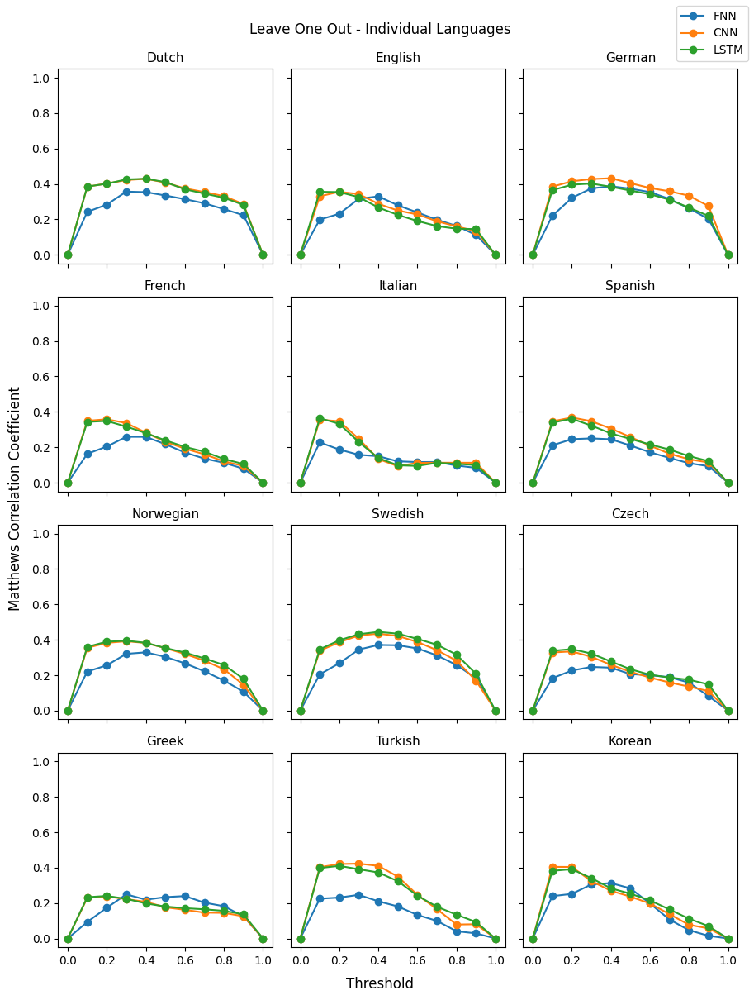

In [ ]:
#@title Plot MCC

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, loo_metrics_nohead.loc[('FNN', names[k]),'MCC'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_nohead.loc[('CNN', names[k]),'MCC'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_nohead.loc[('LSTM', names[k]),'MCC'], label='LSTM', marker='o')
    axs[i,j].set_title(names[k], fontsize=11)
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Leave One Out - Individual Languages")
fig.text(0.5, 0.01, 'Threshold', ha='center', va='center', fontsize=12)
fig.text(0.01, 0.5, 'Matthews Correlation Coefficient', ha='center', va='center', rotation='vertical', fontsize=12)
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout(rect=(0.015,0.015,1,0.99))
plt.savefig('Leave One Out MCC NoHead.pdf')
plt.show()

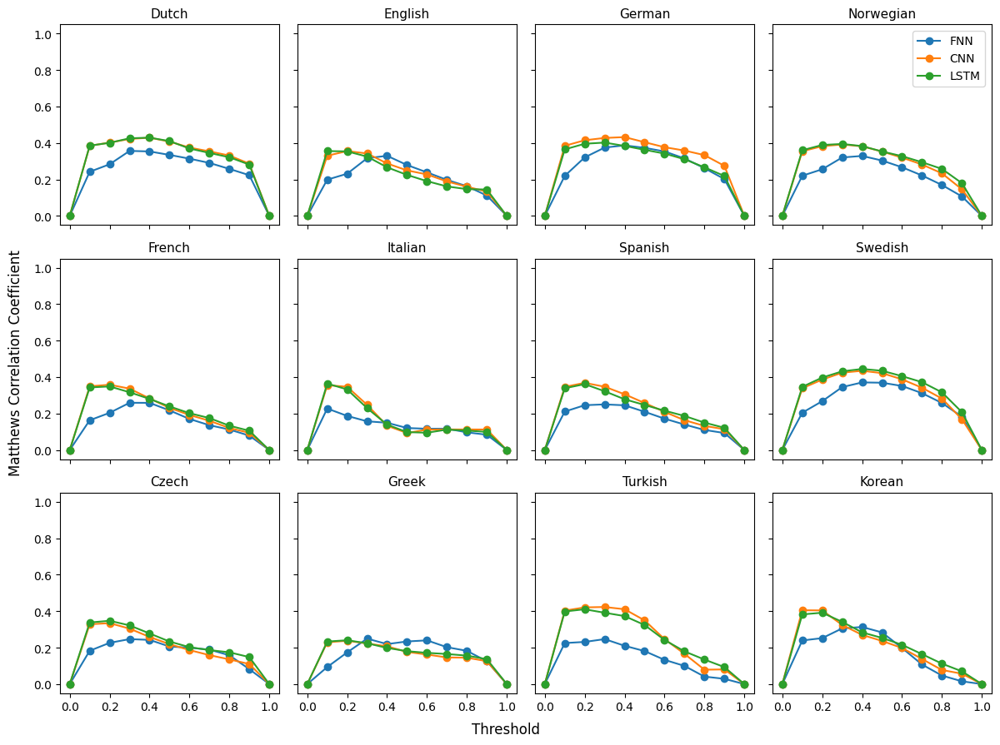

In [ ]:
#@title Plot MCC 3 x 4

# List of language new_names
new_names = ['Dutch', 'English', 'German', 'Norwegian',
             'French', 'Italian', 'Spanish', 'Swedish',
             'Czech', 'Greek', 'Turkish', 'Korean']

fig, axs = plt.subplots(nrows=3, ncols=4, sharex=True, sharey=True, figsize=(12,9))

for i in range(3):
  for j in range(4):
    k = i * 4 + j

    axs[i,j].plot(thresholds, loo_metrics_nohead.loc[('FNN', new_names[k]), 'MCC'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_nohead.loc[('CNN', new_names[k]), 'MCC'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_nohead.loc[('LSTM',new_names[k]), 'MCC'], label='LSTM', marker='o')
    axs[i,j].set_title(new_names[k],fontsize=11)
    axs[i,j].set_ylim([-0.05,1.05])

#fig.suptitle("All Language - Individual Languages")
fig.text(0.5, 0.01, 'Threshold', ha='center', va='center', fontsize=12)
fig.text(0.01, 0.5, 'Matthews Correlation Coefficient', ha='center', va='center', rotation='vertical', fontsize=12)
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.985, 0.95))
plt.tight_layout(rect=(0.015,0.015,1,0.99))
plt.savefig('Leave One Out MCC NoHead 3x4.pdf')
plt.show()

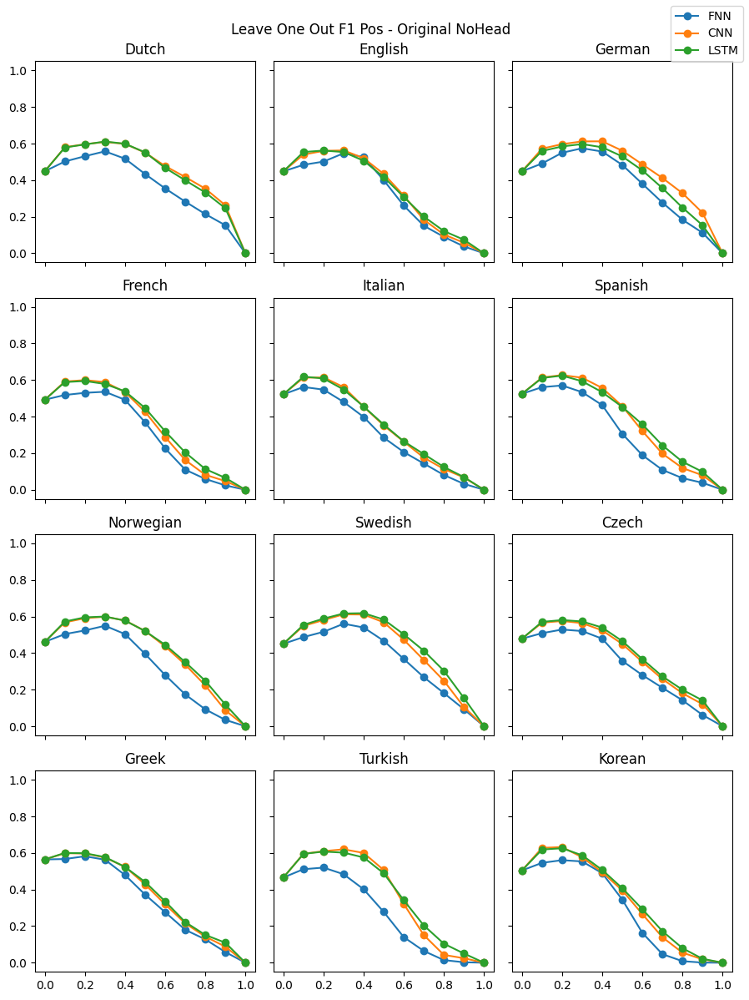

In [ ]:
#@title Plot F1 Pos

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, loo_metrics_nohead.loc[('FNN', names[k]),'F1 Pos'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_nohead.loc[('CNN', names[k]),'F1 Pos'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_nohead.loc[('LSTM', names[k]),'F1 Pos'], label='LSTM', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Leave One Out F1 Pos - Original NoHead")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Leave One Out F1 Pos Original NoHead.png')
plt.show()

In [21]:
#@title Calculate MCC on Known Languages

# Saved to CSV and loaded below.
'''
fine_thresholds = range(101)
fine_thresholds = [val/100 for val in fine_thresholds]

fnn_mcc = []
cnn_mcc = []
lstm_mcc = []

for i, lang in enumerate(names):

  fnn_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_FNN_Original.csv'))
  cnn_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_CNN_Original.csv'))
  lstm_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_LSTM_Original.csv'))

  fnn_df = fnn_df[fnn_df['Positions'] != 0]
  cnn_df = cnn_df[cnn_df['Positions'] != 0]
  lstm_df = lstm_df[lstm_df['Positions'] != 0]

  fnn_df = fnn_df[fnn_df['Languages']!=codes[i]]
  cnn_df = cnn_df[cnn_df['Languages']!=codes[i]]
  lstm_df = lstm_df[lstm_df['Languages']!=codes[i]]

  assert (fnn_df['Ground Truths'] == cnn_df['Ground Truths']).all()
  assert (cnn_df['Ground Truths'] == lstm_df['Ground Truths']).all()

  truths = [truth for truth in fnn_df['Ground Truths']]

  for t in fine_thresholds:
    fnn_pred = [int(pred) for pred in fnn_df['Predictions'] > t]
    cnn_pred = [int(pred) for pred in cnn_df['Predictions'] > t]
    lstm_pred = [int(pred) for pred in lstm_df['Predictions'] > t]

    fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
    cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
    lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

mcc = fnn_mcc + cnn_mcc + lstm_mcc

index = pd.MultiIndex.from_product([models, names, fine_thresholds], names=['Model', 'Language', 'Threshold'])
loo_mcc_nohead_known = pd.DataFrame({'MCC':mcc}, index=index).sort_index()

loo_mcc_nohead_known.to_csv(os.path.join(results_original, 'LOO_MCC_Original_KnownLanguages_NoHead.csv'))
'''
loo_mcc_nohead_known = pd.read_csv(os.path.join(results_original, 'LOO_MCC_Original_KnownLanguages_NoHead.csv'),
                                   index_col=['Model','Language','Threshold'])

loo_mcc_nohead_known

MCC
Model Language Threshold          
CNN   Czech    0.00       0.000000
               0.01       0.270057
               0.02       0.324761
               0.03       0.350970
               0.04       0.367372
...                            ...
LSTM  Turkish  0.96       0.190093
               0.97       0.175951
               0.98       0.162611
               0.99       0.143162
               1.00       0.000000

[3636 rows x 1 columns]

In [20]:
#@title Calculate MCC on Unknown Languages

# Saved to CSV and loaded below.
'''
fine_thresholds = range(101)
fine_thresholds = [val/100 for val in fine_thresholds]

fnn_mcc = []
cnn_mcc = []
lstm_mcc = []

for i, lang in enumerate(names):

  fnn_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_FNN_Original.csv'))
  cnn_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_CNN_Original.csv'))
  lstm_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_LSTM_Original.csv'))

  fnn_df = fnn_df[fnn_df['Positions'] != 0]
  cnn_df = cnn_df[cnn_df['Positions'] != 0]
  lstm_df = lstm_df[lstm_df['Positions'] != 0]

  fnn_df = fnn_df[fnn_df['Languages']==codes[i]]
  cnn_df = cnn_df[cnn_df['Languages']==codes[i]]
  lstm_df = lstm_df[lstm_df['Languages']==codes[i]]

  assert (fnn_df['Ground Truths'] == cnn_df['Ground Truths']).all()
  assert (cnn_df['Ground Truths'] == lstm_df['Ground Truths']).all()

  truths = [truth for truth in fnn_df['Ground Truths']]

  for t in fine_thresholds:
    fnn_pred = [int(pred) for pred in fnn_df['Predictions'] > t]
    cnn_pred = [int(pred) for pred in cnn_df['Predictions'] > t]
    lstm_pred = [int(pred) for pred in lstm_df['Predictions'] > t]

    fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
    cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
    lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

mcc = fnn_mcc + cnn_mcc + lstm_mcc

index = pd.MultiIndex.from_product([models, names, fine_thresholds], names=['Model', 'Language', 'Threshold'])
loo_mcc_nohead_unknown = pd.DataFrame({'MCC':mcc}, index=index).sort_index()

loo_mcc_nohead_unknown.to_csv(os.path.join(results_original, 'LOO_MCC_Original_UnknownLanguages_NoHead.csv'))
'''
loo_mcc_nohead_unknown = pd.read_csv(os.path.join(results_original, 'LOO_MCC_Original_UnknownLanguages_NoHead.csv'),
                                   index_col=['Model','Language','Threshold'])

loo_mcc_nohead_unknown

MCC
Model Language Threshold          
CNN   Czech    0.00       0.000000
               0.01       0.149908
               0.02       0.239116
               0.03       0.274022
               0.04       0.291757
...                            ...
LSTM  Turkish  0.96       0.093842
               0.97       0.089959
               0.98       0.082946
               0.99       0.081812
               1.00       0.000000

[3636 rows x 1 columns]

In [27]:
#@title Save Best LOO Thresholds on Known Languages

# Saved to CSV and loaded below.
'''
loo_mcc_nohead_known = pd.read_csv(os.path.join(results_original, 'LOO_MCC_Original_KnownLanguages_NoHead.csv'),
                                   index_col=['Model','Language','Threshold'])
loo_thresholds_nohead = dict()
for model in models:
  loo_thresholds_nohead[model] = dict()
  for lang in names:
    loo_thresholds_nohead[model][lang] = loo_mcc_nohead_known.loc[model, lang].idxmax()['MCC']

with open(os.path.join(results_original, 'LOO_Thresholds_NoHead'), 'w') as f:
    f.write(json.dumps(loo_thresholds_nohead))
'''
with open(os.path.join(results_original, 'LOO_Thresholds_NoHead')) as f:
  loo_thresholds_nohead = json.loads(f.read())

In [ ]:
#@title Save Best LOO Thresholds on Unknown Languages

# Saved to CSV and loaded below.

loo_mcc_nohead_unknown = pd.read_csv(os.path.join(results_original, 'LOO_MCC_Original_UnknownLanguages_NoHead.csv'),
                                   index_col=['Model','Language','Threshold'])
loo_thresholds_unknown_nohead = dict()
for model in models:
  loo_thresholds_unknown_nohead[model] = dict()
  for lang in names:
    loo_thresholds_unknown_nohead[model][lang] = loo_mcc_nohead_unknown.loc[model, lang].idxmax()['MCC']

with open(os.path.join(results_original, 'LOO_Thresholds_Unknown_NoHead'), 'w') as f:
    f.write(json.dumps(loo_thresholds_unknown_nohead))

with open(os.path.join(results_original, 'LOO_Thresholds_Unknown_NoHead')) as f:
  loo_thresholds_unknown_nohead = json.loads(f.read())

For Predictions on the Unknown Language (below), I **do not** remove the predictions on the first segment. The only change made to this dataframe is that the thresholds are optimized to MCC *without the first segment*, so the threshold to predict a syllable break will be lower. This does not effect the predictions on the first segment, which are always in the high 90s.

Also, it isn't included in the code here, but I went back and added a "Surprisals" column to the dataframe later on.

In [ ]:
#@title Predict Unknown Language using Best Threshold on Known Languages

# Saved to CSV and loaded below.
'''
with open(os.path.join(results_original, 'LOO_Thresholds_NoHead')) as f:
  loo_thresholds_nohead = json.loads(f.read())

fnn_results = []
cnn_results = []
lstm_results = []

for i, lang in enumerate(names):

  fnn_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_FNN_Original.csv'))
  cnn_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_CNN_Original.csv'))
  lstm_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_LSTM_Original.csv'))

  fnn_df = fnn_df[fnn_df['Languages']==codes[i]].rename(columns={'Predictions':'Probabilities', 'Languages':'Codes'})
  cnn_df = cnn_df[cnn_df['Languages']==codes[i]].rename(columns={'Predictions':'Probabilities', 'Languages':'Codes'})
  lstm_df = lstm_df[lstm_df['Languages']==codes[i]].rename(columns={'Predictions':'Probabilities', 'Languages':'Codes'})

  fnn_df['Thresholds'] = loo_thresholds_nohead['FNN'][lang]
  cnn_df['Thresholds'] = loo_thresholds_nohead['CNN'][lang]
  lstm_df['Thresholds'] = loo_thresholds_nohead['LSTM'][lang]

  fnn_df['Predictions'] = (fnn_df['Probabilities'] > fnn_df['Thresholds']).astype(int)
  cnn_df['Predictions'] = (cnn_df['Probabilities'] > cnn_df['Thresholds']).astype(int)
  lstm_df['Predictions'] = (lstm_df['Probabilities'] > lstm_df['Thresholds']).astype(int)

  fnn_df['Model'] = 'FNN'
  cnn_df['Model'] = 'CNN'
  lstm_df['Model'] = 'LSTM'

  fnn_df['Language'] = lang
  cnn_df['Language'] = lang
  lstm_df['Language'] = lang

  fnn_results.append(fnn_df[['Model','Language','Probabilities','Thresholds','Predictions','Ground Truths','Codes','Word Indices','Positions','Segments']])
  cnn_results.append(cnn_df[['Model','Language','Probabilities','Thresholds','Predictions','Ground Truths','Codes','Word Indices','Positions','Segments']])
  lstm_results.append(lstm_df[['Model','Language','Probabilities','Thresholds','Predictions','Ground Truths','Codes','Word Indices','Positions','Segments']])

loo_results_nohead = pd.concat(fnn_results + cnn_results + lstm_results)

loo_results_nohead.to_csv(os.path.join(results_original, 'LOO_Results_Original_NoHead.csv'), index=False)
'''
loo_results_nohead = pd.read_csv(os.path.join(results_original, 'LOO_Results_Original_NoHead.csv'),
                                   index_col=['Model','Language']).sort_index()
loo_results_nohead

Probabilities  Thresholds  Predictions  Ground Truths Codes  \
Model Language                                                                
CNN   Czech          1.000000        0.35            1              1    cs   
      Czech          0.973347        0.35            1              0    cs   
      Czech          0.000037        0.35            0              0    cs   
      Czech          0.977364        0.35            1              1    cs   
      Czech          0.046977        0.35            0              0    cs   
...                       ...         ...          ...            ...   ...   
LSTM  Turkish        0.463912        0.34            1              1    tr   
      Turkish        0.290024        0.34            0              0    tr   
      Turkish        0.593010        0.34            1              1    tr   
      Turkish        0.297613        0.34            0              0    tr   
      Turkish        0.032755        0.34            0              0    tr   

                Word Indices  Positions Segments  Surprisals  
Model Language                                                
CNN   Czech               13          0        p    2.674944  
      Czech               13          1        8    2.092863  
      Czech               13          2        e    0.840135  
      Czech               13          3        v    3.962847  
      Czech               13          4        e    4.882643  
...                      ...        ...      ...         ...  
LSTM  Turkish          62786          6        s    0.000000  
      Turkish          62786          7        i    0.000000  
      Turkish          62786          8        J    0.000000  
      Turkish          62786          9        o    0.000000  
      Turkish          62786         10        n    0.000000  

[1586823 rows x 9 columns]

In [ ]:
#@title Predict Unknown Language using Best Threshold on Unknown Language

# Saved to CSV and loaded below.
'''
with open(os.path.join(results_original, 'LOO_Thresholds_Unknown_NoHead')) as f:
  loo_thresholds_unknown_nohead = json.loads(f.read())

fnn_results = []
cnn_results = []
lstm_results = []

for i, lang in enumerate(names):

  fnn_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_FNN_Original.csv'))
  cnn_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_CNN_Original.csv'))
  lstm_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_LSTM_Original.csv'))

  fnn_df = fnn_df[fnn_df['Languages']==codes[i]].rename(columns={'Predictions':'Probabilities', 'Languages':'Codes'})
  cnn_df = cnn_df[cnn_df['Languages']==codes[i]].rename(columns={'Predictions':'Probabilities', 'Languages':'Codes'})
  lstm_df = lstm_df[lstm_df['Languages']==codes[i]].rename(columns={'Predictions':'Probabilities', 'Languages':'Codes'})

  fnn_df['Thresholds'] = loo_thresholds_unknown_nohead['FNN'][lang]
  cnn_df['Thresholds'] = loo_thresholds_unknown_nohead['CNN'][lang]
  lstm_df['Thresholds'] = loo_thresholds_unknown_nohead['LSTM'][lang]

  fnn_df['Predictions'] = (fnn_df['Probabilities'] > fnn_df['Thresholds']).astype(int)
  cnn_df['Predictions'] = (cnn_df['Probabilities'] > cnn_df['Thresholds']).astype(int)
  lstm_df['Predictions'] = (lstm_df['Probabilities'] > lstm_df['Thresholds']).astype(int)

  fnn_df['Model'] = 'FNN'
  cnn_df['Model'] = 'CNN'
  lstm_df['Model'] = 'LSTM'

  fnn_df['Language'] = lang
  cnn_df['Language'] = lang
  lstm_df['Language'] = lang

  fnn_results.append(fnn_df[['Model','Language','Probabilities','Thresholds','Predictions','Ground Truths','Codes','Word Indices','Positions','Segments']])
  cnn_results.append(cnn_df[['Model','Language','Probabilities','Thresholds','Predictions','Ground Truths','Codes','Word Indices','Positions','Segments']])
  lstm_results.append(lstm_df[['Model','Language','Probabilities','Thresholds','Predictions','Ground Truths','Codes','Word Indices','Positions','Segments']])

loo_results_unknownthresh_nohead = pd.concat(fnn_results + cnn_results + lstm_results)

loo_results_unknownthresh_nohead.to_csv(os.path.join(results_original, 'LOO_Results_Original_UnknownThresh_NoHead.csv'), index=False)
'''
loo_results_unknownthresh_nohead = pd.read_csv(os.path.join(results_original, 'LOO_Results_Original_UnknownThresh_NoHead.csv'),
                                   index_col=['Model','Language']).sort_index()
loo_results_unknownthresh_nohead

Probabilities  Thresholds  Predictions  Ground Truths Codes  \
Model Language                                                                
CNN   Czech          1.000000        0.15            1              1    cs   
      Czech          0.973347        0.15            1              0    cs   
      Czech          0.000037        0.15            0              0    cs   
      Czech          0.977364        0.15            1              1    cs   
      Czech          0.046977        0.15            0              0    cs   
...                       ...         ...          ...            ...   ...   
LSTM  Turkish        0.463912        0.17            1              1    tr   
      Turkish        0.290024        0.17            1              0    tr   
      Turkish        0.593010        0.17            1              1    tr   
      Turkish        0.297613        0.17            1              0    tr   
      Turkish        0.032755        0.17            0              0    tr   

                Word Indices  Positions Segments  
Model Language                                    
CNN   Czech               13          0        p  
      Czech               13          1        8  
      Czech               13          2        e  
      Czech               13          3        v  
      Czech               13          4        e  
...                      ...        ...      ...  
LSTM  Turkish          62786          6        s  
      Turkish          62786          7        i  
      Turkish          62786          8        J  
      Turkish          62786          9        o  
      Turkish          62786         10        n  

[1586823 rows x 8 columns]

In [ ]:







index = pd.MultiIndex.from_product([models, names], names=['Model', 'Language'])
loo_mcc_nohead_ununknown = pd.DataFrame({'Threshold':threshes_unknown, 'MCC':mcc_unknown}, index=index).sort_index()

loo_mcc_nohead_ununknown.to_csv(os.path.join(results_original, 'LOO_MCC_Original_UnunknownLanguages_NoHead.csv'))

In [ ]:
#@title Calculate MCC on Unknown Languages with Best Threshold for both Known and Unknown Languages

# Saved to CSV and loaded below.
'''
loo_results_nohead = pd.read_csv(os.path.join(results_original, 'LOO_Results_Original_NoHead.csv'),
                                   index_col=['Model','Language']).sort_index()

loo_results_unknownthresh_nohead = pd.read_csv(os.path.join(results_original, 'LOO_Results_Original_UnknownThresh_NoHead.csv'),
                                               index_col=['Model','Language']).sort_index()
fnn_mcc_known = []
cnn_mcc_known = []
lstm_mcc_known = []
fnn_mcc_unknown = []
cnn_mcc_unknown = []
lstm_mcc_unknown = []

fnn_thresh_known = []
cnn_thresh_known = []
lstm_thresh_known = []
fnn_thresh_unknown = []
cnn_thresh_unknown = []
lstm_thresh_unknown = []

for i, lang in enumerate(names):

  fnn_df_known = loo_results_nohead.loc['FNN',lang]
  cnn_df_known = loo_results_nohead.loc['CNN',lang]
  lstm_df_known = loo_results_nohead.loc['LSTM',lang]
  fnn_df_unknown = loo_results_unknownthresh_nohead.loc['FNN',lang]
  cnn_df_unknown = loo_results_unknownthresh_nohead.loc['CNN',lang]
  lstm_df_unknown = loo_results_unknownthresh_nohead.loc['LSTM',lang]

  fnn_df_known = fnn_df_known[fnn_df_known['Positions'] != 0]
  cnn_df_known = cnn_df_known[cnn_df_known['Positions'] != 0]
  lstm_df_known = lstm_df_known[lstm_df_known['Positions'] != 0]
  fnn_df_unknown = fnn_df_unknown[fnn_df_unknown['Positions'] != 0]
  cnn_df_unknown = cnn_df_unknown[cnn_df_unknown['Positions'] != 0]
  lstm_df_unknown = lstm_df_unknown[lstm_df_unknown['Positions'] != 0]

  fnn_pred_known = fnn_df_known['Predictions'].to_list()
  cnn_pred_known = cnn_df_known['Predictions'].to_list()
  lstm_pred_known = lstm_df_known['Predictions'].to_list()
  fnn_pred_unknown = fnn_df_unknown['Predictions'].to_list()
  cnn_pred_unknown = cnn_df_unknown['Predictions'].to_list()
  lstm_pred_unknown = lstm_df_unknown['Predictions'].to_list()

  fnn_truths = fnn_df_known['Ground Truths'].to_list()
  cnn_truths = cnn_df_known['Ground Truths'].to_list()
  lstm_truths = lstm_df_known['Ground Truths'].to_list()
  fnn_truths_check = fnn_df_unknown['Ground Truths'].to_list()
  assert fnn_truths == fnn_truths_check

  truths = [truth for truth in fnn_df_known['Ground Truths']]

  fnn_mcc_known.append(matthews_corrcoef(fnn_truths, fnn_pred_known))
  cnn_mcc_known.append(matthews_corrcoef(cnn_truths, cnn_pred_known))
  lstm_mcc_known.append(matthews_corrcoef(lstm_truths, lstm_pred_known))
  fnn_mcc_unknown.append(matthews_corrcoef(fnn_truths, fnn_pred_unknown))
  cnn_mcc_unknown.append(matthews_corrcoef(cnn_truths, cnn_pred_unknown))
  lstm_mcc_unknown.append(matthews_corrcoef(lstm_truths, lstm_pred_unknown))

  fnn_thresh_known.append(fnn_df_known['Thresholds'][0])
  cnn_thresh_known.append(cnn_df_known['Thresholds'][0])
  lstm_thresh_known.append(lstm_df_known['Thresholds'][0])
  fnn_thresh_unknown.append(fnn_df_unknown['Thresholds'][0])
  cnn_thresh_unknown.append(cnn_df_unknown['Thresholds'][0])
  lstm_thresh_unknown.append(lstm_df_unknown['Thresholds'][0])

mcc_known = fnn_mcc_known + cnn_mcc_known + lstm_mcc_known
threshes_known = fnn_thresh_known + cnn_thresh_known + lstm_thresh_known
mcc_unknown = fnn_mcc_unknown + cnn_mcc_unknown + lstm_mcc_unknown
threshes_unknown = fnn_thresh_unknown + cnn_thresh_unknown + lstm_thresh_unknown

index = pd.MultiIndex.from_product([models, names], names=['Model', 'Language'])
loo_mcc_nohead_unknown = pd.DataFrame({'Known Language Threshold':threshes_known,
                                       'MCC with Known Language Threshold':mcc_known,
                                       'Unknown Language Threshold':threshes_unknown,
                                       'MCC with Unknown Language Threshold':mcc_unknown},
                                      index=index).sort_index()

loo_mcc_nohead_unknown['Difference in MCC'] = loo_mcc_nohead_unknown['MCC with Known Language Threshold'] - loo_mcc_nohead_unknown['MCC with Unknown Language Threshold']

loo_mcc_nohead_unknown.to_csv(os.path.join(results_original, 'LOO_MCC_Original_KnownAndUnknownThresh_NoHead.csv'))
'''
loo_mcc_nohead_unknown = pd.read_csv(os.path.join(results_original, 'LOO_MCC_Original_KnownAndUnknownThresh_NoHead.csv'),
                                   index_col=['Model','Language'])

loo_mcc_nohead_unknown

Known Language Threshold  MCC with Known Language Threshold  \
Model Language                                                                 
CNN   Czech                          0.35                           0.280929   
      Dutch                          0.29                           0.421121   
      English                        0.33                           0.331616   
      French                         0.34                           0.314644   
      German                         0.35                           0.431314   
      Greek                          0.35                           0.212680   
      Italian                        0.37                           0.160096   
      Korean                         0.33                           0.301404   
      Norwegian                      0.33                           0.388736   
      Spanish                        0.34                           0.324875   
      Swedish                        0.37                           0.433581   
      Turkish                        0.32                           0.418413   
FNN   Czech                          0.38                           0.243837   
      Dutch                          0.35                           0.361415   
      English                        0.38                           0.333698   
      French                         0.36                           0.265751   
      German                         0.38                           0.386445   
      Greek                          0.39                           0.220943   
      Italian                        0.36                           0.155965   
      Korean                         0.35                           0.314489   
      Norwegian                      0.37                           0.336781   
      Spanish                        0.33                           0.255521   
      Swedish                        0.36                           0.363681   
      Turkish                        0.37                           0.220981   
LSTM  Czech                          0.40                           0.277615   
      Dutch                          0.36                           0.427473   
      English                        0.37                           0.287623   
      French                         0.36                           0.293379   
      German                         0.33                           0.399665   
      Greek                          0.36                           0.206131   
      Italian                        0.37                           0.162351   
      Korean                         0.34                           0.312534   
      Norwegian                      0.37                           0.390568   
      Spanish                        0.35                           0.304269   
      Swedish                        0.39                           0.443761   
      Turkish                        0.34                           0.389093   

                 Unknown Language Threshold  \
Model Language                                
CNN   Czech                            0.15   
      Dutch                            0.39   
      English                          0.22   
      French                           0.16   
      German                           0.37   
      Greek                            0.21   
      Italian                          0.14   
      Korean                           0.18   
      Norwegian                        0.27   
      Spanish                          0.23   
      Swedish                          0.39   
      Turkish                          0.28   
FNN   Czech                            0.34   
      Dutch                            0.35   
      English                          0.38   
      French                           0.35   
      German                           0.42   
      Greek                            0.26   
      Italian                       

In [ ]:
loo_mcc_nohead_unknown = pd.read_csv(os.path.join(results_original, 'LOO_MCC_Original_KnownAndUnknownThresh_NoHead.csv'),
                                   index_col=['Model','Language'])

for model in models:
  print(model, loo_mcc_nohead_unknown.loc[model, 'Difference in MCC'].sum(), loo_mcc_nohead_unknown.loc[model, 'Difference in MCC'].mean())

FNN -0.18212656770300029 -0.015177213975250023
CNN -0.5238079681028148 -0.0436506640085679
LSTM -0.6147735603490392 -0.0512311300290866


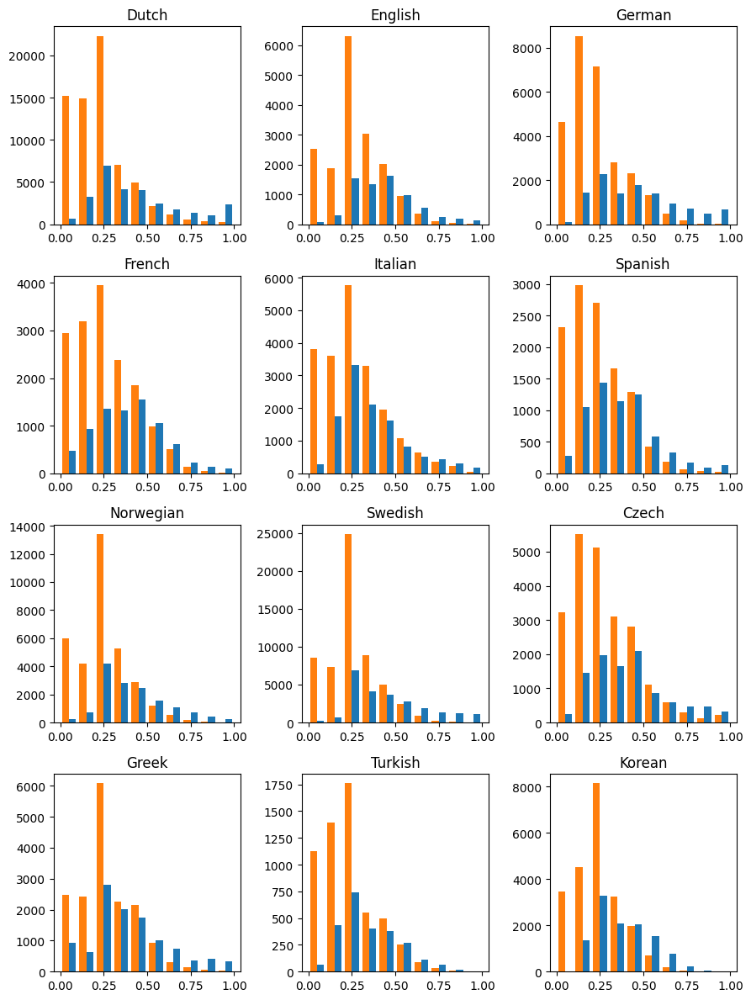

In [ ]:
#@title Histogram of FNN Probabilities on Left-Out Languages

loo_results_nohead = pd.read_csv(os.path.join(results_original, 'LOO_Results_Original_NoHead.csv'),
                                   index_col=['Model','Language']).sort_index()

fnn_df = loo_results_nohead[loo_results_nohead['Positions'] != 0]

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(9,12))
bins = [val/10 for val in range(11)]
colors = ['tab:orange', 'tab:blue']

for i, lang in enumerate(names):
  fnn_lang = fnn_df.loc['FNN', lang]

  fnn_true = fnn_lang[fnn_lang['Ground Truths']==1]['Probabilities']
  fnn_false = fnn_lang[fnn_lang['Ground Truths']==0]['Probabilities']

  j = i // 3
  k = i % 3

  axs[j,k].hist([fnn_false, fnn_true], bins=bins, label=['Syllable', 'Non-Syllable'], color=colors)
  axs[j,k].set_title(names[i])

handles, labels = axs[0,0].get_legend_handles_labels()
#fig.legend(handles, labels, loc='upper right')
fig.tight_layout()
plt.savefig('FNN LOO Histogram Original NoHead.png')
plt.show()

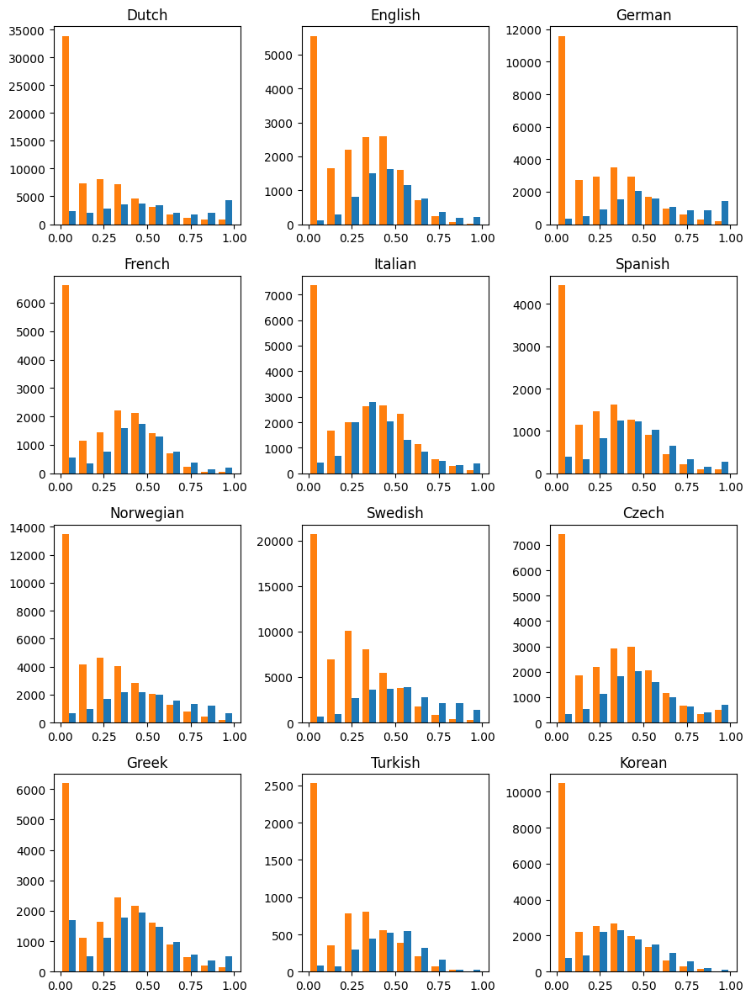

In [ ]:
#@title Histogram of CNN Probabilities on Left-Out Languages

loo_results_original = pd.read_csv(os.path.join(results_original, 'LOO_Results_Original.csv'),
                                   index_col=['Model','Language']).sort_index()

cnn_df = loo_results_nohead[loo_results_nohead['Positions'] != 0]

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(9,12))
bins = [val/10 for val in range(11)]
colors = ['tab:orange', 'tab:blue']

for i, lang in enumerate(names):
  cnn_lang = cnn_df.loc['CNN', lang]

  cnn_true = cnn_lang[cnn_lang['Ground Truths']==1]['Probabilities']
  cnn_false = cnn_lang[cnn_lang['Ground Truths']==0]['Probabilities']

  j = i // 3
  k = i % 3

  axs[j,k].hist([cnn_false, cnn_true], bins=bins, label=['Syllable', 'Non-Syllable'], color=colors)
  axs[j,k].set_title(names[i])

handles, labels = axs[0,0].get_legend_handles_labels()
#fig.legend(handles, labels, loc='upper right')
fig.tight_layout()
plt.savefig('CNN LOO Histogram Original NoHead.png')
plt.show()

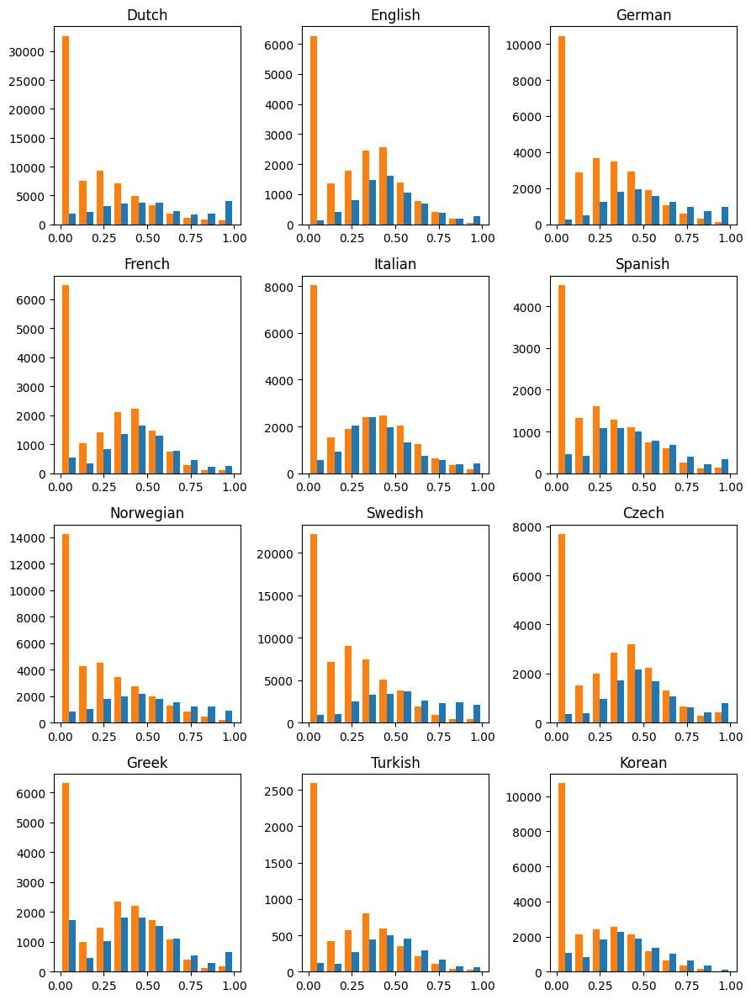

In [ ]:
#@title Histogram of LSTM Probabilities on Left-Out Languages

loo_results_original = pd.read_csv(os.path.join(results_original, 'LOO_Results_Original.csv'),
                                   index_col=['Model','Language']).sort_index()

lstm_df = loo_results_nohead[loo_results_nohead['Positions'] != 0]

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(9,12))
bins = [val/10 for val in range(11)]
colors = ['tab:orange', 'tab:blue']

for i, lang in enumerate(names):
  lstm_lang = lstm_df.loc['LSTM', lang]

  lstm_true = lstm_lang[lstm_lang['Ground Truths']==1]['Probabilities']
  lstm_false = lstm_lang[lstm_lang['Ground Truths']==0]['Probabilities']

  j = i // 3
  k = i % 3

  axs[j,k].hist([lstm_false, lstm_true], bins=bins, label=['Syllable', 'Non-Syllable'], color=colors)
  axs[j,k].set_title(names[i])

handles, labels = axs[0,0].get_legend_handles_labels()
#fig.legend(handles, labels, loc='upper right')
fig.tight_layout()
plt.savefig('LSTM LOO Histogram Original NoHead.png')
plt.show()

## Language Family Models

These models were trained in a LOO fashion, but instead of training on all but one language in the overall dataset, we split up languages into language families, specifically Germanic (Dutch, English, German), Romance (French, Italian, Spanish), and Nordic (Norwegian, Swedish). We trained on one or two languages in the family and tested on the left-out language. The purpose is to see if models trained on *similar* (but still not identical) languages outperform models trained on a larger swath of languages.

In [ ]:
#@title Average MCC

# MCC averaged across left-out family languages for each model.

germanic = [('Dutch', 'nl'), ('English', 'en'), ('German', 'de')]
romantic = [('French', 'fr'), ('Italian', 'it'), ('Spanish', 'es')]
nordic = [('Norwegian', 'no'), ('Swedish', 'sv')]
families = [('Germanic', germanic), ('Romantic', romantic), ('Nordic', nordic)]

# Saved to CSV and loaded below.
'''
mcc = []

for model in models:
  dataframes = []
  for family, family_list in families:
    for lang, id in family_list:
      lang_df = pd.read_csv(os.path.join(preds_original, 'Family', f'{family}_{lang}_{model}_Original.csv'))
      lang_df = lang_df[lang_df['Languages']==id]
      dataframes.append(lang_df)

  df = pd.concat(dataframes, axis=0)

  truths = [truth for truth in df['Ground Truths']]

  for t in thresholds:
    pred = [int(pred) for pred in df['Predictions'] > t]

    mcc.append(matthews_corrcoef(truths, pred))


index = pd.MultiIndex.from_product([models, thresholds], names=['Model', 'Threshold'])
family_average_original = pd.DataFrame({'MCC':mcc}, index=index).sort_index()

family_average_original.to_csv(os.path.join(results_original, 'Family_MCC_Average_Original.csv'))
'''
family_average_original = pd.read_csv(os.path.join(results_original, 'Family_MCC_Average_Original.csv'),
                                   index_col=['Model','Threshold'])

family_average_original

MCC
Model Threshold          
CNN   0.0        0.000000
      0.1        0.429363
      0.2        0.471532
      0.3        0.506100
      0.4        0.525520
      0.5        0.530048
      0.6        0.529679
      0.7        0.523637
      0.8        0.514923
      0.9        0.498766
      1.0        0.000000
FNN   0.0        0.000000
      0.1        0.266487
      0.2        0.362134
      0.3        0.440391
      0.4        0.484807
      0.5        0.507141
      0.6        0.514588
      0.7        0.510853
      0.8        0.499455
      0.9        0.485004
      1.0        0.000000
LSTM  0.0        0.000000
      0.1        0.425107
      0.2        0.466669
      0.3        0.502214
      0.4        0.519872
      0.5        0.526163
      0.6        0.523454
      0.7        0.517554
      0.8        0.510800
      0.9        0.493193
      1.0        0.000000

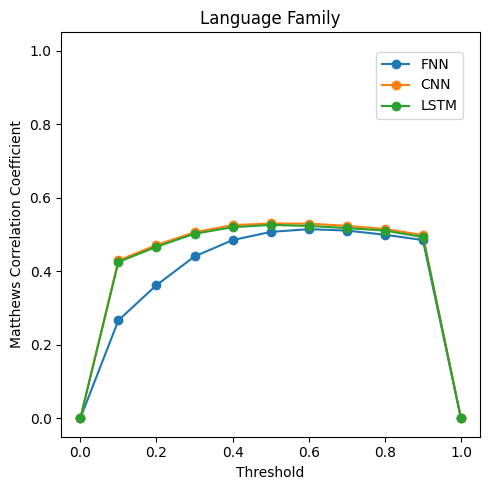

In [ ]:
#@title Plot Average MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, family_average_original.loc['FNN']['MCC'], label='FNN', marker='o')
axs.plot(thresholds, family_average_original.loc['CNN']['MCC'], label='CNN', marker='o')
axs.plot(thresholds, family_average_original.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('Language Family')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
plt.savefig('Family Average MCC Original.pdf')
plt.show()

In [ ]:
#@title MCC and F1

germanic = [('Dutch', 'nl'), ('English', 'en'), ('German', 'de')]
romantic = [('French', 'fr'), ('Italian', 'it'), ('Spanish', 'es')]
nordic = [('Norwegian', 'no'), ('Swedish', 'sv')]
families = [('Germanic', germanic), ('Romantic', romantic), ('Nordic', nordic)]

# Saved to CSV and loaded below.
'''
temp_metrics = []

for family, family_list in families:

  fnn_mcc = []
  cnn_mcc = []
  lstm_mcc = []

  fnn_f1 = []
  cnn_f1 = []
  lstm_f1 = []

  fnn_f1_neg = []
  cnn_f1_neg = []
  lstm_f1_neg = []

  fnn_f1_micro = []
  cnn_f1_micro = []
  lstm_f1_micro = []

  fnn_f1_macro = []
  cnn_f1_macro = []
  lstm_f1_macro = []

  for lang, id in family_list:

    fnn_df = pd.read_csv(os.path.join(preds_original, 'Family', f'{family}_{lang}_FNN_Original.csv'))
    cnn_df = pd.read_csv(os.path.join(preds_original, 'Family', f'{family}_{lang}_CNN_Original.csv'))
    lstm_df = pd.read_csv(os.path.join(preds_original, 'Family', f'{family}_{lang}_LSTM_Original.csv'))

    fnn_df = fnn_df[fnn_df['Languages']==id]
    cnn_df = cnn_df[cnn_df['Languages']==id]
    lstm_df = lstm_df[lstm_df['Languages']==id]

    assert (fnn_df['Ground Truths'] == cnn_df['Ground Truths']).all()
    assert (cnn_df['Ground Truths'] == lstm_df['Ground Truths']).all()

    truths = [truth for truth in fnn_df['Ground Truths']]

    for t in thresholds:
      fnn_pred = [int(pred) for pred in fnn_df['Predictions'] > t]
      cnn_pred = [int(pred) for pred in cnn_df['Predictions'] > t]
      lstm_pred = [int(pred) for pred in lstm_df['Predictions'] > t]

      fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
      cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
      lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

      fnn_f1.append(f1_score(truths, fnn_pred))
      cnn_f1.append(f1_score(truths, cnn_pred))
      lstm_f1.append(f1_score(truths, lstm_pred))

      fnn_f1_neg.append(f1_score(truths, fnn_pred, pos_label=0))
      cnn_f1_neg.append(f1_score(truths, cnn_pred, pos_label=0))
      lstm_f1_neg.append(f1_score(truths, lstm_pred, pos_label=0))

      fnn_f1_micro.append(f1_score(truths, fnn_pred, average='micro'))
      cnn_f1_micro.append(f1_score(truths, cnn_pred, average='micro'))
      lstm_f1_micro.append(f1_score(truths, lstm_pred, average='micro'))

      fnn_f1_macro.append(f1_score(truths, fnn_pred, average='macro'))
      cnn_f1_macro.append(f1_score(truths, cnn_pred, average='macro'))
      lstm_f1_macro.append(f1_score(truths, lstm_pred, average='macro'))

  mcc = fnn_mcc + cnn_mcc + lstm_mcc
  f1 = fnn_f1 + cnn_f1 + lstm_f1
  f1_neg = fnn_f1_neg + cnn_f1_neg + lstm_f1_neg
  f1_micro = fnn_f1_micro + cnn_f1_micro + lstm_f1_micro
  f1_macro = fnn_f1_macro + cnn_f1_macro + lstm_f1_macro

  index = pd.MultiIndex.from_product([[family], models, [lang[0] for lang in family_list], thresholds], names=['Family', 'Model','Language','Threshold'])
  temp_metrics.append(pd.DataFrame({'MCC':mcc, 'F1 Pos':f1, 'F1 Neg':f1_neg, 'F1 Micro':f1_micro, 'F1 Macro':f1_macro},
                                    index=index))

family_metrics_original = pd.concat(temp_metrics).sort_index()

family_metrics_original.to_csv(os.path.join(results_original, 'Family_Metrics_Original.csv'))
'''
family_metrics_original = pd.read_csv(os.path.join(results_original, 'Family_Metrics_Original.csv'),
                                      index_col=['Family','Model','Language','Threshold'])

family_metrics_original

MCC    F1 Pos    F1 Neg  F1 Micro  \
Family   Model Language Threshold                                           
Germanic CNN   Dutch    0.0        0.000000  0.535770  0.000000  0.365905   
                        0.1        0.438415  0.664036  0.630701  0.648157   
                        0.2        0.480743  0.690655  0.727263  0.710110   
                        0.3        0.526306  0.713343  0.799578  0.764094   
                        0.4        0.547691  0.715802  0.831628  0.788537   
...                                     ...       ...       ...       ...   
Romantic LSTM  Spanish  0.6        0.419735  0.629756  0.770999  0.717023   
                        0.7        0.427019  0.595455  0.781555  0.716301   
                        0.8        0.426115  0.549647  0.784512  0.708502   
                        0.9        0.427489  0.487765  0.784530  0.696659   
                        1.0        0.000000  0.000000  0.720108  0.562632   

                                   F1 Macro  
Family   Model Language Threshold            
Germanic CNN   Dutch    0.0        0.267885  
                        0.1        0.647369  
                        0.2        0.708959  
                        0.3        0.756460  
                        0.4        0.773715  
...                                     ...  
Romantic LSTM  Spanish  0.6        0.700377  
                        0.7        0.688505  
                        0.8        0.667079  
                        0.9        0.636147  
                        1.0        0.360054  

[264 rows x 5 columns]

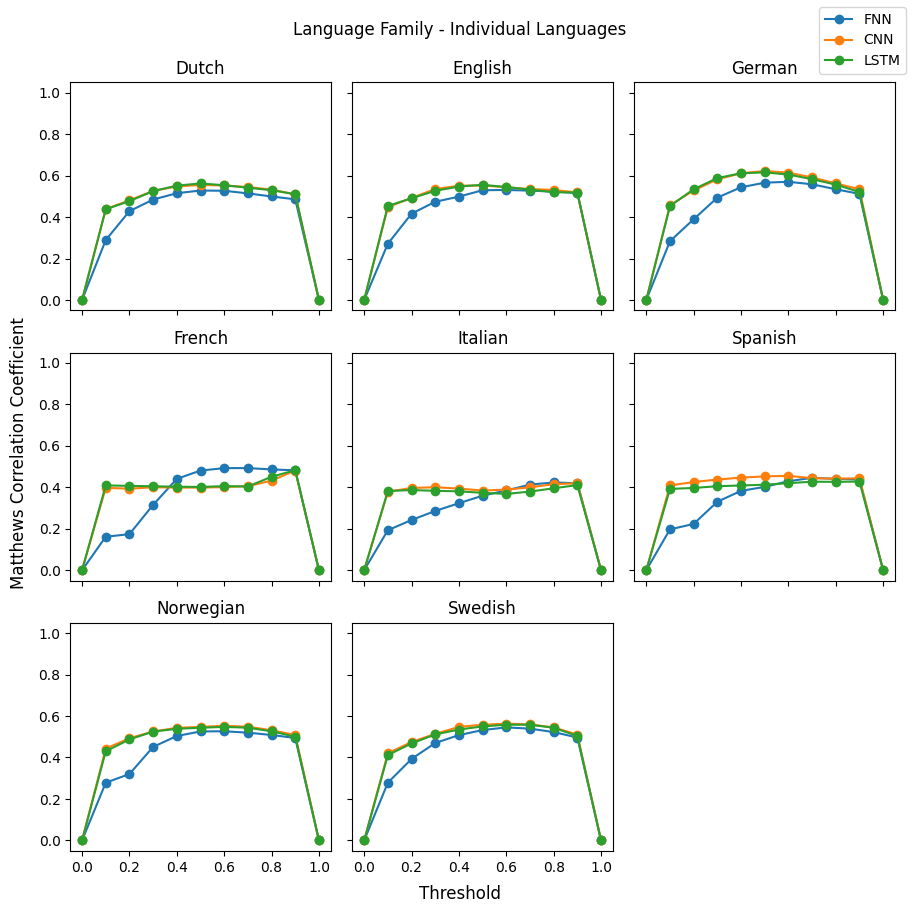

In [ ]:
#@title Plot MCC

fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(9,9))

for i, (family, family_list) in enumerate(families):
  for j, (lang, id) in enumerate(family_list):

    axs[i,j].plot(thresholds, family_metrics_original.loc[(family, 'FNN', lang), 'MCC'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, family_metrics_original.loc[(family, 'CNN', lang), 'MCC'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, family_metrics_original.loc[(family, 'LSTM', lang), 'MCC'], label='LSTM', marker='o')
    axs[i,j].set_title(lang)
    axs[i,j].set_ylim([-0.05,1.05])

axs[2,2].set_axis_off()

fig.suptitle("Language Family - Individual Languages")
fig.text(0.5, 0.01, 'Threshold', ha='center', va='center', fontsize=12)
fig.text(0.01, 0.5, 'Matthews Correlation Coefficient', ha='center', va='center', rotation='vertical', fontsize=12)
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout(rect=(0.015,0.015,1,0.99))
plt.savefig('Family MCC Original.pdf')
plt.show()

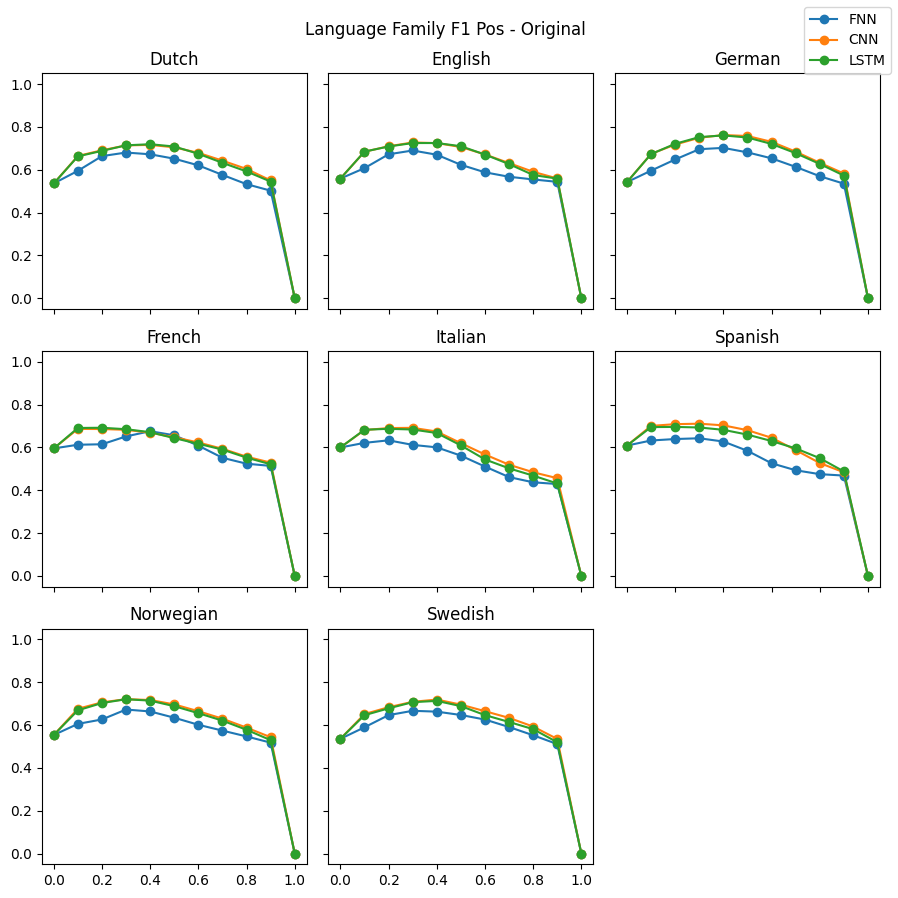

In [ ]:
#@title Plot F1 Pos

fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(9,9))

for i, (family, family_list) in enumerate(families):
  for j, (lang, id) in enumerate(family_list):

    axs[i,j].plot(thresholds, family_metrics_original.loc[(family, 'FNN', lang), 'F1 Pos'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, family_metrics_original.loc[(family, 'CNN', lang), 'F1 Pos'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, family_metrics_original.loc[(family, 'LSTM', lang), 'F1 Pos'], label='LSTM', marker='o')
    axs[i,j].set_title(lang)
    axs[i,j].set_ylim([-0.05,1.05])

axs[2,2].set_axis_off()

fig.suptitle("Language Family F1 Pos - Original")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Language Family F1 Pos Original.png')
plt.show()

### Without First Segment Prediction

In [ ]:
#@title Average MCC

# MCC averaged across left-out family languages for each model.

germanic = [('Dutch', 'nl'), ('English', 'en'), ('German', 'de')]
romantic = [('French', 'fr'), ('Italian', 'it'), ('Spanish', 'es')]
nordic = [('Norwegian', 'no'), ('Swedish', 'sv')]
families = [('Germanic', germanic), ('Romantic', romantic), ('Nordic', nordic)]

# Saved to CSV and loaded below.
'''
mcc = []

for model in models:
  dataframes = []
  for family, family_list in families:
    for lang, id in family_list:
      lang_df = pd.read_csv(os.path.join(preds_original, 'Family', f'{family}_{lang}_{model}_Original.csv'))
      lang_df = lang_df[lang_df['Languages']==id]
      dataframes.append(lang_df)

  df = pd.concat(dataframes, axis=0)
  df = df[df['Positions'] != 0]

  truths = [truth for truth in df['Ground Truths']]

  for t in thresholds:
    pred = [int(pred) for pred in df['Predictions'] > t]

    mcc.append(matthews_corrcoef(truths, pred))


index = pd.MultiIndex.from_product([models, thresholds], names=['Model', 'Threshold'])
family_average_nohead = pd.DataFrame({'MCC':mcc}, index=index).sort_index()

family_average_nohead.to_csv(os.path.join(results_original, 'Family_MCC_Average_Original_NoHead.csv'))
'''
family_average_nohead = pd.read_csv(os.path.join(results_original, 'Family_MCC_Average_Original_NoHead.csv'),
                                   index_col=['Model','Threshold'])

family_average_nohead

MCC
Model Threshold          
CNN   0.0        0.000000
      0.1        0.375414
      0.2        0.400047
      0.3        0.412876
      0.4        0.407863
      0.5        0.383665
      0.6        0.354852
      0.7        0.319965
      0.8        0.280742
      0.9        0.225102
      1.0        0.000000
FNN   0.0        0.000000
      0.1        0.228990
      0.2        0.281289
      0.3        0.310407
      0.4        0.322021
      0.5        0.314131
      0.6        0.295167
      0.7        0.263847
      0.8        0.223981
      0.9        0.177048
      1.0        0.000000
LSTM  0.0        0.000000
      0.1        0.372849
      0.2        0.396920
      0.3        0.409776
      0.4        0.401660
      0.5        0.376359
      0.6        0.340654
      0.7        0.305748
      0.8        0.268945
      0.9        0.207786
      1.0        0.000000

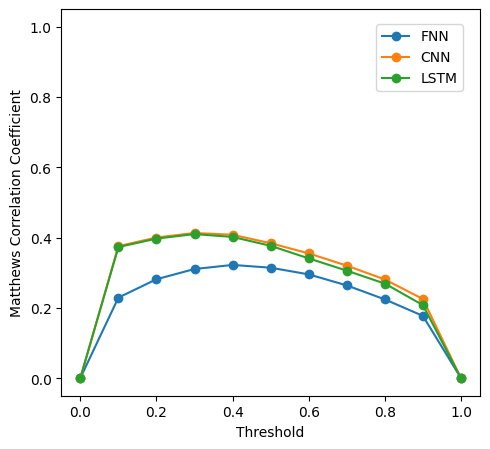

In [ ]:
#@title Plot Average MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,4.6))

axs.plot(thresholds, family_average_nohead.loc['FNN']['MCC'], label='FNN', marker='o')
axs.plot(thresholds, family_average_nohead.loc['CNN']['MCC'], label='CNN', marker='o')
axs.plot(thresholds, family_average_nohead.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
#axs.set_title('Language Family')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.95))
plt.tight_layout()
plt.savefig('Family Average MCC NoHead.pdf')
plt.show()

In [ ]:
#@title MCC and F1

germanic = [('Dutch', 'nl'), ('English', 'en'), ('German', 'de')]
romantic = [('French', 'fr'), ('Italian', 'it'), ('Spanish', 'es')]
nordic = [('Norwegian', 'no'), ('Swedish', 'sv')]
families = [('Germanic', germanic), ('Romantic', romantic), ('Nordic', nordic)]

# Saved to CSV and loaded below.
'''
temp_metrics = []

for family, family_list in families:

  fnn_mcc = []
  cnn_mcc = []
  lstm_mcc = []

  fnn_f1 = []
  cnn_f1 = []
  lstm_f1 = []

  fnn_f1_neg = []
  cnn_f1_neg = []
  lstm_f1_neg = []

  fnn_f1_micro = []
  cnn_f1_micro = []
  lstm_f1_micro = []

  fnn_f1_macro = []
  cnn_f1_macro = []
  lstm_f1_macro = []

  for lang, id in family_list:

    fnn_df = pd.read_csv(os.path.join(preds_original, 'Family', f'{family}_{lang}_FNN_Original.csv'))
    cnn_df = pd.read_csv(os.path.join(preds_original, 'Family', f'{family}_{lang}_CNN_Original.csv'))
    lstm_df = pd.read_csv(os.path.join(preds_original, 'Family', f'{family}_{lang}_LSTM_Original.csv'))

    fnn_df = fnn_df[fnn_df['Positions'] != 0]
    cnn_df = cnn_df[cnn_df['Positions'] != 0]
    lstm_df = lstm_df[lstm_df['Positions'] != 0]

    fnn_df = fnn_df[fnn_df['Languages']==id]
    cnn_df = cnn_df[cnn_df['Languages']==id]
    lstm_df = lstm_df[lstm_df['Languages']==id]

    assert (fnn_df['Ground Truths'] == cnn_df['Ground Truths']).all()
    assert (cnn_df['Ground Truths'] == lstm_df['Ground Truths']).all()

    truths = [truth for truth in fnn_df['Ground Truths']]

    for t in thresholds:
      fnn_pred = [int(pred) for pred in fnn_df['Predictions'] > t]
      cnn_pred = [int(pred) for pred in cnn_df['Predictions'] > t]
      lstm_pred = [int(pred) for pred in lstm_df['Predictions'] > t]

      fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
      cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
      lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

      fnn_f1.append(f1_score(truths, fnn_pred))
      cnn_f1.append(f1_score(truths, cnn_pred))
      lstm_f1.append(f1_score(truths, lstm_pred))

      fnn_f1_neg.append(f1_score(truths, fnn_pred, pos_label=0))
      cnn_f1_neg.append(f1_score(truths, cnn_pred, pos_label=0))
      lstm_f1_neg.append(f1_score(truths, lstm_pred, pos_label=0))

      fnn_f1_micro.append(f1_score(truths, fnn_pred, average='micro'))
      cnn_f1_micro.append(f1_score(truths, cnn_pred, average='micro'))
      lstm_f1_micro.append(f1_score(truths, lstm_pred, average='micro'))

      fnn_f1_macro.append(f1_score(truths, fnn_pred, average='macro'))
      cnn_f1_macro.append(f1_score(truths, cnn_pred, average='macro'))
      lstm_f1_macro.append(f1_score(truths, lstm_pred, average='macro'))

  mcc = fnn_mcc + cnn_mcc + lstm_mcc
  f1 = fnn_f1 + cnn_f1 + lstm_f1
  f1_neg = fnn_f1_neg + cnn_f1_neg + lstm_f1_neg
  f1_micro = fnn_f1_micro + cnn_f1_micro + lstm_f1_micro
  f1_macro = fnn_f1_macro + cnn_f1_macro + lstm_f1_macro

  index = pd.MultiIndex.from_product([[family], models, [lang[0] for lang in family_list], thresholds], names=['Family', 'Model','Language','Threshold'])
  temp_metrics.append(pd.DataFrame({'MCC':mcc, 'F1 Pos':f1, 'F1 Neg':f1_neg, 'F1 Micro':f1_micro, 'F1 Macro':f1_macro},
                                    index=index))

family_metrics_nohead = pd.concat(temp_metrics).sort_index()

family_metrics_nohead.to_csv(os.path.join(results_original, 'Family_Metrics_Original_NoHead.csv'))
'''
family_metrics_nohead = pd.read_csv(os.path.join(results_original, 'Family_Metrics_Original_NoHead.csv'),
                                      index_col=['Family','Model','Language','Threshold'])

family_metrics_nohead

MCC    F1 Pos    F1 Neg  F1 Micro  \
Family   Model Language Threshold                                           
Germanic CNN   Dutch    0.0        0.000000  0.448669  0.000000  0.289216   
                        0.1        0.381612  0.576846  0.630701  0.605604   
                        0.2        0.404372  0.598112  0.727263  0.675050   
                        0.3        0.428799  0.611465  0.799578  0.735563   
                        0.4        0.431706  0.599714  0.831628  0.762962   
...                                     ...       ...       ...       ...   
Romantic LSTM  Spanish  0.6        0.242811  0.445785  0.770999  0.675911   
                        0.7        0.218318  0.366140  0.781555  0.675084   
                        0.8        0.175317  0.259327  0.784512  0.666152   
                        0.9        0.103594  0.103826  0.784530  0.652589   
                        1.0        0.000000  0.000000  0.783731  0.644373   

                                   F1 Macro  
Family   Model Language Threshold            
Germanic CNN   Dutch    0.0        0.224335  
                        0.1        0.603774  
                        0.2        0.662688  
                        0.3        0.705521  
                        0.4        0.715671  
...                                     ...  
Romantic LSTM  Spanish  0.6        0.608392  
                        0.7        0.573847  
                        0.8        0.521920  
                        0.9        0.444178  
                        1.0        0.391866  

[264 rows x 5 columns]

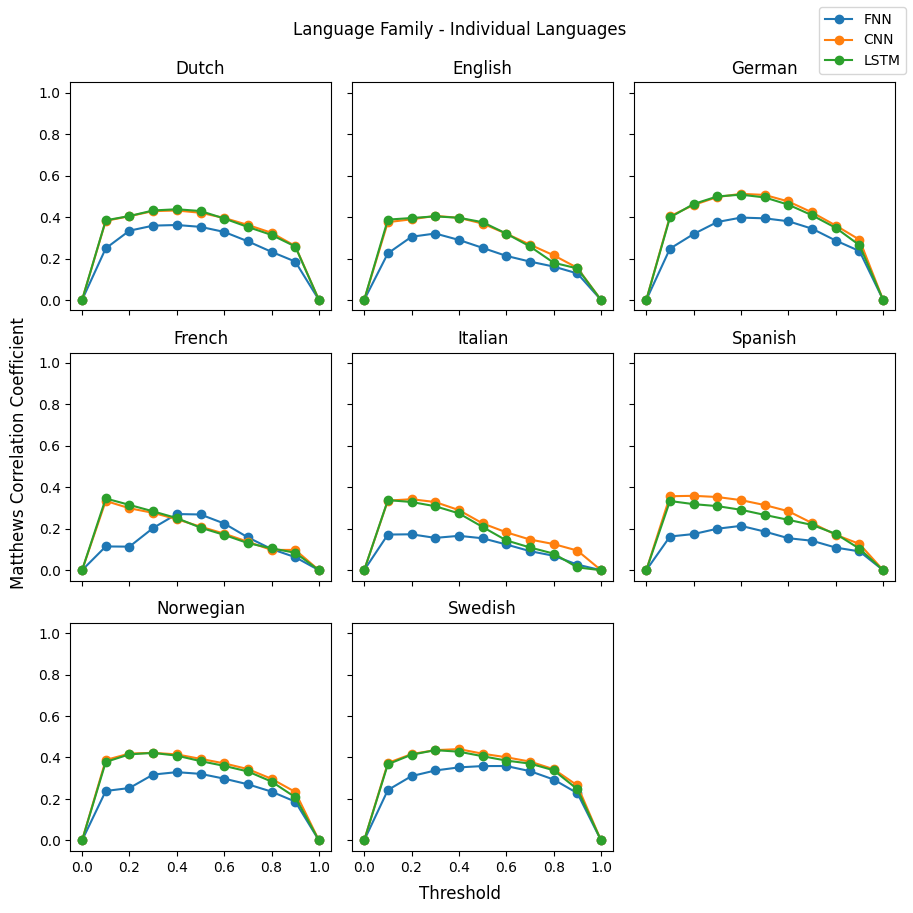

In [ ]:
#@title Plot MCC

fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(9,9))

for i, (family, family_list) in enumerate(families):
  for j, (lang, id) in enumerate(family_list):

    axs[i,j].plot(thresholds, family_metrics_nohead.loc[(family, 'FNN', lang), 'MCC'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, family_metrics_nohead.loc[(family, 'CNN', lang), 'MCC'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, family_metrics_nohead.loc[(family, 'LSTM', lang), 'MCC'], label='LSTM', marker='o')
    axs[i,j].set_title(lang)
    axs[i,j].set_ylim([-0.05,1.05])

axs[2,2].set_axis_off()

fig.suptitle("Language Family - Individual Languages")
fig.text(0.5, 0.01, 'Threshold', ha='center', va='center', fontsize=12)
fig.text(0.01, 0.5, 'Matthews Correlation Coefficient', ha='center', va='center', rotation='vertical', fontsize=12)
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout(rect=(0.015,0.015,1,0.99))
plt.savefig('Family MCC NoHead.pdf')
plt.show()

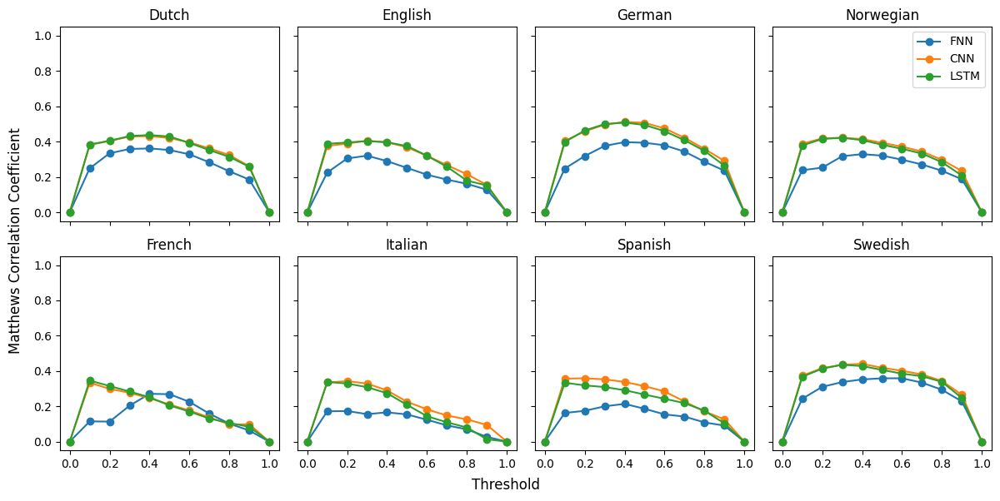

In [ ]:
#@title Plot MCC 3 x 4

new_families = [('Germanic','Dutch'),('Germanic','English'),('Germanic','German'),('Nordic','Norwegian'),
                ('Romantic','French'),('Romantic','Italian'),('Romantic','Spanish'),('Nordic','Swedish')]

fig, axs = plt.subplots(nrows=2, ncols=4, sharex=True, sharey=True, figsize=(12,6))

for i in range(2):
  for j in range(4):
    family = new_families[i*4+j][0]
    lang = new_families[i*4+j][1]
    axs[i,j].plot(thresholds, family_metrics_nohead.loc[(family, 'FNN', lang), 'MCC'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, family_metrics_nohead.loc[(family, 'CNN', lang), 'MCC'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, family_metrics_nohead.loc[(family, 'LSTM', lang), 'MCC'], label='LSTM', marker='o')
    axs[i,j].set_title(lang)
    axs[i,j].set_ylim([-0.05,1.05])

#fig.suptitle("Language Family - Individual Languages")
fig.text(0.5, 0.01, 'Threshold', ha='center', va='center', fontsize=12)
fig.text(0.01, 0.5, 'Matthews Correlation Coefficient', ha='center', va='center', rotation='vertical', fontsize=12)
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.985, 0.93))
plt.tight_layout(rect=(0.015,0.015,1,0.99))
plt.savefig('Family MCC NoHead 3x4.pdf')
plt.show()

In [ ]:
#@title Plot F1 Pos

fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(9,9))

for i, (family, family_list) in enumerate(families):
  for j, (lang, id) in enumerate(family_list):

    axs[i,j].plot(thresholds, family_metrics_nohead.loc[(family, 'FNN', lang), 'F1 Pos'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, family_metrics_nohead.loc[(family, 'CNN', lang), 'F1 Pos'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, family_metrics_nohead.loc[(family, 'LSTM', lang), 'F1 Pos'], label='LSTM', marker='o')
    axs[i,j].set_title(lang)
    axs[i,j].set_ylim([-0.05,1.05])

axs[2,2].set_axis_off()

fig.suptitle("Language Family F1 Pos - Original")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Language Family F1 Pos NoHead.png')
plt.show()

In [24]:
#@title Calculate MCC on Known Family Languages

# Saved to CSV and loaded below.

germanic = [('Dutch', 'nl'), ('English', 'en'), ('German', 'de')]
romantic = [('French', 'fr'), ('Italian', 'it'), ('Spanish', 'es')]
nordic = [('Norwegian', 'no'), ('Swedish', 'sv')]
families = [('Germanic', germanic), ('Romantic', romantic), ('Nordic', nordic)]
'''
temp_metrics = []

fine_thresholds = range(101)
fine_thresholds = [val/100 for val in fine_thresholds]

for (family, family_list) in families:
  family_codes = [id for (lang, id) in family_list]
  fnn_mcc = []
  cnn_mcc = []
  lstm_mcc = []
  for (lang, id) in family_list:

    fnn_df = pd.read_csv(os.path.join(preds_original, 'Family', f'{family}_{lang}_FNN_Original.csv'))
    cnn_df = pd.read_csv(os.path.join(preds_original, 'Family', f'{family}_{lang}_CNN_Original.csv'))
    lstm_df = pd.read_csv(os.path.join(preds_original, 'Family', f'{family}_{lang}_LSTM_Original.csv'))

    fnn_df = fnn_df[fnn_df['Positions'] != 0]
    cnn_df = cnn_df[cnn_df['Positions'] != 0]
    lstm_df = lstm_df[lstm_df['Positions'] != 0]

    fnn_df = fnn_df[fnn_df['Languages'].isin(family_codes)]
    cnn_df = cnn_df[cnn_df['Languages'].isin(family_codes)]
    lstm_df = lstm_df[lstm_df['Languages'].isin(family_codes)]

    fnn_df = fnn_df[fnn_df['Languages']!=id]
    cnn_df = cnn_df[cnn_df['Languages']!=id]
    lstm_df = lstm_df[lstm_df['Languages']!=id]

    assert (fnn_df['Ground Truths'] == cnn_df['Ground Truths']).all()
    assert (cnn_df['Ground Truths'] == lstm_df['Ground Truths']).all()

    truths = [truth for truth in fnn_df['Ground Truths']]

    for t in fine_thresholds:
      fnn_pred = [int(pred) for pred in fnn_df['Predictions'] > t]
      cnn_pred = [int(pred) for pred in cnn_df['Predictions'] > t]
      lstm_pred = [int(pred) for pred in lstm_df['Predictions'] > t]

      fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
      cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
      lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

  mcc = fnn_mcc + cnn_mcc + lstm_mcc

  index = pd.MultiIndex.from_product([[family], models, [lang[0] for lang in family_list], fine_thresholds], names=['Family', 'Model','Language','Threshold'])
  temp_metrics.append(pd.DataFrame({'MCC':mcc}, index=index))

family_mcc_nohead_known = pd.concat(temp_metrics).sort_index()

family_mcc_nohead_known.to_csv(os.path.join(results_original, 'Family_MCC_Original_KnownLanguages_NoHead.csv'))
'''
family_mcc_nohead_known = pd.read_csv(os.path.join(results_original, 'Family_MCC_Original_KnownLanguages_NoHead.csv'),
                                   index_col=['Family','Model','Language','Threshold'])

family_mcc_nohead_known

MCC
Family   Model Language Threshold          
Germanic CNN   Dutch    0.00       0.000000
                        0.01       0.345790
                        0.02       0.380454
                        0.03       0.392034
                        0.04       0.401554
...                                     ...
Romantic LSTM  Spanish  0.96       0.046621
                        0.97       0.042757
                        0.98       0.029940
                        0.99       0.000000
                        1.00       0.000000

[2424 rows x 1 columns]

In [23]:
family_mcc_nohead_known

MCC
Model Language Threshold          
CNN   Czech    0.00       0.000000
               0.01       0.270057
               0.02       0.324761
               0.03       0.350970
               0.04       0.367372
...                            ...
LSTM  Turkish  0.96       0.190093
               0.97       0.175951
               0.98       0.162611
               0.99       0.143162
               1.00       0.000000

[3636 rows x 1 columns]

In [32]:
#@title Save Best Language Family Thresholds on Known Family Languages

# Saved to CSV and loaded below.

germanic = [('Dutch', 'nl'), ('English', 'en'), ('German', 'de')]
romantic = [('French', 'fr'), ('Italian', 'it'), ('Spanish', 'es')]
nordic = [('Norwegian', 'no'), ('Swedish', 'sv')]
families = [('Germanic', germanic), ('Romantic', romantic), ('Nordic', nordic)]
'''
family_mcc_nohead_known = pd.read_csv(os.path.join(results_original, 'Family_MCC_Original_KnownLanguages_NoHead.csv'),
                                   index_col=['Family','Model','Language','Threshold'])
family_thresholds_nohead = {'FNN':dict(),'CNN':dict(),'LSTM':dict()}
for family, family_list in families:
  for model in models:
    for lang, id in family_list:
      family_thresholds_nohead[model][lang] = family_mcc_nohead_known.loc[family, model, lang].idxmax()['MCC']

with open(os.path.join(results_original, 'Family_Thresholds_NoHead'), 'w') as f:
    f.write(json.dumps(family_thresholds_nohead))
'''
with open(os.path.join(results_original, 'Family_Thresholds_NoHead')) as f:
  family_thresholds_nohead = json.loads(f.read())

In [29]:
all_thresholds_nohead

{'FNN': 0.36, 'CNN': 0.32, 'LSTM': 0.36}

In [30]:
loo_thresholds_nohead

{'FNN': {'Dutch': 0.35,
  'English': 0.38,
  'German': 0.38,
  'French': 0.36,
  'Italian': 0.36,
  'Spanish': 0.33,
  'Norwegian': 0.37,
  'Swedish': 0.36,
  'Czech': 0.38,
  'Greek': 0.39,
  'Turkish': 0.37,
  'Korean': 0.35},
 'CNN': {'Dutch': 0.29,
  'English': 0.33,
  'German': 0.35,
  'French': 0.34,
  'Italian': 0.37,
  'Spanish': 0.34,
  'Norwegian': 0.33,
  'Swedish': 0.37,
  'Czech': 0.35,
  'Greek': 0.35,
  'Turkish': 0.32,
  'Korean': 0.33},
 'LSTM': {'Dutch': 0.36,
  'English': 0.37,
  'German': 0.33,
  'French': 0.36,
  'Italian': 0.37,
  'Spanish': 0.35,
  'Norwegian': 0.37,
  'Swedish': 0.39,
  'Czech': 0.4,
  'Greek': 0.36,
  'Turkish': 0.34,
  'Korean': 0.34}}

In [33]:
family_thresholds_nohead

{'FNN': {'Dutch': 0.34,
  'English': 0.35,
  'German': 0.41,
  'French': 0.45,
  'Italian': 0.39,
  'Spanish': 0.37,
  'Norwegian': 0.43,
  'Swedish': 0.38},
 'CNN': {'Dutch': 0.41,
  'English': 0.41,
  'German': 0.36,
  'French': 0.41,
  'Italian': 0.31,
  'Spanish': 0.37,
  'Norwegian': 0.36,
  'Swedish': 0.4},
 'LSTM': {'Dutch': 0.41,
  'English': 0.38,
  'German': 0.41,
  'French': 0.37,
  'Italian': 0.29,
  'Spanish': 0.34,
  'Norwegian': 0.4,
  'Swedish': 0.37}}

# Uniform Size Datasets

The percentage of words from each language (in both Train and Test datasets) is set to a uniform value.

In [ ]:
results_uniform = '/content/drive/MyDrive/CompLing Projects/Voynich/Final/Results/Uniform'
preds_uniform = '/content/drive/MyDrive/CompLing Projects/Voynich/Final/Predictions/Uniform'

## All Language Models

In [ ]:
#@title MCC and F1

# Saved to CSV and loaded below
'''
fnn_preds = pd.read_csv(os.path.join(preds_uniform, 'All_Langs_FNN_7gram_15hidden_5layers_10epochs_Uniform.csv'))
cnn_preds = pd.read_csv(os.path.join(preds_uniform, 'All_Langs_CNN_7gram_15hidden_10layers_10epochs_Uniform.csv'))
lstm_preds = pd.read_csv(os.path.join(preds_uniform, 'All_Langs_LSTM_15hidden_10layers_bidirectional_10epochs_Uniform.csv'))

assert (fnn_preds['Ground Truths'] == cnn_preds['Ground Truths']).all()
assert (cnn_preds['Ground Truths'] == lstm_preds['Ground Truths']).all()

fnn_mcc = []
cnn_mcc = []
lstm_mcc = []

fnn_f1 = []
cnn_f1 = []
lstm_f1 = []

fnn_f1_neg = []
cnn_f1_neg = []
lstm_f1_neg = []

fnn_f1_micro = []
cnn_f1_micro = []
lstm_f1_micro = []

fnn_f1_macro = []
cnn_f1_macro = []
lstm_f1_macro = []

truths = [truth for truth in fnn_preds['Ground Truths']]
for t in thresholds:
  fnn_pred = [int(pred) for pred in fnn_preds['Predictions'] > t]
  cnn_pred = [int(pred) for pred in cnn_preds['Predictions'] > t]
  lstm_pred = [int(pred) for pred in lstm_preds['Predictions'] > t]

  fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
  cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
  lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

  fnn_f1.append(f1_score(truths, fnn_pred))
  cnn_f1.append(f1_score(truths, cnn_pred))
  lstm_f1.append(f1_score(truths, lstm_pred))

  fnn_f1_neg.append(f1_score(truths, fnn_pred, pos_label=0))
  cnn_f1_neg.append(f1_score(truths, cnn_pred, pos_label=0))
  lstm_f1_neg.append(f1_score(truths, lstm_pred, pos_label=0))

  fnn_f1_micro.append(f1_score(truths, fnn_pred, average='micro'))
  cnn_f1_micro.append(f1_score(truths, cnn_pred, average='micro'))
  lstm_f1_micro.append(f1_score(truths, lstm_pred, average='micro'))

  fnn_f1_macro.append(f1_score(truths, fnn_pred, average='macro'))
  cnn_f1_macro.append(f1_score(truths, cnn_pred, average='macro'))
  lstm_f1_macro.append(f1_score(truths, lstm_pred, average='macro'))

mcc = fnn_mcc + cnn_mcc + lstm_mcc
f1 = fnn_f1 + cnn_f1 + lstm_f1
f1_neg = fnn_f1_neg + cnn_f1_neg + lstm_f1_neg
f1_micro = fnn_f1_micro + cnn_f1_micro + lstm_f1_micro
f1_macro = fnn_f1_macro + cnn_f1_macro + lstm_f1_macro

index = pd.MultiIndex.from_product([models, thresholds], names=['Model', 'Threshold'])
all_metrics_uniform = pd.DataFrame({'MCC':mcc, 'F1 Pos':f1, 'F1 Neg':f1_neg, 'F1 Micro':f1_micro, 'F1 Macro':f1_macro},
                                    index=index).sort_index()

all_metrics_uniform.to_csv(os.path.join(results_uniform, 'All_Languages_Uniform.csv'))
'''
all_metrics_uniform = pd.read_csv(os.path.join(results_uniform, 'All_Languages_Uniform.csv'),
                                  index_col=['Model','Threshold'])

all_metrics_uniform

MCC    F1 Pos    F1 Neg  F1 Micro  F1 Macro
Model Threshold                                                  
CNN   0.0        0.000000  0.575703  0.000000  0.404201  0.287851
      0.1        0.410135  0.673551  0.528416  0.614181  0.600983
      0.2        0.459863  0.699489  0.626772  0.667055  0.663130
      0.3        0.496913  0.720927  0.718006  0.719474  0.719466
      0.4        0.517488  0.725108  0.784796  0.758587  0.754952
      0.5        0.532741  0.702440  0.823380  0.778333  0.762910
      0.6        0.529503  0.647709  0.831570  0.772100  0.739640
      0.7        0.515941  0.587654  0.827746  0.757003  0.707700
      0.8        0.498838  0.538710  0.821711  0.742822  0.680210
      0.9        0.480107  0.503819  0.815985  0.731533  0.659902
      1.0        0.000000  0.000000  0.746709  0.595799  0.373355
FNN   0.0        0.000000  0.575703  0.000000  0.404201  0.287851
      0.1        0.218453  0.605592  0.227558  0.477813  0.416575
      0.2        0.314129  0.640863  0.501525  0.582513  0.571194
      0.3        0.402622  0.672166  0.699818  0.686601  0.685992
      0.4        0.452979  0.668615  0.783813  0.738331  0.726214
      0.5        0.489444  0.627331  0.818582  0.755963  0.722956
      0.6        0.495570  0.578394  0.822298  0.749978  0.700346
      0.7        0.490732  0.535086  0.819796  0.740267  0.677441
      0.8        0.481202  0.509418  0.816512  0.732918  0.662965
      0.9        0.468511  0.487167  0.812806  0.725727  0.649987
      1.0        0.000000  0.000000  0.746709  0.595799  0.373355
LSTM  0.0        0.000000  0.575703  0.000000  0.404201  0.287851
      0.1        0.426440  0.680921  0.552657  0.627522  0.616789
      0.2        0.478477  0.708797  0.652765  0.683240  0.680781
      0.3        0.516107  0.730431  0.741469  0.736065  0.735950
      0.4        0.537666  0.731074  0.804894  0.773856  0.767984
      0.5        0.546000  0.698404  0.832086  0.784276  0.765245
      0.6        0.538840  0.643652  0.834750  0.774207  0.739201
      0.7        0.522995  0.589383  0.829547  0.759096  0.709465
      0.8        0.506099  0.547373  0.823717  0.746258  0.685545
      0.9        0.486635  0.513717  0.817835  0.734956  0.665776
      1.0        0.000000  0.000000  0.746709  0.595799  0.373355

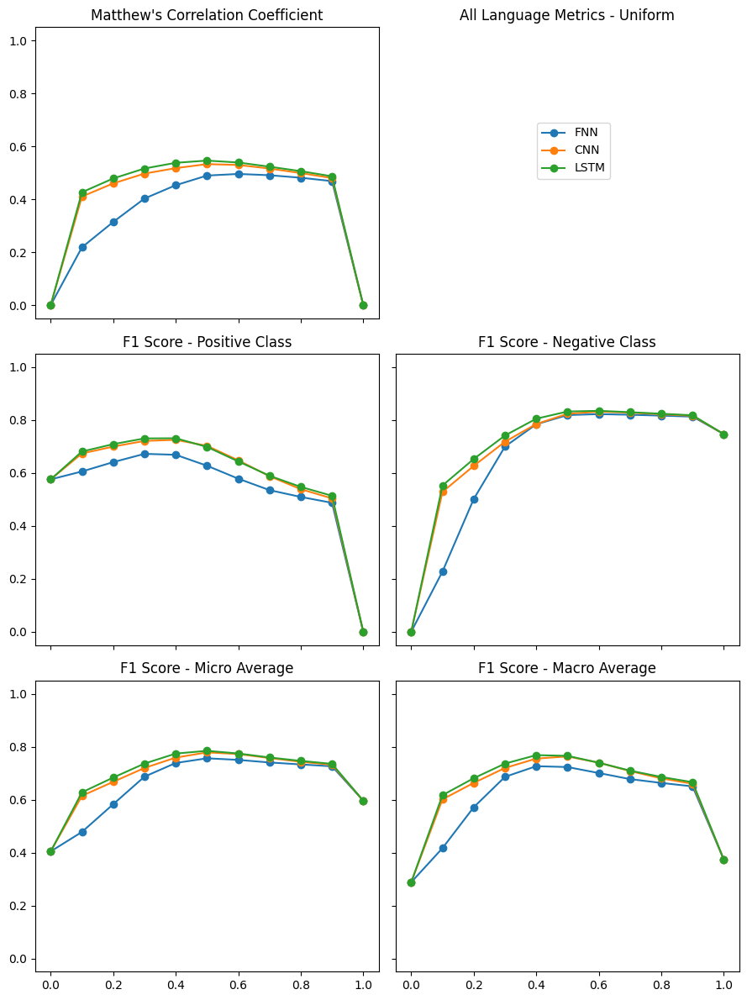

In [ ]:
#@title Plot Results

fig, axs = plt.subplots(nrows=3, ncols=2, sharex=True, sharey=True, figsize=(9,12))

axs[0,0].plot(thresholds, all_metrics_uniform.loc['FNN']['MCC'], label='FNN', marker='o')
axs[0,0].plot(thresholds, all_metrics_uniform.loc['CNN']['MCC'], label='CNN', marker='o')
axs[0,0].plot(thresholds, all_metrics_uniform.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs[0,0].set_title("Matthew's Correlation Coefficient")
axs[0,0].set_ylim([-0.05,1.05])

axs[0,1].set_axis_off()
axs[0,1].set_title("All Language Metrics - Uniform")

axs[1,0].plot(thresholds, all_metrics_uniform.loc['FNN']['F1 Pos'], label='FNN', marker='o')
axs[1,0].plot(thresholds, all_metrics_uniform.loc['CNN']['F1 Pos'], label='CNN', marker='o')
axs[1,0].plot(thresholds, all_metrics_uniform.loc['LSTM']['F1 Pos'], label='LSTM', marker='o')
axs[1,0].set_title("F1 Score - Positive Class")
axs[1,0].set_ylim([-0.05,1.05])

axs[1,1].plot(thresholds, all_metrics_uniform.loc['FNN']['F1 Neg'], label='FNN', marker='o')
axs[1,1].plot(thresholds, all_metrics_uniform.loc['CNN']['F1 Neg'], label='CNN', marker='o')
axs[1,1].plot(thresholds, all_metrics_uniform.loc['LSTM']['F1 Neg'], label='LSTM', marker='o')
axs[1,1].set_title("F1 Score - Negative Class")
axs[1,1].set_ylim([-0.05,1.05])

axs[2,0].plot(thresholds, all_metrics_uniform.loc['FNN']['F1 Micro'], label='FNN', marker='o')
axs[2,0].plot(thresholds, all_metrics_uniform.loc['CNN']['F1 Micro'], label='CNN', marker='o')
axs[2,0].plot(thresholds, all_metrics_uniform.loc['LSTM']['F1 Micro'], label='LSTM', marker='o')
axs[2,0].set_title("F1 Score - Micro Average")
axs[2,0].set_ylim([-0.05,1.05])

axs[2,1].plot(thresholds, all_metrics_uniform.loc['FNN']['F1 Macro'], label='FNN', marker='o')
axs[2,1].plot(thresholds, all_metrics_uniform.loc['CNN']['F1 Macro'], label='CNN', marker='o')
axs[2,1].plot(thresholds, all_metrics_uniform.loc['LSTM']['F1 Macro'], label='LSTM', marker='o')
axs[2,1].set_title("F1 Score - Macro Average")
axs[2,1].set_ylim([-0.05,1.05])

handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.82,0.88))
plt.tight_layout()
plt.savefig('All Languages Metrics Uniform.png')
plt.show()

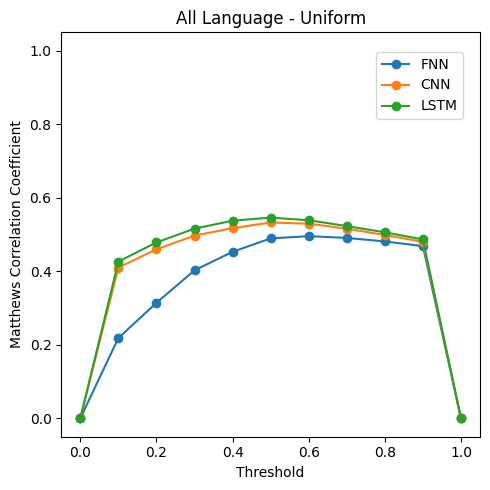

In [ ]:
#@title Plot MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, all_metrics_uniform.loc['FNN']['MCC'], label='FNN', marker='o')
axs.plot(thresholds, all_metrics_uniform.loc['CNN']['MCC'], label='CNN', marker='o')
axs.plot(thresholds, all_metrics_uniform.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language - Uniform')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
plt.savefig('All Average MCC Uniform.pdf')
plt.show()

### Without First Segment Prediction

In [ ]:
#@title MCC and F1

# Saved to CSV and loaded below
'''
fnn_preds = pd.read_csv(os.path.join(preds_uniform, 'All_Langs_FNN_7gram_15hidden_5layers_10epochs_Uniform.csv'))
cnn_preds = pd.read_csv(os.path.join(preds_uniform, 'All_Langs_CNN_7gram_15hidden_10layers_10epochs_Uniform.csv'))
lstm_preds = pd.read_csv(os.path.join(preds_uniform, 'All_Langs_LSTM_15hidden_10layers_bidirectional_10epochs_Uniform.csv'))

fnn_preds = fnn_preds[fnn_preds['Positions'] != 0]
cnn_preds = cnn_preds[cnn_preds['Positions'] != 0]
lstm_preds = lstm_preds[lstm_preds['Positions'] != 0]

assert (fnn_preds['Ground Truths'] == cnn_preds['Ground Truths']).all()
assert (cnn_preds['Ground Truths'] == lstm_preds['Ground Truths']).all()

fnn_mcc = []
cnn_mcc = []
lstm_mcc = []

fnn_f1 = []
cnn_f1 = []
lstm_f1 = []

fnn_f1_neg = []
cnn_f1_neg = []
lstm_f1_neg = []

fnn_f1_micro = []
cnn_f1_micro = []
lstm_f1_micro = []

fnn_f1_macro = []
cnn_f1_macro = []
lstm_f1_macro = []

truths = [truth for truth in fnn_preds['Ground Truths']]
for t in thresholds:
  fnn_pred = [int(pred) for pred in fnn_preds['Predictions'] > t]
  cnn_pred = [int(pred) for pred in cnn_preds['Predictions'] > t]
  lstm_pred = [int(pred) for pred in lstm_preds['Predictions'] > t]

  fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
  cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
  lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

  fnn_f1.append(f1_score(truths, fnn_pred))
  cnn_f1.append(f1_score(truths, cnn_pred))
  lstm_f1.append(f1_score(truths, lstm_pred))

  fnn_f1_neg.append(f1_score(truths, fnn_pred, pos_label=0))
  cnn_f1_neg.append(f1_score(truths, cnn_pred, pos_label=0))
  lstm_f1_neg.append(f1_score(truths, lstm_pred, pos_label=0))

  fnn_f1_micro.append(f1_score(truths, fnn_pred, average='micro'))
  cnn_f1_micro.append(f1_score(truths, cnn_pred, average='micro'))
  lstm_f1_micro.append(f1_score(truths, lstm_pred, average='micro'))

  fnn_f1_macro.append(f1_score(truths, fnn_pred, average='macro'))
  cnn_f1_macro.append(f1_score(truths, cnn_pred, average='macro'))
  lstm_f1_macro.append(f1_score(truths, lstm_pred, average='macro'))

mcc = fnn_mcc + cnn_mcc + lstm_mcc
f1 = fnn_f1 + cnn_f1 + lstm_f1
f1_neg = fnn_f1_neg + cnn_f1_neg + lstm_f1_neg
f1_micro = fnn_f1_micro + cnn_f1_micro + lstm_f1_micro
f1_macro = fnn_f1_macro + cnn_f1_macro + lstm_f1_macro

index = pd.MultiIndex.from_product([models, thresholds], names=['Model', 'Threshold'])
all_metrics_uniform_nohead = pd.DataFrame({'MCC':mcc, 'F1 Pos':f1, 'F1 Neg':f1_neg, 'F1 Micro':f1_micro, 'F1 Macro':f1_macro},
                                    index=index).sort_index()

all_metrics_uniform_nohead.to_csv(os.path.join(results_uniform, 'All_Languages_Uniform_NoHead.csv'))
'''
all_metrics_uniform_nohead = pd.read_csv(os.path.join(results_uniform, 'All_Languages_Uniform_NoHead.csv'),
                                  index_col=['Model','Threshold'])

all_metrics_uniform_nohead

MCC    F1 Pos    F1 Neg  F1 Micro  F1 Macro
Model Threshold                                                  
CNN   0.0        0.000000  0.484719  0.000000  0.319887  0.242359
      0.1        0.365225  0.586884  0.528416  0.559582  0.557650
      0.2        0.403828  0.612849  0.626772  0.619938  0.619810
      0.3        0.421501  0.629553  0.718006  0.679775  0.673779
      0.4        0.411986  0.616968  0.784796  0.724423  0.700882
      0.5        0.387493  0.553996  0.823380  0.746963  0.688688
      0.6        0.340024  0.428828  0.831579  0.739864  0.630203
      0.7        0.284647  0.288222  0.827755  0.722631  0.557988
      0.8        0.228731  0.169340  0.821719  0.706443  0.495529
      0.9        0.166834  0.084207  0.815992  0.693557  0.450099
      1.0        0.000000  0.000000  0.809604  0.680113  0.404802
FNN   0.0        0.000000  0.484719  0.000000  0.319887  0.242359
      0.1        0.189697  0.514712  0.227558  0.403915  0.371135
      0.2        0.249763  0.543495  0.501525  0.523433  0.522510
      0.3        0.296048  0.557363  0.699818  0.642250  0.628590
      0.4        0.301498  0.516930  0.783813  0.701301  0.650371
      0.5        0.284688  0.400244  0.818582  0.721428  0.609413
      0.6        0.250366  0.275467  0.822298  0.714596  0.548883
      0.7        0.210163  0.164110  0.819796  0.703510  0.491953
      0.8        0.172331  0.099147  0.816512  0.695122  0.457829
      0.9        0.117777  0.043934  0.812806  0.686914  0.428370
      1.0        0.000000  0.000000  0.809604  0.680113  0.404802
LSTM  0.0        0.000000  0.484719  0.000000  0.319887  0.242359
      0.1        0.380207  0.594873  0.552657  0.574810  0.573765
      0.2        0.420452  0.622825  0.652765  0.638413  0.637795
      0.3        0.437602  0.639017  0.741469  0.698715  0.690243
      0.4        0.425868  0.618628  0.804894  0.741853  0.711761
      0.5        0.393838  0.538391  0.832086  0.753748  0.685239
      0.6        0.347559  0.414571  0.834750  0.742254  0.624661
      0.7        0.296056  0.288834  0.829547  0.725005  0.559190
      0.8        0.247389  0.188431  0.823717  0.710350  0.506074
      0.9        0.189338  0.107889  0.817835  0.697449  0.462862
      1.0        0.000000  0.000000  0.809604  0.680113  0.404802

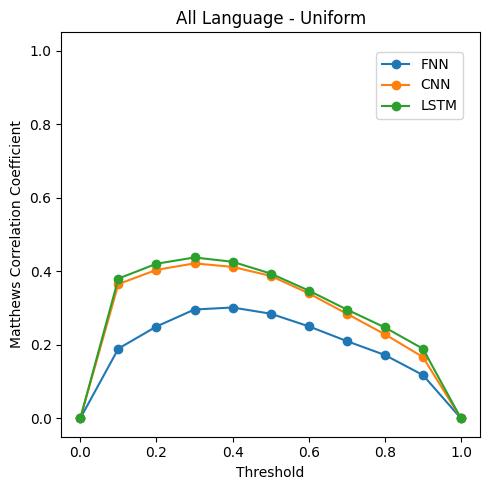

In [ ]:
#@title Plot MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, all_metrics_uniform_nohead.loc['FNN']['MCC'], label='FNN', marker='o')
axs.plot(thresholds, all_metrics_uniform_nohead.loc['CNN']['MCC'], label='CNN', marker='o')
axs.plot(thresholds, all_metrics_uniform_nohead.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language - Uniform')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
plt.savefig('All Average MCC Uniform NoHead.pdf')
plt.show()

## All Language Models (Individual Language Results)

In [ ]:
#@title MCC and F1

# Saved to CSV and loaded below.
'''
fnn_preds = pd.read_csv(os.path.join(preds_uniform, 'All_Langs_FNN_7gram_15hidden_5layers_10epochs_Uniform.csv'))
cnn_preds = pd.read_csv(os.path.join(preds_uniform, 'All_Langs_CNN_7gram_15hidden_10layers_10epochs_Uniform.csv'))
lstm_preds = pd.read_csv(os.path.join(preds_uniform, 'All_Langs_LSTM_15hidden_10layers_bidirectional_10epochs_Uniform.csv'))

assert (fnn_preds['Ground Truths'] == cnn_preds['Ground Truths']).all()
assert (cnn_preds['Ground Truths'] == lstm_preds['Ground Truths']).all()

fnn_mcc = []
cnn_mcc = []
lstm_mcc = []

fnn_f1 = []
cnn_f1 = []
lstm_f1 = []

fnn_f1_neg = []
cnn_f1_neg = []
lstm_f1_neg = []

fnn_f1_micro = []
cnn_f1_micro = []
lstm_f1_micro = []

fnn_f1_macro = []
cnn_f1_macro = []
lstm_f1_macro = []

for i, lang in enumerate(codes):

  fnn_df = fnn_preds[fnn_preds['Languages'] == lang]
  cnn_df = cnn_preds[cnn_preds['Languages'] == lang]
  lstm_df = lstm_preds[lstm_preds['Languages'] == lang]

  truths = [truth for truth in fnn_df['Ground Truths']]

  for t in thresholds:
    fnn_pred = [int(pred) for pred in fnn_df['Predictions'] > t]
    cnn_pred = [int(pred) for pred in cnn_df['Predictions'] > t]
    lstm_pred = [int(pred) for pred in lstm_df['Predictions'] > t]

    fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
    cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
    lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

    fnn_f1.append(f1_score(truths, fnn_pred))
    cnn_f1.append(f1_score(truths, cnn_pred))
    lstm_f1.append(f1_score(truths, lstm_pred))

    fnn_f1_neg.append(f1_score(truths, fnn_pred, pos_label=0))
    cnn_f1_neg.append(f1_score(truths, cnn_pred, pos_label=0))
    lstm_f1_neg.append(f1_score(truths, lstm_pred, pos_label=0))

    fnn_f1_micro.append(f1_score(truths, fnn_pred, average='micro'))
    cnn_f1_micro.append(f1_score(truths, cnn_pred, average='micro'))
    lstm_f1_micro.append(f1_score(truths, lstm_pred, average='micro'))

    fnn_f1_macro.append(f1_score(truths, fnn_pred, average='macro'))
    cnn_f1_macro.append(f1_score(truths, cnn_pred, average='macro'))
    lstm_f1_macro.append(f1_score(truths, lstm_pred, average='macro'))

mcc = fnn_mcc + cnn_mcc + lstm_mcc
f1 = fnn_f1 + cnn_f1 + lstm_f1
f1_neg = fnn_f1_neg + cnn_f1_neg + lstm_f1_neg
f1_micro = fnn_f1_micro + cnn_f1_micro + lstm_f1_micro
f1_macro = fnn_f1_macro + cnn_f1_macro + lstm_f1_macro

index = pd.MultiIndex.from_product([models, names, thresholds], names=['Model', 'Language', 'Threshold'])
lang_metrics_uniform = pd.DataFrame({'MCC':mcc, 'F1 Pos':f1, 'F1 Neg':f1_neg, 'F1 Micro':f1_micro, 'F1 Macro':f1_macro},
                                     index=index).sort_index()

lang_metrics_uniform.to_csv(os.path.join(results_uniform, 'Individual_Language_Uniform.csv'))
'''
lang_metrics_uniform = pd.read_csv(os.path.join(results_uniform, 'Individual_Language_Uniform.csv'),
                                   index_col=['Model','Language','Threshold'])

lang_metrics_uniform

MCC    F1 Pos    F1 Neg  F1 Micro  F1 Macro
Model Language Threshold                                                  
CNN   Czech    0.0        0.000000  0.568363  0.000000  0.397003  0.284182
               0.1        0.392738  0.658832  0.489323  0.590942  0.574077
               0.2        0.424889  0.677227  0.575309  0.633217  0.626268
               0.3        0.433513  0.686113  0.653121  0.670441  0.669617
               0.4        0.414031  0.669896  0.725496  0.700253  0.697696
...                            ...       ...       ...       ...       ...
LSTM  Turkish  0.6        0.642399  0.752726  0.863909  0.824440  0.808318
               0.7        0.591131  0.673863  0.846639  0.791379  0.760251
               0.8        0.540002  0.586195  0.828897  0.757899  0.707546
               0.9        0.522848  0.561691  0.823538  0.748378  0.692615
               1.0        0.000000  0.000000  0.739881  0.587152  0.369941

[396 rows x 5 columns]

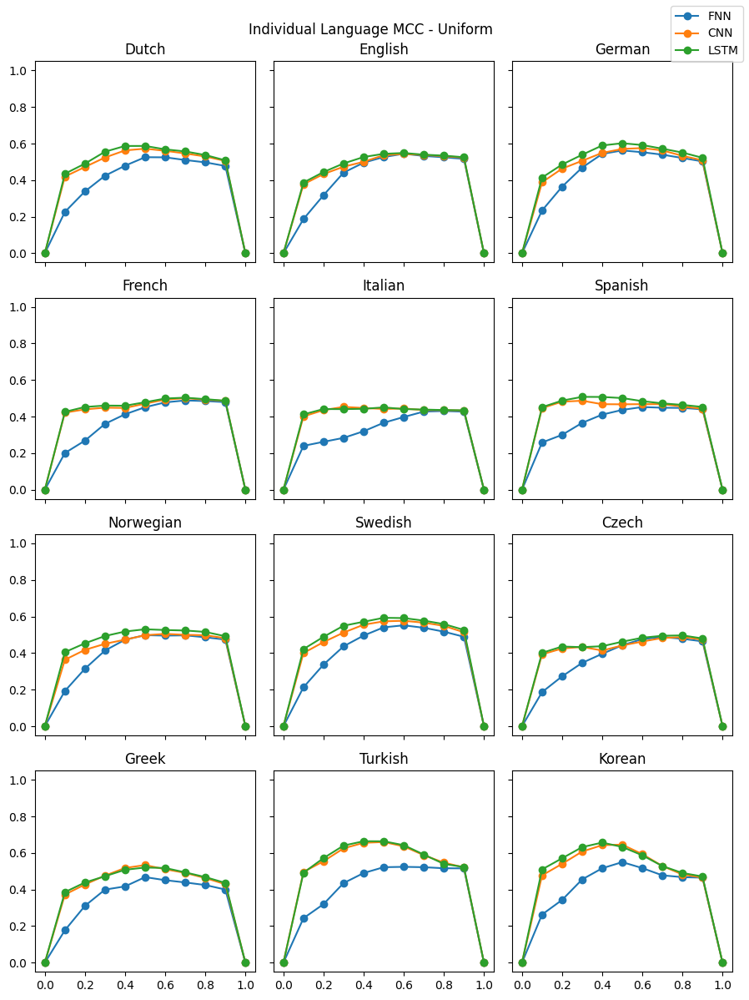

In [ ]:
#@title Plot MCC

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_uniform.loc[('FNN', names[k]), 'MCC'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_uniform.loc[('CNN', names[k]), 'MCC'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_uniform.loc[('LSTM',names[k]), 'MCC'], label='LSTM', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Individual Language MCC - Uniform")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Individual Language MCC Uniform.png')
plt.show()

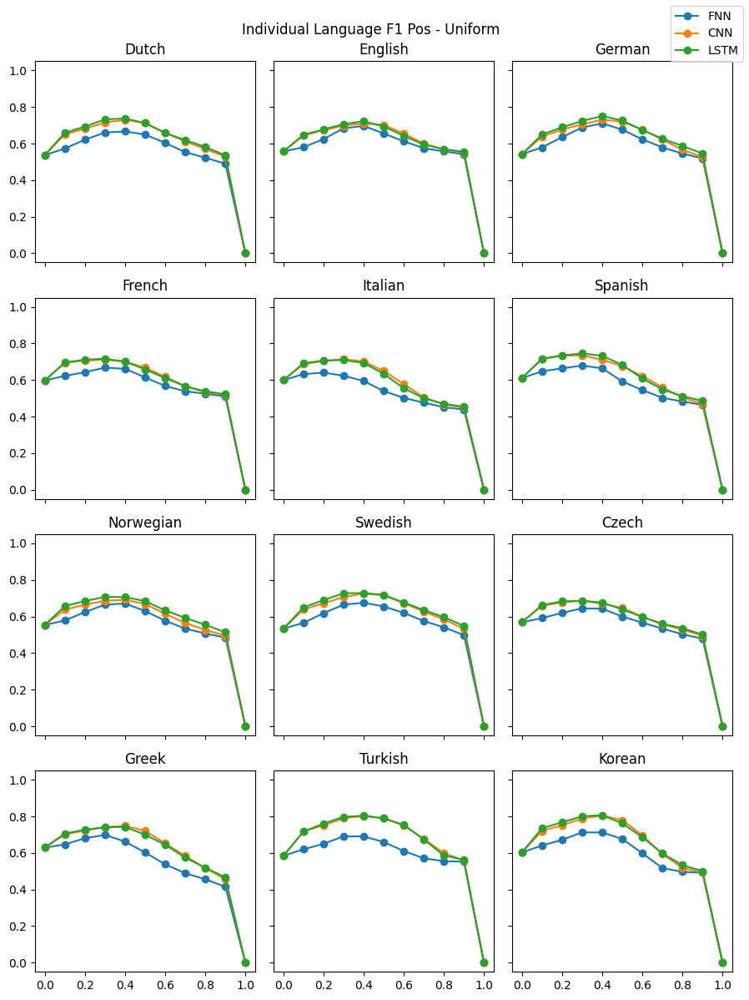

In [ ]:
#@title Plot F1 Pos

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_uniform.loc[('FNN', names[k]), 'F1 Pos'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_uniform.loc[('CNN', names[k]), 'F1 Pos'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_uniform.loc[('LSTM',names[k]), 'F1 Pos'], label='LSTM', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Individual Language F1 Pos - Uniform")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Individual Language F1 Pos Uniform.png')
plt.show()

### Without First Segment Prediction

In [ ]:
#@title MCC and F1

# Saved to CSV and loaded below.
'''
fnn_preds = pd.read_csv(os.path.join(preds_uniform, 'All_Langs_FNN_7gram_15hidden_5layers_10epochs_Uniform.csv'))
cnn_preds = pd.read_csv(os.path.join(preds_uniform, 'All_Langs_CNN_7gram_15hidden_10layers_10epochs_Uniform.csv'))
lstm_preds = pd.read_csv(os.path.join(preds_uniform, 'All_Langs_LSTM_15hidden_10layers_bidirectional_10epochs_Uniform.csv'))

fnn_preds = fnn_preds[fnn_preds['Positions'] != 0]
cnn_preds = cnn_preds[cnn_preds['Positions'] != 0]
lstm_preds = lstm_preds[lstm_preds['Positions'] != 0]

assert (fnn_preds['Ground Truths'] == cnn_preds['Ground Truths']).all()
assert (cnn_preds['Ground Truths'] == lstm_preds['Ground Truths']).all()

fnn_mcc = []
cnn_mcc = []
lstm_mcc = []

fnn_f1 = []
cnn_f1 = []
lstm_f1 = []

fnn_f1_neg = []
cnn_f1_neg = []
lstm_f1_neg = []

fnn_f1_micro = []
cnn_f1_micro = []
lstm_f1_micro = []

fnn_f1_macro = []
cnn_f1_macro = []
lstm_f1_macro = []

for i, lang in enumerate(codes):

  fnn_df = fnn_preds[fnn_preds['Languages'] == lang]
  cnn_df = cnn_preds[cnn_preds['Languages'] == lang]
  lstm_df = lstm_preds[lstm_preds['Languages'] == lang]

  truths = [truth for truth in fnn_df['Ground Truths']]

  for t in thresholds:
    fnn_pred = [int(pred) for pred in fnn_df['Predictions'] > t]
    cnn_pred = [int(pred) for pred in cnn_df['Predictions'] > t]
    lstm_pred = [int(pred) for pred in lstm_df['Predictions'] > t]

    fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
    cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
    lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

    fnn_f1.append(f1_score(truths, fnn_pred))
    cnn_f1.append(f1_score(truths, cnn_pred))
    lstm_f1.append(f1_score(truths, lstm_pred))

    fnn_f1_neg.append(f1_score(truths, fnn_pred, pos_label=0))
    cnn_f1_neg.append(f1_score(truths, cnn_pred, pos_label=0))
    lstm_f1_neg.append(f1_score(truths, lstm_pred, pos_label=0))

    fnn_f1_micro.append(f1_score(truths, fnn_pred, average='micro'))
    cnn_f1_micro.append(f1_score(truths, cnn_pred, average='micro'))
    lstm_f1_micro.append(f1_score(truths, lstm_pred, average='micro'))

    fnn_f1_macro.append(f1_score(truths, fnn_pred, average='macro'))
    cnn_f1_macro.append(f1_score(truths, cnn_pred, average='macro'))
    lstm_f1_macro.append(f1_score(truths, lstm_pred, average='macro'))

mcc = fnn_mcc + cnn_mcc + lstm_mcc
f1 = fnn_f1 + cnn_f1 + lstm_f1
f1_neg = fnn_f1_neg + cnn_f1_neg + lstm_f1_neg
f1_micro = fnn_f1_micro + cnn_f1_micro + lstm_f1_micro
f1_macro = fnn_f1_macro + cnn_f1_macro + lstm_f1_macro

index = pd.MultiIndex.from_product([models, names, thresholds], names=['Model', 'Language', 'Threshold'])
lang_metrics_uniform_nohead = pd.DataFrame({'MCC':mcc, 'F1 Pos':f1, 'F1 Neg':f1_neg, 'F1 Micro':f1_micro, 'F1 Macro':f1_macro},
                                     index=index).sort_index()

lang_metrics_uniform_nohead.to_csv(os.path.join(results_uniform, 'Individual_Language_Uniform_NoHead.csv'))
'''
lang_metrics_uniform_nohead = pd.read_csv(os.path.join(results_uniform, 'Individual_Language_Uniform_NoHead.csv'),
                                   index_col=['Model','Language','Threshold'])

lang_metrics_uniform_nohead

MCC    F1 Pos    F1 Neg  F1 Micro  F1 Macro
Model Language Threshold                                                  
CNN   Czech    0.0        0.000000  0.476857  0.000000  0.313074  0.238428
               0.1        0.352384  0.571502  0.489323  0.534008  0.530412
               0.2        0.373039  0.588805  0.575309  0.582166  0.582057
               0.3        0.360951  0.590900  0.653121  0.624571  0.622010
               0.4        0.297828  0.548355  0.725496  0.658532  0.636926
...                            ...       ...       ...       ...       ...
LSTM  Turkish  0.6        0.469176  0.556788  0.863909  0.791760  0.710349
               0.7        0.349685  0.359666  0.846639  0.752544  0.603153
               0.8        0.191596  0.107253  0.828897  0.712832  0.468075
               0.9        0.108322  0.032971  0.823538  0.701539  0.428255
               1.0        0.000000  0.000000  0.821068  0.696451  0.410534

[396 rows x 5 columns]

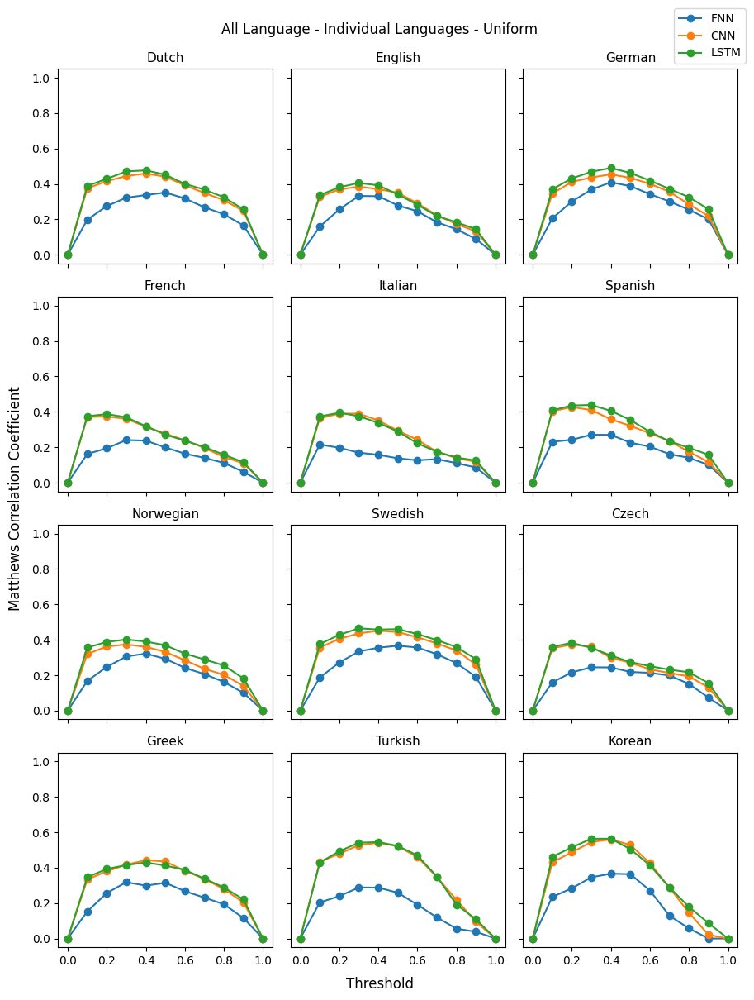

In [ ]:
#@title Plot MCC

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_uniform_nohead.loc[('FNN', names[k]), 'MCC'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_uniform_nohead.loc[('CNN', names[k]), 'MCC'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_uniform_nohead.loc[('LSTM',names[k]), 'MCC'], label='LSTM', marker='o')
    axs[i,j].set_title(names[k],fontsize=11)
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("All Language - Individual Languages - Uniform")
fig.text(0.5, 0.01, 'Threshold', ha='center', va='center', fontsize=12)
fig.text(0.01, 0.5, 'Matthews Correlation Coefficient', ha='center', va='center', rotation='vertical', fontsize=12)
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1, 1))
plt.tight_layout(rect=(0.015,0.015,1,0.99))
plt.savefig('Individual Language MCC Uniform NoHead.pdf')
plt.show()

## Leave One Out Models

In [ ]:
#@title Average MCC

# MCC averaged across left-out languages for each model.

# Saved to CSV and loaded below.

mcc = []

for model in models:
  dataframes = []
  for i, lang in enumerate(names):
    lang_df = pd.read_csv(os.path.join(preds_uniform, 'LOO', f'LOO_{lang}_{model}_Uniform.csv'))
    lang_df = lang_df[lang_df['Languages']==codes[i]]
    dataframes.append(lang_df)

  df = pd.concat(dataframes, axis=0)

  truths = [truth for truth in df['Ground Truths']]

  for t in thresholds:
    pred = [int(pred) for pred in df['Predictions'] > t]

    mcc.append(matthews_corrcoef(truths, pred))


index = pd.MultiIndex.from_product([models, thresholds], names=['Model', 'Threshold'])
loo_average_uniform = pd.DataFrame({'MCC':mcc}, index=index).sort_index()

loo_average_uniform.to_csv(os.path.join(results_uniform, 'LOO_MCC_Average_Uniform.csv'))

loo_average_uniform = pd.read_csv(os.path.join(results_uniform, 'LOO_MCC_Average_Uniform.csv'),
                                   index_col=['Model','Threshold'])

loo_average_uniform

MCC
Model Threshold          
CNN   0.0        0.000000
      0.1        0.401876
      0.2        0.437027
      0.3        0.454811
      0.4        0.461449
      0.5        0.466416
      0.6        0.481721
      0.7        0.486349
      0.8        0.483377
      0.9        0.474860
      1.0        0.000000
FNN   0.0        0.000000
      0.1        0.219574
      0.2        0.282822
      0.3        0.399675
      0.4        0.443341
      0.5        0.475035
      0.6        0.485203
      0.7        0.482613
      0.8        0.475588
      0.9        0.466806
      1.0        0.000000
LSTM  0.0        0.000000
      0.1        0.402967
      0.2        0.437698
      0.3        0.454468
      0.4        0.455124
      0.5        0.465869
      0.6        0.484324
      0.7        0.489398
      0.8        0.484804
      0.9        0.471962
      1.0        0.000000

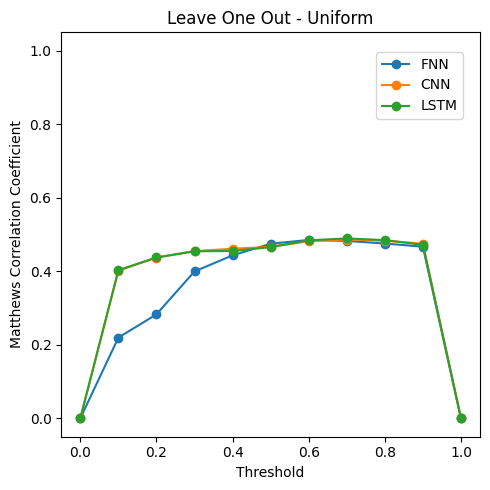

In [ ]:
#@title Plot Average MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, loo_average_uniform.loc['FNN']['MCC'], label='FNN', marker='o')
axs.plot(thresholds, loo_average_uniform.loc['CNN']['MCC'], label='CNN', marker='o')
axs.plot(thresholds, loo_average_uniform.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('Leave One Out - Uniform')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
plt.savefig('Leave One Out Average MCC Uniform.pdf')
plt.show()

In [ ]:
#@title MCC and F1

# Saved to CSV and loaded below.
'''
fnn_mcc = []
cnn_mcc = []
lstm_mcc = []

fnn_f1 = []
cnn_f1 = []
lstm_f1 = []

fnn_f1_neg = []
cnn_f1_neg = []
lstm_f1_neg = []

fnn_f1_micro = []
cnn_f1_micro = []
lstm_f1_micro = []

fnn_f1_macro = []
cnn_f1_macro = []
lstm_f1_macro = []

for i, lang in enumerate(names):

  fnn_df = pd.read_csv(os.path.join(preds_uniform, 'LOO', f'LOO_{lang}_FNN_Uniform.csv'))
  cnn_df = pd.read_csv(os.path.join(preds_uniform, 'LOO', f'LOO_{lang}_CNN_Uniform.csv'))
  lstm_df = pd.read_csv(os.path.join(preds_uniform, 'LOO', f'LOO_{lang}_LSTM_Uniform.csv'))

  fnn_df = fnn_df[fnn_df['Languages']==codes[i]]
  cnn_df = cnn_df[cnn_df['Languages']==codes[i]]
  lstm_df = lstm_df[lstm_df['Languages']==codes[i]]

  assert (fnn_df['Ground Truths'] == cnn_df['Ground Truths']).all()
  assert (cnn_df['Ground Truths'] == lstm_df['Ground Truths']).all()

  truths = [truth for truth in fnn_df['Ground Truths']]

  for t in thresholds:
    fnn_pred = [int(pred) for pred in fnn_df['Predictions'] > t]
    cnn_pred = [int(pred) for pred in cnn_df['Predictions'] > t]
    lstm_pred = [int(pred) for pred in lstm_df['Predictions'] > t]

    fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
    cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
    lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

    fnn_f1.append(f1_score(truths, fnn_pred))
    cnn_f1.append(f1_score(truths, cnn_pred))
    lstm_f1.append(f1_score(truths, lstm_pred))

    fnn_f1_neg.append(f1_score(truths, fnn_pred, pos_label=0))
    cnn_f1_neg.append(f1_score(truths, cnn_pred, pos_label=0))
    lstm_f1_neg.append(f1_score(truths, lstm_pred, pos_label=0))

    fnn_f1_micro.append(f1_score(truths, fnn_pred, average='micro'))
    cnn_f1_micro.append(f1_score(truths, cnn_pred, average='micro'))
    lstm_f1_micro.append(f1_score(truths, lstm_pred, average='micro'))

    fnn_f1_macro.append(f1_score(truths, fnn_pred, average='macro'))
    cnn_f1_macro.append(f1_score(truths, cnn_pred, average='macro'))
    lstm_f1_macro.append(f1_score(truths, lstm_pred, average='macro'))

mcc = fnn_mcc + cnn_mcc + lstm_mcc
f1 = fnn_f1 + cnn_f1 + lstm_f1
f1_neg = fnn_f1_neg + cnn_f1_neg + lstm_f1_neg
f1_micro = fnn_f1_micro + cnn_f1_micro + lstm_f1_micro
f1_macro = fnn_f1_macro + cnn_f1_macro + lstm_f1_macro

index = pd.MultiIndex.from_product([models, names, thresholds], names=['Model', 'Language', 'Threshold'])
loo_metrics_uniform = pd.DataFrame({'MCC':mcc, 'F1 Pos':f1, 'F1 Neg':f1_neg, 'F1 Micro':f1_micro, 'F1 Macro':f1_macro},
                                    index=index).sort_index()

loo_metrics_uniform.to_csv(os.path.join(results_uniform, 'LOO_Metrics_Uniform.csv'))
'''
loo_metrics_uniform = pd.read_csv(os.path.join(results_uniform, 'LOO_Metrics_Uniform.csv'),
                                  index_col=['Model','Language','Threshold'])

loo_metrics_uniform

MCC    F1 Pos    F1 Neg  F1 Micro  F1 Macro
Model Language Threshold                                                  
CNN   Czech    0.0        0.000000  0.568363  0.000000  0.397003  0.284182
               0.1        0.372281  0.651929  0.476598  0.581901  0.564264
               0.2        0.400157  0.667284  0.555556  0.619451  0.611420
               0.3        0.394800  0.668937  0.632221  0.651544  0.650579
               0.4        0.392395  0.658298  0.715618  0.689582  0.686958
...                            ...       ...       ...       ...       ...
LSTM  Turkish  0.6        0.530485  0.639546  0.828209  0.767315  0.733878
               0.7        0.527290  0.591905  0.826311  0.756330  0.709108
               0.8        0.521477  0.567040  0.823590  0.749320  0.695315
               0.9        0.519413  0.559927  0.822692  0.747227  0.691310
               1.0        0.000000  0.000000  0.739881  0.587152  0.369941

[396 rows x 5 columns]

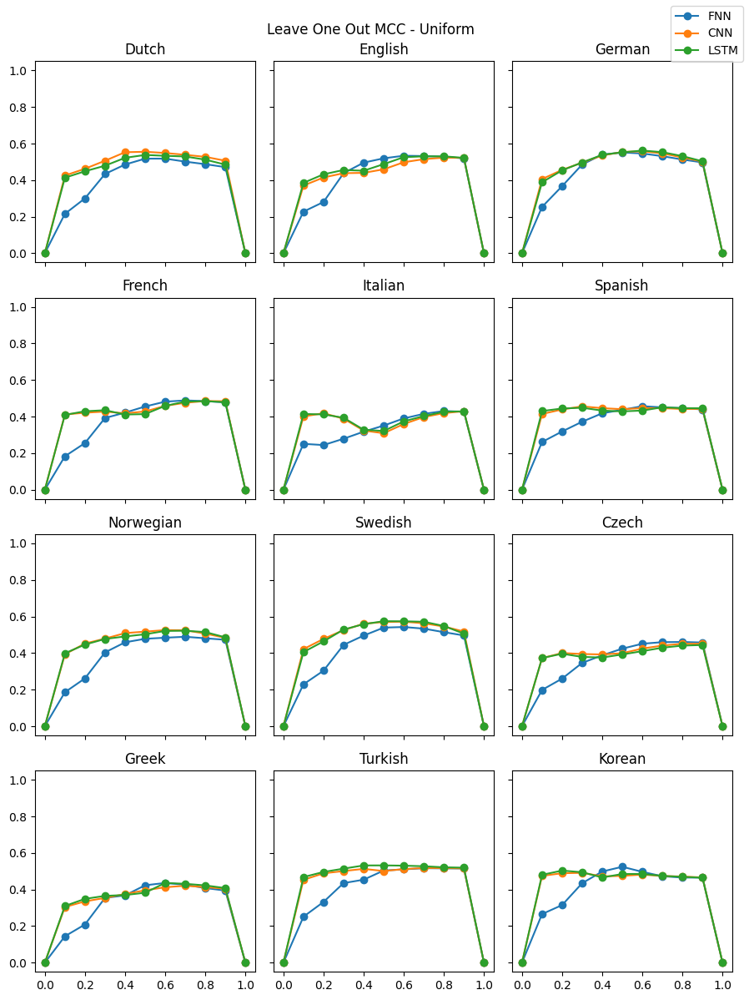

In [ ]:
#@title Plot MCC

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, loo_metrics_uniform.loc[('FNN', names[k]),'MCC'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_uniform.loc[('CNN', names[k]),'MCC'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_uniform.loc[('LSTM', names[k]),'MCC'], label='LSTM', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Leave One Out MCC - Uniform")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Leave One Out MCC Uniform.png')
plt.show()

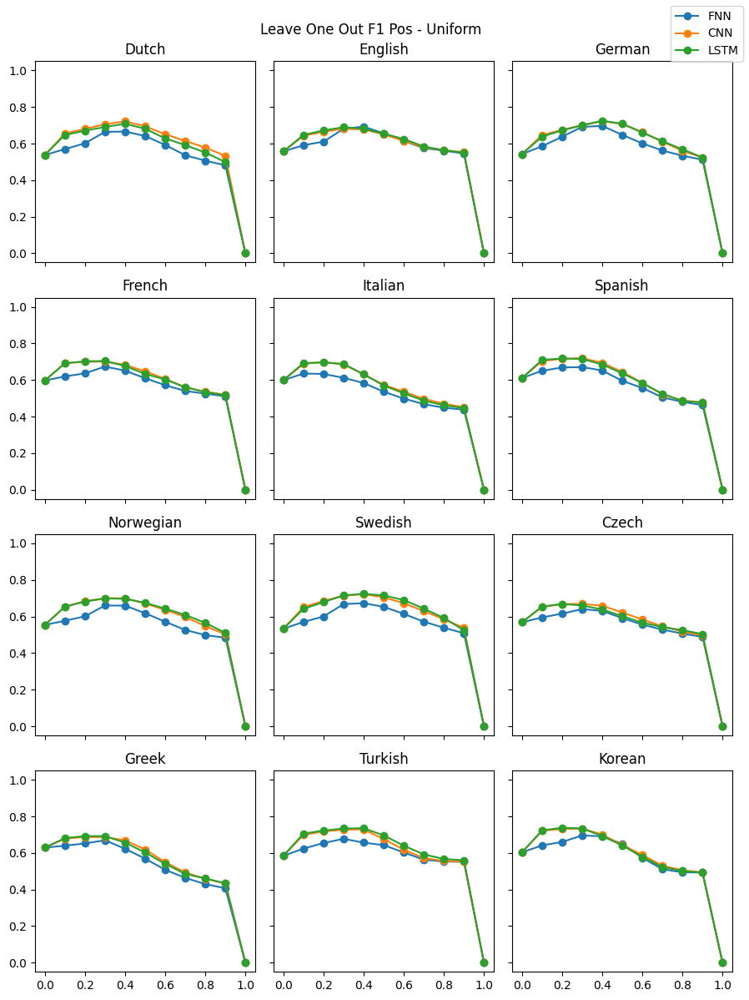

In [ ]:
#@title Plot F1 Pos

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, loo_metrics_uniform.loc[('FNN', names[k]),'F1 Pos'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_uniform.loc[('CNN', names[k]),'F1 Pos'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_uniform.loc[('LSTM', names[k]),'F1 Pos'], label='LSTM', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Leave One Out F1 Pos - Uniform")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Leave One Out F1 Pos Uniform.png')
plt.show()

### Without First Segment Prediction

In [ ]:
#@title Average MCC

# MCC averaged across left-out languages for each model.

# Saved to CSV and loaded below.

mcc = []

for model in models:
  dataframes = []
  for i, lang in enumerate(names):
    lang_df = pd.read_csv(os.path.join(preds_uniform, 'LOO', f'LOO_{lang}_{model}_Uniform.csv'))
    lang_df = lang_df[lang_df['Positions'] != 0]
    lang_df = lang_df[lang_df['Languages']==codes[i]]
    dataframes.append(lang_df)

  df = pd.concat(dataframes, axis=0)

  truths = [truth for truth in df['Ground Truths']]

  for t in thresholds:
    pred = [int(pred) for pred in df['Predictions'] > t]

    mcc.append(matthews_corrcoef(truths, pred))


index = pd.MultiIndex.from_product([models, thresholds], names=['Model', 'Threshold'])
loo_average_uniform_nohead = pd.DataFrame({'MCC':mcc}, index=index).sort_index()

loo_average_uniform_nohead.to_csv(os.path.join(results_uniform, 'LOO_MCC_Average_Uniform_NoHead.csv'))

loo_average_uniform_nohead = pd.read_csv(os.path.join(results_uniform, 'LOO_MCC_Average_Uniform_NoHead.csv'),
                                   index_col=['Model','Threshold'])

loo_average_uniform_nohead

MCC
Model Threshold          
CNN   0.0        0.000000
      0.1        0.351753
      0.2        0.373426
      0.3        0.368484
      0.4        0.337401
      0.5        0.291136
      0.6        0.260075
      0.7        0.224448
      0.8        0.191583
      0.9        0.151141
      1.0        0.000000
FNN   0.0        0.000000
      0.1        0.185949
      0.2        0.222261
      0.3        0.279973
      0.4        0.278692
      0.5        0.260739
      0.6        0.229783
      0.7        0.188341
      0.8        0.152979
      0.9        0.110459
      1.0        0.000000
LSTM  0.0        0.000000
      0.1        0.354160
      0.2        0.374833
      0.3        0.368341
      0.4        0.327724
      0.5        0.287655
      0.6        0.261165
      0.7        0.228779
      0.8        0.194704
      0.9        0.140388
      1.0        0.000000

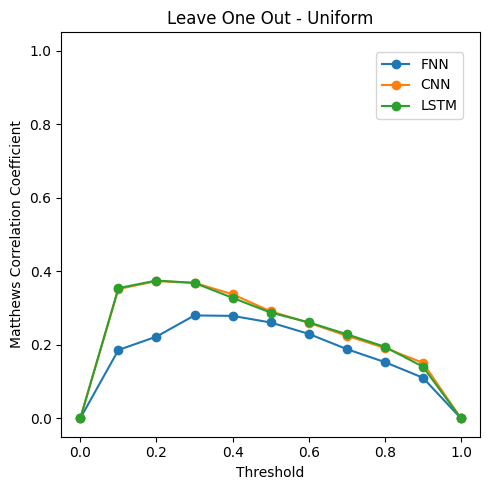

In [ ]:
#@title Plot Average MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, loo_average_uniform_nohead.loc['FNN']['MCC'], label='FNN', marker='o')
axs.plot(thresholds, loo_average_uniform_nohead.loc['CNN']['MCC'], label='CNN', marker='o')
axs.plot(thresholds, loo_average_uniform_nohead.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('Leave One Out - Uniform')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
plt.savefig('Leave One Out Average MCC Uniform NoHead.pdf')
plt.show()

In [ ]:
#@title MCC and F1

# Saved to CSV and loaded below.
'''
fnn_mcc = []
cnn_mcc = []
lstm_mcc = []

fnn_f1 = []
cnn_f1 = []
lstm_f1 = []

fnn_f1_neg = []
cnn_f1_neg = []
lstm_f1_neg = []

fnn_f1_micro = []
cnn_f1_micro = []
lstm_f1_micro = []

fnn_f1_macro = []
cnn_f1_macro = []
lstm_f1_macro = []

for i, lang in enumerate(names):

  fnn_df = pd.read_csv(os.path.join(preds_uniform, 'LOO', f'LOO_{lang}_FNN_Uniform.csv'))
  cnn_df = pd.read_csv(os.path.join(preds_uniform, 'LOO', f'LOO_{lang}_CNN_Uniform.csv'))
  lstm_df = pd.read_csv(os.path.join(preds_uniform, 'LOO', f'LOO_{lang}_LSTM_Uniform.csv'))

  fnn_df = fnn_df[fnn_df['Positions'] != 0]
  cnn_df = cnn_df[cnn_df['Positions'] != 0]
  lstm_df = lstm_df[lstm_df['Positions'] != 0]

  fnn_df = fnn_df[fnn_df['Languages']==codes[i]]
  cnn_df = cnn_df[cnn_df['Languages']==codes[i]]
  lstm_df = lstm_df[lstm_df['Languages']==codes[i]]

  assert (fnn_df['Ground Truths'] == cnn_df['Ground Truths']).all()
  assert (cnn_df['Ground Truths'] == lstm_df['Ground Truths']).all()

  truths = [truth for truth in fnn_df['Ground Truths']]

  for t in thresholds:
    fnn_pred = [int(pred) for pred in fnn_df['Predictions'] > t]
    cnn_pred = [int(pred) for pred in cnn_df['Predictions'] > t]
    lstm_pred = [int(pred) for pred in lstm_df['Predictions'] > t]

    fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
    cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
    lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

    fnn_f1.append(f1_score(truths, fnn_pred))
    cnn_f1.append(f1_score(truths, cnn_pred))
    lstm_f1.append(f1_score(truths, lstm_pred))

    fnn_f1_neg.append(f1_score(truths, fnn_pred, pos_label=0))
    cnn_f1_neg.append(f1_score(truths, cnn_pred, pos_label=0))
    lstm_f1_neg.append(f1_score(truths, lstm_pred, pos_label=0))

    fnn_f1_micro.append(f1_score(truths, fnn_pred, average='micro'))
    cnn_f1_micro.append(f1_score(truths, cnn_pred, average='micro'))
    lstm_f1_micro.append(f1_score(truths, lstm_pred, average='micro'))

    fnn_f1_macro.append(f1_score(truths, fnn_pred, average='macro'))
    cnn_f1_macro.append(f1_score(truths, cnn_pred, average='macro'))
    lstm_f1_macro.append(f1_score(truths, lstm_pred, average='macro'))

mcc = fnn_mcc + cnn_mcc + lstm_mcc
f1 = fnn_f1 + cnn_f1 + lstm_f1
f1_neg = fnn_f1_neg + cnn_f1_neg + lstm_f1_neg
f1_micro = fnn_f1_micro + cnn_f1_micro + lstm_f1_micro
f1_macro = fnn_f1_macro + cnn_f1_macro + lstm_f1_macro

index = pd.MultiIndex.from_product([models, names, thresholds], names=['Model', 'Language', 'Threshold'])
loo_metrics_uniform_nohead = pd.DataFrame({'MCC':mcc, 'F1 Pos':f1, 'F1 Neg':f1_neg, 'F1 Micro':f1_micro, 'F1 Macro':f1_macro},
                                    index=index).sort_index()

loo_metrics_uniform_nohead.to_csv(os.path.join(results_uniform, 'LOO_Metrics_Uniform_NoHead.csv'))
'''
loo_metrics_uniform_nohead = pd.read_csv(os.path.join(results_uniform, 'LOO_Metrics_Uniform_NoHead.csv'),
                                  index_col=['Model','Language','Threshold'])

loo_metrics_uniform_nohead

MCC    F1 Pos    F1 Neg  F1 Micro  F1 Macro
Model Language Threshold                                                  
CNN   Czech    0.0        0.000000  0.476857  0.000000  0.313074  0.238428
               0.1        0.329537  0.563037  0.476598  0.523708  0.519818
               0.2        0.346401  0.576888  0.555556  0.566484  0.566222
               0.3        0.316344  0.568837  0.632221  0.603044  0.600529
               0.4        0.271792  0.532565  0.715618  0.646377  0.624091
...                            ...       ...       ...       ...       ...
LSTM  Turkish  0.6        0.239010  0.298423  0.828209  0.724001  0.563316
               0.7        0.167361  0.139638  0.826311  0.710970  0.482974
               0.8        0.109820  0.054459  0.823590  0.702656  0.439025
               0.9        0.086598  0.029719  0.822692  0.700174  0.426205
               1.0        0.000000  0.000000  0.821068  0.696451  0.410534

[396 rows x 5 columns]

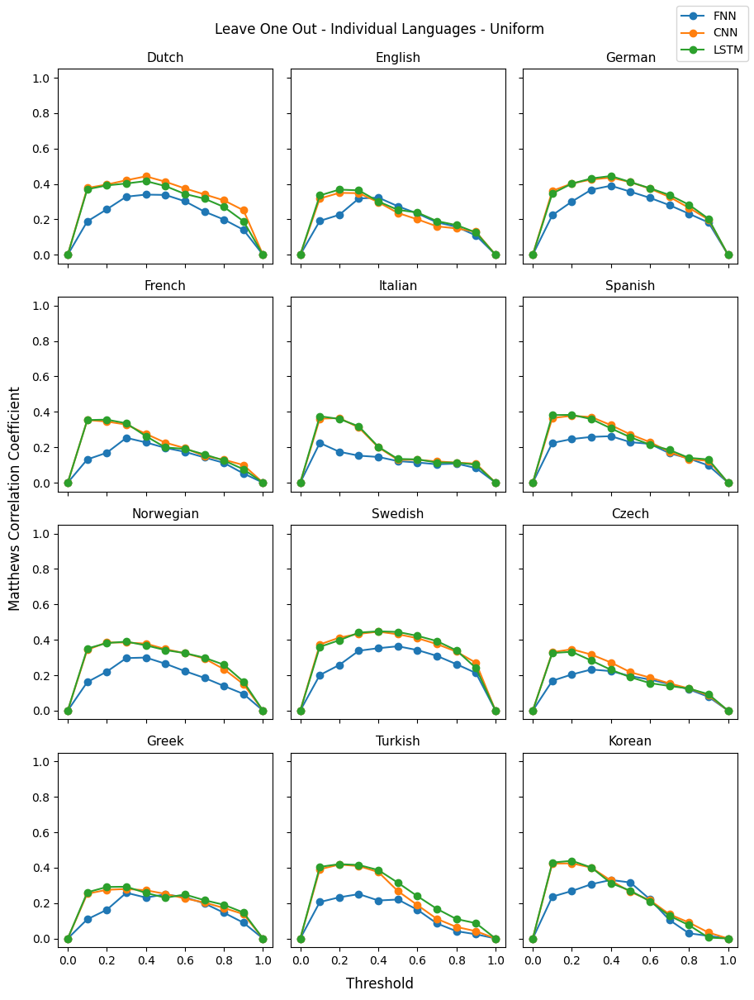

In [ ]:
#@title Plot MCC

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, loo_metrics_uniform_nohead.loc[('FNN', names[k]),'MCC'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_uniform_nohead.loc[('CNN', names[k]),'MCC'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_uniform_nohead.loc[('LSTM', names[k]),'MCC'], label='LSTM', marker='o')
    axs[i,j].set_title(names[k], fontsize=11)
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Leave One Out - Individual Languages - Uniform")
fig.text(0.5, 0.01, 'Threshold', ha='center', va='center', fontsize=12)
fig.text(0.01, 0.5, 'Matthews Correlation Coefficient', ha='center', va='center', rotation='vertical', fontsize=12)
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout(rect=(0.015,0.015,1,0.99))
plt.savefig('Leave One Out MCC Uniform NoHead.pdf')
plt.show()

## Language Family Models

In [ ]:
#@title Average MCC

# MCC averaged across left-out family languages for each model.

germanic = [('Dutch', 'nl'), ('English', 'en'), ('German', 'de')]
romantic = [('French', 'fr'), ('Italian', 'it'), ('Spanish', 'es')]
nordic = [('Norwegian', 'no'), ('Swedish', 'sv')]
families = [('Germanic', germanic), ('Romantic', romantic), ('Nordic', nordic)]

# Saved to CSV and loaded below.

mcc = []

for model in models:
  dataframes = []
  for family, family_list in families:
    for lang, id in family_list:
      lang_df = pd.read_csv(os.path.join(preds_uniform, 'Family', f'{family}_{lang}_{model}_Uniform.csv'))
      lang_df = lang_df[lang_df['Languages']==id]
      dataframes.append(lang_df)

  df = pd.concat(dataframes, axis=0)

  truths = [truth for truth in df['Ground Truths']]

  for t in thresholds:
    pred = [int(pred) for pred in df['Predictions'] > t]

    mcc.append(matthews_corrcoef(truths, pred))


index = pd.MultiIndex.from_product([models, thresholds], names=['Model', 'Threshold'])
family_average_uniform = pd.DataFrame({'MCC':mcc}, index=index).sort_index()

family_average_uniform.to_csv(os.path.join(results_uniform, 'Family_MCC_Average_Uniform.csv'))

family_average_uniform = pd.read_csv(os.path.join(results_uniform, 'Family_MCC_Average_Uniform.csv'),
                                   index_col=['Model','Threshold'])

family_average_uniform

MCC
Model Threshold          
CNN   0.0        0.000000
      0.1        0.418628
      0.2        0.456635
      0.3        0.487939
      0.4        0.507299
      0.5        0.512801
      0.6        0.511362
      0.7        0.502185
      0.8        0.490954
      0.9        0.482136
      1.0        0.000000
FNN   0.0        0.000000
      0.1        0.248530
      0.2        0.323000
      0.3        0.402745
      0.4        0.462531
      0.5        0.485402
      0.6        0.494636
      0.7        0.494920
      0.8        0.486421
      0.9        0.475384
      1.0        0.000000
LSTM  0.0        0.000000
      0.1        0.395808
      0.2        0.419025
      0.3        0.436240
      0.4        0.455419
      0.5        0.478245
      0.6        0.462102
      0.7        0.460434
      0.8        0.470076
      0.9        0.463716
      1.0        0.000000

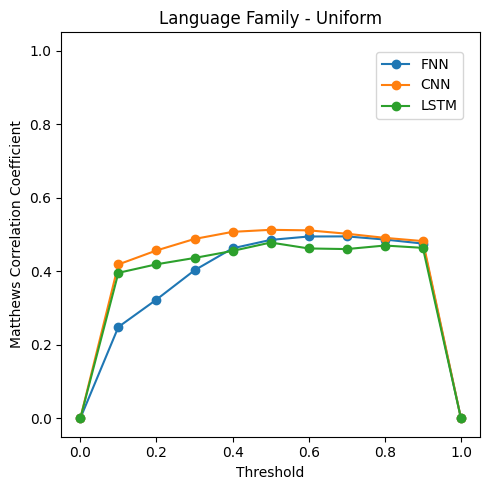

In [ ]:
#@title Plot Average MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, family_average_uniform.loc['FNN']['MCC'], label='FNN', marker='o')
axs.plot(thresholds, family_average_uniform.loc['CNN']['MCC'], label='CNN', marker='o')
axs.plot(thresholds, family_average_uniform.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('Language Family - Uniform')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
plt.savefig('Family Average MCC Uniform.pdf')
plt.show()

In [ ]:
#@title MCC and F1

germanic = [('Dutch', 'nl'), ('English', 'en'), ('German', 'de')]
romantic = [('French', 'fr'), ('Italian', 'it'), ('Spanish', 'es')]
nordic = [('Norwegian', 'no'), ('Swedish', 'sv')]
families = [('Germanic', germanic), ('Romantic', romantic), ('Nordic', nordic)]

# Saved to CSV and loaded below.
'''
temp_metrics = []

for family, family_list in families:

  fnn_mcc = []
  cnn_mcc = []
  lstm_mcc = []

  fnn_f1 = []
  cnn_f1 = []
  lstm_f1 = []

  fnn_f1_neg = []
  cnn_f1_neg = []
  lstm_f1_neg = []

  fnn_f1_micro = []
  cnn_f1_micro = []
  lstm_f1_micro = []

  fnn_f1_macro = []
  cnn_f1_macro = []
  lstm_f1_macro = []

  for lang, id in family_list:

    fnn_df = pd.read_csv(os.path.join(preds_uniform, 'Family', f'{family}_{lang}_FNN_Uniform.csv'))
    cnn_df = pd.read_csv(os.path.join(preds_uniform, 'Family', f'{family}_{lang}_CNN_Uniform.csv'))
    lstm_df = pd.read_csv(os.path.join(preds_uniform, 'Family', f'{family}_{lang}_LSTM_Uniform.csv'))

    fnn_df = fnn_df[fnn_df['Languages']==id]
    cnn_df = cnn_df[cnn_df['Languages']==id]
    lstm_df = lstm_df[lstm_df['Languages']==id]

    assert (fnn_df['Ground Truths'] == cnn_df['Ground Truths']).all()
    assert (cnn_df['Ground Truths'] == lstm_df['Ground Truths']).all()

    truths = [truth for truth in fnn_df['Ground Truths']]

    for t in thresholds:
      fnn_pred = [int(pred) for pred in fnn_df['Predictions'] > t]
      cnn_pred = [int(pred) for pred in cnn_df['Predictions'] > t]
      lstm_pred = [int(pred) for pred in lstm_df['Predictions'] > t]

      fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
      cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
      lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

      fnn_f1.append(f1_score(truths, fnn_pred))
      cnn_f1.append(f1_score(truths, cnn_pred))
      lstm_f1.append(f1_score(truths, lstm_pred))

      fnn_f1_neg.append(f1_score(truths, fnn_pred, pos_label=0))
      cnn_f1_neg.append(f1_score(truths, cnn_pred, pos_label=0))
      lstm_f1_neg.append(f1_score(truths, lstm_pred, pos_label=0))

      fnn_f1_micro.append(f1_score(truths, fnn_pred, average='micro'))
      cnn_f1_micro.append(f1_score(truths, cnn_pred, average='micro'))
      lstm_f1_micro.append(f1_score(truths, lstm_pred, average='micro'))

      fnn_f1_macro.append(f1_score(truths, fnn_pred, average='macro'))
      cnn_f1_macro.append(f1_score(truths, cnn_pred, average='macro'))
      lstm_f1_macro.append(f1_score(truths, lstm_pred, average='macro'))

  mcc = fnn_mcc + cnn_mcc + lstm_mcc
  f1 = fnn_f1 + cnn_f1 + lstm_f1
  f1_neg = fnn_f1_neg + cnn_f1_neg + lstm_f1_neg
  f1_micro = fnn_f1_micro + cnn_f1_micro + lstm_f1_micro
  f1_macro = fnn_f1_macro + cnn_f1_macro + lstm_f1_macro

  index = pd.MultiIndex.from_product([[family], models, [lang[0] for lang in family_list], thresholds], names=['Family', 'Model','Language','Threshold'])
  temp_metrics.append(pd.DataFrame({'MCC':mcc, 'F1 Pos':f1, 'F1 Neg':f1_neg, 'F1 Micro':f1_micro, 'F1 Macro':f1_macro},
                                    index=index))

family_metrics_uniform = pd.concat(temp_metrics).sort_index()

family_metrics_uniform.to_csv(os.path.join(results_uniform, 'Family_Metrics_Uniform.csv'))
'''
family_metrics_uniform = pd.read_csv(os.path.join(results_uniform, 'Family_Metrics_Uniform.csv'),
                                     index_col=['Family','Model','Language','Threshold'])

family_metrics_uniform

MCC    F1 Pos    F1 Neg  F1 Micro  \
Family   Model Language Threshold                                           
Germanic CNN   Dutch    0.0        0.000000  0.537190  0.000000  0.367232   
                        0.1        0.416177  0.650712  0.573358  0.615891   
                        0.2        0.476601  0.688280  0.707383  0.698133   
                        0.3        0.525843  0.714335  0.795608  0.761711   
                        0.4        0.547153  0.714865  0.832216  0.788743   
...                                     ...       ...       ...       ...   
Romantic LSTM  Spanish  0.6        0.427510  0.558343  0.783339  0.709290   
                        0.7        0.417960  0.485115  0.780729  0.692438   
                        0.8        0.430552  0.448229  0.781802  0.687272   
                        0.9        0.430552  0.448229  0.781802  0.687272   
                        1.0        0.000000  0.000000  0.718155  0.560251   

                                   F1 Macro  
Family   Model Language Threshold            
Germanic CNN   Dutch    0.0        0.268595  
                        0.1        0.612035  
                        0.2        0.697832  
                        0.3        0.754971  
                        0.4        0.773541  
...                                     ...  
Romantic LSTM  Spanish  0.6        0.670841  
                        0.7        0.632922  
                        0.8        0.615016  
                        0.9        0.615016  
                        1.0        0.359077  

[264 rows x 5 columns]

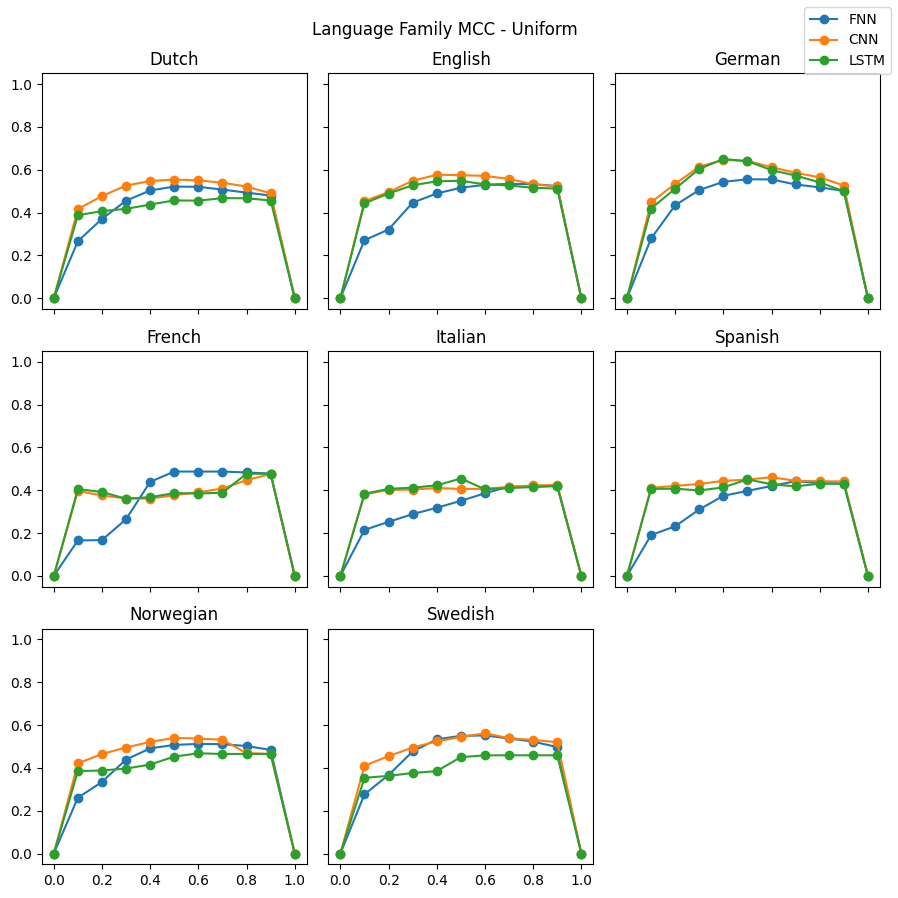

In [ ]:
#@title Plot MCC

fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(9,9))

for i, (family, family_list) in enumerate(families):
  for j, (lang, id) in enumerate(family_list):

    axs[i,j].plot(thresholds, family_metrics_uniform.loc[(family, 'FNN', lang), 'MCC'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, family_metrics_uniform.loc[(family, 'CNN', lang), 'MCC'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, family_metrics_uniform.loc[(family, 'LSTM', lang), 'MCC'], label='LSTM', marker='o')
    axs[i,j].set_title(lang)
    axs[i,j].set_ylim([-0.05,1.05])

axs[2,2].set_axis_off()

fig.suptitle("Language Family MCC - Uniform")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Language Family MCC Uniform.png')
plt.show()

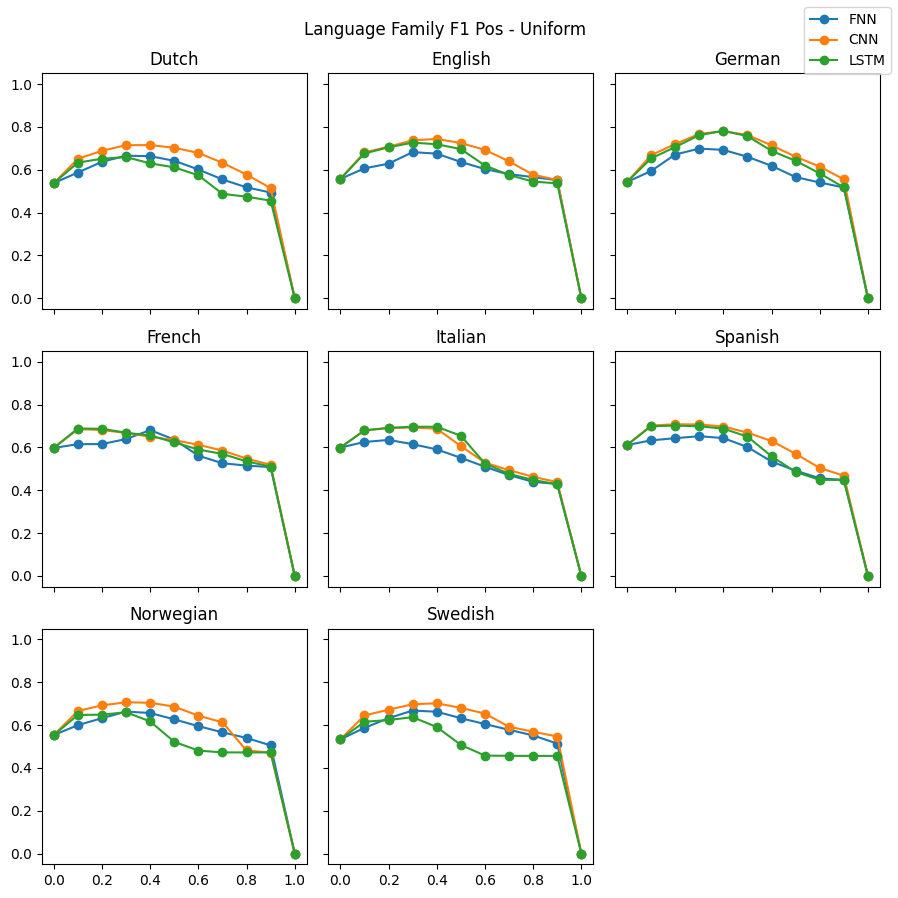

In [ ]:
#@title Plot F1 Pos

fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(9,9))

for i, (family, family_list) in enumerate(families):
  for j, (lang, id) in enumerate(family_list):

    axs[i,j].plot(thresholds, family_metrics_uniform.loc[(family, 'FNN', lang), 'F1 Pos'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, family_metrics_uniform.loc[(family, 'CNN', lang), 'F1 Pos'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, family_metrics_uniform.loc[(family, 'LSTM', lang), 'F1 Pos'], label='LSTM', marker='o')
    axs[i,j].set_title(lang)
    axs[i,j].set_ylim([-0.05,1.05])

axs[2,2].set_axis_off()

fig.suptitle("Language Family F1 Pos - Uniform")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Language Family F1 Pos Uniform.png')
plt.show()

### Without First Segment Prediction

In [ ]:
#@title Average MCC

# MCC averaged across left-out family languages for each model.

germanic = [('Dutch', 'nl'), ('English', 'en'), ('German', 'de')]
romantic = [('French', 'fr'), ('Italian', 'it'), ('Spanish', 'es')]
nordic = [('Norwegian', 'no'), ('Swedish', 'sv')]
families = [('Germanic', germanic), ('Romantic', romantic), ('Nordic', nordic)]

# Saved to CSV and loaded below.

mcc = []

for model in models:
  dataframes = []
  for family, family_list in families:
    for lang, id in family_list:
      lang_df = pd.read_csv(os.path.join(preds_uniform, 'Family', f'{family}_{lang}_{model}_Uniform.csv'))
      lang_df = lang_df[lang_df['Positions'] != 0]
      lang_df = lang_df[lang_df['Languages']==id]
      dataframes.append(lang_df)

  df = pd.concat(dataframes, axis=0)

  truths = [truth for truth in df['Ground Truths']]

  for t in thresholds:
    pred = [int(pred) for pred in df['Predictions'] > t]

    mcc.append(matthews_corrcoef(truths, pred))


index = pd.MultiIndex.from_product([models, thresholds], names=['Model', 'Threshold'])
family_average_uniform_nohead = pd.DataFrame({'MCC':mcc}, index=index).sort_index()

family_average_uniform_nohead.to_csv(os.path.join(results_uniform, 'Family_MCC_Average_Uniform_NoHead.csv'))

family_average_uniform_nohead = pd.read_csv(os.path.join(results_uniform, 'Family_MCC_Average_Uniform_NoHead.csv'),
                                   index_col=['Model','Threshold'])

family_average_uniform_nohead

MCC
Model Threshold          
CNN   0.0        0.000000
      0.1        0.369299
      0.2        0.389572
      0.3        0.396687
      0.4        0.386377
      0.5        0.355346
      0.6        0.319068
      0.7        0.272010
      0.8        0.211257
      0.9        0.166353
      1.0        0.000000
FNN   0.0        0.000000
      0.1        0.213341
      0.2        0.249692
      0.3        0.277001
      0.4        0.295271
      0.5        0.276188
      0.6        0.246453
      0.7        0.217389
      0.8        0.183429
      0.9        0.139358
      1.0        0.000000
LSTM  0.0        0.000000
      0.1        0.351346
      0.2        0.361406
      0.3        0.351862
      0.4        0.314494
      0.5        0.281210
      0.6        0.197350
      0.7        0.142982
      0.8        0.120096
      0.9        0.069148
      1.0        0.000000

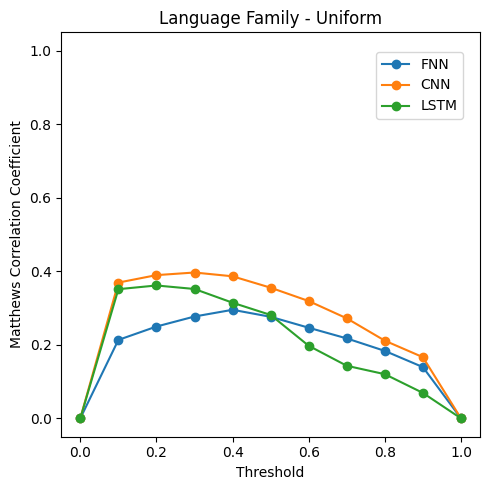

In [ ]:
#@title Plot Average MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, family_average_uniform_nohead.loc['FNN']['MCC'], label='FNN', marker='o')
axs.plot(thresholds, family_average_uniform_nohead.loc['CNN']['MCC'], label='CNN', marker='o')
axs.plot(thresholds, family_average_uniform_nohead.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('Language Family - Uniform')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
plt.savefig('Family Average MCC Uniform NoHead.pdf')
plt.show()

In [ ]:
#@title MCC and F1

germanic = [('Dutch', 'nl'), ('English', 'en'), ('German', 'de')]
romantic = [('French', 'fr'), ('Italian', 'it'), ('Spanish', 'es')]
nordic = [('Norwegian', 'no'), ('Swedish', 'sv')]
families = [('Germanic', germanic), ('Romantic', romantic), ('Nordic', nordic)]

# Saved to CSV and loaded below.

temp_metrics = []

for family, family_list in families:

  fnn_mcc = []
  cnn_mcc = []
  lstm_mcc = []

  fnn_f1 = []
  cnn_f1 = []
  lstm_f1 = []

  fnn_f1_neg = []
  cnn_f1_neg = []
  lstm_f1_neg = []

  fnn_f1_micro = []
  cnn_f1_micro = []
  lstm_f1_micro = []

  fnn_f1_macro = []
  cnn_f1_macro = []
  lstm_f1_macro = []

  for lang, id in family_list:

    fnn_df = pd.read_csv(os.path.join(preds_uniform, 'Family', f'{family}_{lang}_FNN_Uniform.csv'))
    cnn_df = pd.read_csv(os.path.join(preds_uniform, 'Family', f'{family}_{lang}_CNN_Uniform.csv'))
    lstm_df = pd.read_csv(os.path.join(preds_uniform, 'Family', f'{family}_{lang}_LSTM_Uniform.csv'))

    fnn_df = fnn_df[fnn_df['Positions'] != 0]
    cnn_df = cnn_df[cnn_df['Positions'] != 0]
    lstm_df = lstm_df[lstm_df['Positions'] != 0]

    fnn_df = fnn_df[fnn_df['Languages']==id]
    cnn_df = cnn_df[cnn_df['Languages']==id]
    lstm_df = lstm_df[lstm_df['Languages']==id]

    assert (fnn_df['Ground Truths'] == cnn_df['Ground Truths']).all()
    assert (cnn_df['Ground Truths'] == lstm_df['Ground Truths']).all()

    truths = [truth for truth in fnn_df['Ground Truths']]

    for t in thresholds:
      fnn_pred = [int(pred) for pred in fnn_df['Predictions'] > t]
      cnn_pred = [int(pred) for pred in cnn_df['Predictions'] > t]
      lstm_pred = [int(pred) for pred in lstm_df['Predictions'] > t]

      fnn_mcc.append(matthews_corrcoef(truths, fnn_pred))
      cnn_mcc.append(matthews_corrcoef(truths, cnn_pred))
      lstm_mcc.append(matthews_corrcoef(truths, lstm_pred))

      fnn_f1.append(f1_score(truths, fnn_pred))
      cnn_f1.append(f1_score(truths, cnn_pred))
      lstm_f1.append(f1_score(truths, lstm_pred))

      fnn_f1_neg.append(f1_score(truths, fnn_pred, pos_label=0))
      cnn_f1_neg.append(f1_score(truths, cnn_pred, pos_label=0))
      lstm_f1_neg.append(f1_score(truths, lstm_pred, pos_label=0))

      fnn_f1_micro.append(f1_score(truths, fnn_pred, average='micro'))
      cnn_f1_micro.append(f1_score(truths, cnn_pred, average='micro'))
      lstm_f1_micro.append(f1_score(truths, lstm_pred, average='micro'))

      fnn_f1_macro.append(f1_score(truths, fnn_pred, average='macro'))
      cnn_f1_macro.append(f1_score(truths, cnn_pred, average='macro'))
      lstm_f1_macro.append(f1_score(truths, lstm_pred, average='macro'))

  mcc = fnn_mcc + cnn_mcc + lstm_mcc
  f1 = fnn_f1 + cnn_f1 + lstm_f1
  f1_neg = fnn_f1_neg + cnn_f1_neg + lstm_f1_neg
  f1_micro = fnn_f1_micro + cnn_f1_micro + lstm_f1_micro
  f1_macro = fnn_f1_macro + cnn_f1_macro + lstm_f1_macro

  index = pd.MultiIndex.from_product([[family], models, [lang[0] for lang in family_list], thresholds], names=['Family', 'Model','Language','Threshold'])
  temp_metrics.append(pd.DataFrame({'MCC':mcc, 'F1 Pos':f1, 'F1 Neg':f1_neg, 'F1 Micro':f1_micro, 'F1 Macro':f1_macro},
                                    index=index))

family_metrics_uniform_nohead = pd.concat(temp_metrics).sort_index()

family_metrics_uniform_nohead.to_csv(os.path.join(results_uniform, 'Family_Metrics_Uniform_NoHead.csv'))

family_metrics_uniform_nohead = pd.read_csv(os.path.join(results_uniform, 'Family_Metrics_Uniform_NoHead.csv'),
                                     index_col=['Family','Model','Language','Threshold'])

family_metrics_uniform_nohead

MCC    F1 Pos    F1 Neg  F1 Micro  \
Family   Model Language Threshold                                           
Germanic CNN   Dutch    0.0        0.000000  0.451049  0.000000  0.291196   
                        0.1        0.368487  0.566050  0.573358  0.569735   
                        0.2        0.407522  0.599564  0.707383  0.661860   
                        0.3        0.431976  0.615420  0.795608  0.733077   
                        0.4        0.430958  0.598641  0.832216  0.763358   
...                                     ...       ...       ...       ...   
Romantic LSTM  Spanish  0.6        0.187024  0.280746  0.783339  0.666990   
                        0.7        0.089891  0.104095  0.780729  0.647686   
                        0.8        0.000000  0.000000  0.781802  0.641769   
                        0.9        0.000000  0.000000  0.781802  0.641769   
                        1.0        0.000000  0.000000  0.781802  0.641769   

                                   F1 Macro  
Family   Model Language Threshold            
Germanic CNN   Dutch    0.0        0.225524  
                        0.1        0.569704  
                        0.2        0.653473  
                        0.3        0.705514  
                        0.4        0.715429  
...                                     ...  
Romantic LSTM  Spanish  0.6        0.532042  
                        0.7        0.442412  
                        0.8        0.390901  
                        0.9        0.390901  
                        1.0        0.390901  

[264 rows x 5 columns]

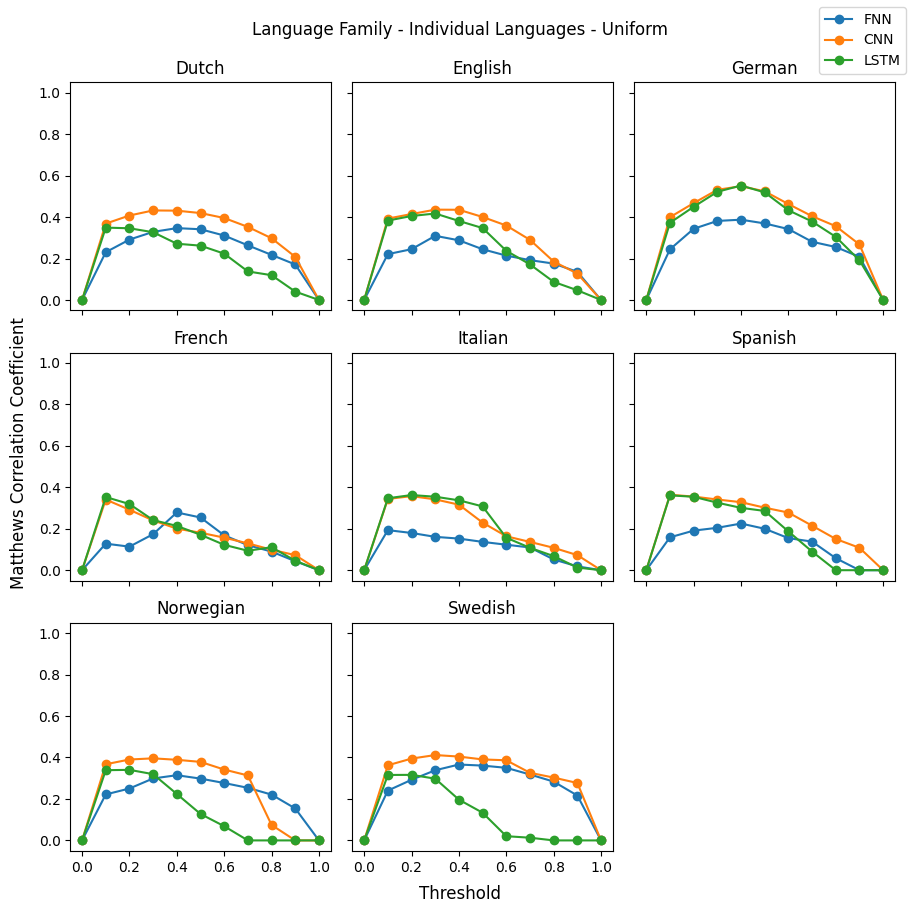

In [ ]:
#@title Plot MCC

fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(9,9))

for i, (family, family_list) in enumerate(families):
  for j, (lang, id) in enumerate(family_list):

    axs[i,j].plot(thresholds, family_metrics_uniform_nohead.loc[(family, 'FNN', lang), 'MCC'], label='FNN', marker='o')
    axs[i,j].plot(thresholds, family_metrics_uniform_nohead.loc[(family, 'CNN', lang), 'MCC'], label='CNN', marker='o')
    axs[i,j].plot(thresholds, family_metrics_uniform_nohead.loc[(family, 'LSTM', lang), 'MCC'], label='LSTM', marker='o')
    axs[i,j].set_title(lang)
    axs[i,j].set_ylim([-0.05,1.05])

axs[2,2].set_axis_off()

fig.suptitle("Language Family - Individual Languages - Uniform")
fig.text(0.5, 0.01, 'Threshold', ha='center', va='center', fontsize=12)
fig.text(0.01, 0.5, 'Matthews Correlation Coefficient', ha='center', va='center', rotation='vertical', fontsize=12)
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout(rect=(0.015,0.015,1,0.99))
plt.savefig('Family MCC Uniform NoHead.pdf')
plt.show()

# All Langs vs LOO vs Family Comparison

These plots compare each model's performance when trained on All Languages vs Leave One Out vs Language Family. We plot results separately for both Original and Uniform size datasets.

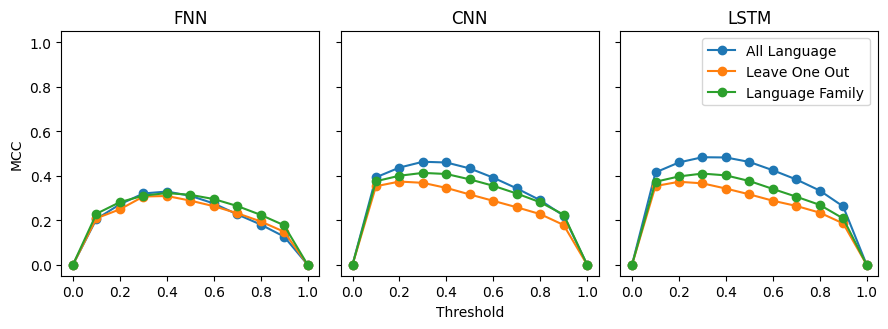

In [ ]:
#@title Plot Average MCC for All, LOO, and Family _nohead)

fig, axs = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(9,3.4))

axs[0].plot(thresholds, all_metrics_nohead.loc['FNN']['MCC'], label='All Language', marker='o')
axs[0].plot(thresholds, loo_average_nohead.loc['FNN']['MCC'], label='Leave One Out', marker='o')
axs[0].plot(thresholds, family_average_nohead.loc['FNN']['MCC'], label='Language Family', marker='o')
axs[1].plot(thresholds, all_metrics_nohead.loc['CNN']['MCC'], label='CNN', marker='o')
axs[1].plot(thresholds, loo_average_nohead.loc['CNN']['MCC'], label='CNN', marker='o')
axs[1].plot(thresholds, family_average_nohead.loc['CNN']['MCC'], label='CNN', marker='o')
axs[2].plot(thresholds, all_metrics_nohead.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs[2].plot(thresholds, loo_average_nohead.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs[2].plot(thresholds, family_average_nohead.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs[1].set_xlabel('Threshold')
axs[0].set_ylabel('MCC')
axs[0].set_title('FNN')
axs[1].set_title('CNN')
axs[2].set_title('LSTM')
axs[0].set_ylim([-0.05,1.05])
axs[1].set_ylim([-0.05,1.05])
axs[2].set_ylim([-0.05,1.05])


handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.98,0.89))
plt.tight_layout()
plt.savefig('Average MCC Regimes NoHead.pdf')
plt.show()

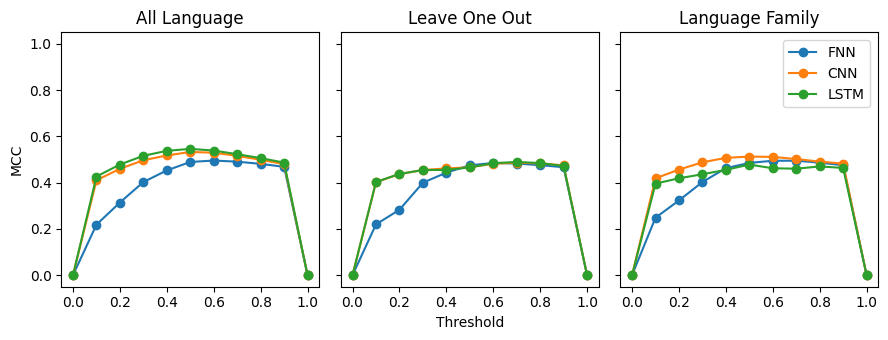

In [ ]:
#@title Plot Average MCC for All, LOO, and Family (Uniform)

fig, axs = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(9,3.5))

axs[0].plot(thresholds, all_metrics_uniform.loc['FNN']['MCC'], label='FNN', marker='o')
axs[0].plot(thresholds, all_metrics_uniform.loc['CNN']['MCC'], label='CNN', marker='o')
axs[0].plot(thresholds, all_metrics_uniform.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs[1].plot(thresholds, loo_average_uniform.loc['FNN']['MCC'], label='FNN', marker='o')
axs[1].plot(thresholds, loo_average_uniform.loc['CNN']['MCC'], label='CNN', marker='o')
axs[1].plot(thresholds, loo_average_uniform.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs[2].plot(thresholds, family_average_uniform.loc['FNN']['MCC'], label='FNN', marker='o')
axs[2].plot(thresholds, family_average_uniform.loc['CNN']['MCC'], label='CNN', marker='o')
axs[2].plot(thresholds, family_average_uniform.loc['LSTM']['MCC'], label='LSTM', marker='o')
axs[1].set_xlabel('Threshold')
axs[0].set_ylabel('MCC')
axs[0].set_title('All Language')
axs[1].set_title('Leave One Out')
axs[2].set_title('Language Family')
axs[0].set_ylim([-0.05,1.05])
axs[1].set_ylim([-0.05,1.05])
axs[2].set_ylim([-0.05,1.05])


handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.98,0.89))
plt.tight_layout()
plt.savefig('Average MCC Uniform.pdf')
plt.show()

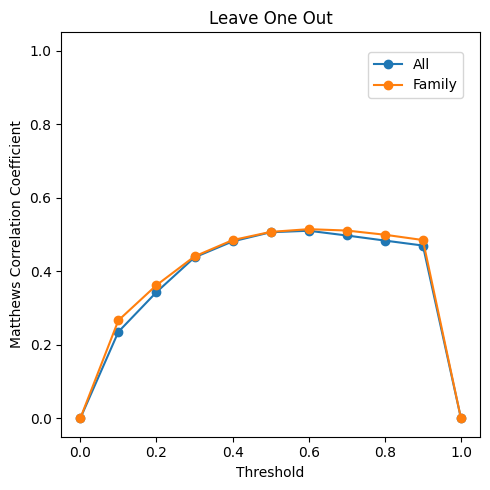

In [ ]:
#@title FNN Average Original (MCC)

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, all_metrics_original.loc['FNN']['MCC'], label='All', marker='o')
axs.plot(thresholds, loo_average_original.loc['FNN']['MCC'], label='LOO', marker='o')
axs.plot(thresholds, family_average_original.loc['FNN']['MCC'], label='Family', marker='o')

axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('Leave One Out')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
#plt.savefig('Leave One Out Average MCC.pdf')
plt.show()

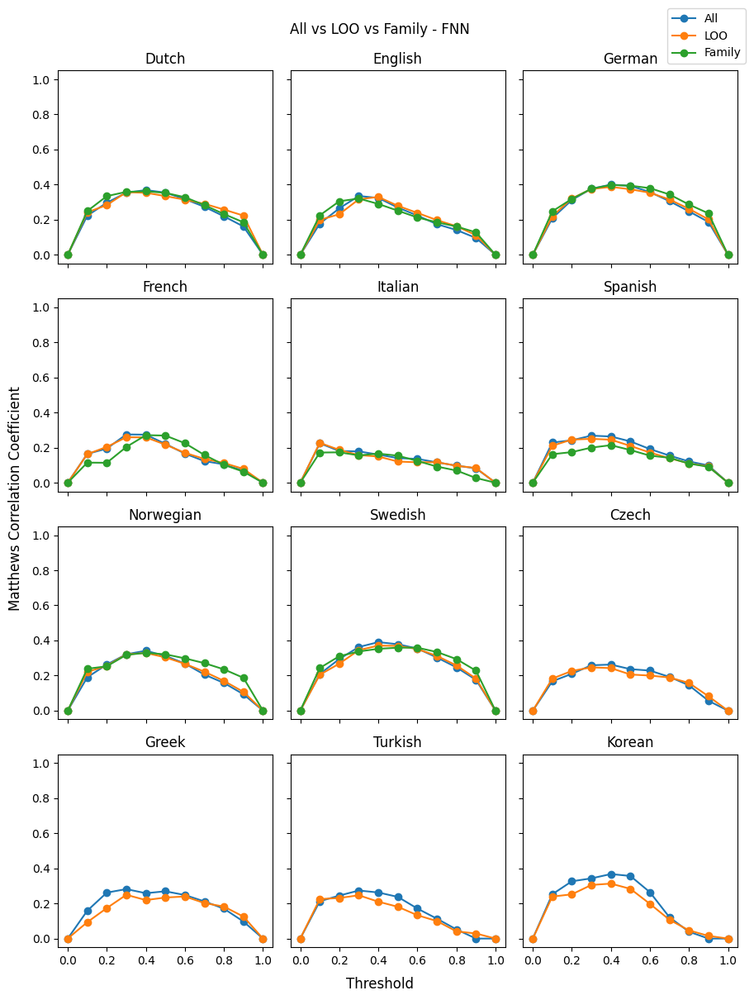

In [ ]:
#@title FNN Original NoHead (MCC)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_nohead.loc[('FNN', names[k]),'MCC'], label='All', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_nohead.loc[('FNN', names[k]),'MCC'], label='LOO', marker='o')
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_nohead.loc[(families[i][0], 'FNN', names[k]), 'MCC'], label='Family', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("All vs LOO vs Family - FNN")
fig.text(0.5, 0.01, 'Threshold', ha='center', va='center', fontsize=12)
fig.text(0.01, 0.5, 'Matthews Correlation Coefficient', ha='center', va='center', rotation='vertical', fontsize=12)
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1, 1))
plt.tight_layout(rect=(0.015,0.015,1,0.99))
plt.savefig('All vs LOO vs Family - FNN NoHead.pdf')
plt.show()

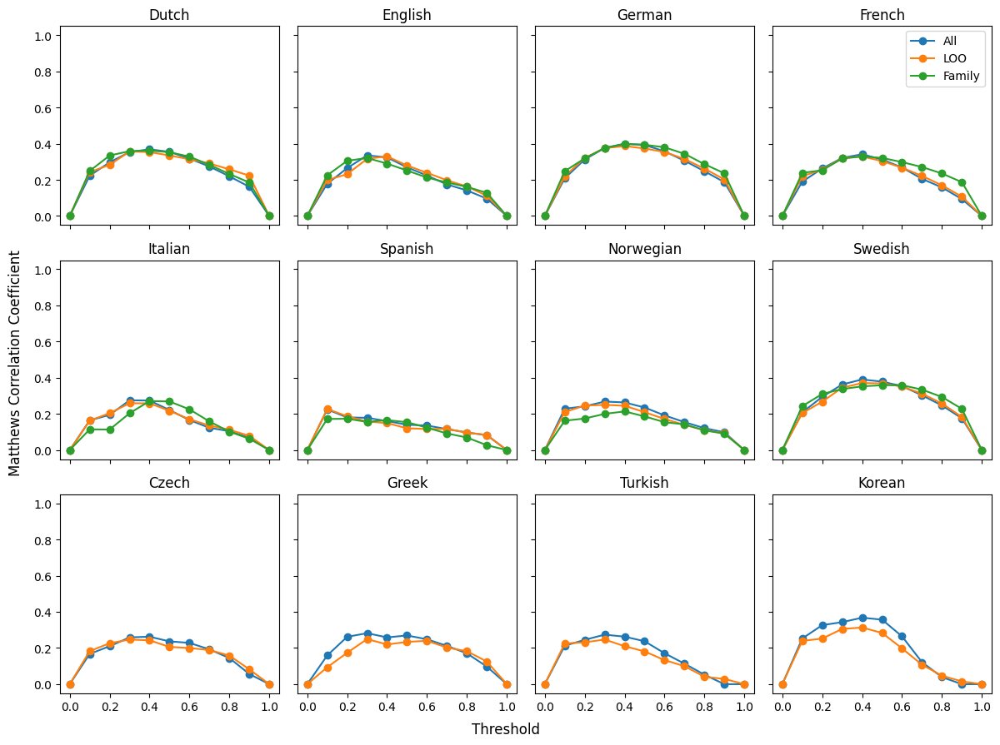

In [ ]:
#@title FNN Original NoHead (MCC) 3x4

new_names = ['Dutch', 'English', 'German', 'Norwegian',
             'French', 'Italian', 'Spanish', 'Swedish',
             'Czech', 'Greek', 'Turkish', 'Korean']

new_families = [('Germanic','Dutch'),('Germanic','English'),('Germanic','German'),('Nordic','Norwegian'),
                ('Romantic','French'),('Romantic','Italian'),('Romantic','Spanish'),('Nordic','Swedish')]

fig, axs = plt.subplots(nrows=3, ncols=4, sharex=True, sharey=True, figsize=(12,9))

for i in range(3):
  for j in range(4):
    k = i * 4 + j

    axs[i,j].plot(thresholds, lang_metrics_nohead.loc[('FNN', new_names[k]),'MCC'], label='All', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_nohead.loc[('FNN', new_names[k]),'MCC'], label='LOO', marker='o')
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_nohead.loc[(new_families[k][0], 'FNN', new_families[k][1]), 'MCC'], label='Family', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

#fig.suptitle("All vs LOO vs Family - FNN")
fig.text(0.5, 0.01, 'Threshold', ha='center', va='center', fontsize=12)
fig.text(0.01, 0.5, 'Matthews Correlation Coefficient', ha='center', va='center', rotation='vertical', fontsize=12)
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.985, 0.95))
plt.tight_layout(rect=(0.015,0.015,1,0.99))
plt.savefig('All vs LOO vs Family - FNN NoHead.pdf')
plt.show()

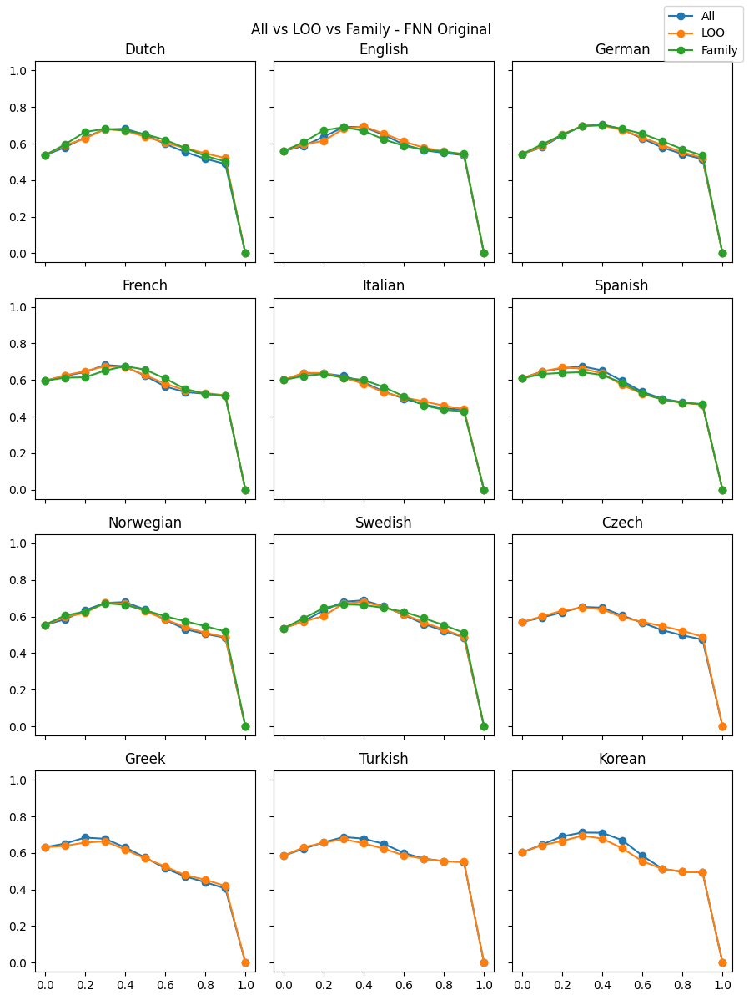

In [ ]:
#@title FNN Original (F1 Pos)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_original.loc[('FNN', names[k]),'F1 Pos'], label='All', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_original.loc[('FNN', names[k]),'F1 Pos'], label='LOO', marker='o')
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_original.loc[(families[i][0], 'FNN', names[k]), 'F1 Pos'], label='Family', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("All vs LOO vs Family - FNN Original")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('All vs LOO vs Family - FNN Original.png')
plt.show()

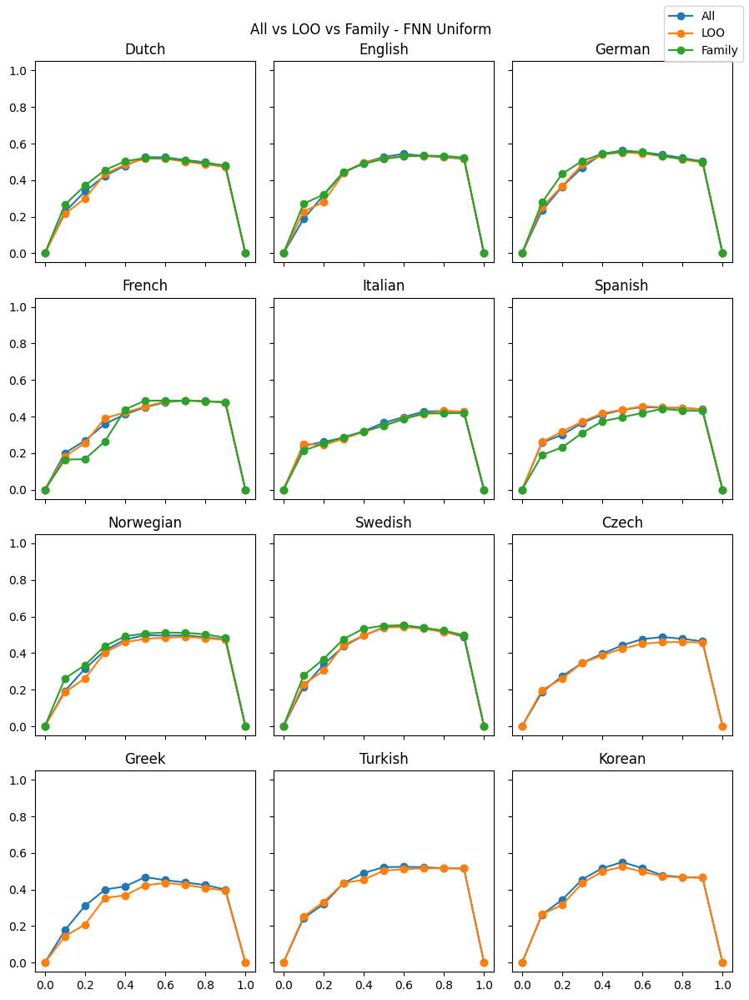

In [ ]:
#@title FNN Uniform (MCC)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_uniform.loc[('FNN', names[k]),'MCC'], label='All', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_uniform.loc[('FNN', names[k]),'MCC'], label='LOO', marker='o')
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_uniform.loc[(families[i][0], 'FNN', names[k]), 'MCC'], label='Family', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("All vs LOO vs Family - FNN Uniform")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('All vs LOO vs Family - FNN Uniform.png')
plt.show()

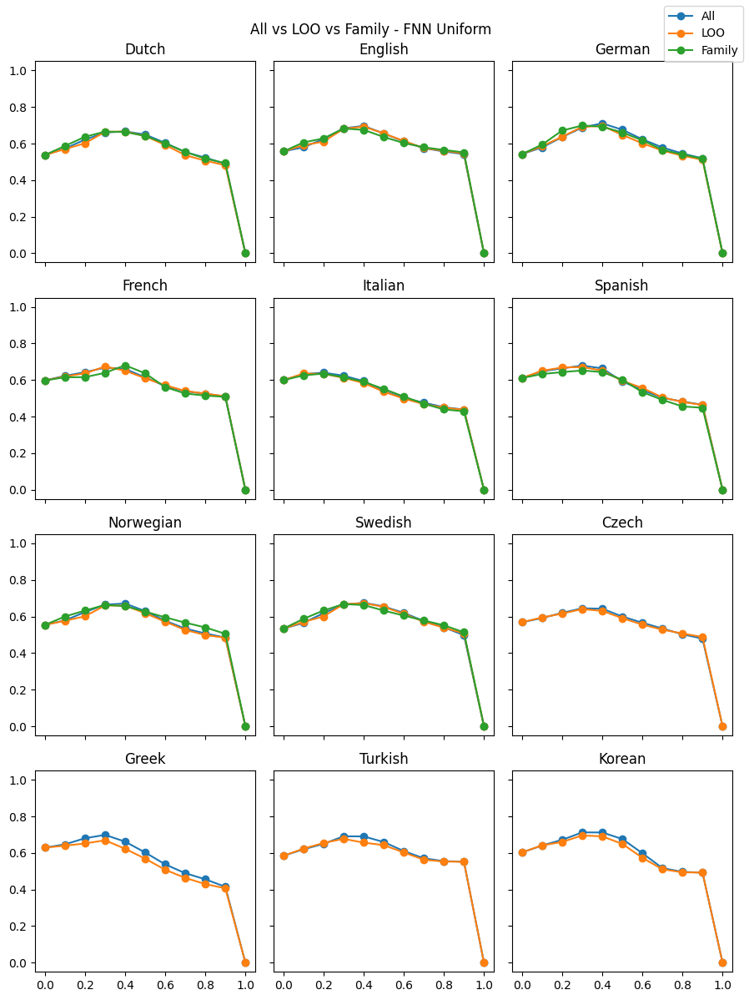

In [ ]:
#@title FNN Uniform (F1 Pos)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_uniform.loc[('FNN', names[k]),'F1 Pos'], label='All', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_uniform.loc[('FNN', names[k]),'F1 Pos'], label='LOO', marker='o')
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_uniform.loc[(families[i][0], 'FNN', names[k]), 'F1 Pos'], label='Family', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("All vs LOO vs Family - FNN Uniform")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('All vs LOO vs Family - FNN Uniform.png')
plt.show()

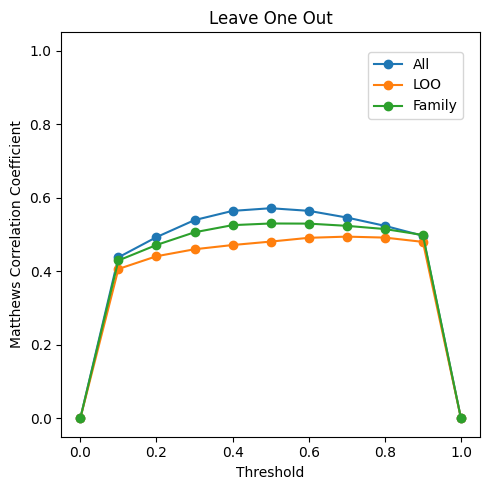

In [ ]:
#@title CNN Average Original (MCC)

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, all_metrics_original.loc['CNN']['MCC'], label='All', marker='o')
axs.plot(thresholds, loo_average_original.loc['CNN']['MCC'], label='LOO', marker='o')
axs.plot(thresholds, family_average_original.loc['CNN']['MCC'], label='Family', marker='o')

axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('Leave One Out')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
#plt.savefig('Leave One Out Average MCC.pdf')
plt.show()

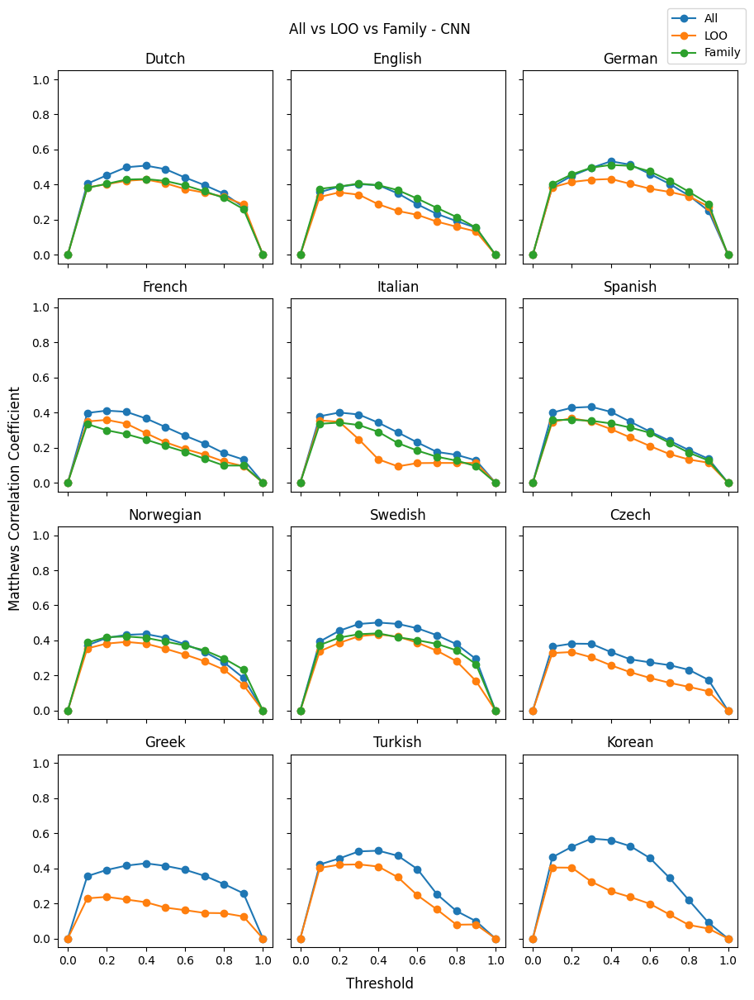

In [ ]:
#@title CNN Original (MCC)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_nohead.loc[('CNN', names[k]),'MCC'], label='All', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_nohead.loc[('CNN', names[k]),'MCC'], label='LOO', marker='o')
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_nohead.loc[(families[i][0], 'CNN', names[k]), 'MCC'], label='Family', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("All vs LOO vs Family - CNN")
fig.text(0.5, 0.01, 'Threshold', ha='center', va='center', fontsize=12)
fig.text(0.01, 0.5, 'Matthews Correlation Coefficient', ha='center', va='center', rotation='vertical', fontsize=12)
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1, 1))
plt.tight_layout(rect=(0.015,0.015,1,0.99))
plt.savefig('All vs LOO vs Family - CNN NoHead.pdf')
plt.show()

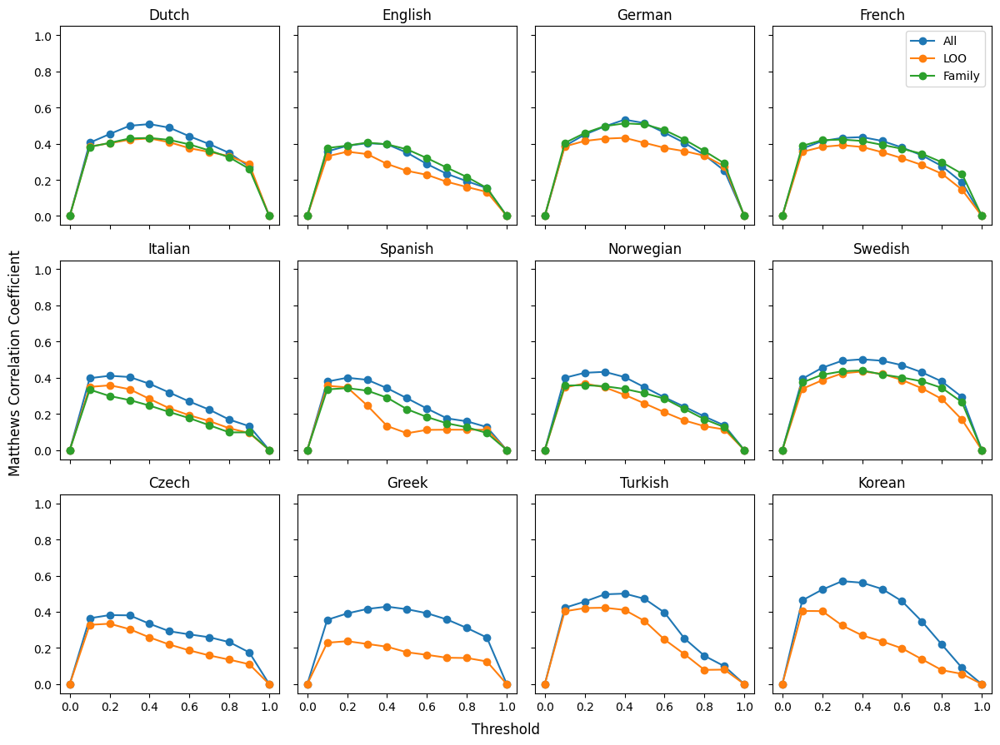

In [ ]:
#@title CNN Original NoHead (MCC) 3x4

new_names = ['Dutch', 'English', 'German', 'Norwegian',
             'French', 'Italian', 'Spanish', 'Swedish',
             'Czech', 'Greek', 'Turkish', 'Korean']

new_families = [('Germanic','Dutch'),('Germanic','English'),('Germanic','German'),('Nordic','Norwegian'),
                ('Romantic','French'),('Romantic','Italian'),('Romantic','Spanish'),('Nordic','Swedish')]

fig, axs = plt.subplots(nrows=3, ncols=4, sharex=True, sharey=True, figsize=(12,9))

for i in range(3):
  for j in range(4):
    k = i * 4 + j

    axs[i,j].plot(thresholds, lang_metrics_nohead.loc[('CNN', new_names[k]),'MCC'], label='All', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_nohead.loc[('CNN', new_names[k]),'MCC'], label='LOO', marker='o')
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_nohead.loc[(new_families[k][0], 'CNN', new_families[k][1]), 'MCC'], label='Family', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

#fig.suptitle("All vs LOO vs Family - CNN")
fig.text(0.5, 0.01, 'Threshold', ha='center', va='center', fontsize=12)
fig.text(0.01, 0.5, 'Matthews Correlation Coefficient', ha='center', va='center', rotation='vertical', fontsize=12)
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.985, 0.95))
plt.tight_layout(rect=(0.015,0.015,1,0.99))
plt.savefig('All vs LOO vs Family - CNN NoHead.pdf')
plt.show()

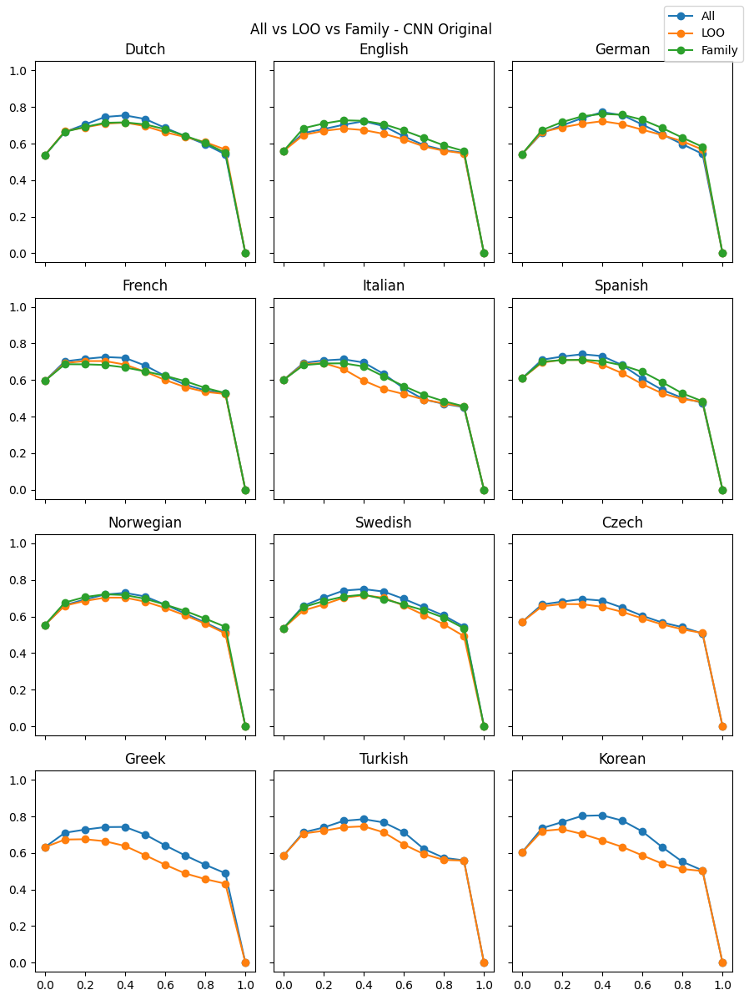

In [ ]:
#@title CNN Original (F1 Pos)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_original.loc[('CNN', names[k]),'F1 Pos'], label='All', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_original.loc[('CNN', names[k]),'F1 Pos'], label='LOO', marker='o')
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_original.loc[(families[i][0], 'CNN', names[k]), 'F1 Pos'], label='Family', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("All vs LOO vs Family - CNN Original")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('All vs LOO vs Family - CNN Original.png')
plt.show()

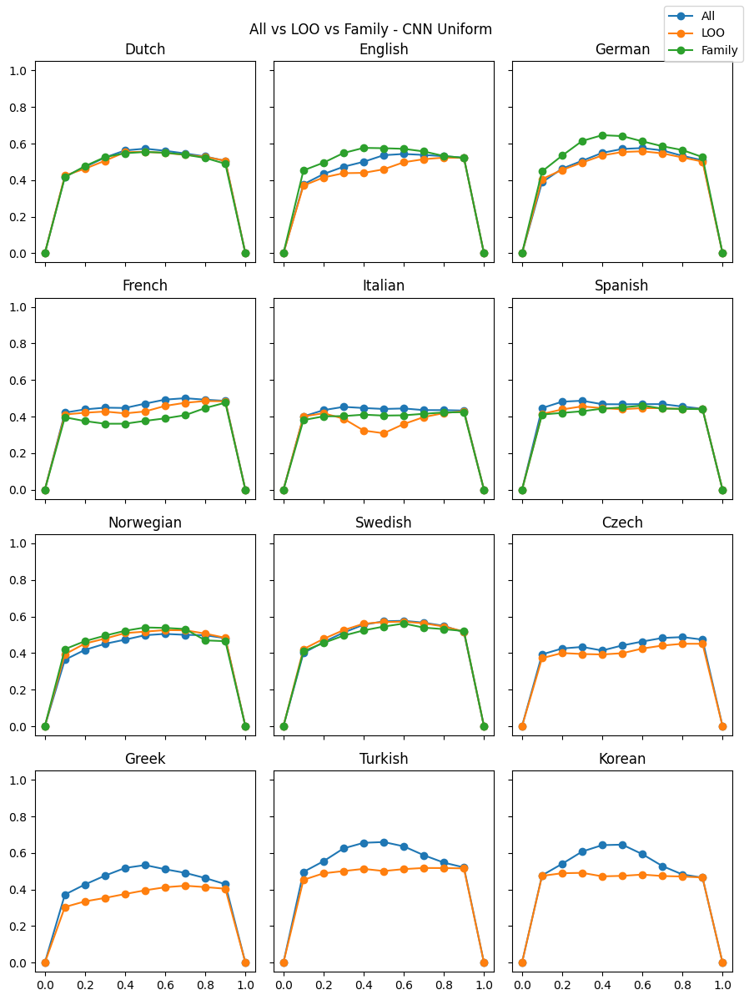

In [ ]:
#@title CNN Uniform (MCC)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_uniform.loc[('CNN', names[k]),'MCC'], label='All', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_uniform.loc[('CNN', names[k]),'MCC'], label='LOO', marker='o')
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_uniform.loc[(families[i][0], 'CNN', names[k]), 'MCC'], label='Family', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("All vs LOO vs Family - CNN Uniform")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('All vs LOO vs Family - CNN Uniform.png')
plt.show()

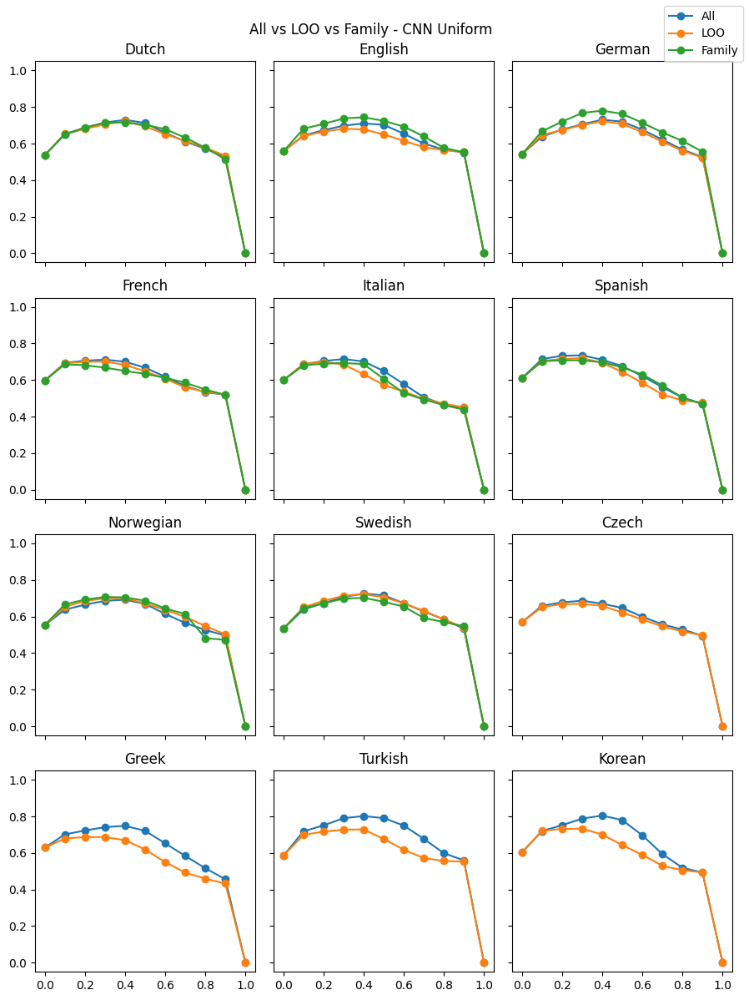

In [ ]:
#@title CNN Uniform (F1 Pos)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_uniform.loc[('CNN', names[k]),'F1 Pos'], label='All', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_uniform.loc[('CNN', names[k]),'F1 Pos'], label='LOO', marker='o')
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_uniform.loc[(families[i][0], 'CNN', names[k]), 'F1 Pos'], label='Family', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("All vs LOO vs Family - CNN Uniform")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('All vs LOO vs Family - CNN Uniform.png')
plt.show()

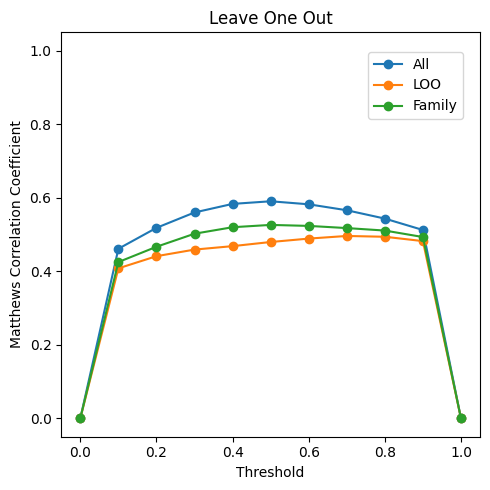

In [ ]:
#@title LSTM Average Original (MCC)

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, all_metrics_original.loc['LSTM']['MCC'], label='All', marker='o')
axs.plot(thresholds, loo_average_original.loc['LSTM']['MCC'], label='LOO', marker='o')
axs.plot(thresholds, family_average_original.loc['LSTM']['MCC'], label='Family', marker='o')

axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('Leave One Out')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
#plt.savefig('Leave One Out Average MCC.pdf')
plt.show()

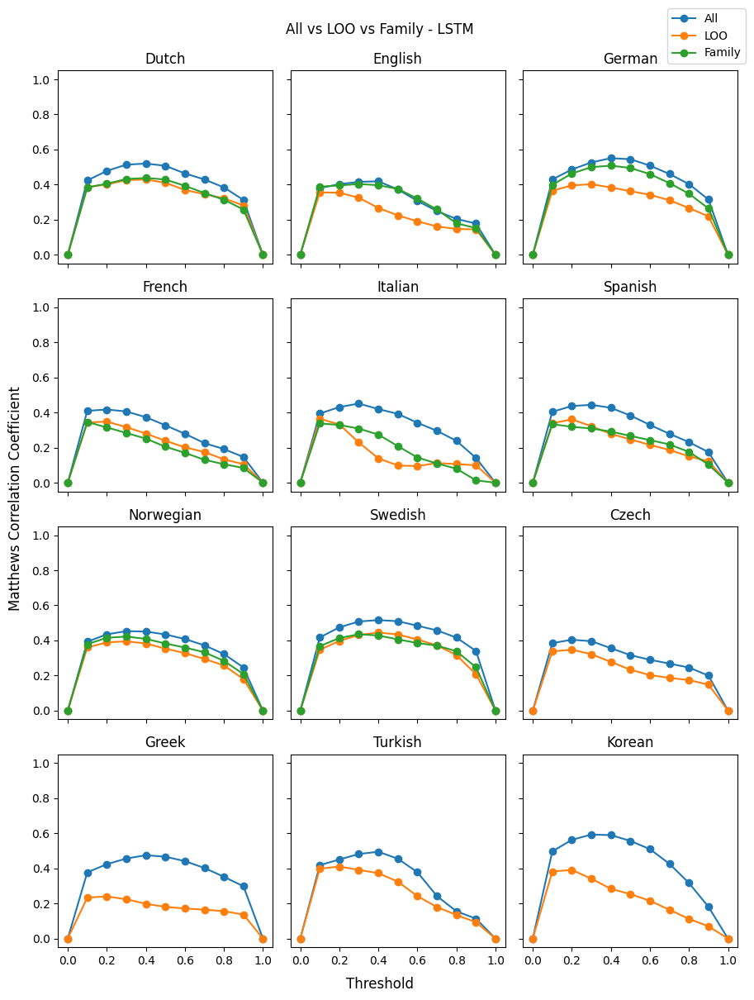

In [ ]:
#@title LSTM Original (MCC)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_nohead.loc[('LSTM', names[k]),'MCC'], label='All', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_nohead.loc[('LSTM', names[k]),'MCC'], label='LOO', marker='o')
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_nohead.loc[(families[i][0], 'LSTM', names[k]), 'MCC'], label='Family', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("All vs LOO vs Family - LSTM")
fig.text(0.5, 0.01, 'Threshold', ha='center', va='center', fontsize=12)
fig.text(0.01, 0.5, 'Matthews Correlation Coefficient', ha='center', va='center', rotation='vertical', fontsize=12)
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1, 1))
plt.tight_layout(rect=(0.015,0.015,1,0.99))
plt.savefig('All vs LOO vs Family - LSTM NoHead.pdf')
plt.show()

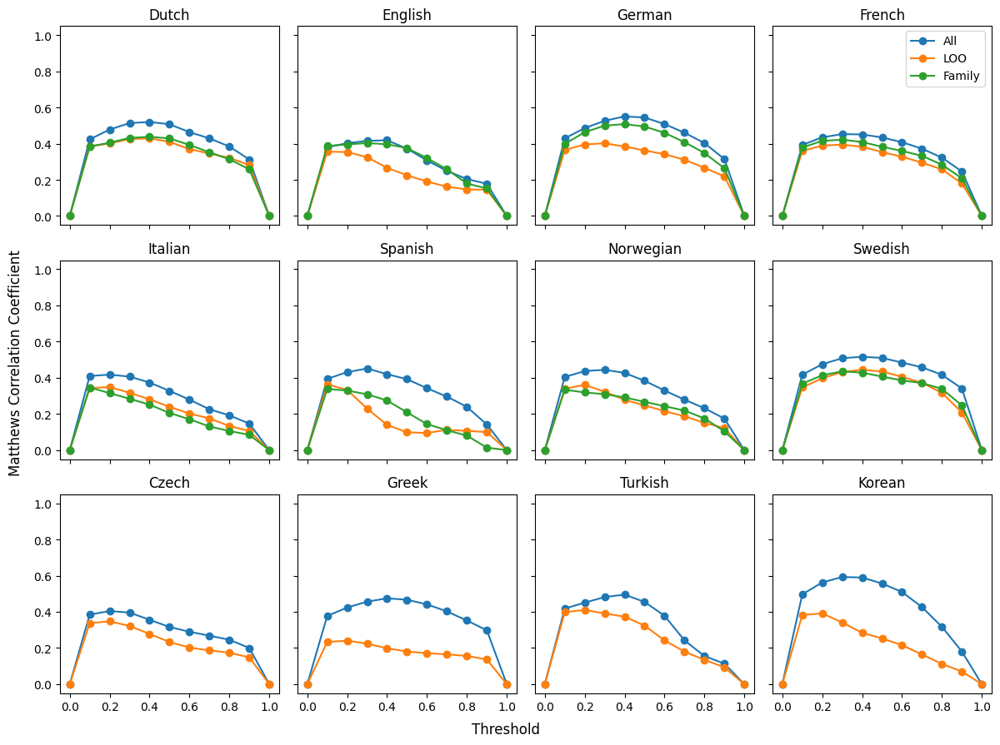

In [ ]:
#@title LSTM Original NoHead (MCC) 3x4

new_names = ['Dutch', 'English', 'German', 'Norwegian',
             'French', 'Italian', 'Spanish', 'Swedish',
             'Czech', 'Greek', 'Turkish', 'Korean']

new_families = [('Germanic','Dutch'),('Germanic','English'),('Germanic','German'),('Nordic','Norwegian'),
                ('Romantic','French'),('Romantic','Italian'),('Romantic','Spanish'),('Nordic','Swedish')]

fig, axs = plt.subplots(nrows=3, ncols=4, sharex=True, sharey=True, figsize=(12,9))

for i in range(3):
  for j in range(4):
    k = i * 4 + j

    axs[i,j].plot(thresholds, lang_metrics_nohead.loc[('LSTM', new_names[k]),'MCC'], label='All', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_nohead.loc[('LSTM', new_names[k]),'MCC'], label='LOO', marker='o')
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_nohead.loc[(new_families[k][0], 'LSTM', new_families[k][1]), 'MCC'], label='Family', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

#fig.suptitle("All vs LOO vs Family - LSTM")
fig.text(0.5, 0.01, 'Threshold', ha='center', va='center', fontsize=12)
fig.text(0.01, 0.5, 'Matthews Correlation Coefficient', ha='center', va='center', rotation='vertical', fontsize=12)
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.985, 0.95))
plt.tight_layout(rect=(0.015,0.015,1,0.99))
plt.savefig('All vs LOO vs Family - LSTM NoHead.pdf')
plt.show()

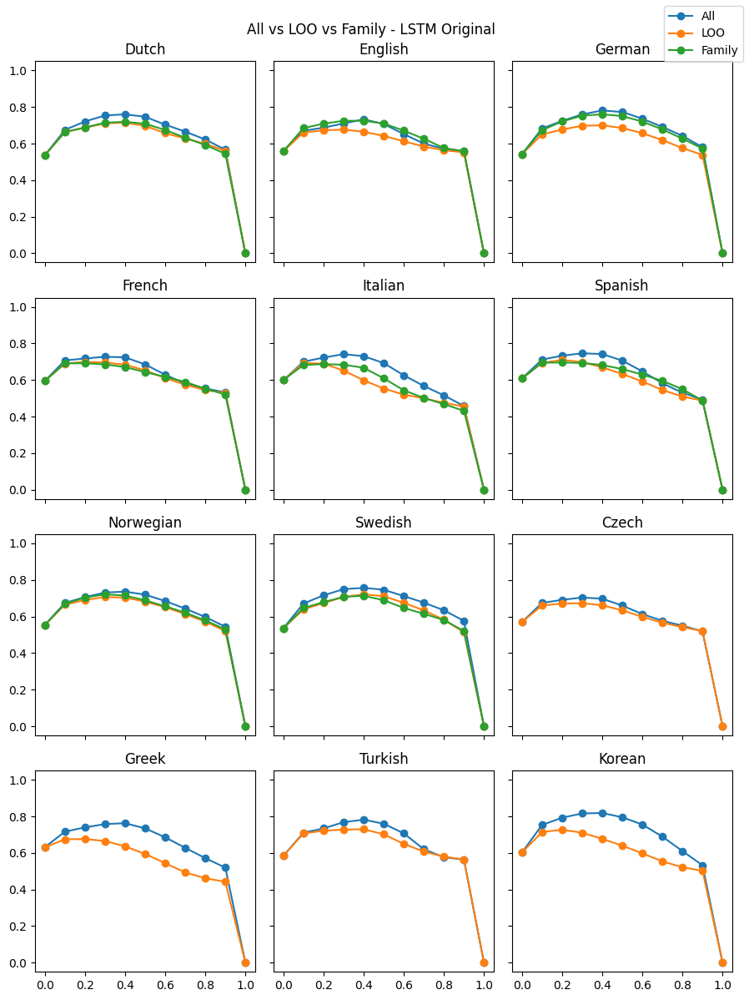

In [ ]:
#@title LSTM Original (F1 Pos)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_original.loc[('LSTM', names[k]),'F1 Pos'], label='All', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_original.loc[('LSTM', names[k]),'F1 Pos'], label='LOO', marker='o')
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_original.loc[(families[i][0], 'LSTM', names[k]), 'F1 Pos'], label='Family', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("All vs LOO vs Family - LSTM Original")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('All vs LOO vs Family - LSTM Original.png')
plt.show()

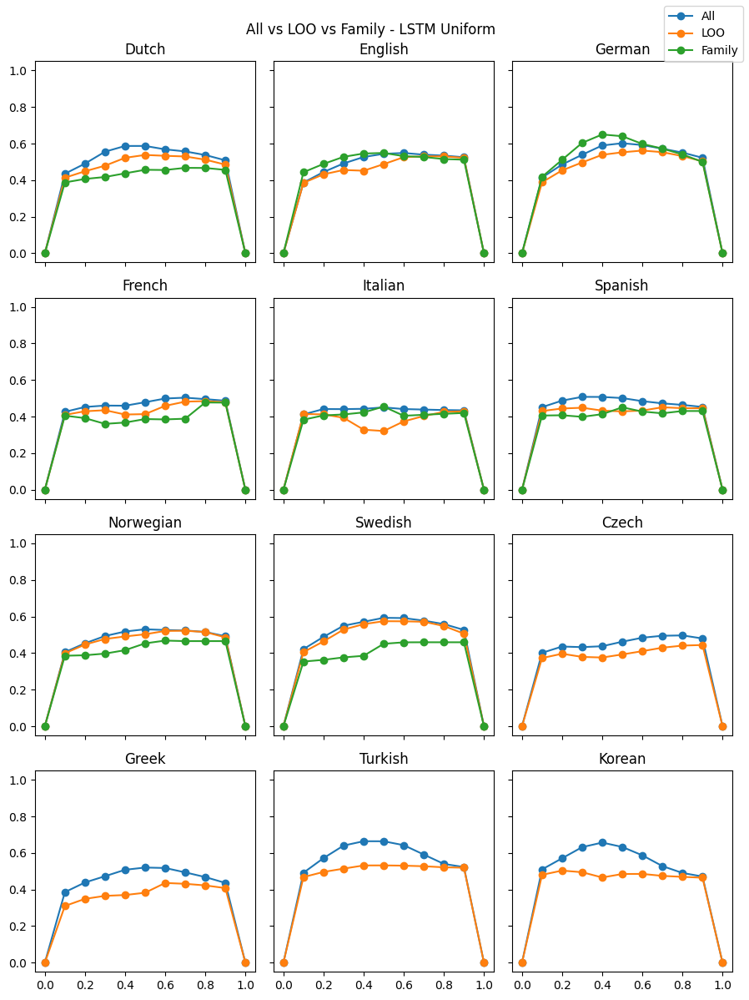

In [ ]:
#@title LSTM Uniform (MCC)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_uniform.loc[('LSTM', names[k]),'MCC'], label='All', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_uniform.loc[('LSTM', names[k]),'MCC'], label='LOO', marker='o')
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_uniform.loc[(families[i][0], 'LSTM', names[k]), 'MCC'], label='Family', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("All vs LOO vs Family - LSTM Uniform")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('All vs LOO vs Family - LSTM Uniform.png')
plt.show()

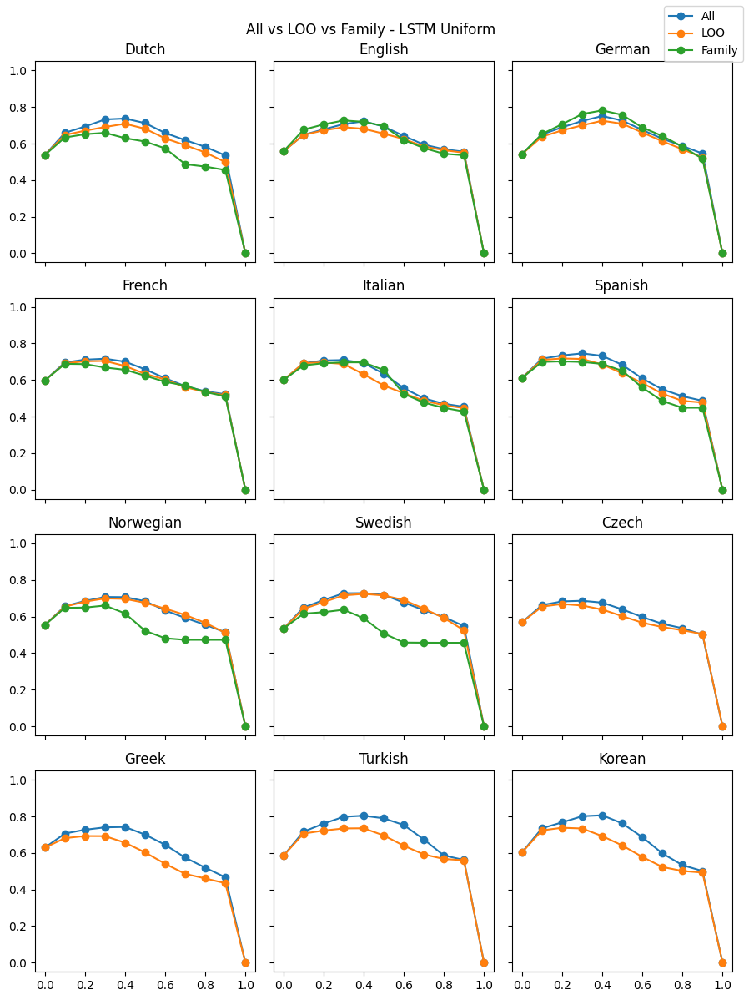

In [ ]:
#@title LSTM Uniform (F1 Pos)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_uniform.loc[('LSTM', names[k]),'F1 Pos'], label='All', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_uniform.loc[('LSTM', names[k]),'F1 Pos'], label='LOO', marker='o')
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_uniform.loc[(families[i][0], 'LSTM', names[k]), 'F1 Pos'], label='Family', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("All vs LOO vs Family - LSTM Uniform")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('All vs LOO vs Family - LSTM Uniform.png')
plt.show()

# Original vs Uniform Size Datasets

I want to compare all models and training regimes on the Original size vs Uniform size datasets. However, I'm not sure if it makes sense to evaluate each on its own Test dataset, or to re-run the models of one on the Test set of the other to make the results more strictly comparable.

For now I am simply showing the results of evaluating model and training regime each on the Test dataset corresponding to the size dataset it was trained on. I may change this in the future.

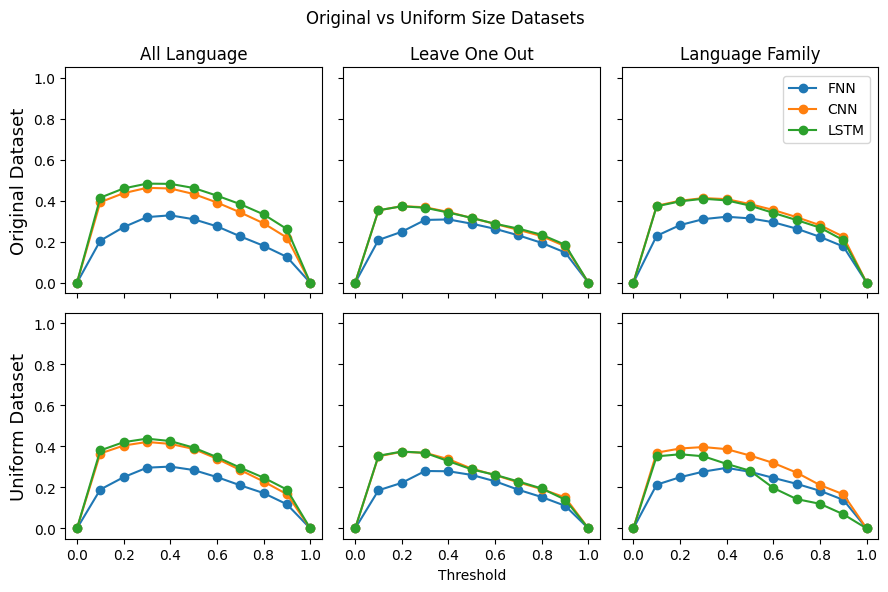

In [ ]:
#@title All Models All Regimes Average MCC

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(9,6), sharex=True, sharey=True)

axs[0,0].plot(thresholds, all_metrics_nohead.loc['FNN']['MCC'], label='FNN', marker='o')
axs[0,0].plot(thresholds, all_metrics_nohead.loc['CNN']['MCC'], label='CNN', marker='o')
axs[0,0].plot(thresholds, all_metrics_nohead.loc['LSTM']['MCC'], label='LSTM', marker='o')

axs[1,0].plot(thresholds, all_metrics_uniform_nohead.loc['FNN']['MCC'], label='FNN', marker='o')
axs[1,0].plot(thresholds, all_metrics_uniform_nohead.loc['CNN']['MCC'], label='CNN', marker='o')
axs[1,0].plot(thresholds, all_metrics_uniform_nohead.loc['LSTM']['MCC'], label='LSTM', marker='o')

axs[0,1].plot(thresholds, loo_average_nohead.loc['FNN']['MCC'], label='FNN', marker='o')
axs[0,1].plot(thresholds, loo_average_nohead.loc['CNN']['MCC'], label='CNN', marker='o')
axs[0,1].plot(thresholds, loo_average_nohead.loc['LSTM']['MCC'], label='LSTM', marker='o')

axs[1,1].plot(thresholds, loo_average_uniform_nohead.loc['FNN']['MCC'], label='FNN', marker='o')
axs[1,1].plot(thresholds, loo_average_uniform_nohead.loc['CNN']['MCC'], label='CNN', marker='o')
axs[1,1].plot(thresholds, loo_average_uniform_nohead.loc['LSTM']['MCC'], label='LSTM', marker='o')

axs[0,2].plot(thresholds, family_average_nohead.loc['FNN']['MCC'], label='FNN', marker='o')
axs[0,2].plot(thresholds, family_average_nohead.loc['CNN']['MCC'], label='CNN', marker='o')
axs[0,2].plot(thresholds, family_average_nohead.loc['LSTM']['MCC'], label='LSTM', marker='o')

axs[1,2].plot(thresholds, family_average_uniform_nohead.loc['FNN']['MCC'], label='FNN', marker='o')
axs[1,2].plot(thresholds, family_average_uniform_nohead.loc['CNN']['MCC'], label='CNN', marker='o')
axs[1,2].plot(thresholds, family_average_uniform_nohead.loc['LSTM']['MCC'], label='LSTM', marker='o')

for i in range(2):
  for j in range(3):
    axs[i,j].set_ylim([-0.05,1.05])

axs[1,1].set_xlabel('Threshold')
axs[0,0].set_ylabel('Original Dataset', fontsize=13)
axs[1,0].set_ylabel('Uniform Dataset', fontsize=13)
axs[0,0].set_title('All Language')
axs[0,1].set_title('Leave One Out')
axs[0,2].set_title('Language Family')
fig.suptitle('Original vs Uniform Size Datasets')

handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.98,0.88))
plt.tight_layout()
plt.savefig('Original vs Uniform Average MCC.pdf')
plt.show()

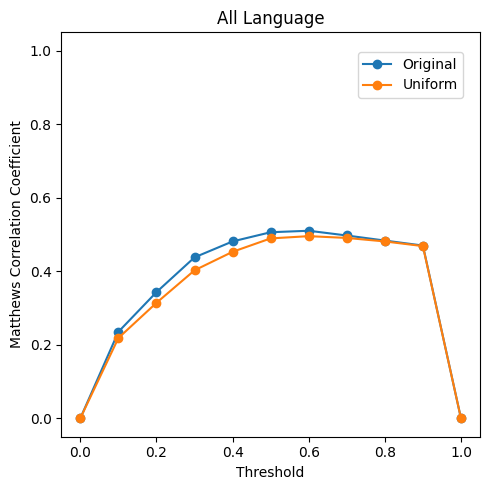

In [ ]:
#@title FNN All Langs Average MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, all_metrics_original.loc['FNN']['MCC'], label='Original', marker='o')
axs.plot(thresholds, all_metrics_uniform.loc['FNN']['MCC'], label='Uniform', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

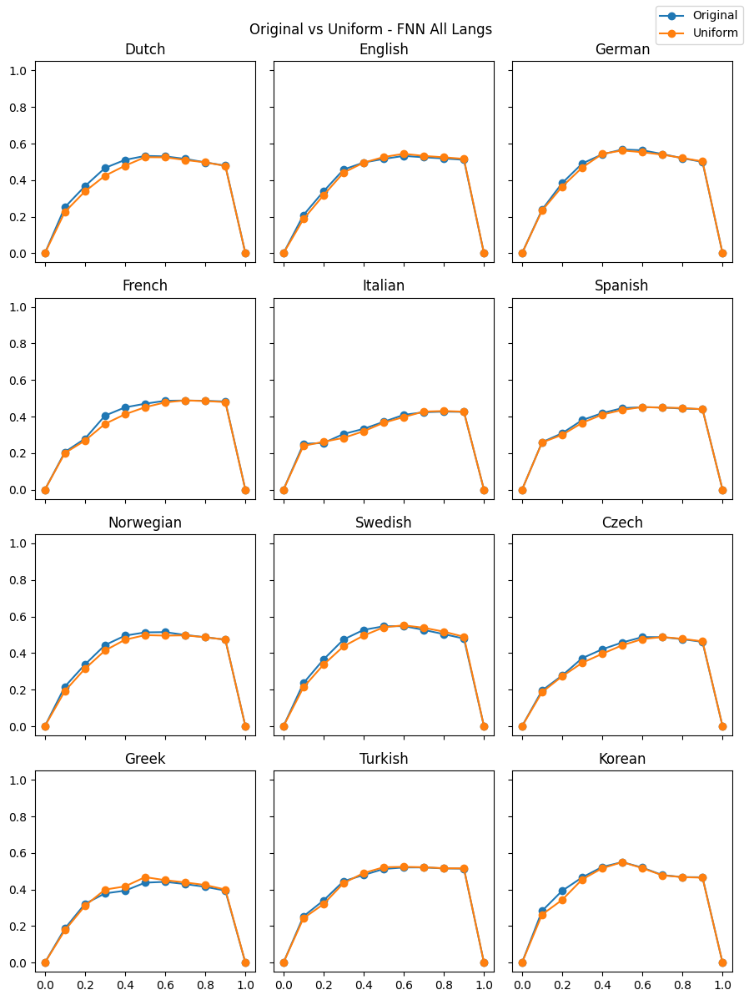

In [ ]:
#@title FNN All Langs (MCC)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_original.loc[('FNN', names[k]),'MCC'], label='Original', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_uniform.loc[('FNN', names[k]),'MCC'], label='Uniform', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Original vs Uniform - FNN All Langs")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Original vs Uniform - FNN All Langs.png')
plt.show()

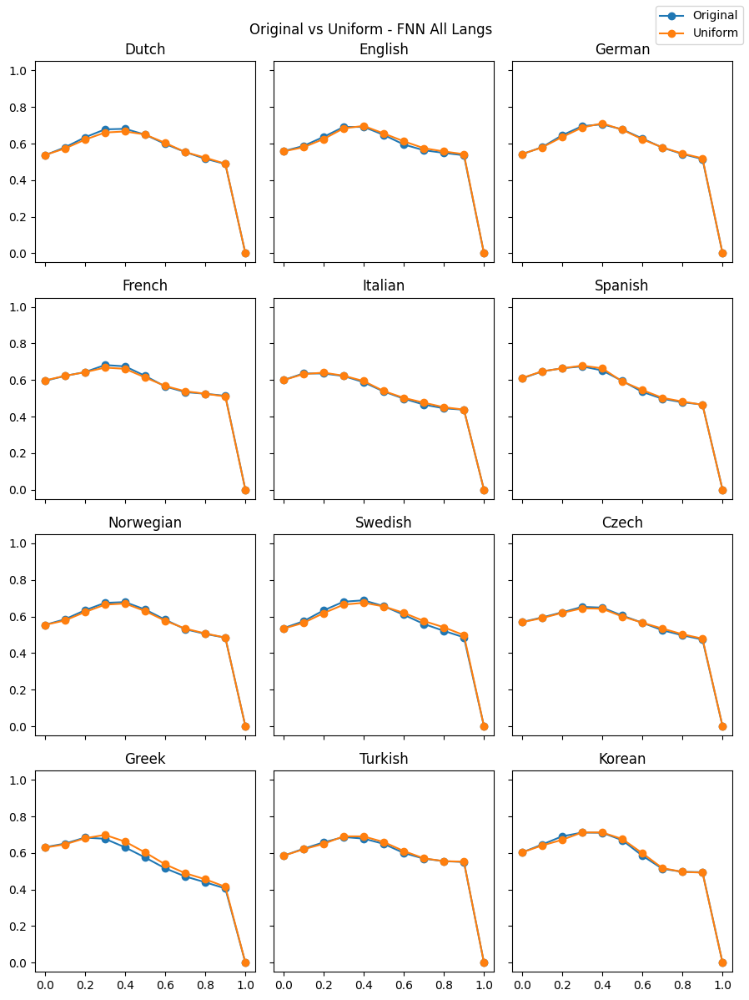

In [ ]:
#@title FNN All Langs (F1 Pos)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_original.loc[('FNN', names[k]),'F1 Pos'], label='Original', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_uniform.loc[('FNN', names[k]),'F1 Pos'], label='Uniform', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Original vs Uniform - FNN All Langs")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Original vs Uniform - FNN All Langs.png')
plt.show()

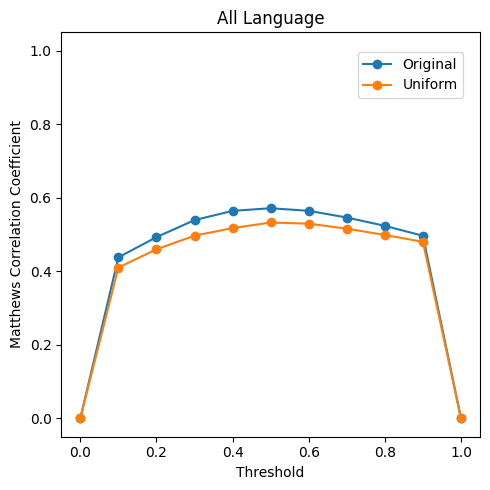

In [ ]:
#@title CNN All Langs Average MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, all_metrics_original.loc['CNN']['MCC'], label='Original', marker='o')
axs.plot(thresholds, all_metrics_uniform.loc['CNN']['MCC'], label='Uniform', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

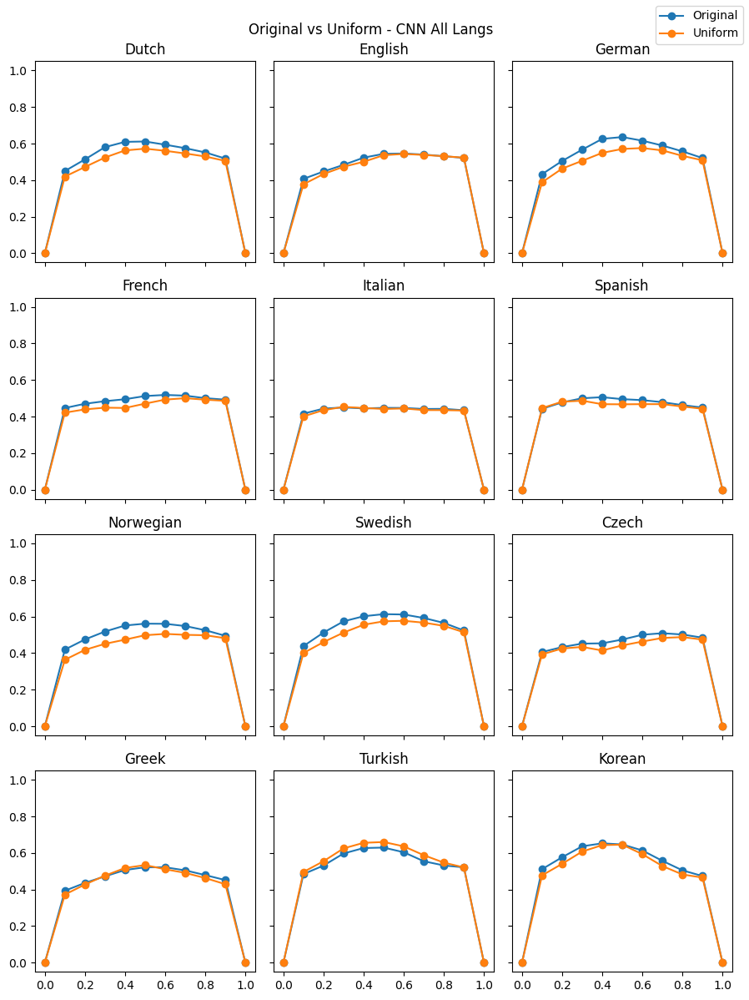

In [ ]:
#@title CNN All Langs (MCC)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_original.loc[('CNN', names[k]),'MCC'], label='Original', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_uniform.loc[('CNN', names[k]),'MCC'], label='Uniform', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Original vs Uniform - CNN All Langs")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Original vs Uniform - CNN All Langs.png')
plt.show()

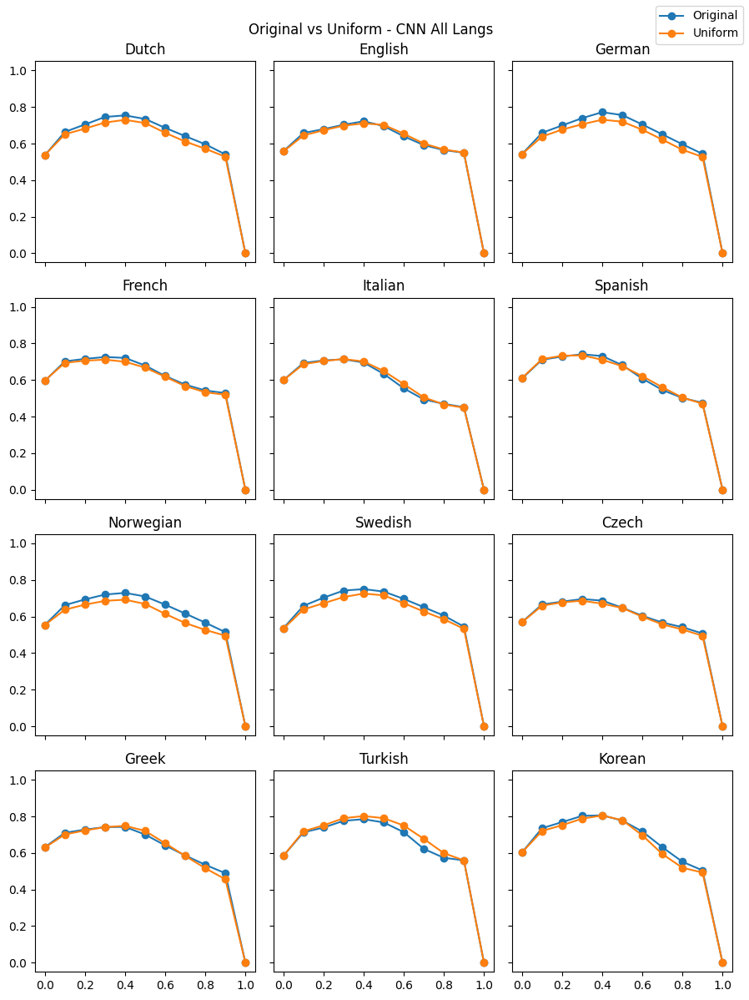

In [ ]:
#@title CNN All Langs (F1 Pos)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_original.loc[('CNN', names[k]),'F1 Pos'], label='Original', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_uniform.loc[('CNN', names[k]),'F1 Pos'], label='Uniform', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Original vs Uniform - CNN All Langs")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Original vs Uniform - CNN All Langs.png')
plt.show()

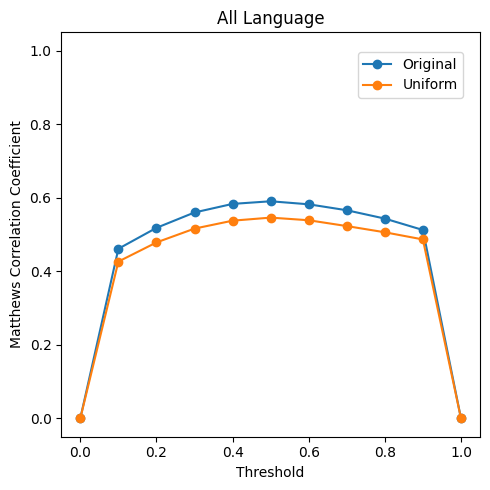

In [ ]:
#@title LSTM All Langs Average MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, all_metrics_original.loc['LSTM']['MCC'], label='Original', marker='o')
axs.plot(thresholds, all_metrics_uniform.loc['LSTM']['MCC'], label='Uniform', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

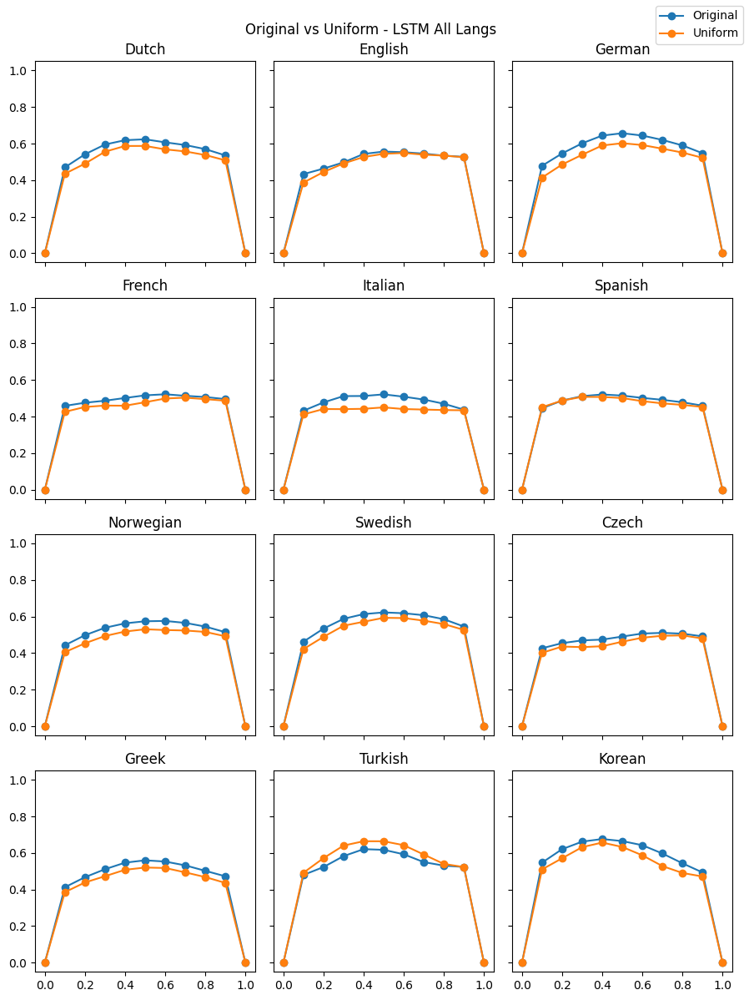

In [ ]:
#@title LSTM All Langs (MCC)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_original.loc[('LSTM', names[k]),'MCC'], label='Original', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_uniform.loc[('LSTM', names[k]),'MCC'], label='Uniform', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Original vs Uniform - LSTM All Langs")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Original vs Uniform - LSTM All Langs.png')
plt.show()

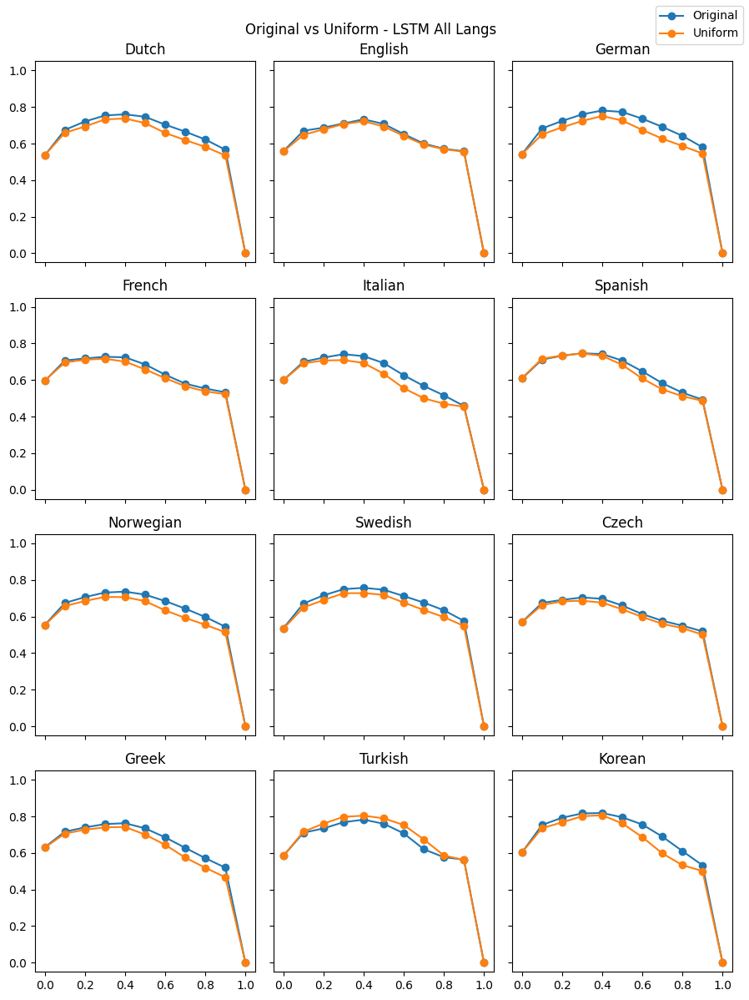

In [ ]:
#@title LSTM All Langs (F1 Pos)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, lang_metrics_original.loc[('LSTM', names[k]),'F1 Pos'], label='Original', marker='o')
    axs[i,j].plot(thresholds, lang_metrics_uniform.loc[('LSTM', names[k]),'F1 Pos'], label='Uniform', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Original vs Uniform - LSTM All Langs")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Original vs Uniform - LSTM All Langs.png')
plt.show()

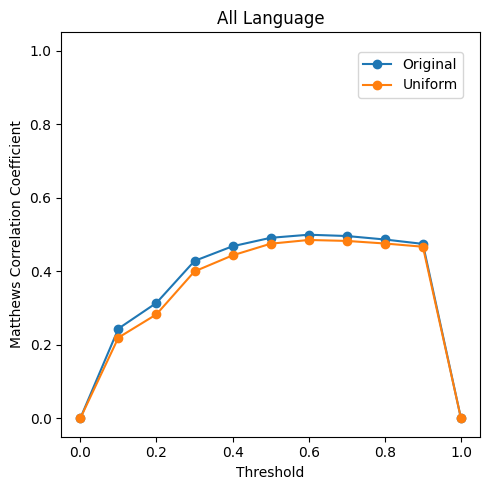

In [ ]:
#@title FNN LOO Average MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, loo_average_original.loc['FNN']['MCC'], label='Original', marker='o')
axs.plot(thresholds, loo_average_uniform.loc['FNN']['MCC'], label='Uniform', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

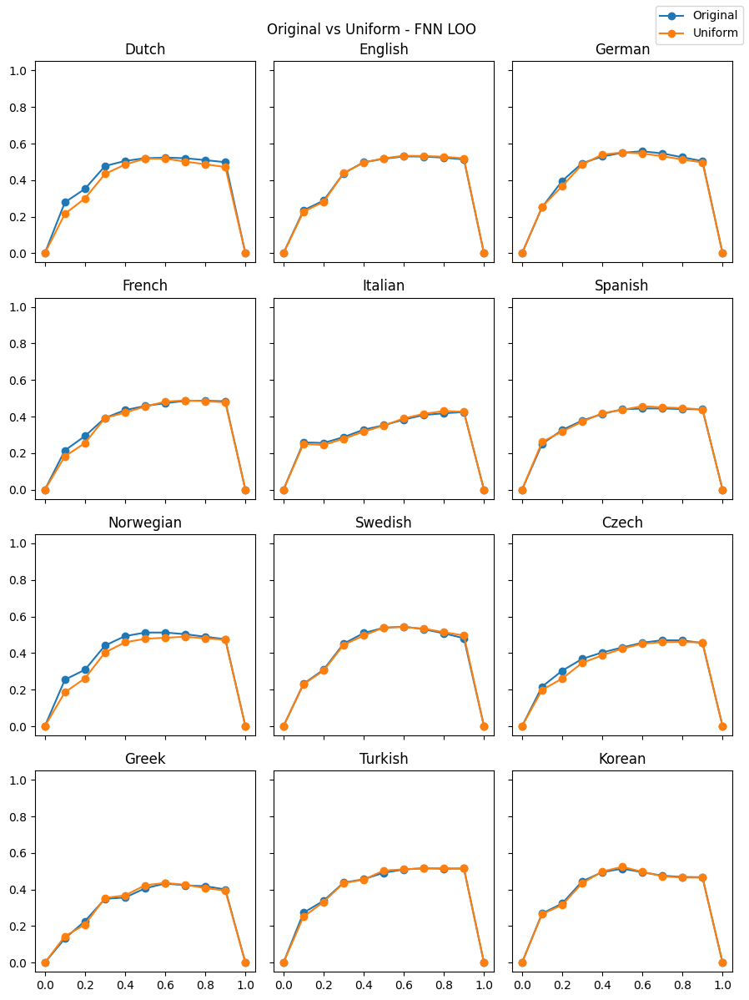

In [ ]:
#@title FNN LOO (MCC)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, loo_metrics_original.loc[('FNN', names[k]),'MCC'], label='Original', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_uniform.loc[('FNN', names[k]),'MCC'], label='Uniform', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Original vs Uniform - FNN LOO")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Original vs Uniform - FNN LOO.png')
plt.show()

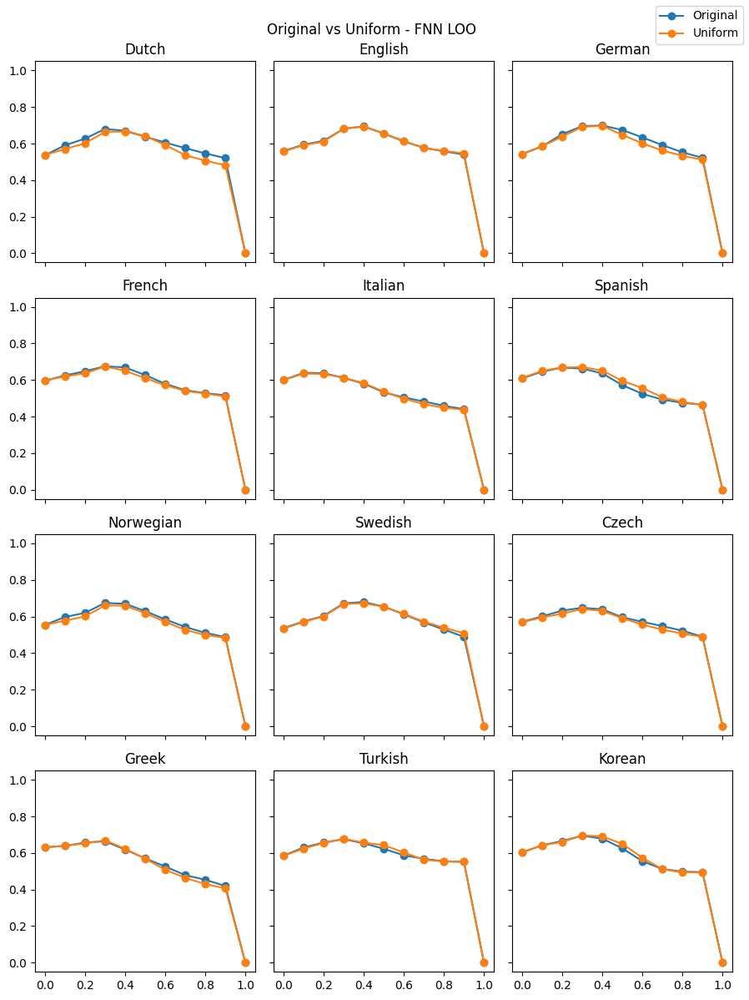

In [ ]:
#@title FNN LOO (F1 Pos)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, loo_metrics_original.loc[('FNN', names[k]),'F1 Pos'], label='Original', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_uniform.loc[('FNN', names[k]),'F1 Pos'], label='Uniform', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Original vs Uniform - FNN LOO")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Original vs Uniform - FNN LOO.png')
plt.show()

The CNN and LSTM average MCC graphs seem weird, because they show the Original dataset consistently having (slightly) higher MCC than the Uniform dataset, but when you calculate MCC for individual languages, the Uniform datasets have (slightly) higher MCC than the Original datasets for most languages.

After checking some values, this seems to be because the CNN and LSTM both perform slightly better on Dutch and Swedish in the Original dataset. And because Dutch and Swedish are more heavily sampled in the Original Test dataset, their effect on the overall MCC is to bring it up (despite lower MCCs on other languages).

So the average MCC graphs aren't really a fair comparison between Original and Uniform -- for that I would need to run both on the Uniform test set and compare them there.

However, it's still unclear why these models would do better on Dutch and Swedish in the Original dataset, but worse on some other languages.

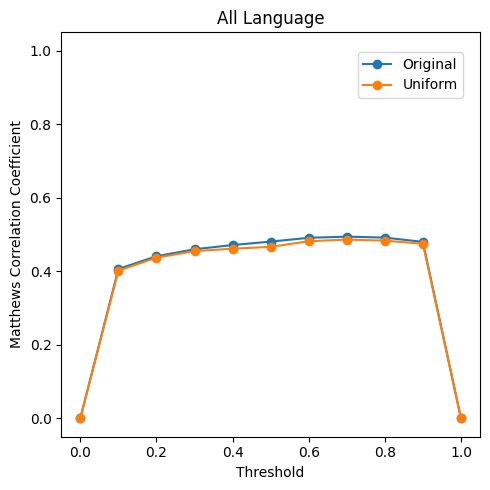

In [ ]:
#@title CNN LOO Average MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, loo_average_original.loc['CNN']['MCC'], label='Original', marker='o')
axs.plot(thresholds, loo_average_uniform.loc['CNN']['MCC'], label='Uniform', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

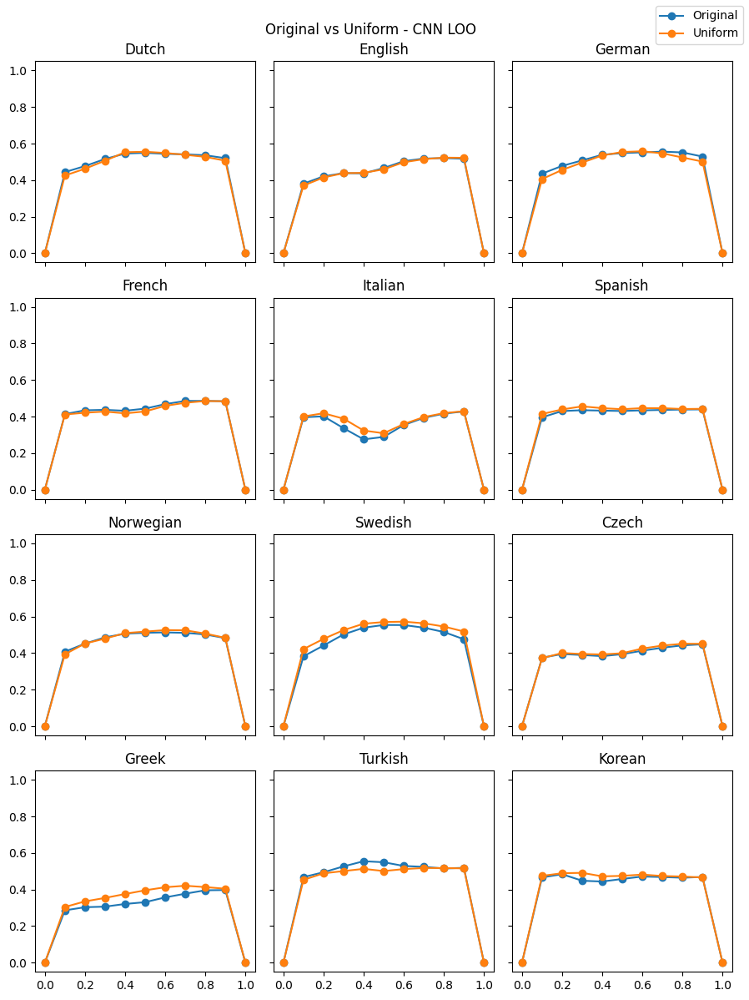

In [ ]:
#@title CNN LOO (MCC)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, loo_metrics_original.loc[('CNN', names[k]),'MCC'], label='Original', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_uniform.loc[('CNN', names[k]),'MCC'], label='Uniform', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Original vs Uniform - CNN LOO")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Original vs Uniform - CNN LOO.png')
plt.show()

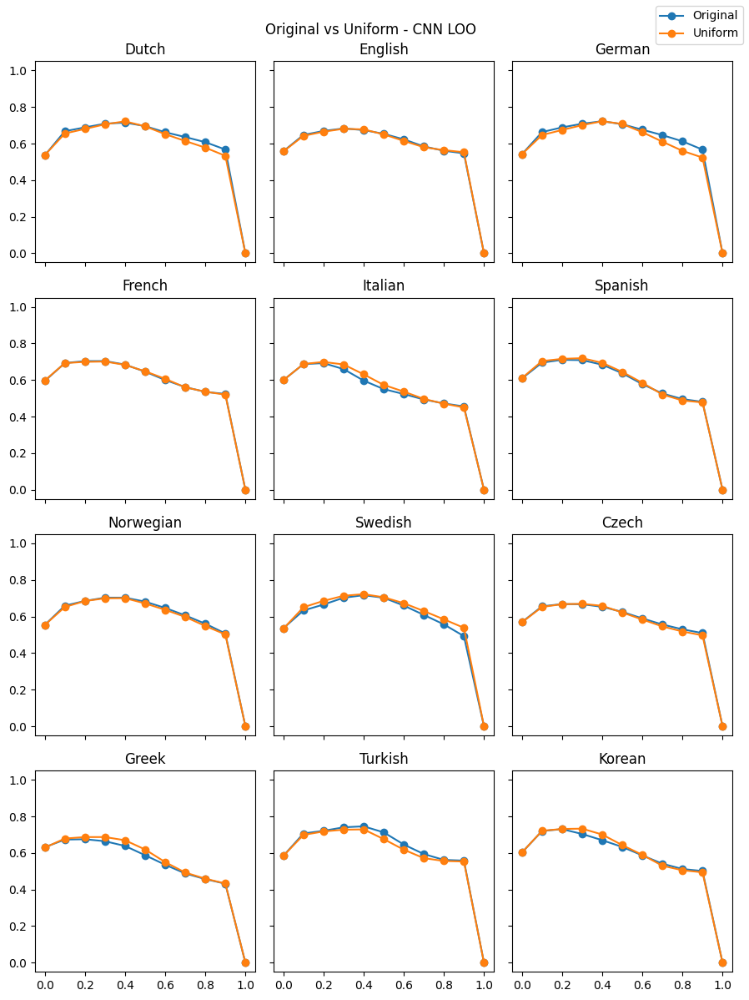

In [ ]:
#@title CNN LOO (F1 Pos)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, loo_metrics_original.loc[('CNN', names[k]),'F1 Pos'], label='Original', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_uniform.loc[('CNN', names[k]),'F1 Pos'], label='Uniform', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Original vs Uniform - CNN LOO")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Original vs Uniform - CNN LOO.png')
plt.show()

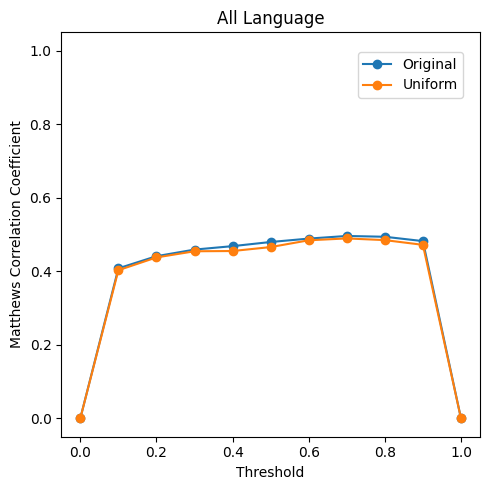

In [ ]:
#@title LSTM LOO Average MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, loo_average_original.loc['LSTM']['MCC'], label='Original', marker='o')
axs.plot(thresholds, loo_average_uniform.loc['LSTM']['MCC'], label='Uniform', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

In [ ]:
dataframes = []
ind_mccs = []
lang_weights = []
for i, lang in enumerate(names):
  pred_df = pd.read_csv(os.path.join(preds_uniform, 'LOO', f'LOO_{lang}_LSTM_Uniform.csv'))
  pred_df = pred_df[pred_df['Languages']==codes[i]]
  truths = pred_df['Ground Truths'].to_list()
  preds = [int(pred) for pred in pred_df['Predictions'] > 0.5]
  ind_mccs.append(matthews_corrcoef(truths, preds))
  dataframes.append(pred_df)
  lang_weights.append(len(truths))
lang_weights = [num/sum(lang_weights) for num in lang_weights]
avg_mcc = sum(mcc * weight for (mcc, weight) in zip(ind_mccs, lang_weights))
pred_df = pd.concat(dataframes, axis=0)
truths = pred_df['Ground Truths'].to_list()
preds = [int(pred) for pred in pred_df['Predictions'] > 0.5]
mcc = matthews_corrcoef(truths, preds)
print('Individual MCCs')
print(ind_mccs)
print()
print('Averaged MCCs')
print(avg_mcc)
print()
print('Overall MCC')
print(mcc)
print()
print(lang_weights)

Individual MCCs
[0.5376662512561207, 0.4874349807323132, 0.5520760392449044, 0.41357544490834824, 0.3212387562368991, 0.42846589930509177, 0.502733282161173, 0.5742077122322803, 0.3924429047967784, 0.3824470809266718, 0.5318855059654894, 0.4848715451861656]

Averaged MCCs
0.4678933309136825

Overall MCC
0.46586933102457023

[0.09630496917937946, 0.07341850614690588, 0.0891697372499053, 0.07166913461207342, 0.08872206343193637, 0.08133200179069527, 0.08727573263542134, 0.09613278694169909, 0.08455525328007163, 0.09231034126519508, 0.06582871310995558, 0.07328076035676159]


In [ ]:
dataframes = []
ind_mccs = []
lang_weights = []
for i, lang in enumerate(names):
  pred_df = pd.read_csv(os.path.join(preds_original, 'LOO', f'LOO_{lang}_LSTM_Original.csv'))
  pred_df = pred_df[pred_df['Languages']==codes[i]]
  truths = pred_df['Ground Truths'].to_list()
  preds = [int(pred) for pred in pred_df['Predictions'] > 0.5]
  ind_mccs.append(matthews_corrcoef(truths, preds))
  dataframes.append(pred_df)
  lang_weights.append(len(truths))
lang_weights = [num/sum(lang_weights) for num in lang_weights]
avg_mcc = sum([mcc * weight for (mcc, weight) in zip(ind_mccs, lang_weights)])
pred_df = pd.concat(dataframes, axis=0)
truths = pred_df['Ground Truths'].to_list()
preds = [int(pred) for pred in pred_df['Predictions'] > 0.5]
mcc = matthews_corrcoef(truths, preds)
print('Individual MCCs')
print(ind_mccs)
print()
print('Averaged MCCs')
print(avg_mcc)
print()
print('Overall MCC')
print(mcc)
print()
print(lang_weights)

Individual MCCs
[0.5514774343580567, 0.4477793888076604, 0.5166866212282313, 0.44136232162435474, 0.29176450108513047, 0.4209915315996929, 0.511777084282981, 0.5605955790870212, 0.40130829258027095, 0.3298086462854709, 0.5312486428943484, 0.46914760023094176]

Averaged MCCs
0.4818025082156767

Overall MCC
0.4796533700513746

[0.20543312014005344, 0.05308720632357862, 0.08239860400309297, 0.052589986406801514, 0.06867873732609119, 0.03927092057526265, 0.10359000342193175, 0.1737830873386635, 0.06947277673691395, 0.05916538895642425, 0.018399027490778746, 0.07413114128040746]


In [ ]:
loo_average_original.loc['LSTM',0.5]['MCC']

0.4796533700513746

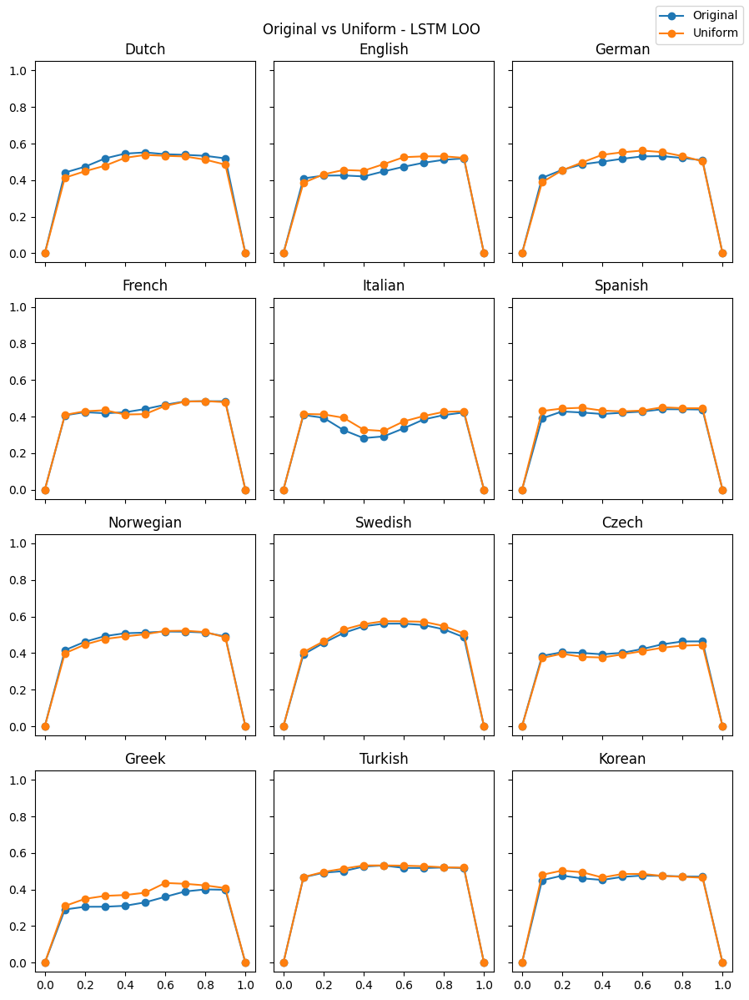

In [ ]:
#@title LSTM LOO (MCC)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, loo_metrics_original.loc[('LSTM', names[k]),'MCC'], label='Original', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_uniform.loc[('LSTM', names[k]),'MCC'], label='Uniform', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Original vs Uniform - LSTM LOO")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Original vs Uniform - LSTM LOO.png')
plt.show()

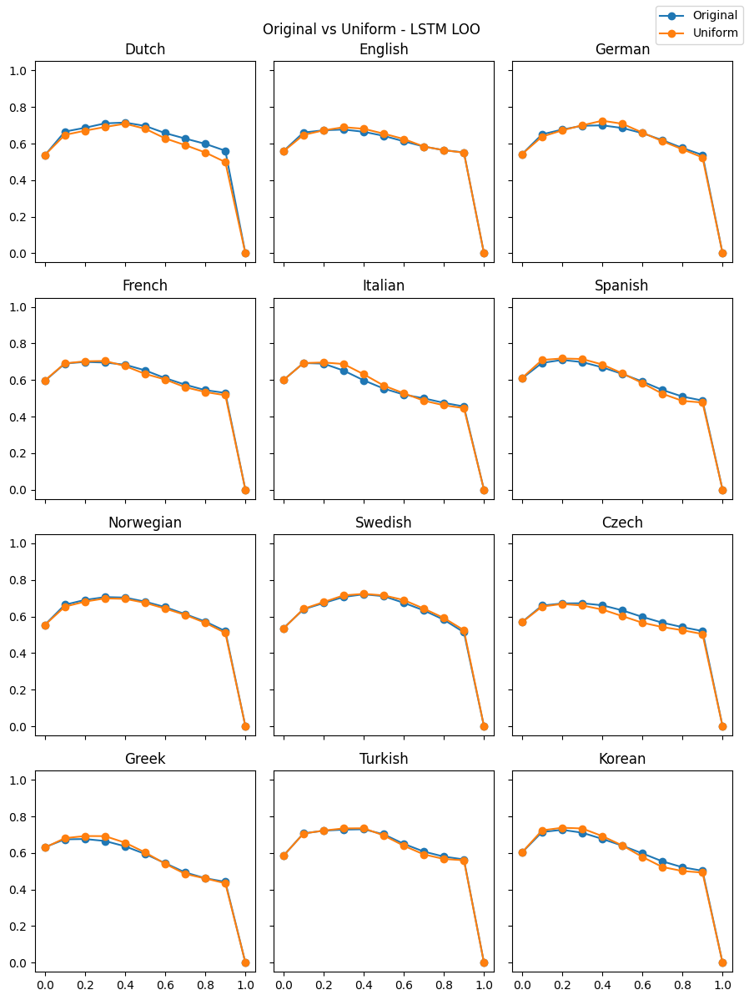

In [ ]:
#@title LSTM LOO (F1 Pos)

fig, axs = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, figsize=(9,12))

for i in range(4):
  for j in range(3):
    k = i * 3 + j

    axs[i,j].plot(thresholds, loo_metrics_original.loc[('LSTM', names[k]),'F1 Pos'], label='Original', marker='o')
    axs[i,j].plot(thresholds, loo_metrics_uniform.loc[('LSTM', names[k]),'F1 Pos'], label='Uniform', marker='o')
    axs[i,j].set_title(names[k])
    axs[i,j].set_ylim([-0.05,1.05])

fig.suptitle("Original vs Uniform - LSTM LOO")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Original vs Uniform - LSTM LOO.png')
plt.show()

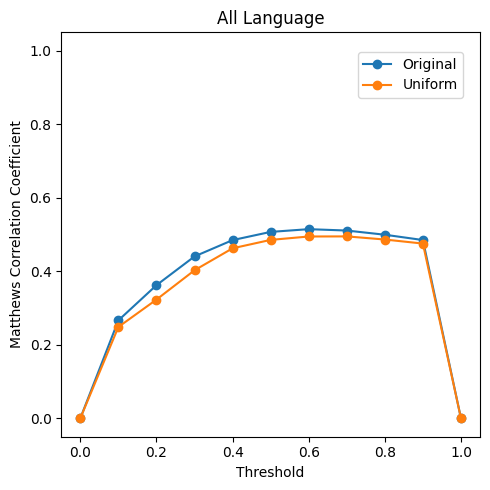

In [ ]:
#@title FNN Family Average MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, family_average_original.loc['FNN']['MCC'], label='Original', marker='o')
axs.plot(thresholds, family_average_uniform.loc['FNN']['MCC'], label='Uniform', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

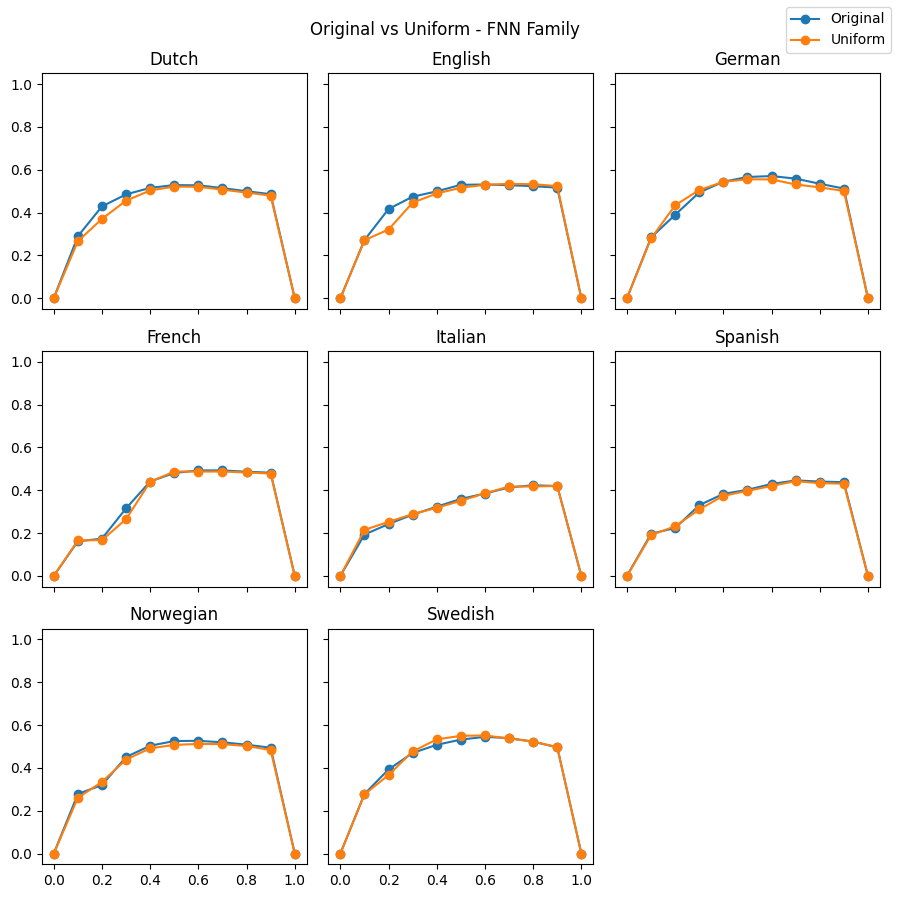

In [ ]:
#@title FNN Family (MCC)

fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(9,9))

for i in range(3):
  for j in range(3):
    k = i * 3 + j
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_original.loc[(families[i][0], 'FNN', names[k]), 'MCC'], label='Original', marker='o')
      axs[i,j].plot(thresholds, family_metrics_uniform.loc[(families[i][0], 'FNN', names[k]), 'MCC'], label='Uniform', marker='o')
      axs[i,j].set_title(names[k])
      axs[i,j].set_ylim([-0.05,1.05])

axs[2,2].set_axis_off()

fig.suptitle("Original vs Uniform - FNN Family")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Original vs Uniform - FNN Family.png')
plt.show()

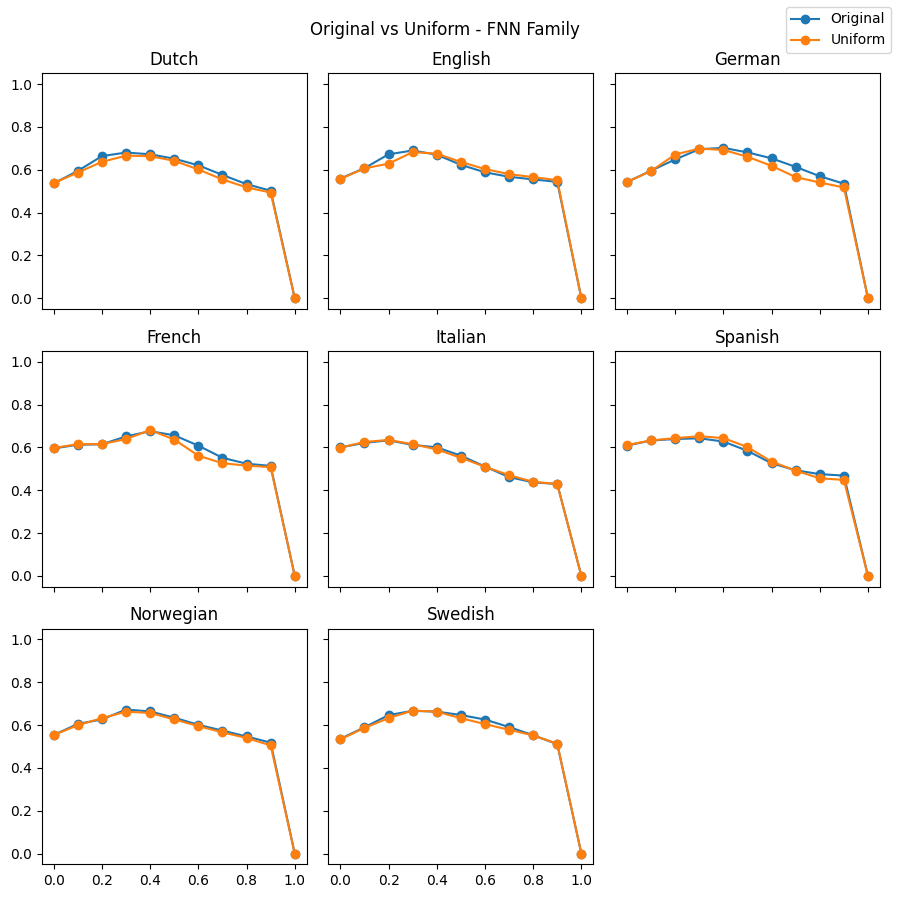

In [ ]:
#@title FNN Family (F1 Pos)

fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(9,9))

for i in range(3):
  for j in range(3):
    k = i * 3 + j
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_original.loc[(families[i][0], 'FNN', names[k]), 'F1 Pos'], label='Original', marker='o')
      axs[i,j].plot(thresholds, family_metrics_uniform.loc[(families[i][0], 'FNN', names[k]), 'F1 Pos'], label='Uniform', marker='o')
      axs[i,j].set_title(names[k])
      axs[i,j].set_ylim([-0.05,1.05])

axs[2,2].set_axis_off()

fig.suptitle("Original vs Uniform - FNN Family")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Original vs Uniform - FNN Family.png')
plt.show()

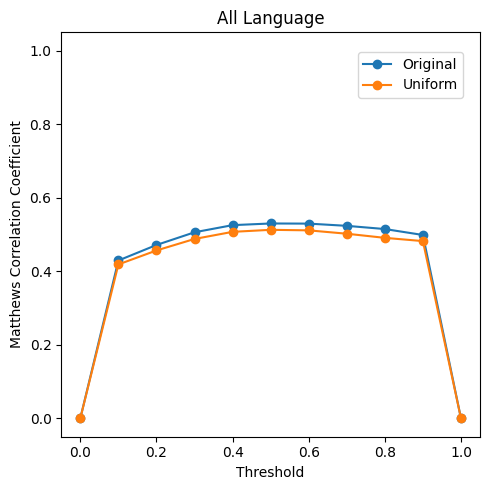

In [ ]:
#@title CNN Family Average MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, family_average_original.loc['CNN']['MCC'], label='Original', marker='o')
axs.plot(thresholds, family_average_uniform.loc['CNN']['MCC'], label='Uniform', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

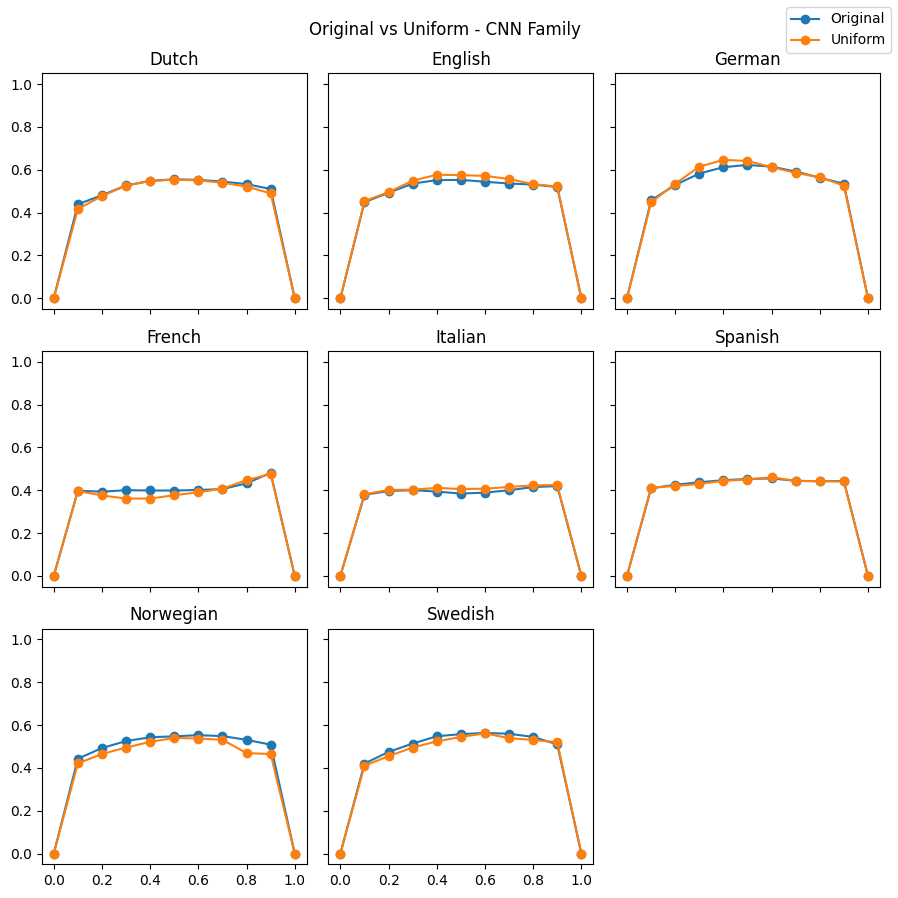

In [ ]:
#@title CNN Family (MCC)

fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(9,9))

for i in range(3):
  for j in range(3):
    k = i * 3 + j
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_original.loc[(families[i][0], 'CNN', names[k]), 'MCC'], label='Original', marker='o')
      axs[i,j].plot(thresholds, family_metrics_uniform.loc[(families[i][0], 'CNN', names[k]), 'MCC'], label='Uniform', marker='o')
      axs[i,j].set_title(names[k])
      axs[i,j].set_ylim([-0.05,1.05])

axs[2,2].set_axis_off()

fig.suptitle("Original vs Uniform - CNN Family")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Original vs Uniform - CNN Family.png')
plt.show()

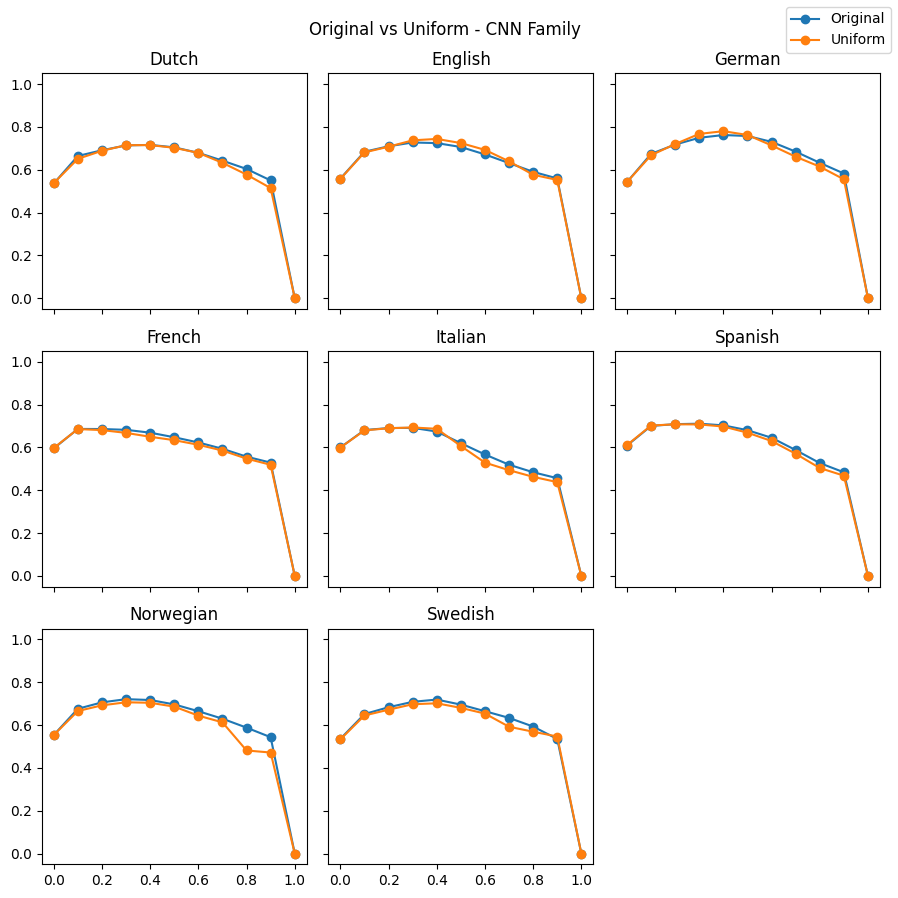

In [ ]:
#@title CNN Family (F1 Pos)

fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(9,9))

for i in range(3):
  for j in range(3):
    k = i * 3 + j
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_original.loc[(families[i][0], 'CNN', names[k]), 'F1 Pos'], label='Original', marker='o')
      axs[i,j].plot(thresholds, family_metrics_uniform.loc[(families[i][0], 'CNN', names[k]), 'F1 Pos'], label='Uniform', marker='o')
      axs[i,j].set_title(names[k])
      axs[i,j].set_ylim([-0.05,1.05])

axs[2,2].set_axis_off()

fig.suptitle("Original vs Uniform - CNN Family")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Original vs Uniform - CNN Family.png')
plt.show()

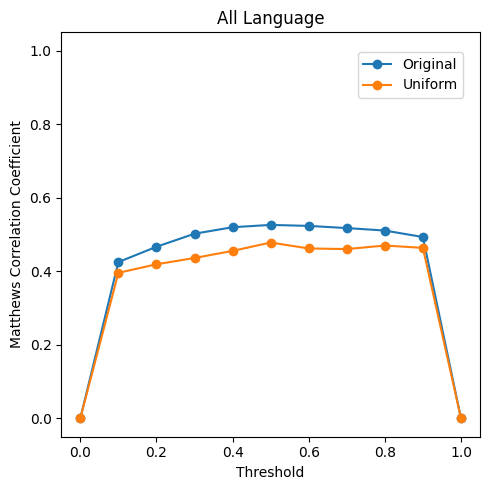

In [ ]:
#@title LSTM Family Average MCC

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

axs.plot(thresholds, family_average_original.loc['LSTM']['MCC'], label='Original', marker='o')
axs.plot(thresholds, family_average_uniform.loc['LSTM']['MCC'], label='Uniform', marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

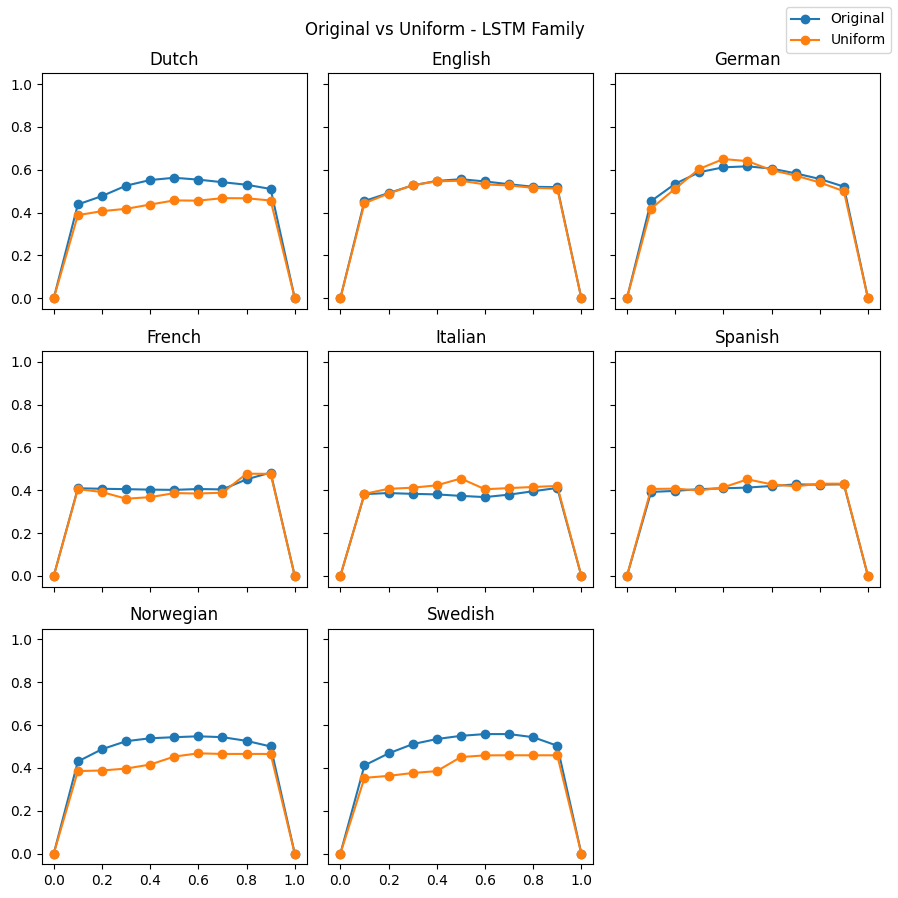

In [ ]:
#@title LSTM Family (MCC)

fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(9,9))

for i in range(3):
  for j in range(3):
    k = i * 3 + j
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_original.loc[(families[i][0], 'LSTM', names[k]), 'MCC'], label='Original', marker='o')
      axs[i,j].plot(thresholds, family_metrics_uniform.loc[(families[i][0], 'LSTM', names[k]), 'MCC'], label='Uniform', marker='o')
      axs[i,j].set_title(names[k])
      axs[i,j].set_ylim([-0.05,1.05])

axs[2,2].set_axis_off()

fig.suptitle("Original vs Uniform - LSTM Family")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Original vs Uniform - LSTM Family.png')
plt.show()

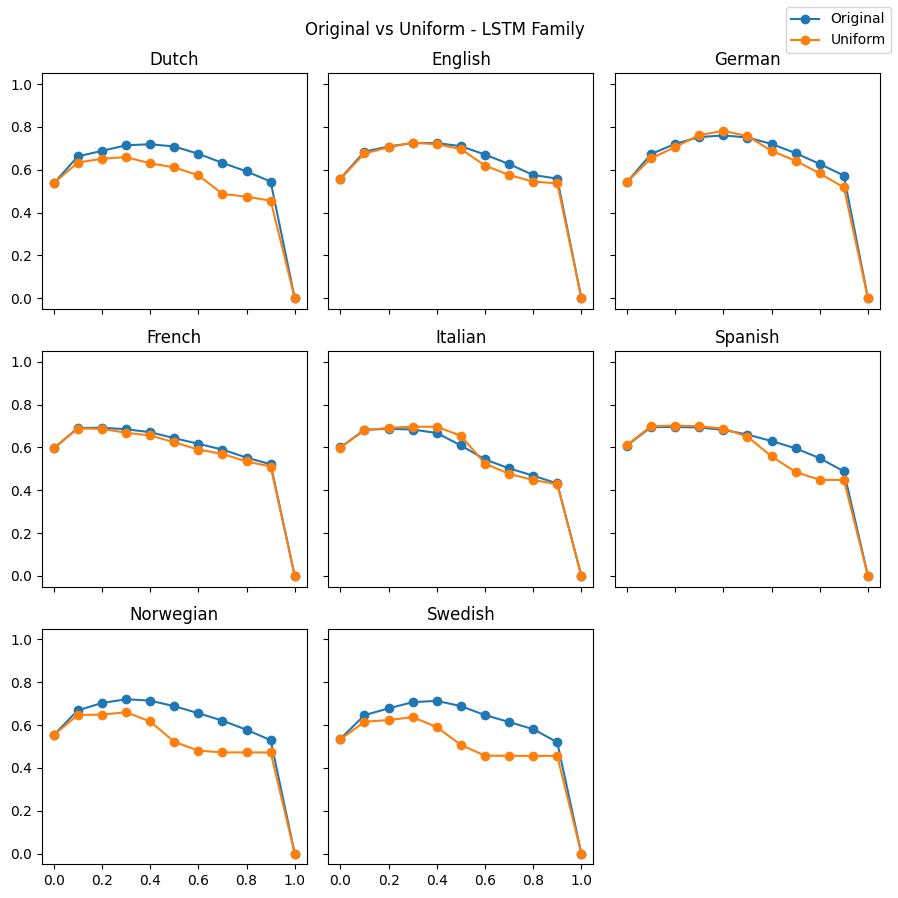

In [ ]:
#@title LSTM Family (F1 Pos)

fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(9,9))

for i in range(3):
  for j in range(3):
    k = i * 3 + j
    if k < 8:
      axs[i,j].plot(thresholds, family_metrics_original.loc[(families[i][0], 'LSTM', names[k]), 'F1 Pos'], label='Original', marker='o')
      axs[i,j].plot(thresholds, family_metrics_uniform.loc[(families[i][0], 'LSTM', names[k]), 'F1 Pos'], label='Uniform', marker='o')
      axs[i,j].set_title(names[k])
      axs[i,j].set_ylim([-0.05,1.05])

axs[2,2].set_axis_off()

fig.suptitle("Original vs Uniform - LSTM Family")
handles, labels = axs[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig('Original vs Uniform - LSTM Family.png')
plt.show()

# Language Differences

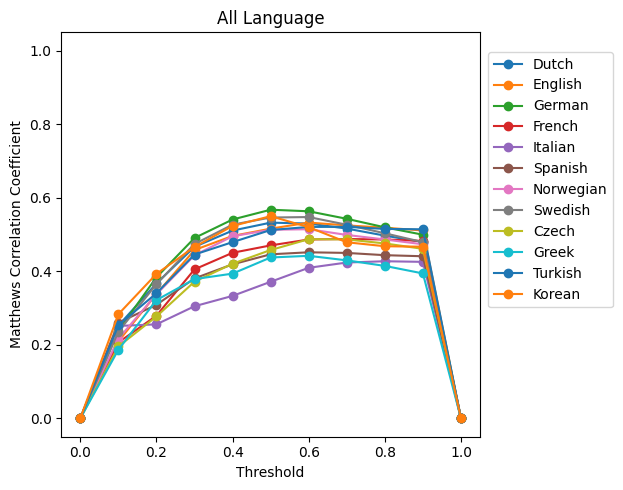

In [ ]:
#@title FNN All Langs

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

for lang in names:
  axs.plot(thresholds, lang_metrics_original.loc[('FNN',lang),'MCC'], label=lang, marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.25,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

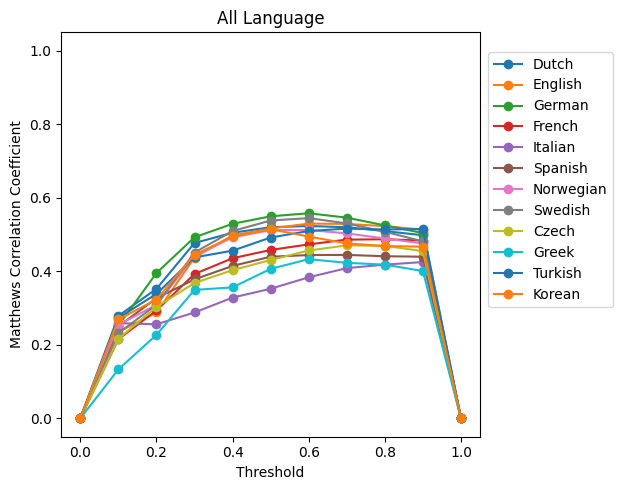

In [ ]:
#@title FNN LOO

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

for lang in names:
  axs.plot(thresholds, loo_metrics_original.loc[('FNN',lang),'MCC'], label=lang, marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.25,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

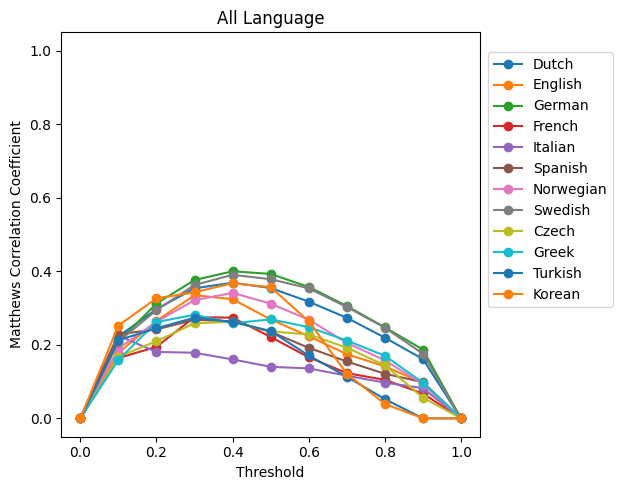

In [ ]:
#@title FNN All Langs NoHead

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

for lang in names:
  axs.plot(thresholds, lang_metrics_nohead.loc[('FNN',lang),'MCC'], label=lang, marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.25,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

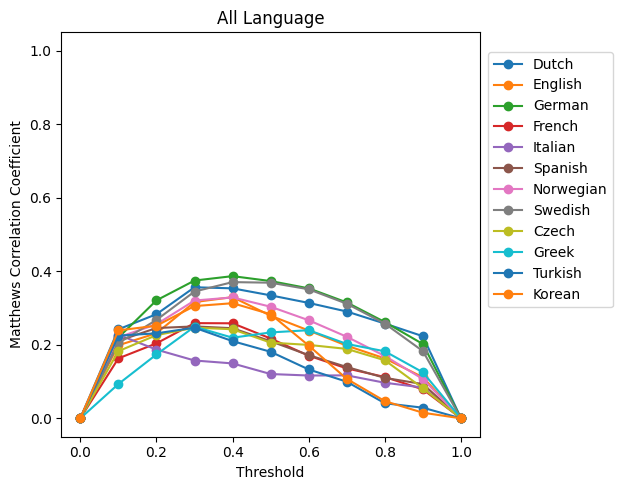

In [ ]:
#@title FNN LOO NoHead

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

for lang in names:
  axs.plot(thresholds, loo_metrics_nohead.loc[('FNN',lang),'MCC'], label=lang, marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.25,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

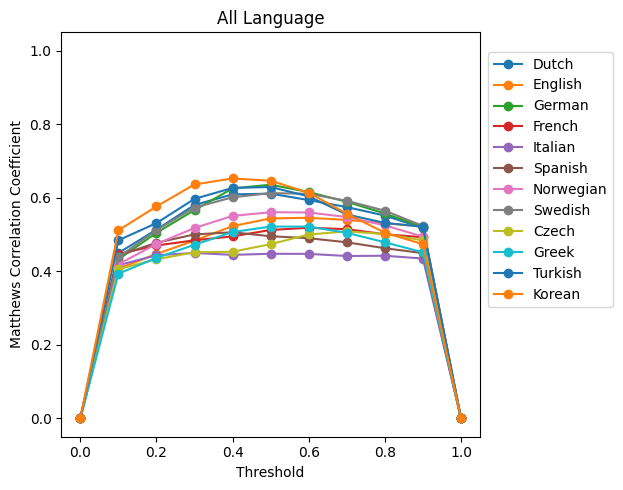

In [ ]:
#@title CNN All Langs

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

for lang in names:
  axs.plot(thresholds, lang_metrics_original.loc[('CNN',lang),'MCC'], label=lang, marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.25,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

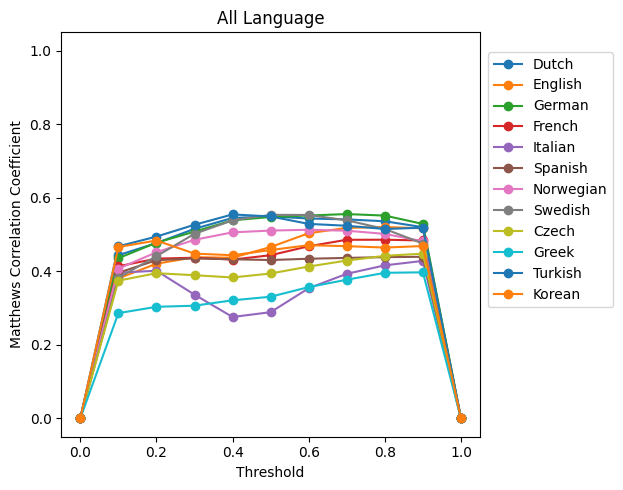

In [ ]:
#@title CNN LOO

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

for lang in names:
  axs.plot(thresholds, loo_metrics_original.loc[('CNN',lang),'MCC'], label=lang, marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.25,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

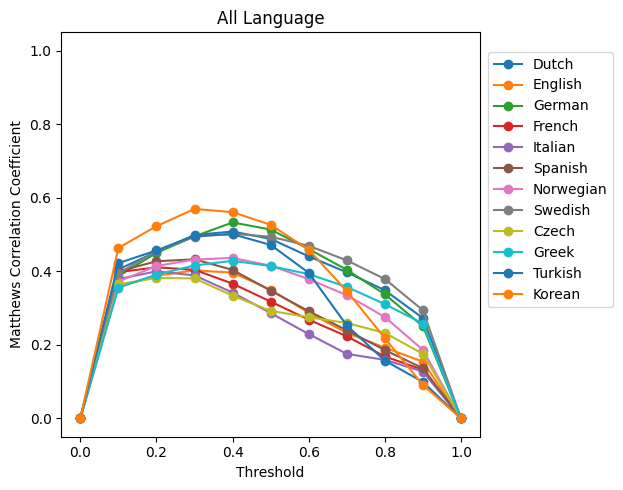

In [ ]:
#@title CNN All Langs NoHead

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

for lang in names:
  axs.plot(thresholds, lang_metrics_nohead.loc[('CNN',lang),'MCC'], label=lang, marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.25,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

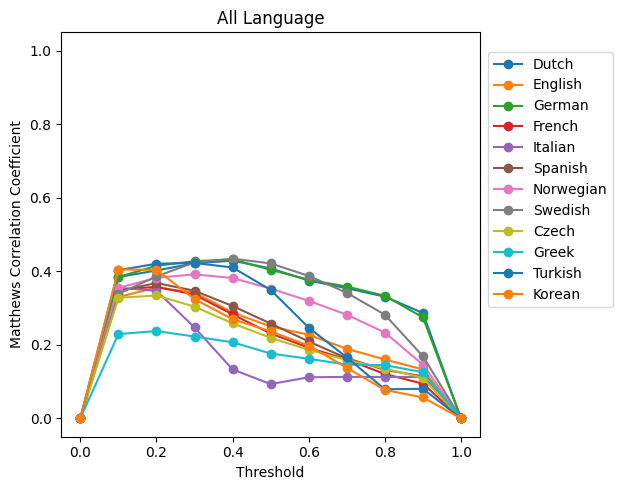

In [ ]:
#@title CNN LOO NoHead

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

for lang in names:
  axs.plot(thresholds, loo_metrics_nohead.loc[('CNN',lang),'MCC'], label=lang, marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.25,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

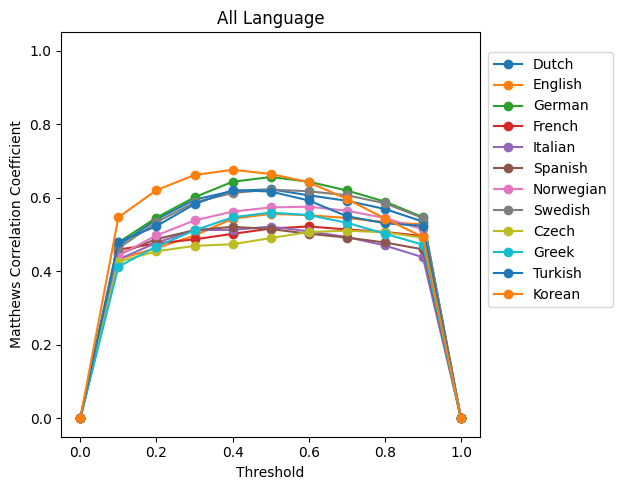

In [ ]:
#@title LSTM All Langs

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

for lang in names:
  axs.plot(thresholds, lang_metrics_original.loc[('LSTM',lang),'MCC'], label=lang, marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.25,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

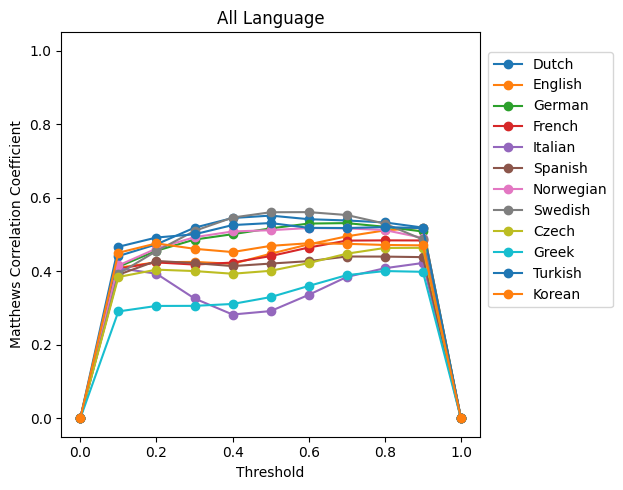

In [ ]:
#@title LSTM LOO

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

for lang in names:
  axs.plot(thresholds, loo_metrics_original.loc[('LSTM',lang),'MCC'], label=lang, marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.25,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

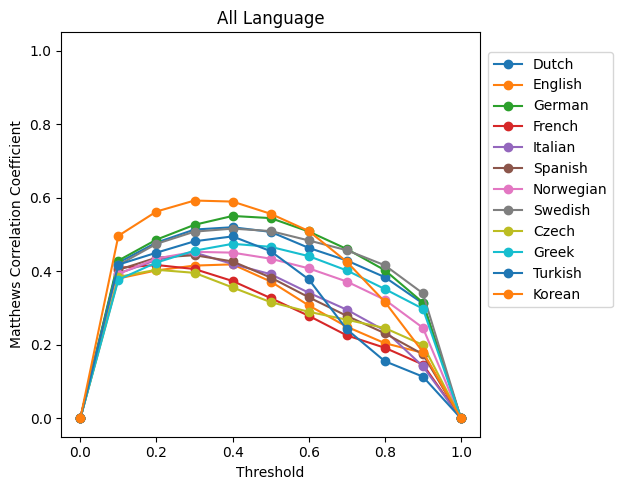

In [ ]:
#@title LSTM All Langs NoHead

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

for lang in names:
  axs.plot(thresholds, lang_metrics_nohead.loc[('LSTM',lang),'MCC'], label=lang, marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.25,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

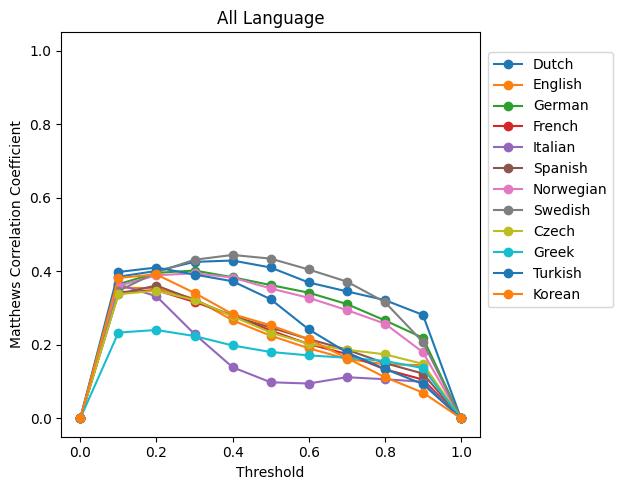

In [ ]:
#@title LSTM LOO NoHead

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5,5))

for lang in names:
  axs.plot(thresholds, loo_metrics_nohead.loc[('LSTM',lang),'MCC'], label=lang, marker='o')
axs.set_xlabel('Threshold')
axs.set_ylabel('Matthews Correlation Coefficient')
axs.set_title('All Language')
axs.set_ylim([-0.05,1.05])

handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.25,0.9))
plt.tight_layout()
#plt.savefig('All Average MCC.pdf')
plt.show()

# Differences between models trained on CPU vs GPU

As noted in the "Revised Language Metrics" notebook, CNN models trained on CPU vs GPU can have rather drastic differences, and possibly even CNN models trained on GPUs at different times. (FNNs show a much smaller difference when trained on CPU vs GPU.) This is likely because training a CNN (and possibly LSTM) on GPU does not allow for certain deterministic algorithms in PyTorch. However, as training models on GPUs is much faster and widely practiced in the field, I decided to train all models evaluated here on GPU. This at least eliminates any possible CPU vs GPU difference between models, though it leaves open the possibility of non-reproducible results when retraining the models due to the non-deterministic algorithms of training on GPU.